# Exotic Models Paper Auxiliary Notebook I
#### David W. Barker
## Purpose
You can only upload 100 MB files to git hub, so we need to separate these notebooks when they get that big.

# WARNING: ARES not fully emcee version >= 3 compatible!
#          emcee 2.2.1 is a safe bet for now.


/home/dbarker7752/perses/perses/foregrounds/HaslamGalaxy.py:83: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  self._haslam_map_408 = hp.read_map(file_name, verbose=False)


Prepared Haslam map in 0.162 s.


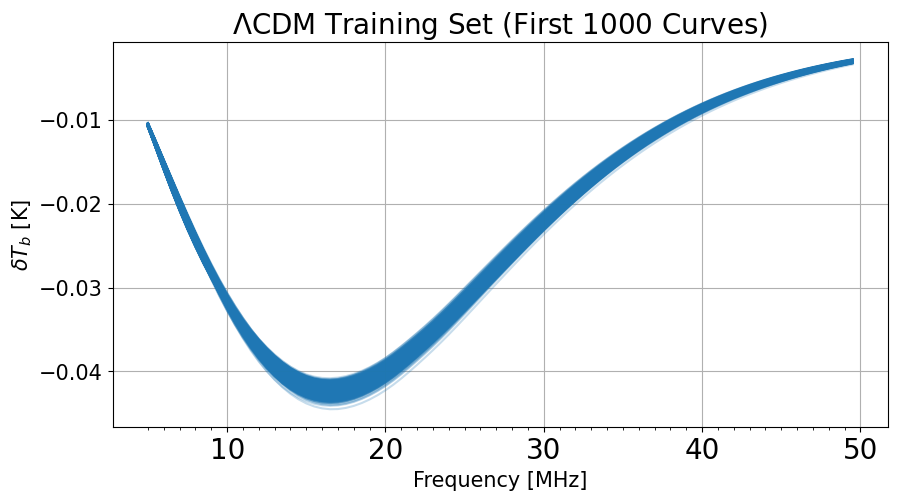

In [1]:
### Boilerplate ###
## Boiler Plate that is required to run to make any cell below this work ##
import h5py
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append("/home/dbarker7752/py21cmsig")
import py21cmsig
from pylinex import BasisSum, MetaFitter, AttributeQuantity, TrainedBasis, RepeatExpander, NullExpander, Forecaster, CompiledQuantity, \
    NLFitter,Sampler, LoadableModel
from tqdm import tqdm
import healpy as hp
from scipy import stats
from scipy.optimize import fsolve
from importlib import reload
import scipy
import perses
import copy
import os
import lmfit
from astropy.io import fits
from lmfit import Minimizer, Parameters, create_params, report_fit
import lochness
import perses.models
import camb
from pygdsm import GlobalSkyModel16
from pygdsm import GlobalSkyModel
from pylinex import TrainedBasis, SumModel,\
	BasisModel, SingleConditionalFitModel, ExpandedModel,\
	RepeatExpander, ConditionalFitGaussianLoglikelihood, \
	SlicedModel, GaussianLoglikelihood, LeastSquareFitter, Sampler,\
	BurnRule, NLFitter, TrainingSetCreator, ProjectedModel, Forecaster
from distpy import Expression, UniformConditionDistribution,\
	WindowedDistribution, DistributionList, DistributionSet,\
	UniformDistribution, GaussianDistribution, UniformConditionDistribution,\
    JumpingDistribution, JumpingDistributionSet, GaussianJumpingDistribution
import camb
from scipy.integrate import solve_ivp

# universal variables
frequencies = np.arange(5,50,0.5)

# Some basic constants
kb = 1.3807e-16    # Boltzman's constant [ergs per Kelvin]
kb_ev = 8.617e-5   # Boltzman's constant [electron volts per Kelvin]
h_pl = 6.6260755e-27 # Planck's constant [erg seconds]
c = 3e10        # speed of light [cm/s]
# Parameters  (Taking the Lambda CDM ones from Planck collaboration 2020 pg.19 (without BAO because of no real reason))
H0 = 67.49 # Hubble constant 
h = H0/100     # H0
omM0h2 = 0.1430
omB0h2 = 0.02237
omC0h2 = 0.1200  # Omega cold dark matter today 
omM0 = 0.1430/h**2   # Omega matter today
omB0 = 0.02237/h**2   # Omega baryons today 
omK0 = 0        # Omega curvature today
# omC0 = 0.1200/h**2   # Omega cold dark matter today 
omC0 = omM0-omB0
#omR0 = 8.98e-5  # Omega radiation today
omR0=8.600000001024455e-05  # Omega radiation from 21cm FAST
omL0 = 0.6847   # Omega Dark Energy today
f_He = 0.08    # Fraction of Helium by number
y_P = 0.2454  # Fraction of helium by mass (from Planck VI 2018) 
p_crit = 1.88e-29*h**2  # [g/cm^3] The critical density of the universe
p_crit_ergs = p_crit*8.99e20  #[ergs/cm^3]
m_p = 1.6727e-24   #[g]  mass of a proton
m_pMev = 938.28   # [MeV/c^2] mass of a proton
m_e = 9.1094e-28   #[g]  mass of an electron
m_eMev = 0.511      # [Mev/c^2] mass of an electron
m_He = 6.644e-24   # [g] mass of helium
fsc = 1/137        # dimensionless fine structure constant
z_array = np.arange(20,1100)
#n_b0 = 2.06e-7   #[baryons per cubic centimeter] Old version from Joshua's comps paper that isn't a function of Omega baryons
n_b0 = (1-y_P)*omB0*p_crit/m_p+y_P*omB0*p_crit/m_He  # number density of baryons (by definition doesn't include electrons)
T_gamma0 = 2.725   # [Kelvin] modern CMB temperature
T_star = 0.068    # [Kelvin] the temperature equivalent of the energy difference of the 21 cm hyperfine spin states
A_10 = 2.85e-15    # [inverse seconds] Einstein coefficient for the spontaneous emission of the hyperfine spin states
# Less neccesary (or at least less understood by me but needed by some code)
As = 2.099e-9  # Amplitude of a power spectrum of adiabatic perturbations
ns = 0.9649    # Spectra index of a power spectrum of adiabatic perturbations

# sigma for cosmological parameters derived from Planck
omM0sigma = 0.0011/h**2
omL0sigma = 0.0062
omB0sigma = 0.00014/h**2

### Common equations:
H = lambda z,omR0,omM0,omK0,omL0,H0: (H0*3.24078e-20)*(1+z)*np.sqrt(omR0*(1+z)**2+omM0*(1+z)+omK0+(omL0/((1+z)**2)))  # Standard Lambda CDM hubble flow in inverse seconds
T_gamma = lambda z: T_gamma0*(1+z)
#dTb = lambda z,x_e,T_k,omB0h2,omM0h2: 27*(1-x_e(z))*((omB0h2)/(0.023))*(((0.15)/(omM0h2))*((1+z)/(10)))**(1/2)*(1-((T_gamma0*(1+z))/(T_S(z,x_e,T_k))))
dTb = lambda z,x_e,T_k,omB0,omM0: 27*(1-x_e(z))*((h**2*omB0)/(0.023))*(((0.15)/(h**2*omM0))*((1+z)/(10)))**(1/2)*(1-((T_gamma0*(1+z))/(T_S(z,x_e,T_k))))
# Synchrotron Equation
synch = lambda f,A,B,c : A*(f/408)**(B+c*np.log(f/408))  # taken from page 6 of Hibbard et al. 2023 Apj. Arbitrarily chose 25 as my v0

k_HH_raw = np.array([[1,1.38e-13],[2,1.43e-13],[4,2.71e-13],[6,6.60e-13],[8,1.47e-12],[10,2.88e-12],[15,9.10e-12],[20,1.78e-11],[25,2.73e-11],[30,3.67e-11],[40,5.38e-11],[50,6.86e-11],[60,8.14e-11],[70,9.25e-11],\
                 [80,1.02e-10],[90,1.11e-10],[100,1.19e-10],[200,1.75e-10],[300,2.09e-10],[500,2.56e-10],[700,2.91e-10],[1000,3.31e-10],[2000,4.27e-10],[3000,4.97e-10],[5000,6.03e-10]])
k_eH_raw = np.array([[1, 2.39e-10],[2,3.37e-10],[5,5.30e-10],[10,7.46e-10],[20,1.05e-9],[50,1.63e-9],[100,2.26e-9],[200,3.11e-9],[500,4.59e-9],[1000,5.92e-9],[2000,7.15e-9],[3000,7.71e-9],[5000,8.17e-9]])

# let's write a function that interpolates this table given whatever value we put in.
k_HH = scipy.interpolate.CubicSpline(k_HH_raw.transpose()[0],k_HH_raw.transpose()[1])   # Needs a temperature (or array of temps) as an argument
k_eH = scipy.interpolate.CubicSpline(k_eH_raw.transpose()[0],k_eH_raw.transpose()[1])   # Needs a temperature (or array of temps) as an argument

## n_H and n_e

n_H = lambda z,x_e: n_b0*(1+z)**3*(1-x_e(z))
n_e = lambda z,x_e: n_b0*(1+z)**3*(x_e(z))
n_tot = lambda z: n_b0*(1+z)**3

# x_c
x_c = lambda z,x_e,T_k: (T_star)/(T_gamma0*(1+z)*A_10)*(n_H(z,x_e)*k_HH(T_k(z))+n_e(z,x_e)*k_eH(T_k(z)))   # HH and eH

# T_S
T_S = lambda z,x_e,T_k: (1+x_c(z,x_e,T_k))/((1/(T_gamma0*(1+z)))+(x_c(z,x_e,T_k)/T_k(z)))

# x_e using camb
parameters_camb = camb.set_params(H0=H0, ombh2=omB0*h**2, omch2=omC0*h**2, As=As, ns=ns)
camb_data= camb.get_background(parameters_camb)
camb_xe = camb_data.get_background_redshift_evolution(z_array, ["x_e"], format="array")
# or if you want an interpolated version:
camb_xe_interp = scipy.interpolate.CubicSpline(z_array,camb_xe.flatten())  # Needs a redshift argument


# example simulation with fiducial signal
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/example_simulated_data_fiducial","r")
sim_data = np.array(hdf5["simulation"])
sim_data_signal = np.array(hdf5["signal"])
sim_data_no_noise = np.array(hdf5["simulation_no_noise"])
sim_data_noise_function = np.array(hdf5["noise_function"])

# radiometer noise
sigT = lambda T_b, N, dnu, dt: T_b/(N*(np.sqrt(dnu*dt)))
N_antenna = 2
dnu = 1e6
dt = 10000*3600
noise_level = sigT(sim_data,N_antenna,dnu,dt)

# 32 bit ULSA foreground
ULSA_direction_raw_32 = fits.open("/home/dbarker7752/py21cmsig/ULSA Maps/000.fits")
# This identifies the pixels of the dead zone
vec = hp.ang2vec(np.pi/2*1.1, -np.pi/2*1.05)
indices=hp.query_disc(nside=32,vec=vec,radius=0.2)
hole_map = copy.deepcopy(ULSA_direction_raw_32[0].data[7])
hole_map[indices] = 10000000
# These indices will be our region 10 which is the region we ignore
indices_deadzone = indices

# 32 bit ULSA foreground deadzone removal
x = np.arange(hp.nside2npix(32))
x = np.delete(x,indices_deadzone) # Gets rid of the dead zone
ULSA_min_deadzone = copy.deepcopy(ULSA_direction_raw_32[0].data)
for i,data in enumerate(ULSA_direction_raw_32[0].data):
    y = data
    y = np.delete(y,indices_deadzone)
    interpolator = scipy.interpolate.CubicSpline(x,y)
    for j in indices_deadzone:
        ULSA_min_deadzone[i][j] = interpolator(j)
ULSA_direction_32 = ULSA_min_deadzone

ULSA_direction_raw_64 = fits.open("/home/dbarker7752/py21cmsig/ULSA Maps/100.fits")
# This identifies the pixels of the dead zone
vec = hp.ang2vec(np.pi/2*1.1, -np.pi/2*1.05)
indices=hp.query_disc(nside=64,vec=vec,radius=0.1954)
hole_map = copy.deepcopy(ULSA_direction_raw_64[0].data[7])
hole_map[indices] = 10000000
# hp.mollview(ULSA_direction_raw_64[0].data[7])
# These indices will be our region 10 which is the region we ignore
indices_deadzone = indices

# 64 bit ULSA foreground deadzone removal
x = np.arange(hp.nside2npix(64))
x = np.delete(x,indices_deadzone) # Gets rid of the dead zone
ULSA_min_deadzone = copy.deepcopy(ULSA_direction_raw_64[0].data)
for i,data in enumerate(ULSA_direction_raw_64[0].data):
    y = data
    y = np.delete(y,indices_deadzone)
    interpolator = scipy.interpolate.CubicSpline(x,y)
    for j in indices_deadzone:
        ULSA_min_deadzone[i][j] = interpolator(j)
ULSA_direction_64 = ULSA_min_deadzone

# 128 bit ULSA foreground
ULSA_direction_raw_128 = fits.open("/home/dbarker7752/py21cmsig/ULSA Maps/200.fits")
# This identifies the pixels of the dead zone
vec = hp.ang2vec(np.pi/2*1.1, -np.pi/2*1.05)
indices=hp.query_disc(nside=128,vec=vec,radius=0.21)
hole_map = copy.deepcopy(ULSA_direction_raw_128[0].data[7])
hole_map[indices] = 10000000
# These indices will be our region 10 which is the region we ignore
indices_deadzone = indices

# 128 bit ULSA foreground deadzone removal
x = np.arange(hp.nside2npix(128))
x = np.delete(x,indices_deadzone) # Gets rid of the dead zone
ULSA_min_deadzone = copy.deepcopy(ULSA_direction_raw_128[0].data)
for i,data in enumerate(ULSA_direction_raw_128[0].data):
    y = data
    y = np.delete(y,indices_deadzone)
    interpolator = scipy.interpolate.CubicSpline(x,y)
    for j in indices_deadzone:
        ULSA_min_deadzone[i][j] = interpolator(j)
ULSA_direction_128 = ULSA_min_deadzone

# time stamps for the 10 LSTs (in order)
times_10LSTs = [[2026,12,22,1,0,0],[2026,12,1,1,0,0],[2026,12,5,1,0,0],[2026,12,8,1,0,0],[2026,12,11,1,0,0],[2026,12,14,1,0,0],[2026,12,17,1,0,0],[2026,12,20,1,0,0],[2026,12,23,1,0,0],[2026,12,26,1,0,0]]

# 10 LSTs for 32 bit map
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/master_foreground_array_32bit_10LSTs","r")
master_foreground_array = np.array(f["sky_maps"])

#lambda CDM
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/labmda_CDM_training_set_10k","r")
lambdaCDM_training_set = np.array(f["curves"])
lambdaCDM_training_set_params = np.array(f["parameters"])

## Exotic Model Training Sets (10k curves each)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/DMAN_training_set","r")
DMAN_training_set_curves = f["curves"]
DMAN_training_set_parameters = f["parameters"]

f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/DMD_training_set","r")
DMD_training_set_curves = f["curves"]
DMD_training_set_parameters = f["parameters"]

f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/MCDM_training_set","r")
MCDM_training_set_curves = f["curves"]
MCDM_training_set_parameters = f["parameters"]

f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/EDE_training_set","r")
EDE_training_set_curves = f["curves"]
EDE_training_set_parameters = f["parameters"]

f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/ERB_training_set","r")
ERB_training_set_curves = f["curves"]
ERB_training_set_parameters = f["parameters"]

f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/PBH_training_set","r")
PBH_training_set_curves = f["curves"]
PBH_training_set_params = f["parameters"]

f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/PMF_training_set","r")
PMF_training_set_curves = f["curves"]
PMF_training_set_params = f["parameters"]

# This is a boiler plate plot with all the good options figured out
plt.figure(figsize=(10, 5))

for n in np.arange(1000):
    plt.plot(frequencies,lambdaCDM_training_set[n][16::2], color="tab:blue", alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(r"$\Lambda$CDM Training Set (First 1000 Curves)", fontsize=20)
plt.grid()


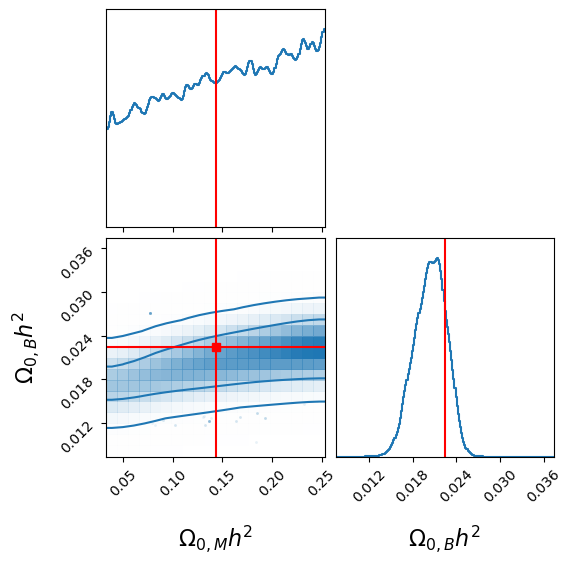

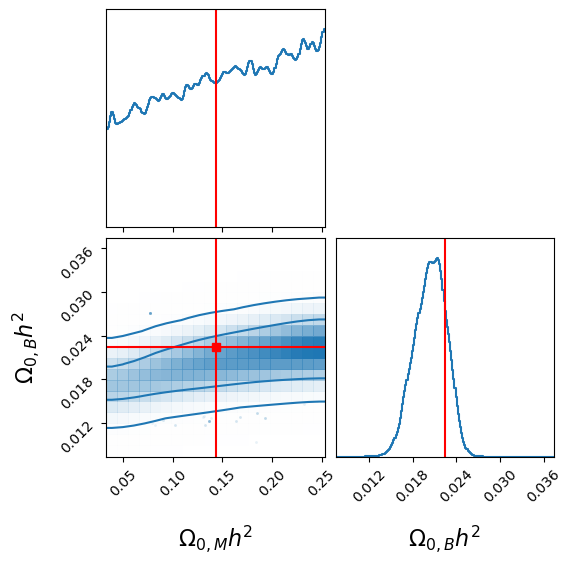

In [ ]:
# Corner Plot
fig=plt.figure(figsize=(6, 6))
data=np.array([test_Fitter.chain[:,:,0][np.arange(10),:].flatten(),test_Fitter.chain[:,:,1][np.arange(10),:].flatten()]).T   # loads in the data from the Sampler in the proper format
labels = [r"$\Omega_{0,M}h^2$",r"$\Omega_{0,B}h^2$"]
parameter1 = "signal_omM0h2"
parameter2 = "signal_omB0h2"
label_fontsize = 16
histogram_color = "tab:blue"
hist_bin_factor = 10   # Helps in the smoothing process by increasing bin number.
smooth = 2  # smooths the 2-D contours
smooth1d = 2  # smooths the 1-D histogram
range = [(test_Fitter.prior_distribution_set.minimum[parameter1],test_Fitter.prior_distribution_set.maximum[parameter1]),(test_Fitter.prior_distribution_set.minimum[parameter2],test_Fitter.prior_distribution_set.maximum[parameter2])]
truths = [omM0h2,omB0h2]
# truths = test_Fitter.parameter_mean
truth_color = "red"

corner.corner(data,bins=20,labels = labels,label_kwargs={"fontsize": label_fontsize},color=histogram_color,hist_bin_factor=hist_bin_factor, smooth = smooth, smooth1d=smooth1d,range=range,truths=truths,truth_color="red",verbose=True,fig=fig,plot_contours=True,levels=[0.68,0.95])

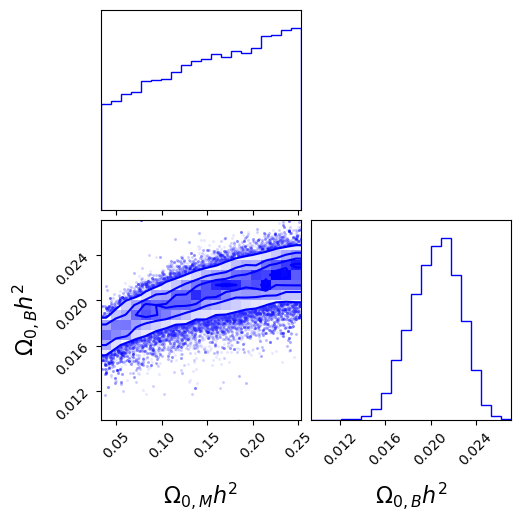

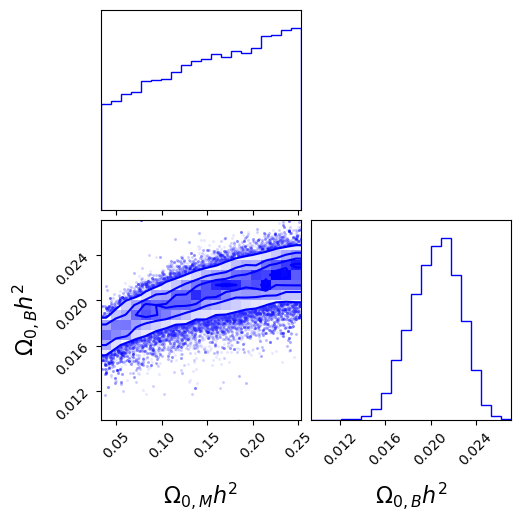

In [ ]:
corner.corner(np.array([test_Fitter.chain[:,:,0][np.arange(10),:].flatten(),test_Fitter.chain[:,:,1][np.arange(10),:].flatten()]))

AssertionError: I don't believe that you want more dimensions than samples!

In [ ]:
corner.corner(np.array([test_Fitter.chain[:,:,0][np.arange(10),:].flatten(),test_Fitter.chain[:,:,1][np.arange(10),:].flatten()]))

AssertionError: I don't believe that you want more dimensions than samples!

(array([0.0202843 , 0.02547709, 0.03066989]),
 [Text(0.020284296968191628, 0, '0.0203'),
  Text(0.025477092994851073, 0, '0.0255'),
  Text(0.030669889021510518, 0, '0.0307')])

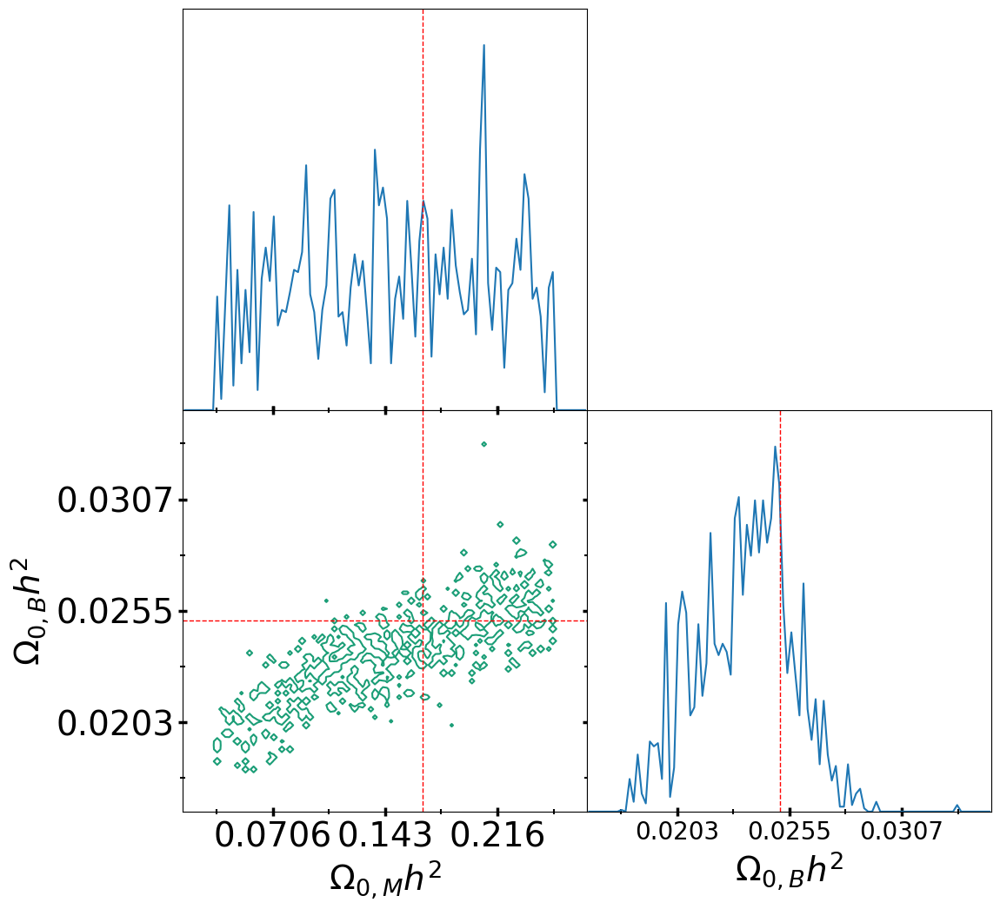

In [ ]:
# Plots the results of the MCMC attempting to fit the data:
test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome')
reference_value_mean = [least_square_fitter.argmin[0],least_square_fitter.argmin[1]]
#reference_value_covariance = np.array([[omM0h2sigma**2,omM0h2sigma*omB0h2sigma],[omM0h2sigma*omB0h2sigma,omB0h2sigma**2]])
reference_value_covariance = None
contour_confidence_levels = 0.95
def parameter_renamer(parameter):
    if parameter == "signal_omM0h2":
        parameter1 = r"$\Omega_{0,M} h^2$"
    else:
        parameter1 = r"$\Omega_{0,B} h^2$"
    return parameter1
test_Fitter.triangle_plot(nbins=100,parameter_renamer=parameter_renamer,reference_value_mean=reference_value_mean,reference_value_covariance=reference_value_covariance,contour_confidence_levels=contour_confidence_levels)
plt.xticks(size=20)

### Task: Make a new master foreground array for 128 bit.

In [ ]:
# This cell rotates the 128 bit ULSA map into the correct rotations NOTE: this cell will take many hours to run

location = (-23.815,182.25)  # The lat lon location of the moon landing site
spice_kernels = "/home/dbarker7752/lochness/input/spice_kernels/" #location of the spice kernels
NPIX = hp.nside2npix(128)
master_foreground_array_128 = np.zeros((10,50,NPIX))
# for i in range(10)
i=0
master_foreground_array_128_raw = lochness.LOCHNESS(spice_kernels,[times_10LSTs[i]],location,galaxy_map=ULSA_direction_128).lunar_frame_galaxy_maps[0]c
master_foreground_array_128[i] = master_foreground_array_128_raw

### Task: Update the Labmda CDM Training Set Function To Include Variations in $H_0$ (Hubble's Constant)
Using Figure 1 from Valentino et al. 2021 for the values listed below:
- 67.49 $\pm$ 0.53  Balkenhol et al. 2021 (derived from Planck 2018)  km/s/Mpc
- 72.94 $\pm$ 0.75  Valentino el al. 2021 (optimistic average of the many other methods not related to CMB)
- So even though it is updated, turns out H_0 has no effect on the Dark Ages trough. Whoops

100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


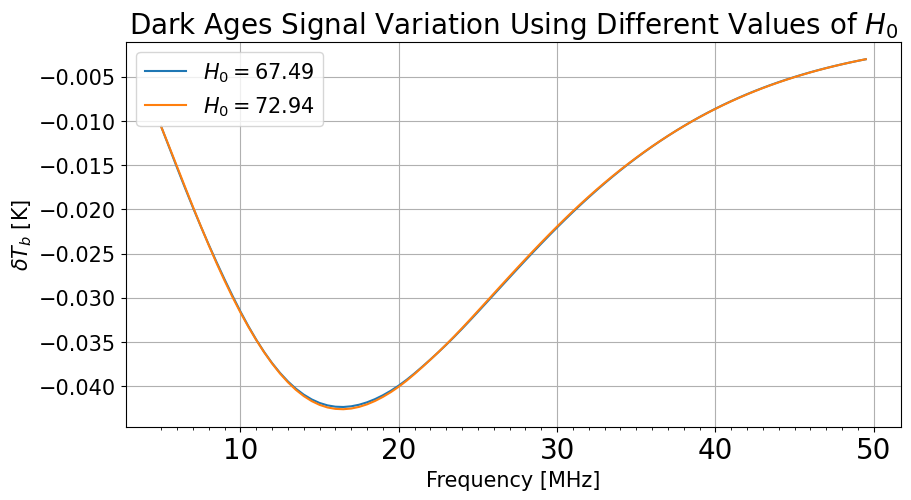

In [ ]:
H0 = 67.49
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0],[H0,0]])
lambdaCDM_training_set_CMB0 = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)

H0 = 72.94
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0],[H0,0]])
lambdaCDM_training_set_CMB00 = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)


plt.figure(figsize=(10, 5))
plt.plot(frequencies,lambdaCDM_training_set_CMB0[0][0,8::],label = r"$H_0 = 67.49$")
plt.plot(frequencies,lambdaCDM_training_set_CMB00[0][0,8::],label = r"$H_0 = 72.94$")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(r"Dark Ages Signal Variation Using Different Values of $H_0$", fontsize=20)
plt.legend(fontsize=15)
plt.grid()

### Task: Figure out the MCMC part of Pylinex

In [ ]:
# # def create_monochromatic_gaussian_beam_training_set(frequencies,N,stds,n_LSTs,n_regions,NSIDE,spectral_maps,plot_extremes = False):
# #     """"Exactly what it says. It creates a monochromatic gaussian beam training set.
    
# #     Parameters
# #     ==========================================================
# #     frequencies: The frequencies you wish to evaluate the B_values at.
# #     N: number of beams to include in this training set
# #     stds: The range of sigmas for the gaussians. Should be size (2,) with first index being lower value and second higher
# #     n_LSTs: The number of correlated spectra you are using (usually referred to as LSTs). 
# #     n_regions: Number of regions you will be using to create your regional index map. 
# #     NSIDE: resolution of your spectral index maps. I could grab this automatically, but I'm not too interested in making this function
# #            super user friendly, as a monochromatic beam should not be used often.
# #     spectral_maps: The spectral index map (per LST). Should be shape (n_LSTs, pixel count of maps
# #     plot_extremes: Plots the sky map of the gaussian beams that represent the low and high extremes of your std input.
# #                    Can be nice to get a good picture of what the gaussians look like based on your range.

# #     Returns
# #     ==========================================================
# #     B_values: The beam weighting values that will get input into the synchrotron foreground function"""

# #     C_array=np.random.uniform(stds[0],stds[1],N)
# #     gaussian_Bvalues = np.zeros((n_LSTs,N,len(frequencies),n_regions))
# #     for n in tqdm(range(N)): # loops through each training set curve to create a B_value array for each
# #         for l in range(n_LSTs):    # loops through the LSTs
# #             patch=perses.models.PatchyForegroundModel(frequencies,spectral_maps[l],n_regions) # define the regional patches
# #             region_indices = patch.foreground_pixel_indices_by_region_dictionary
# #             gaussian_beam_element = py21cmsig.gaussian_beams(frequencies,0.7,NSIDE,monochromatic_mode=True)
# #             for r in range(n_regions):
# #                 gaussian_Bvalues[l,n,:,r] = gaussian_beam_element[:,region_indices[r]].sum(axis=1)

        
# #     if plot_extremes:
# #         gaussian_beam_element_tightest = py21cmsig.gaussian_beams(frequencies,low,NSIDE,monochromatic_mode=True)
# #         hp.mollview(gaussian_beam_element_tightest[25])
# #         plt.title(rf"Monochromatic Beam (Tightest Gaussian Within Range, $\sigma$={low})")
# #         gaussian_beam_element_widest = py21cmsig.gaussian_beams(frequencies,high,NSIDE,monochromatic_mode=True)
# #         hp.mollview(gaussian_beam_element_widest[25])
# #         plt.title(rf"Monochromatic Beam (Widest Gaussian Within Range, $\sigma$={high})")
    
# #     return gaussian_Bvalues


# def create_BTS_curves (frequencies,frequency_range,B_values,sky_map,n_regions,spectral_index_map,n_LSTs):
#     """Create the BTS_curves needed as an input for other functions.

#     Parameters
#     ==============================================================
#     frequencies: The frequencies you would like your BTS_curves to be interpolated over. Important for matching the input of your other functions.
#     frequency_range: The frequency array that pertains to your sky maps.
#     B_values: The B_values associated with the regions you've created to model the foreground. Must be same number of frequency bins as your sky_map
#     sky_map: The base model of your foreground. Should be shape (frequency bins, pixel count)
#     n_regions: Number of regions used to create your regions for your foreground model
#     spectral_index_map: The spectral index map used to create your regions for your foreground model.
#     n_LSTs: Number of LSTs in this BTS_curve set.

#     Returns
#     =============================================================="""
#     patch=perses.models.PatchyForegroundModel(frequencies,spectral_index_map,n_regions) # define the regional patches
#     region_indices = patch.foreground_pixel_indices_by_region_dictionary
#     BTS_curves_raw = np.zeros((n_LSTs,len(B_values[0]),len(sky_map[0])))
#     BTS_curves = np.zeros((n_LSTs,len(B_values[0]),len(frequencies)))
#     for l in range(n_LSTs):
#         for BTS in tqdm(range(len(B_values[0]))):
#             for f in range(len(sky_map[0])):
#                 for r in range(n_regions):
#                     BTS_curves_raw[l,BTS,f] += (sky_map[l,f,region_indices[r]]*B_values[l,BTS,f,r]).sum()/len(region_indices[r])
#             interpolator = scipy.interpolate.CubicSpline(frequency_range,BTS_curves_raw[l,BTS,:])
#             BTS_curves[l,BTS,:] = interpolator(frequencies)
#     return BTS_curves

# def synchrotron_foreground_updated_given_Bvalues(N,n_regions,frequencies,spectral_index_map,sky_map,parameter_variation,B_values,\
#                                                  BTS_params=None,BTS_curves=None,define_parameter_mean=False,parameter_mean=None):


# #  BTS_curves, BTS_params,\sky_map
# #                            beam_sky_training_set,N,parameter_variation,B_value_functions\
# #                             ,define_parameter_mean = False,parameter_mean = 0, print_parameter_variation = True,B_values_given=False,B_values=0):
#     """Creates a training set for the foreground multi region model
    
#     Parameters
#     =======================================================
#     N: Number of varied foregrounds you wish to have in the training set.
#     n_regions: Number of regions in your patchy sky model
#     frequencies: The frequency range you wish to evaluate at. Defines your frequency bins.
#     spectral_index_map: Sky map representing spectral indices of some comparison frequencies.
#     sky_map: The galaxy map, rotated into your LST, that is being used for the simulated data. Shape(frequency bins, NPIX)
#     parameter_variation:  The variation in the parameters. This will be a multiplicative factor. Shoud be shape (3)
#     B_values: Array of B_values, which are the weights per region given a specific beam. Needs to be shape (number of beams in ts, freqeuncy bins,regions)
#     BTS_curves: The beam training set curves. This should already include the beams weighting the base foreground model.
#                 I could make this function do that, but it often takes some time, so I think it's better to do that externally
#                 in case you wanted to save it and  Should be shape (n curves,frequency bins)
#     BTS_params: The parameters associated with each beam that weighted each foreground
#     define_parameter_mean: Whether or not to define a new parameter mean. See parameter_mean below for more details.
#     parameter_mean: The mean value that the parameter_viariation values will center around. By default it is the best fit parameters.

#     Returns
#     =======================================================
#     training_set: Same data as the new_curves return, but in the proper shape for input into pylinex extractions
#     training_set_params: The parameters associated with the training_set curves
#     optimized_parameters: The best fit parameters to the input sky_map
#     new_curves: The new curves of the training set based on your inputs
#     new_foreground_deltaT: The change in temperature per region for each of the training set curves
#     """

#     if define_parameter_mean and type(parameter_mean) == None:
#         raise ValueError ("If define_parameter_mean is true, you must input a parameter mean that matches the parameter shape.")

#     synchrotron = synch
#     optimized_parameters = np.zeros((n_regions,3)) # three parameters in the synchrotron model: Amplitude, spectral index, spectral cuvature
#     patch=perses.models.PatchyForegroundModel(frequencies,spectral_index_map,n_regions) # define the regional patches
#     region_indices = patch.foreground_pixel_indices_by_region_dictionary
#     region_data = np.zeros((n_regions,len(frequencies)))
#     optimized_parameters = np.zeros((n_regions,3)) # three parameters in the synchrotron model: Amplitude, spectral index, spectral cuvature

   
#     ## This loop will populate the temperatures of each region and fit a best fit to that region for synchrotron
#     for i,r in enumerate(region_indices): 
#         region_temps_raw = np.array([])
#         for f in range(len(sky_map)):
#             region_temps_element = sky_map[f][region_indices[r]].mean() # The index on the sky map is NOTE: Not general
#             region_temps_raw = np.append(region_temps_raw,region_temps_element)           # assumes a specific index convention (index = frequency - 1)        
#         region_temps_interp = scipy.interpolate.CubicSpline(range(1,len(sky_map)+1),region_temps_raw)
#         region_temps = region_temps_interp(frequencies)
#         region_data[i] = region_temps
#         params = scipy.optimize.curve_fit(synchrotron,frequencies,region_temps,maxfev=5000)[0]
#         optimized_parameters[i] = params



#     ## This loop creates the difference array that will be added to each foreground frequency
#     new_parameters = np.zeros((N,n_regions,3))
#     new_foreground_deltaT = np.zeros((N,n_regions,len(frequencies)))
#     if define_parameter_mean:
#         model_mean = parameter_mean
#     else:
#         model_mean = copy.deepcopy(optimized_parameters)

#     # This loop creates the difference in temperature from the base model based on the new parameters randomly generated
#     for n in tqdm(range(N)):
#             for r in range(n_regions):
#                 new_parameter_element = np.array([model_mean[r][0]*(1+(parameter_variation[0] - 2*parameter_variation[0]*np.random.random()))\
#                                         ,model_mean[r][1]*(1+(parameter_variation[1] - 2*parameter_variation[1]*np.random.random()))\
#                                         ,model_mean[r][2]*(1+(parameter_variation[2] - 2*parameter_variation[2]*np.random.random()))])   
#                 new_parameters[n][r] = new_parameter_element
#                 new_temp = synchrotron(frequencies,new_parameter_element[0],new_parameter_element[1],new_parameter_element[2])
#                 delta_temp = new_temp - synchrotron(frequencies,optimized_parameters[r][0],optimized_parameters[r][1],optimized_parameters[r][2])
#                 new_foreground_deltaT[n][r] = delta_temp
    


#     # This loop weights the new change in mean temperature per region with the beam value associated
#     weighted_deltaT = np.zeros((N,len(frequencies)))
#     new_curves = np.zeros((N,len(frequencies)))
#     index_array = np.zeros(N).astype(int)
#     for b in tqdm(range(N)):
#         random_beam_index = int(np.random.uniform(0,len(B_values)))
#         index_array[b] = random_beam_index
#         random_beam = B_values[random_beam_index]
#         for r in range(n_regions):
#             weighted_deltaT[b] += new_foreground_deltaT[b][r]*random_beam[:,r]



#         new_curves[b] = BTS_curves[index_array[b]]+weighted_deltaT[b]
#         parameters = BTS_params[index_array]

#     return new_curves,parameters, optimized_parameters, new_foreground_deltaT, BTS_curves,index_array,weighted_deltaT

# def synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, BTS_curves, BTS_params,\
#                            beam_sky_training_set,N,parameter_variation,B_value_functions\
#                             ,define_parameter_mean = False,parameter_mean = 0, print_parameter_variation = True,B_values_given=False,B_values=0):
#     """Creates a training set for the foreground multi region model
    
#     Parameters
#     =======================================================
#     n_regions: Number of regions in your patchy sky model
#     data: The actual data you are fitting to. Should be shape (frequency bins)
#     noise: The noise corresponding to each frequency bin. Should be shape (frequency bins)
#     frequencies: The frequency range you wish to evaluate at. Defines your frequency bins.
#     sky_map: The galaxy map, rotated into your LST, that is being used for the simulated data. Shape(frequency bins, NPIX)
#     BTS_curves: The beam training set curves. This should already include the beams weighting the base foreground model.
#                 I could make this function do that, but it often takes some time, so I think it's better to do that externally
#                 in case you wanted to save it and  Should be shape (n curves,frequency bins)
#     BTS_params: The corresponding parameters for the beam curves. Should be shape (n curves, n parameters per beam)
#     beam_sky_training_set: The set of beams in your training set (in full sky map form). This can be from the raw training set, so you don't
#                             have to create interpolated beam sky maps. This function will interpolate from this the values you need.
#                             Should be shape (n curves, frequency bins, NPIX)
#     N: Number of varied foregrounds you wish to have in the training set.
#     parameter_variation:  The variation in the parameters. This will be a multiplicative factor. Shoud be shape (3)
#     B_value_functions: Defines the set of B_value interpolators that are used to determine the B_values.
#     sky_map_training_set:  Whether or not you want sky maps for each of the varied foregrounds. Take a lot of time and data
#                            to build that many sky maps, so be wary.
#     determine_parameter_range: Whether or not to determine the parameter range based on the training set of everything except
#                                the foreground
#     define_parameter_mean: Whether or not to define a new parameter mean. See parameter_mean below for more details.
#     parameter_mean: The mean value that the parameter_viariation values will center around. By default it is the best fit parameters.
#     B_values_given: Wether to use a list of B_values instead of a function.
#     B_values: If B_values_given, then this is the array of B_values. Needs to be shape (number of beams in ts, freqeuncy bins)

#     Returns
#     =======================================================
#     training_set: Same data as the new_curves return, but in the proper shape for input into pylinex extractions
#     training_set_params: The parameters associated with the training_set curves
#     optimized_parameters: The best fit parameters to the input sky_map
#     new_curves: The new curves of the training set based on your inputs
#     masked_indices: The indices of the pixels of the healpy map that are associated with each region
#     new_foreground_deltaT: The change in temperature per region for each of the training set curves
#     """
#     synchrotron = synch
#     optimized_parameters = np.zeros((n_regions,3)) # three parameters in the synchrotron model: Amplitude, spectral index, spectral cuvature
#     patch=perses.models.PatchyForegroundModel(frequencies,spectral_index_map,n_regions) # define the regional patches
#     B_values = np.zeros((len(BTS_curves),len(frequencies),n_regions))
#     if B_values_given:
#         B_values = B_values
#     else:
#         for i,b in enumerate(BTS_params):
#             for f in range(len(frequencies)):
#                 B_values[i][f] = B_value_functions[f](b)
#     region_indices = patch.foreground_pixel_indices_by_region_dictionary
#     region_data = np.zeros((n_regions,len(frequencies)))
#     optimized_parameters = np.zeros((n_regions,3)) # three parameters in the synchrotron model: Amplitude, spectral index, spectral cuvature
#     masked_indices = np.where(beam_sky_training_set[0][-1] == 0)[0]

   
#     ## This loop will populate the temperatures of each region and fit a best fit to that region for synchrotron
#     for i,r in enumerate(region_indices): 
#         region_temps_raw = np.array([])
#         for f in range(len(sky_map)):
#             region_temps_element = sky_map[f][region_indices[r]].mean() # The index on the sky map is NOTE: Not general
#             region_temps_raw = np.append(region_temps_raw,region_temps_element)           # assumes a specific index convention (index = frequency - 1)        
#         region_temps_interp = scipy.interpolate.CubicSpline(range(1,len(sky_map)+1),region_temps_raw)
#         region_temps = region_temps_interp(frequencies)
#         region_data[i] = region_temps
#         params = scipy.optimize.curve_fit(synchrotron,frequencies,region_temps,maxfev=5000)[0]
#         optimized_parameters[i] = params



#     ## This loop creates the difference array that will be added to each foreground frequency
#     new_parameters = np.zeros((N,n_regions,3))
#     new_foreground_deltaT = np.zeros((N,n_regions,len(frequencies)))
#     if define_parameter_mean:
#         model_mean = parameter_mean
#     else:
#         model_mean = copy.deepcopy(optimized_parameters)

#     # This loop creates the difference in temperature from the base model based on the new parameters randomly generated
#     for n in tqdm(range(N)):
#             for r in range(n_regions):
#                 new_parameter_element = np.array([model_mean[r][0]*(1+(parameter_variation[0] - 2*parameter_variation[0]*np.random.random()))\
#                                         ,model_mean[r][1]*(1+(parameter_variation[1] - 2*parameter_variation[1]*np.random.random()))\
#                                         ,model_mean[r][2]*(1+(parameter_variation[2] - 2*parameter_variation[2]*np.random.random()))])   
#                 new_parameters[n][r] = new_parameter_element
#                 new_temp = synch(frequencies,new_parameter_element[0],new_parameter_element[1],new_parameter_element[2])
#                 delta_temp = new_temp - synch(frequencies,optimized_parameters[r][0],optimized_parameters[r][1],optimized_parameters[r][2])
#                 new_foreground_deltaT[n][r] = delta_temp
    


#     # This loop weights the new change in mean temperature per region with the beam value associated

#     # new_curves = np.zeros((len(B_values),N,len(frequencies)))
#     # for b in tqdm(range(len(B_values))):
#     #     weighted_deltaT = np.zeros((N,len(frequencies)))
#     #     for n in range(N):
#     #         for r in range(n_regions):
#     #             weighted_deltaT[n] += new_foreground_deltaT[n][r]*B_values[b,:,r]
#     #         #     training_set_params_row = np.append(training_set_params_row,new_parameters[n][r]) 
#     #         # training_set_params_row = np.append(training_set_params_row,BTS_params[b])
#     #         # training_set_params = np.concatenate((training_set_params,[training_set_params_row]),axis=0)
#     #         new_curves[b][n] = BTS_curves[b]+weighted_deltaT[n]
#     #         # training_set = np.concatenate((training_set,[new_curves[b][n]]),axis=0)



#     # This loop takes a wierdly long amount of time to run and just massages the arrays into the proper format for PYLINEX

#     weighted_deltaT = np.zeros((N,len(frequencies)))
#     new_curves = np.zeros((N,len(frequencies)))
#     index_array = np.zeros(N).astype(int)
#     for b in tqdm(range(N)):
#         random_beam_index = int(np.random.uniform(0,len(B_values)))
#         index_array[b] = random_beam_index
#         random_beam = B_values[random_beam_index]
#         for r in range(n_regions):
#             weighted_deltaT[b] += new_foreground_deltaT[b][r]*random_beam[:,r]



#         new_curves[b] = BTS_curves[index_array[b]]+weighted_deltaT[b]
#         beam_parameters = BTS_params[index_array]

#     foreground_parameters = new_parameters
#     parameters = np.zeros((N,n_regions*3+3)) # 3 parameters per region, +3 beam parameters
#     for n in range(N):
#         parameters[n][0:n_regions*3] = foreground_parameters[n].flatten()
#         parameters[n][n_regions*3:n_regions*3+3] = beam_parameters[n]  
#     # # training_set_size = len(BTS_curves)*N
#     # parameter_length = len(new_parameters[0][0])*n_regions+len(BTS_params[0])
#     # # training_set = np.zeros((training_set_size,len(frequencies)))
#     # training_set_params = np.zeros((training_set_size,parameter_length))
#     # # x = -1
#     # # for b in tqdm(range(len(BTS_curves))):
#     # #     for n in range(N):
#     # #         training_set_params_row = np.array([])
#     # #         x += 1
#     # #         for r in range(n_regions):
#     # #             training_set_params_row = np.append(training_set_params_row,new_parameters[n][r]) 
#     # #         training_set[x] = new_curves[b][n]
#     # #         training_set_params_row = np.append(training_set_params_row,BTS_params[b])
#     # #         training_set_params[x] = training_set_params_row
#     # # if print_parameter_variation:
#     # #     print(parameter_variation)

    

#     return new_curves,parameters,beam_parameters,foreground_parameters, optimized_parameters,masked_indices, new_foreground_deltaT, B_values,index_array

# def beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,reference_frequency,sky_map, beam_sky_training_set,N,\
#                                           beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,show_parameter_ranges=True\
#                                               , define_parameter_mean=False,parameter_mean=0,Nb=0,Nf=0,B_values_given=False,B_values=0):

#     """Creates a training set for the foreground multi region model
    
#     Parameters
#     =======================================================
#     n_regions: Number of regions in your patchy sky model
#     data: The actual data you are fitting to. Should be shape (frequency bins)
#     noise: The noise corresponding to each frequency bin. Should be shape (frequency bins)
#     frequencies: The frequency range you wish to evaluate at. Defines your frequency bins.
#     reference_frequency: The frequency you used to create your patchy regions
#     sky_map: The galaxy map, rotated into your LST, that is being used for the simulated data. Shape(frequency bins, NPIX)
#     beam_sky_training_set: The set of beams in your training set (in full sky map form). This can be from the raw training set, so you don't
#                             have to create interpolated beam sky maps. This function will interpolate from this the values you need.
#                             Should be shape (n curves, frequency bins, NPIX)
#     N: Number of curves you wish to have in the training set.
#     beam_parameters:  The high and low values of the beam parameters for the model. For Fatima's beams it will be of the shape (3,2)
#     foreground_parameters: The variation in the parameters. This will be a multiplicative factor. Shoud be shape (3)
#     B_value_functions: Defines the set of B_value interpolators that are used to determine the B_values.
#     STS_data: An output of the signal_training_set function. As of writing this it is the first output, so variable[0]
#                               would be the correct call if that variable was set to the output of that function. 
#     STS_params: An output of the signal_training_set function. As of writing this it is the second output, so variable[1]
#     N:  The number of curves you wish to have in this new training set
#     sky_map_training_set:  Whether or not you want sky maps for each of the varied foregrounds. Take a lot of time and data
#                            to build that many sky maps, so be wary.
#     determine_parameter_range: Whether or not to determine the parameter range based on the training set of everything except
#                                the foreground
#     define_parameter_mean: Whether or not to define a new parameter mean. See parameter_mean below for more details.
#     parameter_mean: The mean value that the parameter_viariation values will center around. By default it is the best fit parameters.
#     B_values_given: Wether to use a list of B_values instead of a function.
#     B_values: If B_values_given, then this is the array of B_values. Needs to be shape (number of beams in ts, freqeuncy bins)
#     Nb: Number of beams to use in the training set (overrides N)
#     Nf: Number of foregrounds to use in the training set (overrides N) 

#     Returns
#     =======================================================
#     training_set: Same data as the new_curves return, but in the proper shape for input into pylinex extractions
#     training_set_params: The parameters associated with the training_set curves
#     """

#     if Nb == 0:
#         # Nb = int(np.sqrt(N)) # number of beams in the training set
#         Nb = N
#     else:
#         Nb = Nb
#     exp_test=py21cmsig.expanded_training_set_no_t(STS_data,STS_params,Nb,\
#                                beam_parameters,show_parameter_ranges=show_parameter_ranges)
#     BTS_curves = exp_test[0]
#     BTS_params = exp_test[1]

#     if Nf == 0:
#         # Nf = int(np.sqrt(N)) # number of foregrounds in the training set
#         Nf = N
#     else:
#         Nf = Nf
#     output = synchrotron_foreground_updated(n_regions,frequencies,reference_frequency,sky_map,BTS_curves,BTS_params,\
#                                     beam_sky_training_set,Nf,foreground_parameters,B_value_functions,\
#                                         define_parameter_mean=define_parameter_mean,parameter_mean=parameter_mean,B_values_given=B_values_given,B_values=B_values)
#     return output

# def B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
#                          frequencies,spectral_index_map,n_regions):
#     """Interpolates the beam weighting per region for the synchrotron_foreground
    
#     Parameters
#     ============================================
#     frequencies: The array of frequencies you wish to evaluate at.
#     n_regions: The number of regions you want in your foreground model
#     spectral_index_map: Map of spectral indices that is the same resolution as your base sky model.
#     reference_frequency: The frequency of the sky map that you are using to create your regions.
#     beam_sky_training_set: The set of beams in your training set (in full sky map form). This can be from the raw training set, so you don't
#                             have to create interpolated beam sky maps. This function will interpolate from this the values you need.
#                             Should be shape (n curves, frequency bins, NPIX)
#     beam_sky_training_set_params: The parameters associated with the beam_sky_training_set. Should be shape (n curves,n parameters per curve)
#     beam_curve_training_set: This is the training set that is temperature vs frequency. You'll need this one as well. This one need not
#                             be the raw training set. Should be shape (n curves, frequency bins)

#     Returns
#     ============================================"""

#     patch=perses.models.PatchyForegroundModel(frequencies,spectral_index_map,n_regions)
#     new_region_indices = patch.foreground_pixel_indices_by_region_dictionary # gives the indices of each region

#     t = 0
#     B_values_raw = np.zeros((len(beam_sky_training_set),len(beam_sky_training_set[0]),len(new_region_indices)))
#     B_values = np.zeros((len(beam_sky_training_set),len(frequencies),len(new_region_indices)))
#     for n in tqdm(range(len(beam_sky_training_set))):
#         for f in range(len(beam_sky_training_set[0])):
#             for i,r in enumerate(new_region_indices):
#                 B_values_raw[n][f][i]=np.sum(beam_sky_training_set[n][f][new_region_indices[r]])
#         B_values_interp = scipy.interpolate.CubicSpline(np.arange(1,len(beam_sky_training_set[0])+1),B_values_raw[n])
#         B_values[n] = B_values_interp(frequencies)
#     expanded_B_values_interpolator = {}
#     for f in range(len(frequencies)):
#         values = B_values[:,f]
#         params = beam_sky_training_set_params
#         expanded_B_values_interp=scipy.interpolate.NearestNDInterpolator(params,values)
#         expanded_B_values_interpolator[f]=expanded_B_values_interp

#     return expanded_B_values_interpolator

# def plot_extraction_array (frequency_array,signal,noise,extractions_array,systematics_array,title="",ylim=None):
#     """Plots the cumulative extractions of the extraction_array
    
#     Parameters
#     =========================================================
#     frequency_array: The array that matches the extractions
#     signal: The signal that matches the input for the extractions
#     noise: The noise function of the extractions


#     Returns
#     ========================================================
#     just plots"""
#     plt.figure(figsize=(10, 5))
#     plt.plot(frequency_array,signal,color='black',ls="--",label="input signal")
#     plt.fill_between(frequency_array,signal+noise,signal-\
#                             noise,alpha=0.25,label="radiometer noise",color="red")

#     mean_rms_array = np.zeros((N))
#     mean_rms_array_sys = np.zeros((N))
#     mean = extractions_array.mean(axis=0)
#     mean_sys = systematics_array.mean(axis=0)
#     sig1_index = int(0.68*N)
#     sig2_index = int(0.954*N)
#     sig3_index = int(0.997*N)
#     for n in range(N):
#         mean_rms_array[n]=((extractions_array[n]-mean)**2).mean()**(1/2)
#     sorted = np.sort(mean_rms_array)
#     mean = extractions_array[np.where(mean_rms_array == sorted[0])][0]
#     sigma1 = extractions_array[np.where(mean_rms_array == sorted[sig1_index])][0]
#     sig1_diff = np.abs(sigma1-mean)
#     sigma2 = extractions_array[np.where(mean_rms_array == sorted[sig2_index])][0]
#     sig2_diff = np.abs(sigma2-mean)
#     sigma3 = extractions_array[np.where(mean_rms_array == sorted[sig3_index])][0]
#     sig3_diff = np.abs(sigma3-mean)
#     for n in range(N):
#         mean_rms_array_sys[n]=((systematics_array[n]-mean_sys)**2).mean()**(1/2)
#     sorted_sys = np.sort(mean_rms_array_sys)
#     mean_sys = systematics_array[np.where(mean_rms_array_sys == sorted_sys[0])][0]
    
#     plt.plot(frequency_array,mean,color="blue",alpha=0.5,label="mean extraction")
#     plt.fill_between(frequency_array,mean-sig3_diff,mean+sig3_diff,alpha=0.25,label="3 sigma extraction",color="gray")
#     plt.fill_between(frequency_array,mean-sig2_diff,mean+sig2_diff,alpha=0.25,label="2 sigma extraction",color="cyan")
#     plt.fill_between(frequency_array,mean-sig1_diff,mean+sig1_diff,alpha=0.25,label="1 sigma extraction",color="blue")


            
#     plt.xticks(ticks=np.arange(5,51,1),minor=True)
#     plt.xticks(size=20)
#     plt.xlabel("Frequency [MHz]",fontsize=15)
#     plt.yticks(fontsize=15)
#     plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
#     plt.title(title+f" {N} Extractions", fontsize=20)
#     plt.ylim(ylim)
#     plt.grid()
#     plt.legend()

#### Static LuSEE-Night Beam with Varied Regional Foreground (not sure how many regions right now).

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 90/90 [00:00<00:00, 212.71it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 213.22it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 206.89it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 188.11it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 210.08it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 167.54it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 208.81it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 203.39it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 205.53it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 208.43it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 210.12it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 196.64it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 179.63it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 205.46it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 213.31it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 201.61it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 195.36it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 192.45it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 210.88it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 90/90 [00:00<00:00, 207.29it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1000/1000 [00:00<00:00, 40461.74it/s]


The MetaFitter chose 49 systematics terms based on DIC minimization.
The MetaFitter chose 9 signal terms based on DIC minimization.
3037020.982617752 Chi Squared
71200157118661.88 Psi Squared


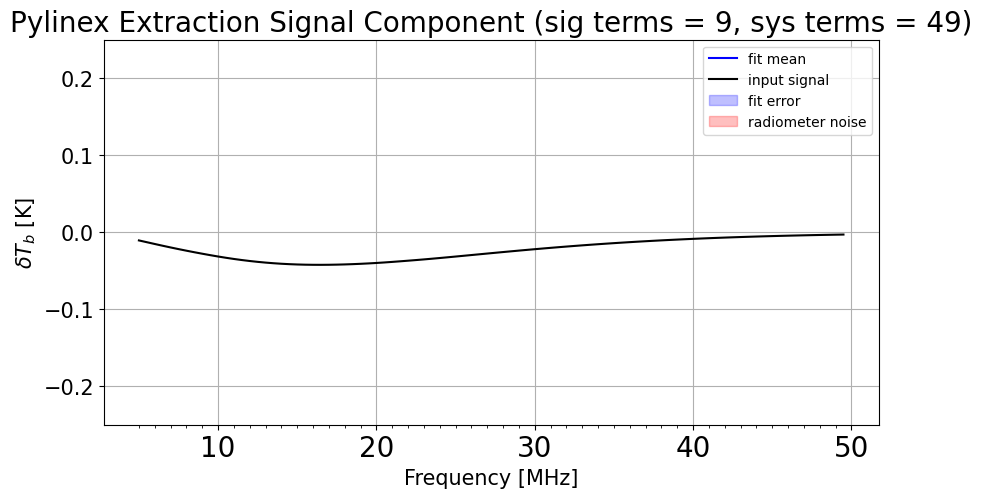

In [ ]:
# Important variables:
n_LSTs = 10 # this should match the number of foreground_training_sets you've made
## Spectral Index Map Variable
n_regions = 8   # number of regions that are created for your multi-region model
temp1 = 10     # lower frequency that is used for the temperature for the spectral index of the spectral index map
temp2 = 50     # upper frequency
f_low = temp1   # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
f_high = temp2  # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
NSIDE = 32
## Beam-Weighted Foreground
true_beam_parameters = np.array([2.7831,3.7982,4.1932])  # regolith parameters of the LuSEE-Night Beam
N = 1000    # Number of differing foregrounds in the training set

#### Pylinex Statistics and Extraction Variable ###
ylim=(-0.2,0.2)
N_extractions = 1000    # number of extractions to do for the pylinex statistics
num_sig_vectors = 4   # maximum number of signal modes to use in the extractions
num_sys_vectors = 200    # maximum number of systematic modes to use in the extraction
num_basis_vectors = 200  # number of basis vectors to create for the root bases (make sure its as big as the largest num_sys or num_sig_vectors number)
foreground_parameters = [0,0.05,0]  # the fractional variation on, respectively, Amplitude, spectral index, curvature. Tells the system how to vary the foregound
## signal that is used as the input to the observation data: ##
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0/h**2],[H0,0]])
input_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)[0][0][8:] # fiducial signal
##  ##
signal_training_set = lambdaCDM_training_set[:,16::2]  ### indexing is needed to get it into the correct shape for the extraction. Training set used in the pylinex fit




# Step 1: Create the spectral index map that will govern the B_values of the beam (since they govern the indices of the regions).
# NPIX = hp.nside2npix(NSIDE)
# spectral_maps = np.zeros((n_LSTs,NPIX))
# for l in range(n_LSTs):
#     spectral_map = py21cmsig.spectral_index_map(f_low,f_high,n_regions,temp1,temp2,NSIDE,ULSA_direction_32 = master_foreground_array[l])
#     spectral_maps[l] = spectral_map

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","w")
# f.create_dataset("spectral maps",data=spectral_maps)
# f.close()

if NSIDE != 32:
    raise ValueError ("The saved spectral maps are only 32 bit right now.")
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","r")
spectral_maps = np.array(hdf5["spectral maps"])   # I'v visually varified that these make sense


# Step 2: Create the Beam-Weighted Foreground Training Set

# hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/varied_regolith_BWFG_static_beam_1kTSplus","r")
# RegBWFG_10LST_TS = hdf5["true sky"] 
# RegBWFG_10LST_TS_params = hdf5["true sky parameters"]
# data = hdf5["full observation"]
# noise = hdf5["noise function"]
# signal = hdf5["input signal"]
# systematics = hdf5["input systematics"]
# 

# Training Sets 10LST for Varied Regolith  # parameters are all the same as varied regolith training set raw params
# This loads up the BTS curves per LST for each raw beam that can later be interpolated
varied_regolith_TS_raw_10LSTs = np.zeros((n_LSTs,221,50))
f1 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_TS_raw_10LSTs[0] = f1["Foreground_Training_Set"][:,0,:]
varied_regolith_training_set_raw_params = f1["Parameters_of_Beams"]
f2 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_2","r")
varied_regolith_TS_raw_10LSTs[1] = f2["Foreground_Training_Set"][:,0,:]
f3 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_3","r")
varied_regolith_TS_raw_10LSTs[2] = f3["Foreground_Training_Set"][:,0,:]
f4 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_4","r")
varied_regolith_TS_raw_10LSTs[3] = f4["Foreground_Training_Set"][:,0,:]
f5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_5","r")
varied_regolith_TS_raw_10LSTs[4] = f5["Foreground_Training_Set"][:,0,:]
f6 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_6","r")
varied_regolith_TS_raw_10LSTs[5] = f6["Foreground_Training_Set"][:,0,:]
f7 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_7","r")
varied_regolith_TS_raw_10LSTs[6] = f7["Foreground_Training_Set"][:,0,:]
f8 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_8","r")
varied_regolith_TS_raw_10LSTs[7] = f8["Foreground_Training_Set"][:,0,:]
f9 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_9","r")
varied_regolith_TS_raw_10LSTs[8] = f9["Foreground_Training_Set"][:,0,:]
f10 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_10","r")
varied_regolith_TS_raw_10LSTs[9] = f10["Foreground_Training_Set"]

# varied regolith beam maps (all sky and normalized)
# Used to create the B_value interpolator that can spit out B_values based on regolith parameter inputs
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
# These are used to create the initial B_values for the original 221 Fatima beams
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]



## Interpolate the varied beams to match the rest of the data in frequency bin number
varied_regolith_training_set_10LSTs = np.zeros((n_LSTs,len(varied_regolith_TS_raw_10LSTs[0]),len(frequencies)))
for l in range(n_LSTs):
    for n in range(len(varied_regolith_TS_raw_10LSTs[0])):
        beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_TS_raw_10LSTs[l][n])
        varied_regolith_training_set_10LSTs[l][n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets 
# The code below creates the actual observations per LST using the same foreground model and beam, just rotated into new LSTs     
simulated_foreground_array_10LSTs = np.zeros((n_LSTs,len(frequencies)))
simulated_foreground_parameters = np.zeros((n_LSTs,n_regions,3))
beam_parameters = np.array([[true_beam_parameters[0],true_beam_parameters[0]],[true_beam_parameters[1],true_beam_parameters[1]],[true_beam_parameters[2],true_beam_parameters[2]]])

# loops through each LST  to create the "true sky" foreground
for l in range(n_LSTs):
    N_sim = 1   # we only need to one training set curve for our simulated example (this is the truth, not the training set)
    Nb = 0
    Nf = 0
    sky_map = master_foreground_array[l]
    beam_sky_training_set = beams[:,5:,:]
    beam_sky_training_set_params = varied_regolith_training_set_raw_params
    STS_data = varied_regolith_training_set_10LSTs[l]
    STS_params = varied_regolith_training_set_raw_params
    show_parameter_ranges = True
    define_parameter_mean = False
    foreground_parameters_true = np.array([0,0,0])   # ensures the foreground is just a single 
    parameter_mean = None
    B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                         frequencies,spectral_maps[l],n_regions)


    foreground_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_maps[l],sky_map, beam_sky_training_set,N_sim,\
                                            beam_parameters,foreground_parameters_true,B_value_functions, STS_data,STS_params,\
                                                show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
    simulated_foreground_array_10LSTs[l] = foreground_element[0][0]
    simulated_foreground_parameters[l] = foreground_element[2]




simple_Fatima_sim=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs,input_signal,N_antenna,dnu,dt)


### This is where the training set is created ###
N_samp = N
Nb=1
Nf=N

RegBWFG_10LST_TS = np.zeros((N_samp,n_LSTs,len(frequencies)))
RegBWFG_10LST_TS_params = np.zeros((N_samp,n_LSTs,3*n_regions+3))   # 3 for the 3 parameters in the synchrotron equation and 3 at the end for the 3 parameters in the beam
for l in range(n_LSTs):
    beam_parameters = np.array([[true_beam_parameters[0],true_beam_parameters[0]],[true_beam_parameters[1],true_beam_parameters[1]],[true_beam_parameters[2],true_beam_parameters[2]]])  # Ensures we aren't varying the beam

    sky_map = master_foreground_array[l]
    beam_sky_training_set = beams[:,5:,:]
    beam_sky_training_set_params = varied_regolith_training_set_raw_params
    raw_beam_weighted_sky_maps = raw_sky_maps
    STS_data = varied_regolith_training_set_10LSTs[l]
    STS_params = varied_regolith_training_set_raw_params
    show_parameter_ranges = True
    define_parameter_mean = False

    B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                         frequencies,spectral_maps[l],n_regions)
    test_case_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_maps[l],sky_map, beam_sky_training_set,N,\
                                            beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                                show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
    RegBWFG_10LST_TS[:,l,:] = test_case_element[0]
    RegBWFG_10LST_TS_params[:,l,:] = test_case_element[1]


# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/varied_regolith_BWFG_static_beam_1kTSplus","w")
# f.create_dataset("true sky",data=simulated_foreground_array_10LSTs)
# f.create_dataset("true sky parameters",data=simulated_foreground_parameters)
# f.create_dataset("traing set curves",data=RegBWFG_10LST_TS)
# f.create_dataset("training set parameters",data=RegBWFG_10LST_TS_params)
# f.create_dataset("full observation",data=simple_Fatima_sim[0])
# f.create_dataset("noise function",data=simple_Fatima_sim[5])
# f.create_dataset("input signal",data=simple_Fatima_sim[1])
# f.create_dataset("input systematics",data=simple_Fatima_sim[2])
# f.close()

# Pylinex Extractions
data=simple_Fatima_sim[0]
noise = simple_Fatima_sim[5]
signal = simple_Fatima_sim[1]
systematics = simple_Fatima_sim[2]
# test_extraction_static_LuSEE = py21cmsig.extraction_statistics(N_extractions,RegBWFG_10LST_TS,signal_training_set,data,noise,signal,systematics,\
#                                                   frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
#                                                     title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
#                                                         num_basis_vectors=num_basis_vectors,ylim=ylim)

test_single_extraction= py21cmsig.pylinex_extraction(RegBWFG_10LST_TS,signal_training_set,data,noise,signal,frequencies,multi_spectra=True,ylim=(-0.25,0.25))

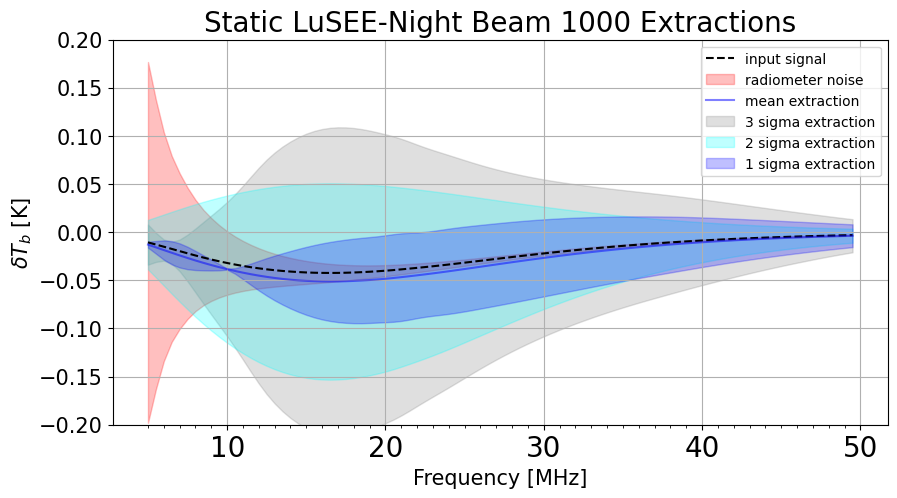

In [ ]:
noise = simple_Fatima_sim[5]
signal = simple_Fatima_sim[1]
plot_extraction_array(frequencies,signal,noise[0],test_extraction_static_LuSEE[0],test_extraction_static_LuSEE[7],title = "Static LuSEE-Night Beam",ylim=ylim)

100%|██████████| 10/10 [00:02<00:00,  3.58it/s]


Maximum bias of the systematics rms is 0.19573457672595396
Maximum bias of the signal rms is 0.2354177708421048
Average number of systematics terms used for fit: 41.0
Average number of signal terms used for fit: 3.0
Reduced Chi Squared of mean fit: [59709077.09354055]
Mean Reduced Chi Squared: 59708765.688739
STD of Reduced Chi Squared Distribution: 464.0805340772284


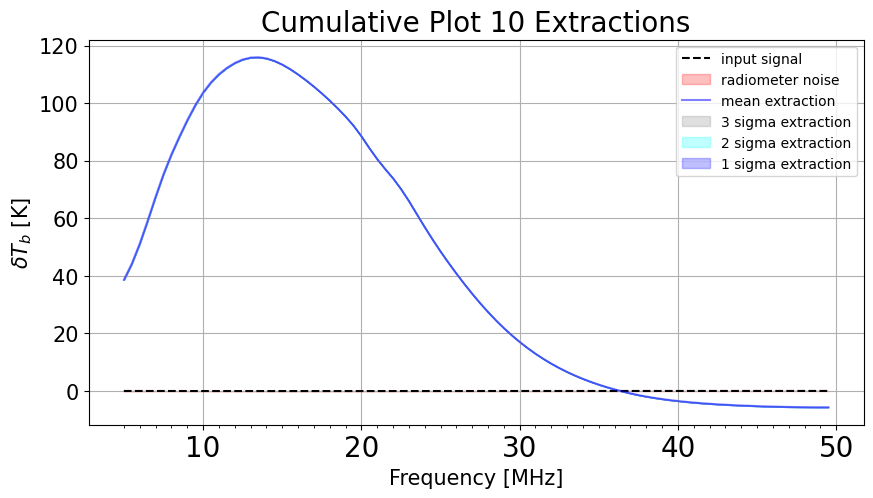

In [ ]:
test_extraction = py21cmsig.extraction_statistics(N_extractions,reduced_training_set,signal_training_set,data,noise,signal,systematics,\
                                                  frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
                                                    title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
                                                        num_basis_vectors=num_basis_vectors)

41 curves remaining


Text(0, 0.5, 'Counts')

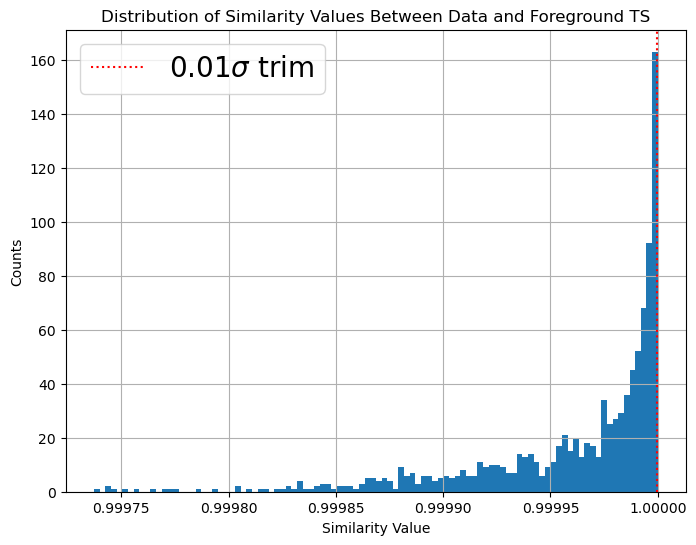

In [ ]:
# we have to have the same number of training sets per LST, so we'll use LST 0 to define the number of curves to draw from.
root_training_set = RegBWFG_10LST_TS
std_cutoff = 0.01
similarity0 = py21cmsig.degeneracy_test(np.array([data[0]]),RegBWFG_10LST_TS[:,0,:])
std = similarity0[0].std()
good_indices_number = np.where(similarity0[0] > 1-std*std_cutoff )[0].shape[0]
good_indices_number

for l in range(n_LSTs): 
    similarity = py21cmsig.degeneracy_test(np.array([data[l]]),root_training_set[:,l,:])[0]
    similarity_sorted = np.sort(similarity)[::-1]
    similarity_cut = similarity_sorted[0:good_indices_number]
    cut_indices = np.zeros(len(similarity_cut)).astype(int)
    for i in range(len(similarity_cut)):
        cut_indices[i] = np.where(similarity == similarity_cut[i])[0][0]
    reduced_training_set = root_training_set[cut_indices]


print(f"{good_indices_number} curves remaining")
plt.figure(figsize=(8, 6))

plt.hist(similarity0[0],bins=100)
plt.axvline(1-std*std_cutoff,color="red",ls=":",label = rf"${std_cutoff}\sigma$ trim")
plt.legend(fontsize=20)
plt.grid()
plt.title("Distribution of Similarity Values Between Data and Foreground TS")
plt.xlabel("Similarity Value")
plt.ylabel("Counts")

The MetaFitter chose 172 systematics terms based on DIC minimization.
The MetaFitter chose 2 signal terms based on DIC minimization.
0.9555645089234944 Chi Squared
0.6727384850901786 Psi Squared


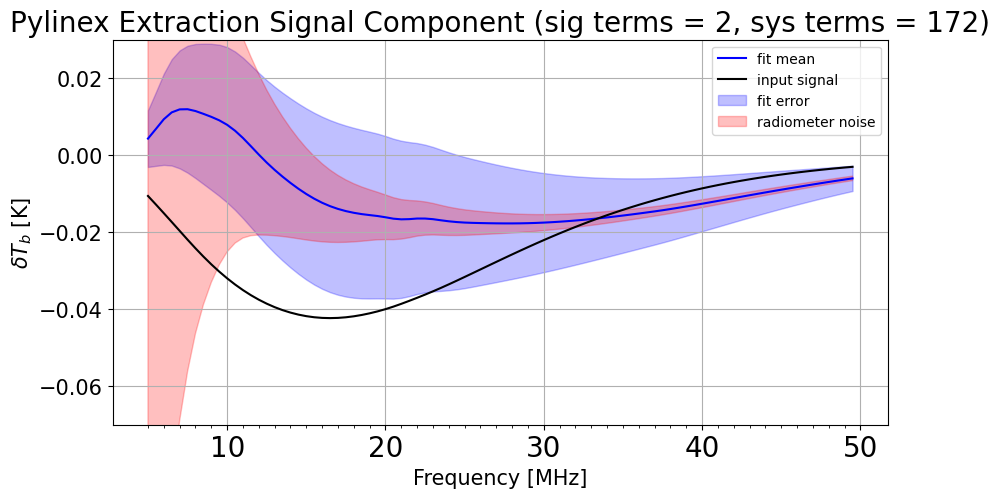

In [ ]:
test_single_extraction= py21cmsig.pylinex_extraction(RegBWFG_10LST_TS,signal_training_set,data,noise,signal,frequencies,multi_spectra=True,num_basis_vectors=200,num_sig_vectors=5,num_sys_vectors=200,ylim=(-0.07,0.03))

Text(0.5, 1.0, ' Foreground TS Varied Spectral Index ($\\pm 5\\%$ From ULSA Base) ')

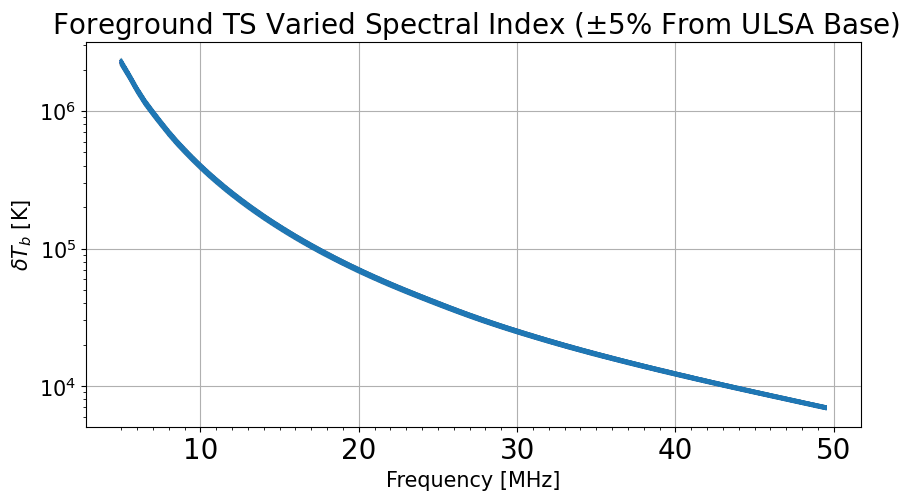

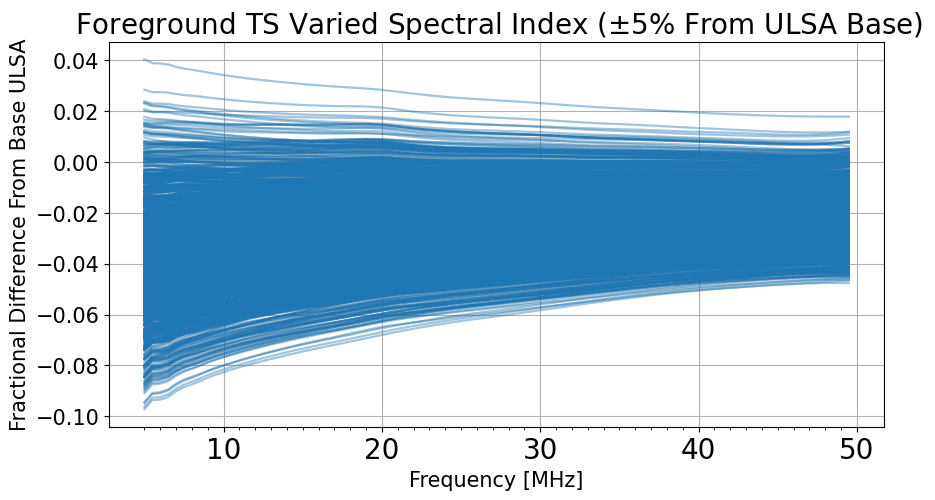

In [ ]:
colors = ["#ff0000","#cc0000","#e69138","#f1c232","#6aa84f","#45818e","#3c78d8","#3d85c6","#674ea7","#a64d79"]
L = 0
plt.figure(figsize=(10, 5))
for l in np.ones(10).astype(int)*L:    
    for n in range(100):
        plt.plot(frequencies,RegBWFG_10LST_TS[n][l],color="tab:blue",alpha=0.05)
plt.yscale("log")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.title(r" Foreground TS Varied Spectral Index ($\pm 5\%$ From ULSA Base) ", fontsize=20)

plt.figure(figsize=(10, 5))
for l in np.ones(10).astype(int)*L:    
    for n in range(1000):
        plt.plot(frequencies,(RegBWFG_10LST_TS[n][l]-RegBWFG_10LST_TS[0][l])/RegBWFG_10LST_TS[0][l],color="tab:blue",alpha=0.05)
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"Fractional Difference From Base ULSA",fontsize=15)
plt.grid()
plt.title(r" Foreground TS Varied Spectral Index ($\pm 5\%$ From ULSA Base) ", fontsize=20)


Text(0.5, 1.0, ' Foreground TS Varied Spectral Index ($\\pm 5\\%$ From ULSA Base) ')

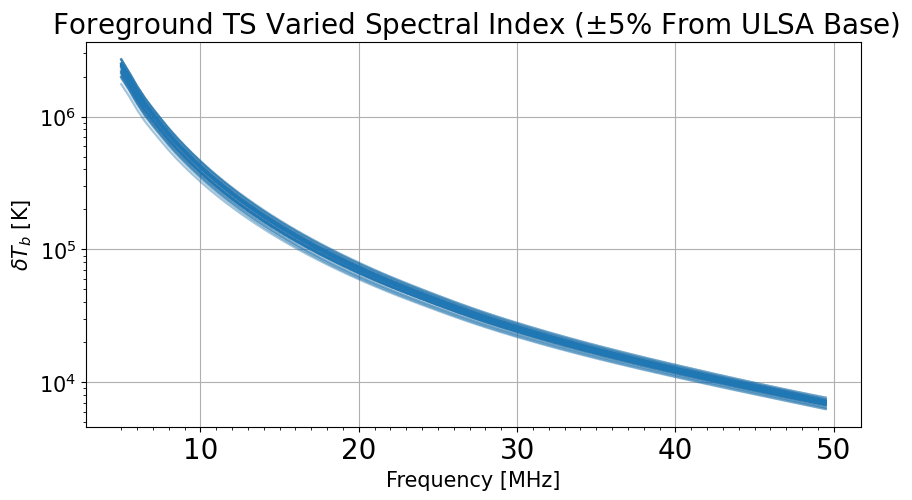

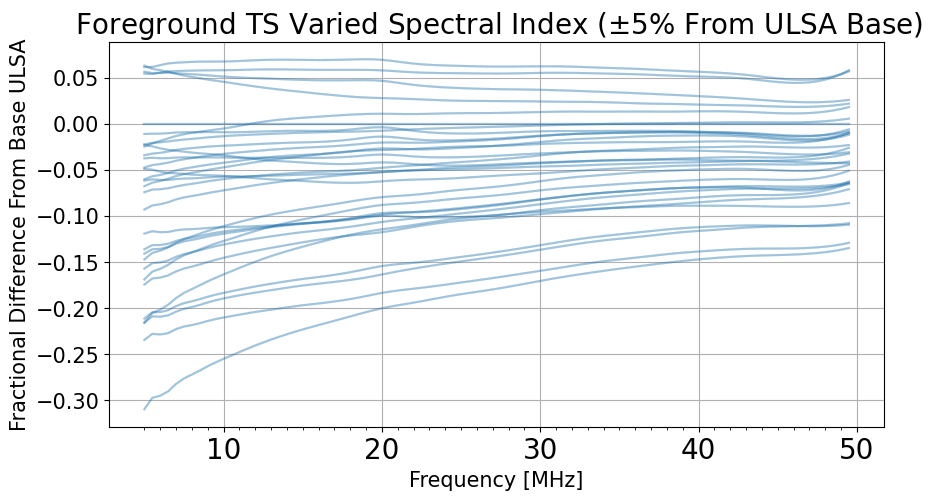

In [ ]:
colors = ["#ff0000","#cc0000","#e69138","#f1c232","#6aa84f","#45818e","#3c78d8","#3d85c6","#674ea7","#a64d79"]
L = 0
plt.figure(figsize=(10, 5))
for l in np.ones(10).astype(int)*L:    
    for n in range(30):
        plt.plot(frequencies,reduced_training_set[n][l],color="tab:blue",alpha=0.05)
plt.yscale("log")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.title(r" Foreground TS Varied Spectral Index ($\pm 5\%$ From ULSA Base) ", fontsize=20)

plt.figure(figsize=(10, 5))
for l in np.ones(10).astype(int)*L:    
    for n in range(30):
        plt.plot(frequencies,(reduced_training_set[n][l]-reduced_training_set[0][l])/reduced_training_set[0][l],color="tab:blue",alpha=0.05)
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"Fractional Difference From Base ULSA",fontsize=15)
plt.grid()
plt.title(r" Foreground TS Varied Spectral Index ($\pm 5\%$ From ULSA Base) ", fontsize=20)


Text(0.5, 1.0, ' Foreground TS Varied Spectral Index ($\\pm 5\\%$ From LST0) ')

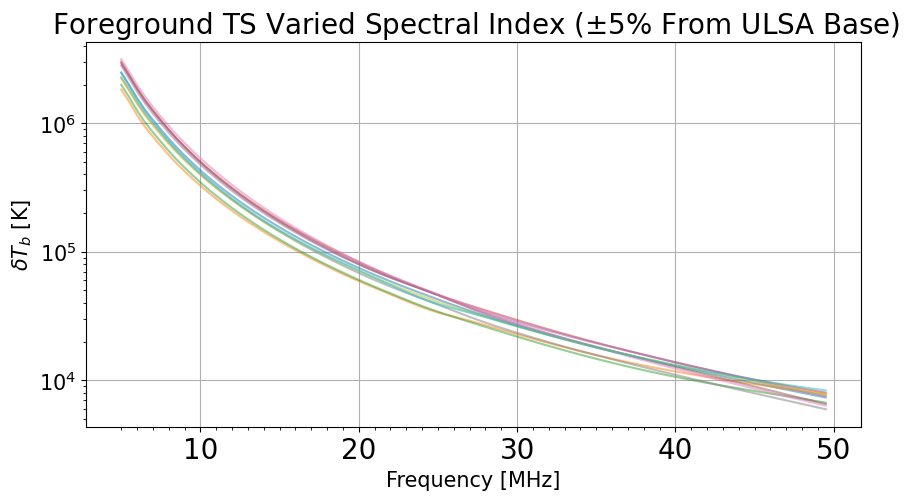

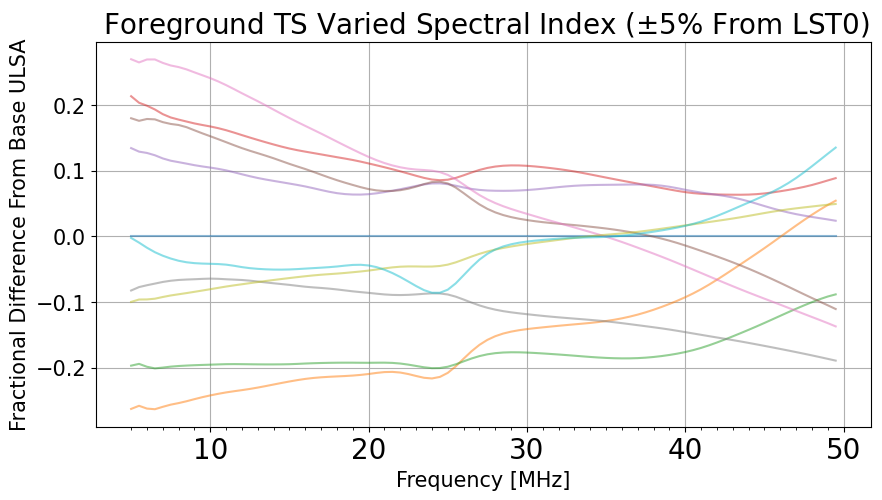

In [ ]:
colors = ["#ff0000","#cc0000","#e69138","#f1c232","#6aa84f","#45818e","#3c78d8","#3d85c6","#674ea7","#a64d79"]
L = 0
plt.figure(figsize=(10, 5))
n=0
for l in range(10):    

    plt.plot(frequencies,RegBWFG_10LST_TS[n][l],alpha=0.5)
plt.yscale("log")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.title(r" Foreground TS Varied Spectral Index ($\pm 5\%$ From ULSA Base) ", fontsize=20)

plt.figure(figsize=(10, 5))
for l in range(10):   
    plt.plot(frequencies,(RegBWFG_10LST_TS[n][l]-RegBWFG_10LST_TS[0][0])/RegBWFG_10LST_TS[0][0],alpha=0.5)
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"Fractional Difference From Base ULSA",fontsize=15)
plt.grid()
plt.title(r" Foreground TS Varied Spectral Index ($\pm 5\%$ From LST0) ", fontsize=20)


The MetaFitter chose 486 systematics terms based on DIC minimization.
The MetaFitter chose 4 signal terms based on DIC minimization.
22.065343766901822 Chi Squared
1446.7213931288761 Psi Squared


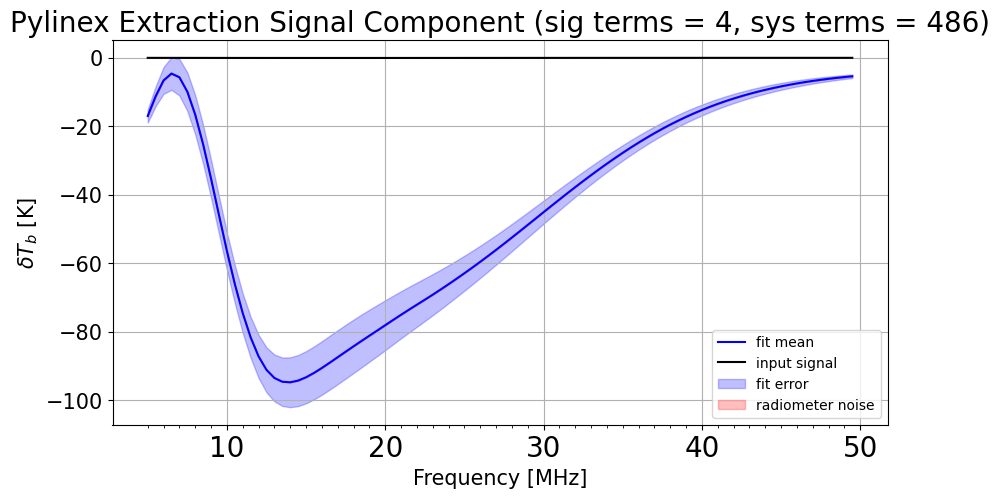

In [ ]:
test_single_extraction= py21cmsig.pylinex_extraction(test_case_10LSTs,signal_training_set,data,noise,signal,frequencies,multi_spectra=True,num_sys_vectors=900,num_sig_vectors=200,num_basis_vectors=900)

#### Static Monochromatic Beam: Might be What We Use For The First Paper
We'll use an extraction based on a monchromatic beam with 10LSTs and a new spectral index foreground model. Lots to change, so let's get to it.

##### Pylinex Extraction Part

100%|██████████| 1000/1000 [00:00<00:00, 64886.12it/s]


The MetaFitter chose 51 systematics terms based on DIC minimization.
The MetaFitter chose 1 signal terms based on DIC minimization.
0.9750956056926811 Chi Squared
0.9449753178256713 Psi Squared


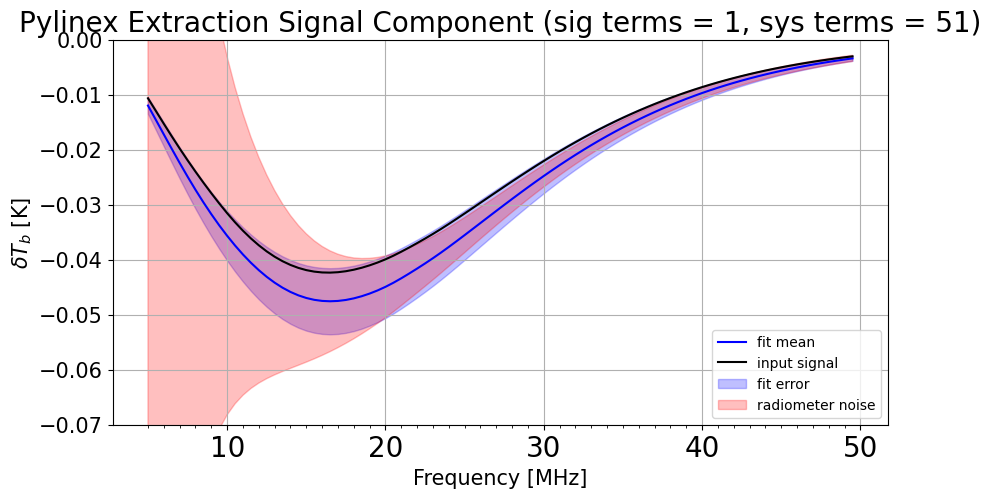

In [ ]:
# Important variables:
n_LSTs = 10 # this should match the number of foreground_training_sets you've made
## Spectral Index Map Variable
n_regions = 8   # number of regions that are created for your multi-region model
temp1 = 10     # lower frequency that is used for the temperature for the spectral index of the spectral index map
temp2 = 50     # upper frequency
f_low = temp1   # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
f_high = temp2  # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
NSIDE = 32
## Monochromatic Beam Variables.
N_beam = 1   # Number of beams to create. I'm not varying the beam right now, but this may be helpful later.
low_std = 0.4
high_std = 1
## Synchrotron Foreground Variables
ylim = (-0.07,0)
N_TS = 1000   # Number of curves in the training set
parameter_variation = [0,0.05,0]
sky_maps = master_foreground_array
sky_maps_truncated = sky_maps[:,4:49,:]  # the trucated sky maps that map the frequency range of frequencies (though it may not match the number of bins)
frequency_range_truncated = np.arange(5,50)  # Truncated frequency range that matches the sky map frequencies
# Pylinex Extraction Variables
N_extractions = 100
num_sig_vectors = 4   # maximum number of signal modes to use in the extractions
num_sys_vectors = 200    # maximum number of systematic modes to use in the extraction
num_basis_vectors = 200  # number of basis vectors to create for the root bases (make sure its as big as the largest num_sys or num_sig_vectors number)
## signal that is used as the input to the observation data: ##
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0/h**2],[H0,0]])
input_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)[0][0][8:] # fiducial signal
##  ##
signal_training_set = lambdaCDM_training_set[:,16::2]  ### indexing is needed to get it into the correct shape for the extraction. Training set used in the pylinex fit


# Step 1: Create the spectral index map that will govern the B_values of the beam (since they govern the indices of the regions).
# NPIX = hp.nside2npix(NSIDE)
# spectral_maps = np.zeros((n_LSTs,NPIX))
# for l in range(n_LSTs):
#     spectral_map = py21cmsig.spectral_index_map(f_low,f_high,n_regions,temp1,temp2,NSIDE,ULSA_direction_32 = master_foreground_array[l])
#     spectral_maps[l] = spectral_map

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","w")
# f.create_dataset("spectral maps",data=spectral_maps)
# f.close()

if NSIDE != 32:
    raise ValueError ("The saved spectral maps are only 32 bit right now.")
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","r")
spectral_maps = np.array(hdf5["spectral maps"])   # I'v visually varified that these make sense


# Step 2: Create the monochromatic beam

# monochromatic_gaussian_B_values = py21cmsig.create_monochromatic_gaussian_beam_training_set(frequencies,N_beam,[low_std,high_std],n_LSTs,n_regions,NSIDE,spectral_maps,plot_extremes = True)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","w")
# f.create_dataset("B values",data=monochromatic_gaussian_B_values[0])
# f.create_dataset("parameters",data=monochromatic_gaussian_B_values[1])
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","r")
monochromatic_gaussian_B_values = np.array(hdf5["B values"])   # I've visually varified that these make sense
monochromatic_gaussian_parameters = np.array(hdf5["parameters"])
if len(frequencies) != monochromatic_gaussian_B_values[0][0].shape[0]:
    raise ValueError ("Your loaded B_values do not have the same length as your frequencies. This will cause problems later")

# Step 3: Create the beam-weighted foreground training set:
## Step 3a: Create the BTS_curves to input to the foreground function:

# print("NOTE: The B_values must be massaged into a form that fits the frequency bins of the sky maps. In this case I've massaged the 90 bin B_values to fit the 45 bin sky maps")
# B_values_massaged = monochromatic_gaussian_B_values[:,:,::2,:]  ### NOTE: the ::2 allows the 90 frequency bin B_values to match the 45 frequency bins of the sky maps
# BTS_curves_monochromaticbeam = create_BTS_curves(frequencies,frequency_range_truncated,B_values_massaged,sky_maps_truncated,n_regions,spectral_index_map,n_LSTs)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","w")
# f.create_dataset("curves",data=BTS_curves_monochromaticbeam)
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","r")
BTS_curves_monochromaticbeam = np.array(hdf5["curves"])   # I've visually varified that these make sense

# simulated_foreground_array sets the "true sky" observations that will be compared to the training sets for the extraction. It's your data, basically. 
parameter_variation_true = [0,0,0]   
simulated_foreground_array_10LSTs = np.zeros((n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    simulated_foreground_array_10LSTs[l,:] = synchrotron_foreground_updated_given_Bvalues(1,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation_true,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

# The systematics training set itself
monochro_beam_TS_10LSTs = np.zeros((N_TS,n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    monochro_beam_TS_10LSTs[:,l,:] = synchrotron_foreground_updated_given_Bvalues(N_TS,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

static_monchrome_beam_simulation=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs,input_signal,N_antenna,dnu,dt)

# Pylinex Extractions
data=static_monchrome_beam_simulation[0]
noise = static_monchrome_beam_simulation[5]
signal = static_monchrome_beam_simulation[1]
systematics = static_monchrome_beam_simulation[2]
# test_extraction_static_monochrome = py21cmsig.extraction_statistics(N_extractions,monochro_beam_TS_10LSTs,signal_training_set,data,noise,signal,systematics,\
#                                                   frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
#                                                     title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
#                                                         num_basis_vectors=num_basis_vectors,ylim=ylim,sigma_plot = 1)

single_extraction_monochromatic = py21cmsig.pylinex_extraction(monochro_beam_TS_10LSTs,signal_training_set,data,noise,signal,frequencies,\
                                                               multi_spectra=True,num_sig_vectors=2,num_sys_vectors=num_sys_vectors,num_basis_vectors=num_basis_vectors,ylim=ylim)





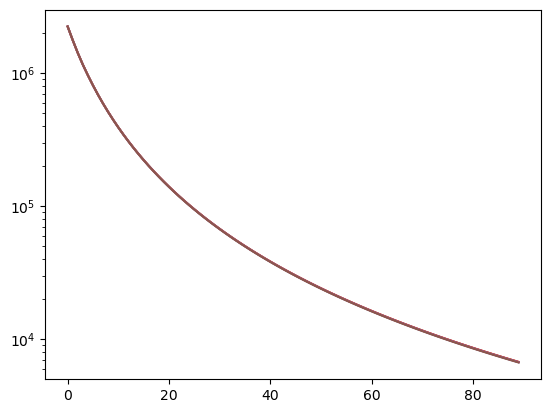

In [ ]:
plt.plot(single_extraction_monochromatic[0].data[0:90])
plt.plot(single_extraction_monochromatic[0].data[90:180])
plt.plot(single_extraction_monochromatic[0].data[90*2:9*3])
plt.plot(single_extraction_monochromatic[0].data[90*3:90*4])
plt.plot(single_extraction_monochromatic[0].data[90*4:90*5])
plt.plot(single_extraction_monochromatic[0].data[90*5:90*6])
plt.yscale("log")

The MetaFitter chose 52 systematics terms based on DIC minimization.
The MetaFitter chose 1 signal terms based on DIC minimization.
1.0224688558574804 Chi Squared
0.9893676454717781 Psi Squared


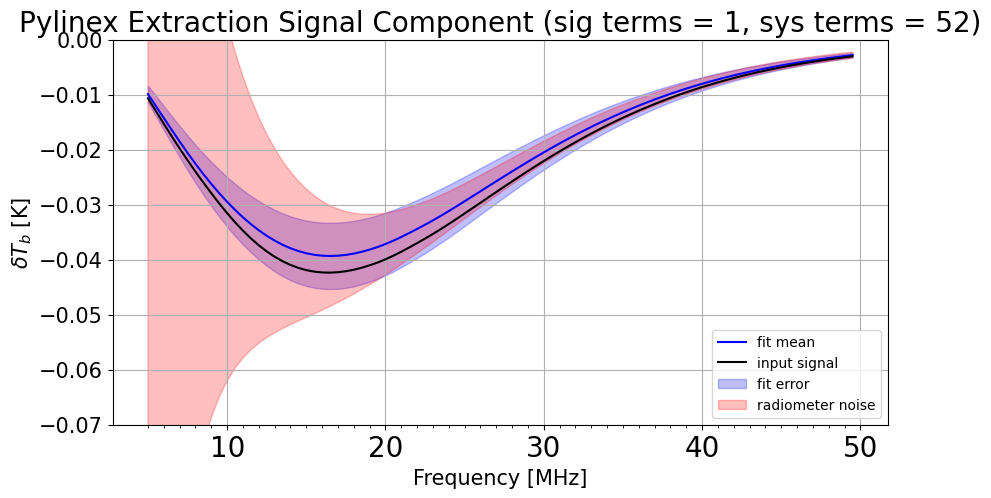

In [ ]:
single_extraction_monochromatic = py21cmsig.pylinex_extraction(monochro_beam_TS_10LSTs,signal_training_set,data,noise,signal,frequencies,\
                                                               multi_spectra=True,num_sig_vectors=2,num_sys_vectors=num_sys_vectors,num_basis_vectors=num_basis_vectors,ylim=ylim)


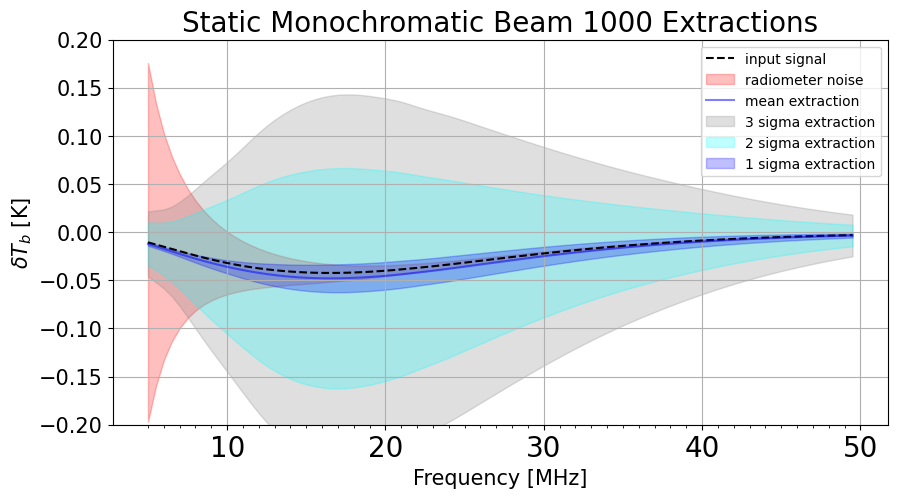

In [ ]:
noise = static_monchrome_beam_simulation[5]
signal = static_monchrome_beam_simulation[1]
plot_extraction_array(frequencies,signal,noise[0],test_extraction_static_monochrome[0],test_extraction_static_monochrome[7],title = "Static Monochromatic Beam",ylim=ylim)

##### MCMC Part

In [ ]:
## Let's start reverse engineering Joshua's code:
iterations = 100   # number of least square iterations to perform


extraction = single_extraction_monochromatic
# these set the error for the density parameters
omM0h2sigma = 0.0011
omB0h2sigma = 0.00015

curve_number = 0
sigma_range = 100


lst_bins = 10
frequencies = frequencies
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/least_squares_monochrome_100iterations'

signal_training_set_file_name = ''

# Let's make our signal training set and function:
signal_training_set = lambdaCDM_training_set[:,16::2]  # hopefully this doesn't need the exact format of TrainingSetCreator. Won't be too terrible to massage it into that format, but it would be very annoying.
signal_expander = RepeatExpander(lst_bins)
signal_model = perses.models.LambdaCDMModel(frequencies, in_Kelvin=True)
signal_model = ExpandedModel(signal_model, signal_expander)
model_names = ['signal', 'systematics']

# loads the foreground training set
fg_training_set = monochro_beam_TS_10LSTs
fg_training_set = np.reshape(fg_training_set, (len(fg_training_set), -1)) # this shapes it into the correct shape for th TrainedBasis pylinex class

# signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(omM0h2-omM0h2sigma*sigma_range, omM0h2+omM0h2sigma*sigma_range)) # omM0
distribution_list.add_distribution(UniformDistribution(omB0h2-omB0h2sigma*sigma_range, omB0h2+omB0h2sigma*sigma_range)) # omB0

# I don't need this conditional expression
# condition_expression = Expression(\
# 	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
# 	num_arguments=3, import_strings=['import numpy as np'])

# condition_distribution = UniformConditionDistribution(condition_expression)

# prior = WindowedDistribution(distribution_list, condition_distribution)

prior = distribution_list
bounds = {\
	'omM0h2': (omM0h2-omM0h2sigma*sigma_range, omM0h2+omM0h2sigma*sigma_range),\
	'omB0h2': (omB0h2-omB0h2sigma*sigma_range, omB0h2+omB0h2sigma*sigma_range),\
	}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 

# forecast_files = h5py.File(forecast_file_path,'r')
# forecaster = Forecaster(forecast_file_path)
# error = forecast_files['error'][()]
# data = forecast_files['data'][()][curve_number]    # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
# input_signal = forecast_files['input_curves/signal'][0] # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
# num_linear_fg_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['systematics'].num_basis_vectors

# non forecaster version
fitter = extraction[0]
bases = extraction[1]
error = fitter.error 
data = fitter.data
input_signal = input_signal  # from the pylinex extraction cell above
num_linear_fg_terms = fitter.sizes["systematics"]

# #FG Model and Training Set for Full Data

fg_trained_basis = bases[1]
fg_trained_basis.generate_gaussian_prior(diagonal=True)
fg_priors = fg_trained_basis.gaussian_prior
fg_basis_model = BasisModel(fg_trained_basis)
models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.

full_data_model = SumModel(model_names, models)
fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'systematics', prior=fg_priors)
full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.
num_linear_sig_terms = fitter.sizes["signal"]
linear_fit_parameter_covariance = fitter.subbasis_parameter_covariance("signal")
linear_fit_parameter_mean = fitter.subbasis_parameter_mean("signal")
num_linear_signal_terms = fitter.sizes["signal"]
signal_trained_basis = bases[0]
projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)
signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_path,\
	**bounds)

least_square_fitter.run(iterations=iterations, attempt_threshold=100,\
	run_if_iterations_exist=False,verbose=True)

# This is the covariance code:
covariance = np.cov(np.array(least_square_fitter.argmins).T)

# This probably needs to include the covariance rather than just an identity. Maybe the MCMC fitter deals with this?
guess_distribution = GaussianDistribution(least_square_fitter.argmin, covariance)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])

guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

Computing Least Square Fit...
Starting iteration #1 of LeastSquareFitter at Tue Mar  3 09:25:57 2026.
Starting iteration #2 of LeastSquareFitter at Tue Mar  3 09:26:01 2026.
Starting iteration #3 of LeastSquareFitter at Tue Mar  3 09:26:01 2026.
Starting iteration #4 of LeastSquareFitter at Tue Mar  3 09:26:02 2026.
Starting iteration #5 of LeastSquareFitter at Tue Mar  3 09:26:05 2026.
Starting iteration #6 of LeastSquareFitter at Tue Mar  3 09:26:07 2026.
Starting iteration #7 of LeastSquareFitter at Tue Mar  3 09:26:08 2026.
Starting iteration #8 of LeastSquareFitter at Tue Mar  3 09:26:08 2026.
Starting iteration #9 of LeastSquareFitter at Tue Mar  3 09:26:10 2026.
Starting iteration #10 of LeastSquareFitter at Tue Mar  3 09:26:17 2026.
Starting iteration #11 of LeastSquareFitter at Tue Mar  3 09:26:19 2026.
Starting iteration #12 of LeastSquareFitter at Tue Mar  3 09:26:21 2026.
Starting iteration #13 of LeastSquareFitter at Tue Mar  3 09:26:23 2026.
Starting iteration #14 of Leas

100%|██████████| 1/1 [00:00<00:00,  9.76it/s]
/tmp/ipykernel_1557/1966826897.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=20)


<Axes: title={'center': 'Least square fit parameter histogram'}, xlabel='omB0h2', ylabel='# of occurrences'>

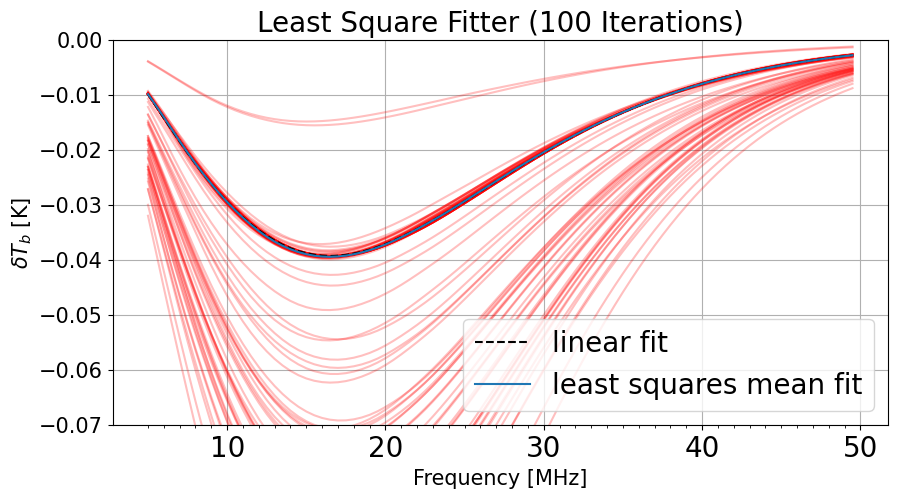

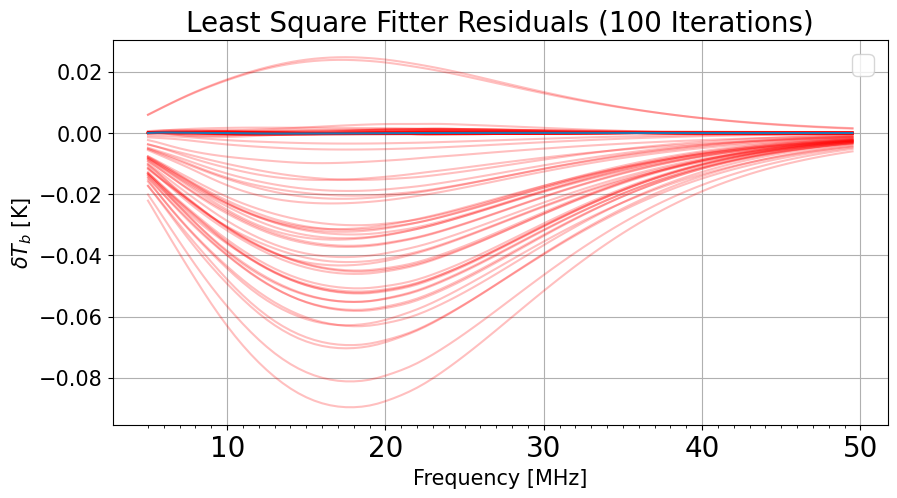

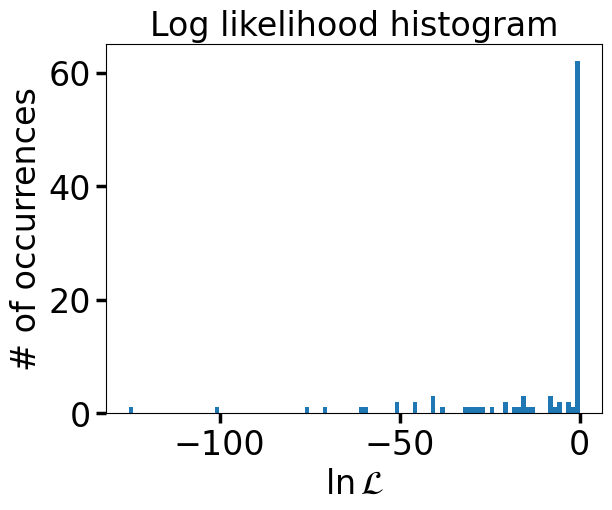

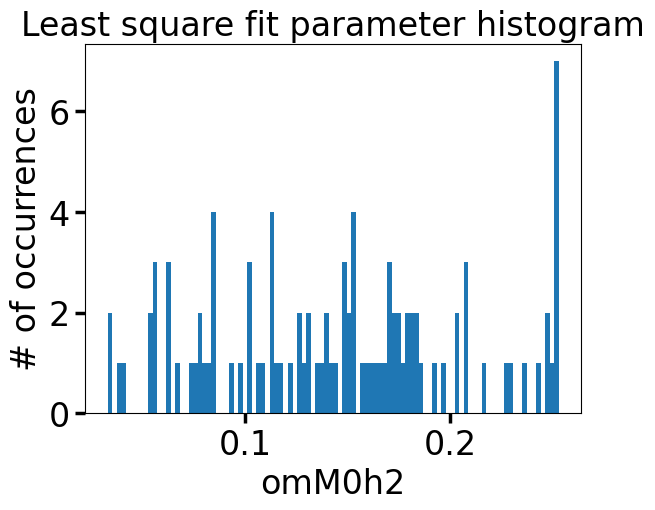

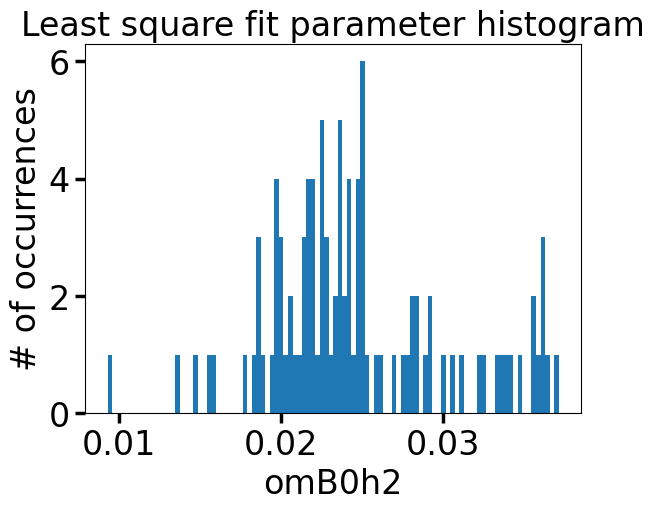

In [ ]:
# Plots all the useful information for the 

plt.figure(figsize=(10, 5))
parameter_max = np.array([[omR0,0],[omM0h2+omM0h2sigma*sigma_range,0],[omK0,0],[1-omM0,0],[omB0h2-omB0h2sigma*sigma_range,0],[H0,0]])
parameter_min = np.array([[omR0,0],[omM0h2-omM0h2sigma*sigma_range,0],[omK0,0],[1-omM0,0],[omB0h2+omB0h2sigma*sigma_range,0],[H0,0]])
parameter_argmin = np.array([[omR0,0],[least_square_fitter.argmin[0],0],[omK0,0],[1-omM0,0],[least_square_fitter.argmin[1],0],[H0,0]])
for n in np.arange(iterations):
    parameters = np.array([[omR0,0],[least_square_fitter.argmins[n][0],0],[omK0,0],[1-omM0,0],[least_square_fitter.argmins[n][1],0],[H0,0]])
    plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
# plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::],\
#                  py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::],color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
plt.plot(frequencies,fitter.subbasis_channel_mean("signal"),color="black",ls="--",label = "linear fit")
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_argmin,1)[0][0][8::],color="tab:blue",label="least squares mean fit")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter ({iterations} Iterations)", fontsize=20)
plt.ylim(-0.07,0)
plt.grid()
plt.legend(fontsize=20)


## Residuals
plt.figure(figsize=(10, 5))
for n in np.arange(iterations):
    parameters = np.array([[omR0,0],[least_square_fitter.argmins[n][0],0],[omK0,0],[1-omM0,0],[least_square_fitter.argmins[n][1],0],[H0,0]])
    plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::]-fitter.subbasis_channel_mean("signal"),color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
# plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::]-fitter.subbasis_channel_mean("signal"),\
#                 py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::]-fitter.subbasis_channel_mean("signal"),color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
# plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_argmin,1)[0][0][8::]-fitter.subbasis_channel_mean("signal"),color="tab:blue")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter Residuals ({iterations} Iterations)", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

least_square_fitter.plot_loglikelihood_histogram(bins=100)
least_square_fitter.plot_parameter_histogram("omM0h2",bins=100)
least_square_fitter.plot_parameter_histogram("omB0h2",bins=100)

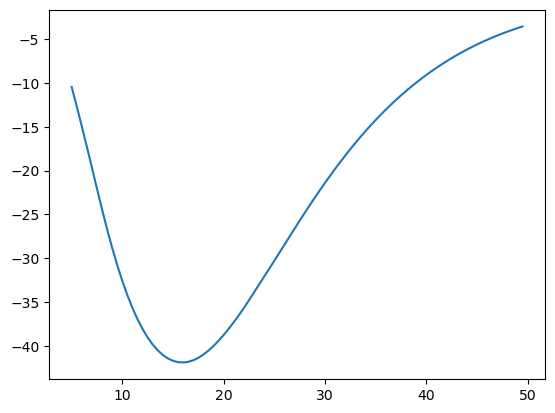

In [ ]:
test_model=perses.models.LambdaCDMModel(frequencies)
parameters_test = np.array([0.03,0.0153])
plt.plot(frequencies,test_model(parameters_test))

In [ ]:
# number of MCMC chains being iterated together
num_walkers = 10
# number of checkpoints in the MCMC chain
checkpoints = 10

# Just a reminder of what we got from the least square fitter:
# least_square_fitter.run(iterations=100, attempt_threshold=100,\
# 	run_if_iterations_exist=False)

# guess_distribution = GaussianDistribution(least_square_fitter.argmin,\
# 	np.identity(signal_model.num_parameters))

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

# guess_distribution_set =\
# 	DistributionSet([(guess_distribution, signal_model.parameters, None)])

# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

## here are some variables we need to define for the Sampler (the MCMC proper)

# file name of the hdf5 file
file_name = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome_10walks_100checkpoints'




# likelihood to explore (I'm hoping it's the same as the least square fitter)
loglikelihood = full_loglikelihood  # NOTE: you'll have to run the least square fitter to populate this variable

# JuimpingDistributionSet object that defines where the MCMC is allowed to jump from a starting point. 
# I don't fully understand what this does right now, but we'll explore it

# guess_distribution = GaussianDistribution(least_square_fitter.argmin,\    
# 	np.identity(signal_model.num_parameters))

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

# guess_distribution_set =\
# 	DistributionSet([(guess_distribution, signal_model.parameters, None)])

jumping_distribution = GaussianJumpingDistribution(covariance)


jumping_distribution_set = JumpingDistributionSet([(jumping_distribution, signal_model.parameters)])
jumping_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))


#DistributionSet object that governs the initial guesses. Created from the linear least squares you should have just done before this.
guess_distribution_set = guess_distribution_set   # NOTE: comes from the least squares fitter

#Optional DistributionSet object that sets priors on your parameters Created from the linear least squares you should have just done before this
prior_distribution_set = prior_distribution_set    # NOTE: comes from the least squares fitter

# print the time after each checkpoint
verbose = True

# restart_mode seems handy (take a look at the documentation under Sampler.py in pylinex/nonlinear). Going to ignore it for now.

Sampler_monochrome = Sampler(file_name,num_walkers,loglikelihood,jumping_distribution_set=jumping_distribution_set, guess_distribution_set=guess_distribution_set,prior_distribution_set=prior_distribution_set,verbose=verbose)
Sampler_monochrome.run_checkpoints(checkpoints)

Starting checkpoint #1 at Sun Mar  1 17:28:11 2026.
Finished checkpoint #1 at Sun Mar  1 17:29:36 2026.
Finished checkpoint #2 at Sun Mar  1 17:30:56 2026.
Finished checkpoint #3 at Sun Mar  1 17:32:10 2026.
Finished checkpoint #4 at Sun Mar  1 17:33:26 2026.
Finished checkpoint #5 at Sun Mar  1 17:34:45 2026.
Finished checkpoint #6 at Sun Mar  1 17:35:58 2026.
Finished checkpoint #7 at Sun Mar  1 17:37:07 2026.
Finished checkpoint #8 at Sun Mar  1 17:38:20 2026.
Finished checkpoint #9 at Sun Mar  1 17:39:35 2026.
Finished checkpoint #10 at Sun Mar  1 17:40:44 2026.
Finished checkpoint #11 at Sun Mar  1 17:42:02 2026.
Finished checkpoint #12 at Sun Mar  1 17:43:52 2026.
Finished checkpoint #13 at Sun Mar  1 17:45:52 2026.
Finished checkpoint #14 at Sun Mar  1 17:47:55 2026.
Finished checkpoint #15 at Sun Mar  1 17:49:47 2026.
Finished checkpoint #16 at Sun Mar  1 17:51:15 2026.
Finished checkpoint #17 at Sun Mar  1 17:52:42 2026.
Finished checkpoint #18 at Sun Mar  1 17:54:13 2026.
Fin

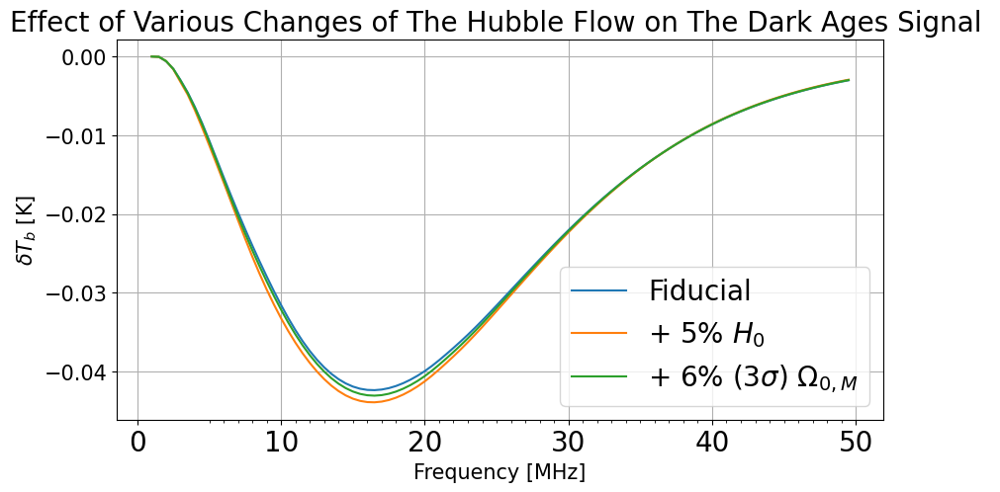

In [ ]:
plt.figure(figsize=(10, 5))

plt.plot(np.arange(1,50,0.5),lambdaCDM_training_set_CMB0[0][0],label=r"Fiducial")
plt.plot(np.arange(1,50,0.5),lambdaCDM_training_set_CMB00[0][0],label=r"+ 5% $H_0$")
plt.plot(np.arange(1,50,0.5),lambdaCDM_training_set_CMB000[0][0],label=r"+ 6% ($3\sigma$) $\Omega_{0,M}$")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Effect of Various Changes of The Hubble Flow on The Dark Ages Signal ", fontsize=20)
plt.grid()
plt.legend(fontsize=20)

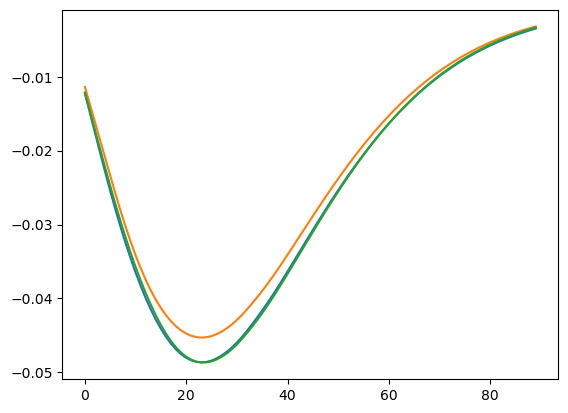

In [ ]:
plt.plot((bases[0].basis[0]*linear_fit_parameter_mean[0])[0:90])
plt.plot(signal_model([test_Fitter.parameter_mean[0],test_Fitter.parameter_mean[1]])[0:90])
plt.plot(signal_model([least_square_fitter.argmin[0],least_square_fitter.argmin[1]])[0:90])

In [ ]:
test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome_10walks_100checkpoints')

(array([0.01235208, 0.01826111, 0.02417014]),
 [Text(0.012352077026560594, 0, '0.0124'),
  Text(0.018261110571188868, 0, '0.0183'),
  Text(0.02417014411581714, 0, '0.0242')])

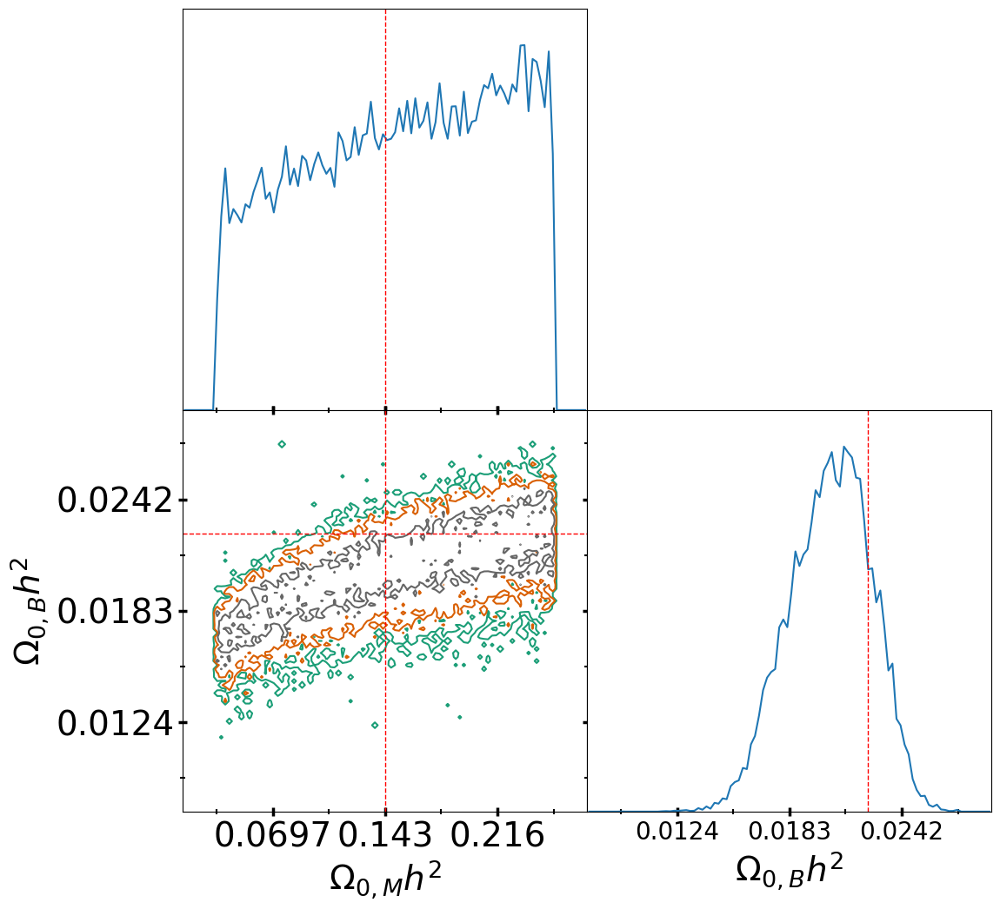

In [ ]:
# Plots the results of the MCMC attempting to fit the data:
test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome_10walks_100checkpoints')
reference_value_mean = [omM0h2,omB0h2]
#reference_value_covariance = np.array([[omM0h2sigma**2,omM0h2sigma*omB0h2sigma],[omM0h2sigma*omB0h2sigma,omB0h2sigma**2]])
reference_value_covariance = None
contour_confidence_levels = 0.68,0.95,0.997
def parameter_renamer(parameter):
    if parameter == "signal_omM0h2":
        parameter1 = r"$\Omega_{0,M} h^2$"
    else:
        parameter1 = r"$\Omega_{0,B} h^2$"
    return parameter1
test_Fitter.triangle_plot(nbins=100,parameter_renamer=parameter_renamer,reference_value_mean=reference_value_mean,reference_value_covariance=reference_value_covariance,contour_confidence_levels=contour_confidence_levels)
plt.xticks(size=20)

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        6.000e+00, 2.000e+00, 3.000e+00, 2.000e+00, 1.300e+01, 2.000e+00,
        2.200e+01, 6.000e+00, 7.000e+00, 9.000e+00, 3.000e+00, 4.800e+01,
        2.500e+01, 3.600e+01, 3.100e+01, 3.900e+01, 8.100e+01, 1.240e+02,
        9.600e+01, 1.140e+02, 2.460e+02, 2.230e+02, 2.670e+02, 3.410e+02,
        4.050e+02, 3.730e+02, 6.530e+02, 6.200e+02, 7.950e+02, 9.120e+02,
        1.144e+03, 1.198e+03, 1.192e+03, 1.391e+03, 1.490e+03, 1.594e+03,
        1.718e+03, 1.692e+03, 1.929e+03, 2.385e+03, 2.078e+03, 2.323e+03,
        2.319e+03, 2.364e+03, 2.577e+03, 2.740e+03, 2.971e+03, 2.888e+03,
        3.101e+03, 3.111e+03, 3.263e+03, 2.902e+03, 2.871e+03, 3.090e+03,
        3.424e+03, 3.191e+03, 3.196e+03, 2.989e+03, 3.034e+03, 2.820e+03,
        2.540e+03, 2.159e+03, 2.120e+03, 2.048e+03, 1.944e+03, 1.780e+03,
        1.600e+03, 1.267e+03, 1.354e+0

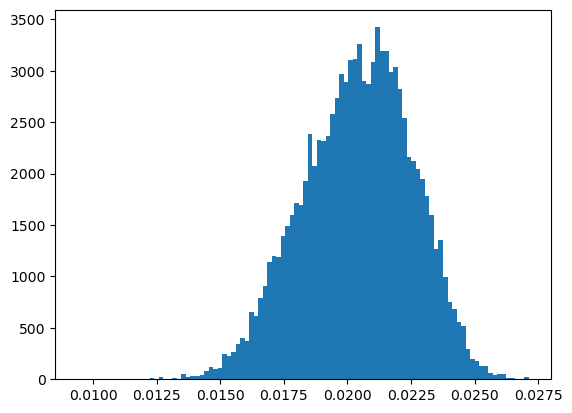

In [ ]:
plt.hist(test_Fitter.chain[:,:,1][np.arange(10),:].flatten(),bins=100)

In [ ]:
test_Fitter.prior_distribution_set.minimum["signal_omM0h2"]

{'signal_omM0h2': 0.03299999999999999, 'signal_omB0h2': 0.0073700000000000015}

(array([0.0202843 , 0.02547709, 0.03066989]),
 [Text(0.020284296968191628, 0, '0.0203'),
  Text(0.025477092994851073, 0, '0.0255'),
  Text(0.030669889021510518, 0, '0.0307')])

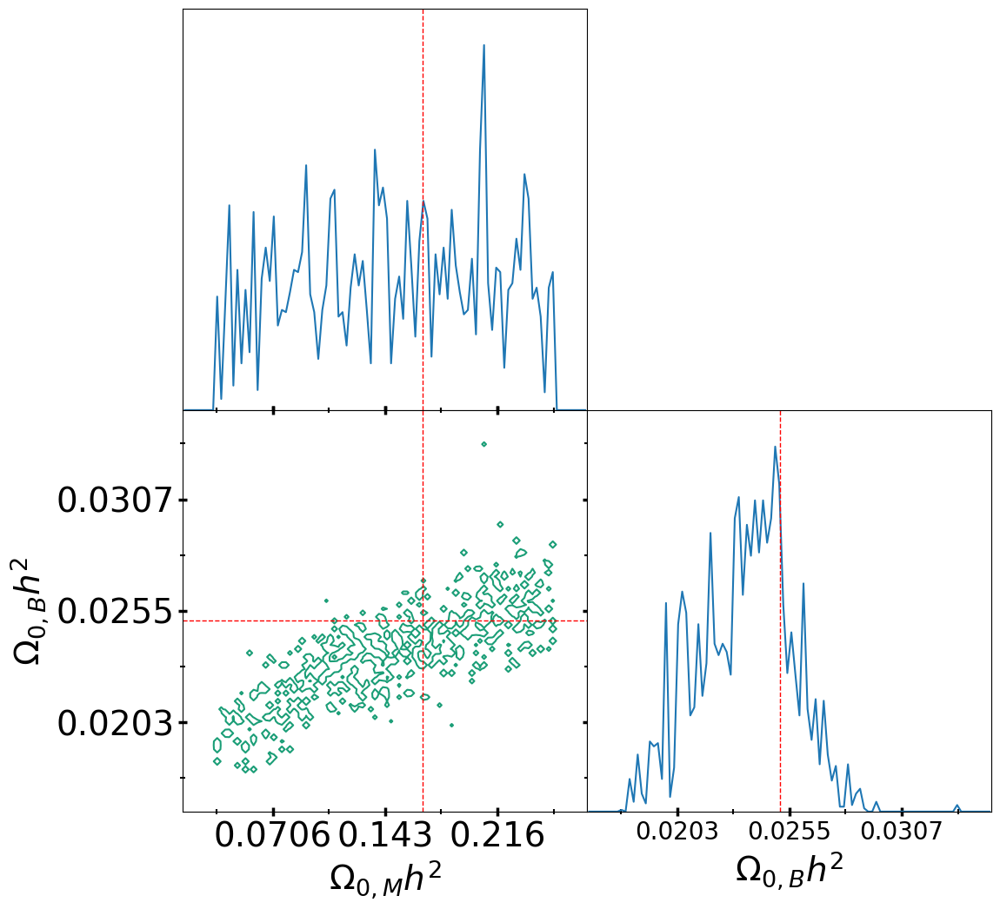

In [ ]:
# Plots the results of the MCMC attempting to fit the data:
test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome')
reference_value_mean = [least_square_fitter.argmin[0],least_square_fitter.argmin[1]]
#reference_value_covariance = np.array([[omM0h2sigma**2,omM0h2sigma*omB0h2sigma],[omM0h2sigma*omB0h2sigma,omB0h2sigma**2]])
reference_value_covariance = None
contour_confidence_levels = 0.95
def parameter_renamer(parameter):
    if parameter == "signal_omM0h2":
        parameter1 = r"$\Omega_{0,M} h^2$"
    else:
        parameter1 = r"$\Omega_{0,B} h^2$"
    return parameter1
test_Fitter.triangle_plot(nbins=100,parameter_renamer=parameter_renamer,reference_value_mean=reference_value_mean,reference_value_covariance=reference_value_covariance,contour_confidence_levels=contour_confidence_levels)
plt.xticks(size=20)

##### Exotic Model (DarkMatterDecay)

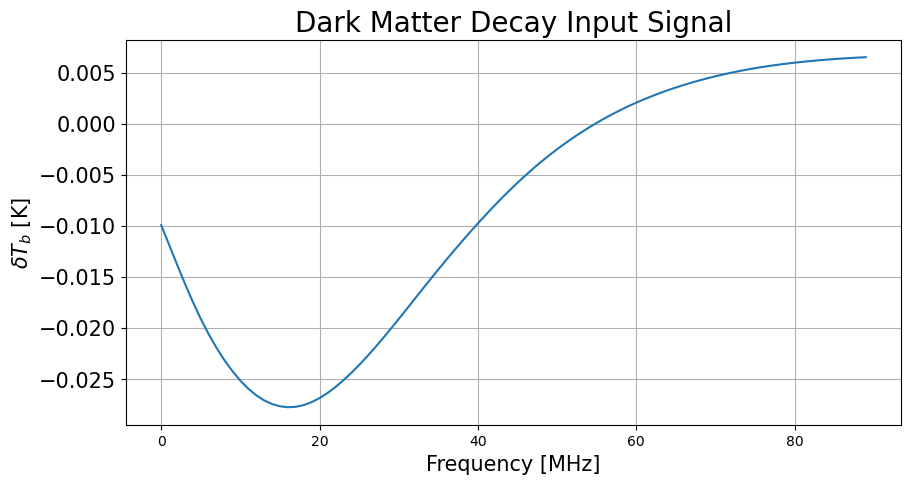

In [ ]:

plt.figure(figsize=(10, 5))

plt.plot(DMD_training_set_curves[0,::2])  
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(r"Dark Matter Decay Input Signal", fontsize=20)
plt.grid()

###### PYLINEX Portion

100%|██████████| 1000/1000 [00:00<00:00, 70332.93it/s]


The MetaFitter chose 61 systematics terms based on DIC minimization.
The MetaFitter chose 1 signal terms based on DIC minimization.
1.0409783659736764 Chi Squared
1.0490435761388597 Psi Squared


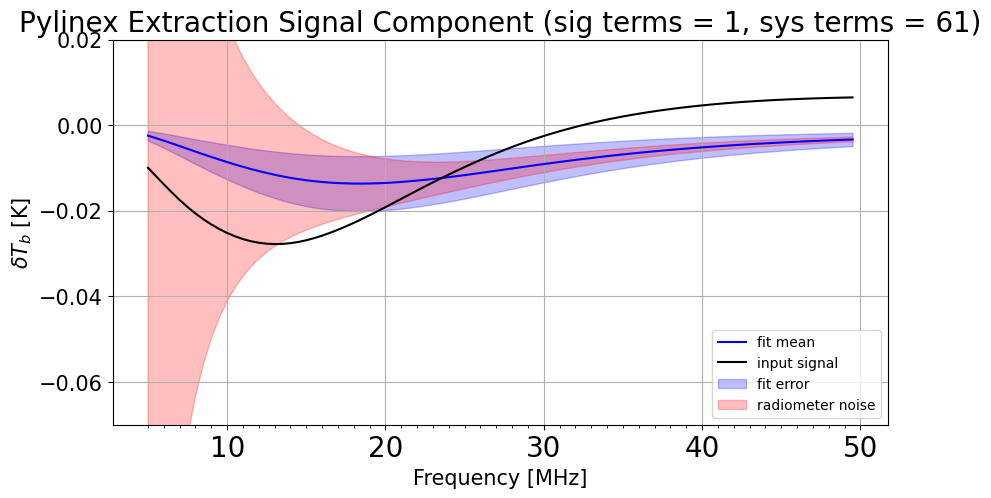

In [ ]:
# Important variables:
n_LSTs = 10 # this should match the number of foreground_training_sets you've made
## Spectral Index Map Variable
n_regions = 8   # number of regions that are created for your multi-region model
temp1 = 10     # lower frequency that is used for the temperature for the spectral index of the spectral index map
temp2 = 50     # upper frequency
f_low = temp1   # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
f_high = temp2  # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
NSIDE = 32
## Monochromatic Beam Variables.
N_beam = 10000   # Number of beams to create. I'm not varying the beam right now, but this may be helpful later.
low_std = 0.4
high_std = 1
## Synchrotron Foreground Variables
ylim = (-0.07,0.02)
N_TS = 1000   # Number of curves in the training set
parameter_variation = [0,0.05,0]
sky_maps = master_foreground_array
sky_maps_truncated = sky_maps[:,4:49,:]  # the trucated sky maps that map the frequency range of frequencies (though it may not match the number of bins)
frequency_range_truncated = np.arange(5,50)  # Truncated frequency range that matches the sky map frequencies
# Pylinex Extraction Variables
N_extractions = 100
num_sig_vectors = 4   # maximum number of signal modes to use in the extractions
num_sys_vectors = 200    # maximum number of systematic modes to use in the extraction
num_basis_vectors = 200  # number of basis vectors to create for the root bases (make sure its as big as the largest num_sys or num_sig_vectors number)
## signal that is used as the input to the observation data: ##
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0/h**2],[H0,0]])
input_signal = DMD_training_set_curves[0,::2]
##  ##
signal_training_set = DMD_training_set_curves[:,::2]  ### indexing is needed to get it into the correct shape for the extraction. Training set used in the pylinex fit


# Step 1: Create the spectral index map that will govern the B_values of the beam (since they govern the indices of the regions).
# NPIX = hp.nside2npix(NSIDE)
# spectral_maps = np.zeros((n_LSTs,NPIX))
# for l in range(n_LSTs):
#     spectral_map = py21cmsig.spectral_index_map(f_low,f_high,n_regions,temp1,temp2,NSIDE,ULSA_direction_32 = master_foreground_array[l])
#     spectral_maps[l] = spectral_map

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","w")
# f.create_dataset("spectral maps",data=spectral_maps)
# f.close()

if NSIDE != 32:
    raise ValueError ("The saved spectral maps are only 32 bit right now.")
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","r")
spectral_maps = np.array(hdf5["spectral maps"])   # I'v visually varified that these make sense


# Step 2: Create the monochromatic beam

# monochromatic_gaussian_B_values = py21cmsig.create_monochromatic_gaussian_beam_training_set(frequencies,N_beam,[low_std,high_std],n_LSTs,n_regions,NSIDE,spectral_maps,plot_extremes = True)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","w")
# f.create_dataset("B values",data=monochromatic_gaussian_B_values[0])
# f.create_dataset("parameters",data=monochromatic_gaussian_B_values[1])
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","r")
monochromatic_gaussian_B_values = np.array(hdf5["B values"])   # I've visually varified that these make sense
monochromatic_gaussian_parameters = np.array(hdf5["parameters"])
if len(frequencies) != monochromatic_gaussian_B_values[0][0].shape[0]:
    raise ValueError ("Your loaded B_values do not have the same length as your frequencies. This will cause problems later")

# Step 3: Create the beam-weighted foreground training set:
## Step 3a: Create the BTS_curves to input to the foreground function:

# print("NOTE: The B_values must be massaged into a form that fits the frequency bins of the sky maps. In this case I've massaged the 90 bin B_values to fit the 45 bin sky maps")
# B_values_massaged = monochromatic_gaussian_B_values[:,:,::2,:]  ### NOTE: the ::2 allows the 90 frequency bin B_values to match the 45 frequency bins of the sky maps
# BTS_curves_monochromaticbeam = create_BTS_curves(frequencies,frequency_range_truncated,B_values_massaged,sky_maps_truncated,n_regions,spectral_index_map,n_LSTs)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","w")
# f.create_dataset("curves",data=BTS_curves_monochromaticbeam)
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","r")
BTS_curves_monochromaticbeam = np.array(hdf5["curves"])   # I've visually varified that these make sense

# simulated_foreground_array sets the "true sky" observations that will be compared to the training sets for the extraction. It's your data, basically. 
parameter_variation_true = [0,0,0]   
simulated_foreground_array_10LSTs = np.zeros((n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    simulated_foreground_array_10LSTs[l,:] = synchrotron_foreground_updated_given_Bvalues(1,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation_true,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

# The systematics training set itself
monochro_beam_TS_10LSTs = np.zeros((N_TS,n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    monochro_beam_TS_10LSTs[:,l,:] = synchrotron_foreground_updated_given_Bvalues(N_TS,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

static_monchrome_beam_simulation=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs,input_signal,N_antenna,dnu,dt)

# Pylinex Extractions
data=static_monchrome_beam_simulation[0]
noise = static_monchrome_beam_simulation[5]
signal = static_monchrome_beam_simulation[1]
systematics = static_monchrome_beam_simulation[2]
# test_extraction_static_monochrome = py21cmsig.extraction_statistics(N_extractions,monochro_beam_TS_10LSTs,signal_training_set,data,noise,signal,systematics,\
#                                                   frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
#                                                     title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
#                                                         num_basis_vectors=num_basis_vectors,ylim=ylim)

single_extraction_monochromatic_DMD = py21cmsig.pylinex_extraction(monochro_beam_TS_10LSTs,signal_training_set,data,noise,signal,frequencies,\
                                                               multi_spectra=True,num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,num_basis_vectors=num_basis_vectors,ylim=ylim)





###### Least Squares Portion

###### MCMC Part

##### Exotic Model (Early Dark Energy)

##### Histogram Comparison

#### Example Least Square Fits

### Task: Compare Numerically Derived Error with Analytical Pylinex Error.

100%|██████████| 90/90 [00:00<00:00, 205.10it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 3512.82it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 212.31it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 5555.37it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 212.68it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 4433.73it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 222.36it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 3440.77it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 213.14it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 2467.24it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 211.23it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 2807.43it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 207.19it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 2657.99it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 165.61it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 7133.17it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 198.65it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 2535.85it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 209.50it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 2551.28it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 203.34it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 118.64it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 194.44it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:07<00:00, 125.96it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 199.52it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 118.65it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 194.72it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 116.28it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 206.59it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 119.29it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 222.65it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 124.26it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 188.06it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 123.59it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 207.77it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 124.49it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 203.24it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 121.45it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 211.37it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:07<00:00, 125.73it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 100/100 [19:55<00:00, 11.96s/it]


Maximum bias of the systematics rms is 8.19199308104194
Maximum bias of the signal rms is 8.203649878360034
Average number of systematics terms used for fit: 218.67
Average number of signal terms used for fit: 1.03
Reduced Chi Squared of mean fit: [1.11874758]
Mean Reduced Chi Squared: 1.0673085858980835
STD of Reduced Chi Squared Distribution: 0.05676712877453783
RMS between mean fit and input: 0.02907192505214578


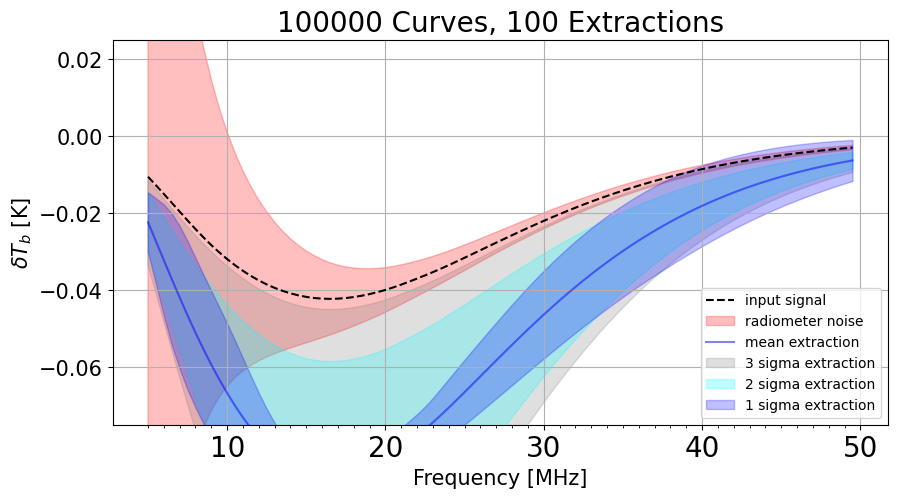

In [ ]:
### This cell get us our numerically derived error (with unfixed terms) ###


# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# Training Sets 10LST for Varied Regolith  # parameters are all the same as varied regolith training set raw params
varied_regolith_TS_raw_10LSTs = np.zeros((10,221,50))
f1 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_TS_raw_10LSTs[0] = f1["Foreground_Training_Set"][:,0,:]
f2 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_2","r")
varied_regolith_TS_raw_10LSTs[1] = f2["Foreground_Training_Set"][:,0,:]
f3 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_3","r")
varied_regolith_TS_raw_10LSTs[2] = f3["Foreground_Training_Set"][:,0,:]
f4 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_4","r")
varied_regolith_TS_raw_10LSTs[3] = f4["Foreground_Training_Set"][:,0,:]
f5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_5","r")
varied_regolith_TS_raw_10LSTs[4] = f5["Foreground_Training_Set"][:,0,:]
f6 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_6","r")
varied_regolith_TS_raw_10LSTs[5] = f6["Foreground_Training_Set"][:,0,:]
f7 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_7","r")
varied_regolith_TS_raw_10LSTs[6] = f7["Foreground_Training_Set"][:,0,:]
f8 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_8","r")
varied_regolith_TS_raw_10LSTs[7] = f8["Foreground_Training_Set"][:,0,:]
f9 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_9","r")
varied_regolith_TS_raw_10LSTs[8] = f9["Foreground_Training_Set"][:,0,:]
f10 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_10","r")
varied_regolith_TS_raw_10LSTs[9] = f10["Foreground_Training_Set"]

# varied regolith beam maps (all sky and normalized)
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]

# fiducial signal
parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2]])
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)[0][0][8:] 

# Monochromatic Gaussian Beams Observations for 10 LSTs
## Interpolate the varied beams to match the rest of the data
varied_regolith_training_set_10LSTs = np.zeros((10,len(varied_regolith_training_set_raw),len(frequencies)))
for l in range(10):
    for n in range(len(varied_regolith_training_set_raw)):
        beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_TS_raw_10LSTs[l][n])
        varied_regolith_training_set_10LSTs[l][n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets        
foreground_example_1_10LSTs = np.zeros((10,len(frequencies)))
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
for l in range(10):
    beam_parameters = np.zeros((3,2))
    percent_range = 0.0000000000000001
    L_low = true_parameters[3]-true_parameters[3]*percent_range
    if L_low < 0.5:
        L_low = 0.5
    L_high = true_parameters[3]+true_parameters[3]*percent_range
    if L_high > 3:
        L_high = 3
    n1_low = true_parameters[4]-true_parameters[4]*percent_range
    if n1_low < 3.2:
        n1_low = 3.2
    n1_high = true_parameters[4]+true_parameters[4]*percent_range
    if n1_high > 4.2:
        n1_high = 4.2
    n2_low = true_parameters[5]-true_parameters[5]*percent_range
    if n2_low < 3.8:
        n2_low = 3.8
    n2_high = true_parameters[5]+true_parameters[5]*percent_range
    if n2_high > 4.8:
        n2_high = 4.8

    beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
    N=1
    Nb=0
    Nf=0
    n_regions = 5
    reference_frequency = 25
    sky_map = master_foreground_array[l]
    beam_sky_training_set = beams[:,5:,:]
    beam_sky_training_set_params = varied_regolith_training_set_raw_params
    STS_data = varied_regolith_training_set_10LSTs[l]
    STS_params = varied_regolith_training_set_raw_params
    show_parameter_ranges = True
    define_parameter_mean = False
    foreground_parameters = np.array([0,0,0])
    parameter_mean = None
    B_value_functions = py21cmsig.B_value_interp(beam_sky_training_set,beam_sky_training_set_params,\
                         frequencies,sky_map,reference_frequency,n_regions)


    foreground_element = py21cmsig.beam_weighted_synchrotron_foreground(n_regions,frequencies,reference_frequency,sky_map, beam_sky_training_set,N,\
                                            beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                                show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
    foreground_example_1_10LSTs[l] = foreground_element[0][0]

# Example of not having enough curves
simple_Fatima_sim=py21cmsig.multi_spectra_simulation_run(frequencies,foreground_example_1_10LSTs,fiducial_signal,N_antenna,dnu,dt)
beam_parameters = np.zeros((3,2))
percent_range = 0.025
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
N_raw=1000000
N = 100000
N_samp = int(np.sqrt(N_raw))**2
Nb=0
Nf=0


test_case_10LSTs_raw = np.zeros((N_samp,10,len(frequencies)))
for l in range(10):
    L_low = true_parameters[3]-true_parameters[3]*percent_range
    if L_low < 0.5:
        L_low = 0.5
    L_high = true_parameters[3]+true_parameters[3]*percent_range
    if L_high > 3:
        L_high = 3
    n1_low = true_parameters[4]-true_parameters[4]*percent_range
    if n1_low < 3.2:
        n1_low = 3.2
    n1_high = true_parameters[4]+true_parameters[4]*percent_range
    if n1_high > 4.2:
        n1_high = 4.2
    n2_low = true_parameters[5]-true_parameters[5]*percent_range
    if n2_low < 3.8:
        n2_low = 3.8
    n2_high = true_parameters[5]+true_parameters[5]*percent_range
    if n2_high > 4.8:
        n2_high = 4.8


    beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
    foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
    # parameter_mean =  true_parameters[0:3]
    n_regions = 5
    reference_frequency = 25
    sky_map = master_foreground_array[l]
    beam_sky_training_set = beams[:,5:,:]
    beam_sky_training_set_params = varied_regolith_training_set_raw_params
    raw_beam_weighted_sky_maps = raw_sky_maps
    STS_data = varied_regolith_training_set_10LSTs[l]
    STS_params = varied_regolith_training_set_raw_params
    show_parameter_ranges = True
    define_parameter_mean = False
    data=simple_Fatima_sim[0]
    B_value_functions = py21cmsig.B_value_interp(beam_sky_training_set,beam_sky_training_set_params,\
                         frequencies,sky_map,reference_frequency,n_regions)
    test_case_element = py21cmsig.beam_weighted_synchrotron_foreground(n_regions,frequencies,reference_frequency,sky_map, beam_sky_training_set,N_raw,\
                                            beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                                show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
    test_case_10LSTs_raw[:,l,:] = test_case_element[0]
    

np.random.shuffle(test_case_10LSTs_raw)
test_case_10LSTs = test_case_10LSTs_raw[0:N]

n_samples_ts_test = 5
n_samples_rn_test = 100
restrict_runs = 0
num_basis_vectors = 1000
num_divisions = 10   
num_sig_vectors = 5
num_sys_vectors = 500
man_sys_terms = 0
man_sig_terms = 0
# tss_Fatima_simp = py21cmsig.extraction_statistics(n_samples_ts_test,test_case_10LSTs,lambdaCDM_training_set[:,16::2],simple_Fatima_sim[0],simple_Fatima_sim[5],simple_Fatima_sim[1],simple_Fatima_sim[2],frequency_array = frequencies,\
#                 num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,IC="BIC",ignore_IC=False, man_sys_terms=man_sys_terms,\
#                     man_sig_terms=man_sig_terms,title=f"{N} Curves,",use_fit_noise=False,training_set_to_test="systematics",test_mode="training set size",\
#                         restrict_runs=0,display_type="cumulative sigmas",priors=False,multi_spectra=True,num_basis_vectors=num_basis_vectors, ylim=(-0.075,0.025))

rn_Fatima_simp1_vhc = py21cmsig.extraction_statistics(n_samples_rn_test,test_case_10LSTs,lambdaCDM_training_set[:,16::2],simple_Fatima_sim[0],simple_Fatima_sim[5],simple_Fatima_sim[1],simple_Fatima_sim[2],frequency_array = frequencies,\
                num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,IC="BIC",ignore_IC=False, man_sys_terms=man_sys_terms,\
                    man_sig_terms=man_sig_terms,title=f"{N} Curves,",use_fit_noise=False,training_set_to_test="systematics",test_mode="random noise",\
                        restrict_runs=0,display_type="cumulative sigmas",priors=False,multi_spectra=True,num_basis_vectors=num_basis_vectors, ylim=(-0.075,0.025))

print(f"RMS between mean fit and input: {np.sqrt(((rn_Fatima_simp1_vhc[1] - fiducial_signal)**2).mean())}")

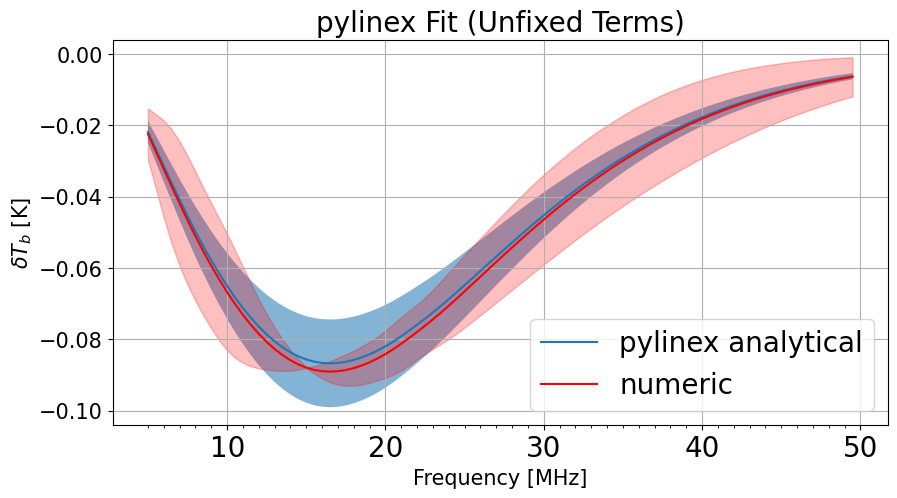

In [ ]:
### This cell now plots the one sigma error of the analytical pylinex error ###
mean = rn_Fatima_simp1_vhc[11][0].subbasis_channel_mean("signal")  # values that define the mean of the fit.
error = rn_Fatima_simp1_vhc[11][0].subbasis_channel_error("signal")
mean_numeric = rn_Fatima_simp1_vhc[1]
sigma1 = rn_Fatima_simp1_vhc[2]
error_numeric = np.abs(sigma1-mean)
# This is a boiler plate plot with all the good options figured out
plt.figure(figsize=(10, 5))


plt.plot(frequencies,mean, label="pylinex analytical")
plt.plot(frequencies,mean_numeric, color = "red", label = "numeric")
plt.fill_between(frequencies, mean+error, mean-error,alpha=0.55)
plt.fill_between(frequencies, mean_numeric+error_numeric, mean_numeric-error_numeric,alpha=0.25, color="red") 
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(r"pylinex Fit (Unfixed Terms)", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

100%|██████████| 90/90 [00:00<00:00, 201.40it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 4650.00it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 191.65it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 4793.49it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 196.31it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 7194.35it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 205.42it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 5562.74it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 203.19it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 7397.36it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 210.39it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 3226.39it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 182.03it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 3194.44it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 200.14it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 10230.01it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 203.41it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 3057.07it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 200.15it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 1/1 [00:00<00:00, 8035.07it/s]


[0 0 0]


100%|██████████| 90/90 [00:00<00:00, 196.66it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 116.18it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 197.36it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 124.92it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 184.59it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 115.96it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 195.07it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 118.88it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 191.35it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 115.64it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 201.00it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 118.73it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 192.38it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 116.64it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 199.79it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 118.69it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 194.28it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 115.29it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 90/90 [00:00<00:00, 204.34it/s]


[[2.7135225 2.8526775]
 [3.703245  3.893155 ]
 [4.08837   4.29803  ]]


100%|██████████| 1000/1000 [00:08<00:00, 118.62it/s]


[0.0012500000000000002, 0.0006250000000000001, 0.0012500000000000002]


100%|██████████| 100/100 [10:59<00:00,  6.60s/it]


Maximum bias of the systematics rms is 6.276502403176
Maximum bias of the signal rms is 6.280924737292523
Average number of systematics terms used for fit: 229.25
Average number of signal terms used for fit: 1.0
Reduced Chi Squared of mean fit: [1.09009208]
Mean Reduced Chi Squared: 1.119314509085568
STD of Reduced Chi Squared Distribution: 0.06437926108488529


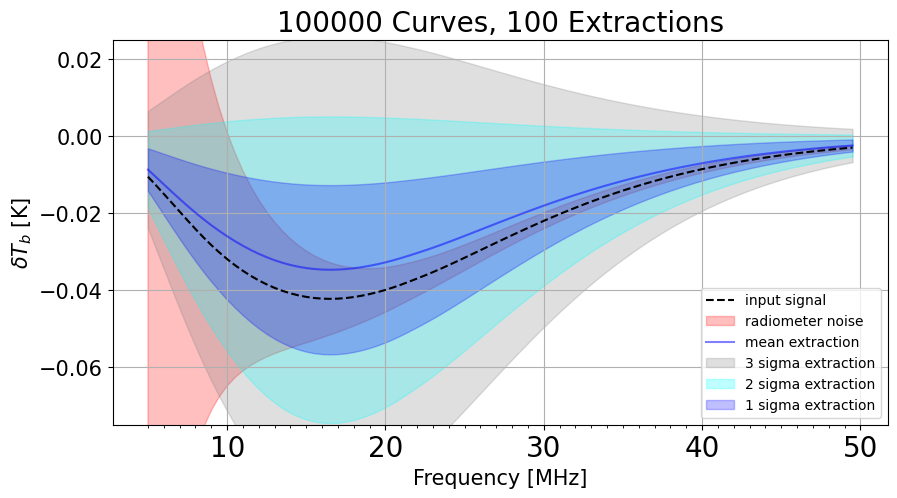

In [ ]:
### This cell get us our numerically derived error (with fixed terms) ###


# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# Training Sets 10LST for Varied Regolith  # parameters are all the same as varied regolith training set raw params
varied_regolith_TS_raw_10LSTs = np.zeros((10,221,50))
f1 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_TS_raw_10LSTs[0] = f1["Foreground_Training_Set"][:,0,:]
f2 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_2","r")
varied_regolith_TS_raw_10LSTs[1] = f2["Foreground_Training_Set"][:,0,:]
f3 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_3","r")
varied_regolith_TS_raw_10LSTs[2] = f3["Foreground_Training_Set"][:,0,:]
f4 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_4","r")
varied_regolith_TS_raw_10LSTs[3] = f4["Foreground_Training_Set"][:,0,:]
f5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_5","r")
varied_regolith_TS_raw_10LSTs[4] = f5["Foreground_Training_Set"][:,0,:]
f6 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_6","r")
varied_regolith_TS_raw_10LSTs[5] = f6["Foreground_Training_Set"][:,0,:]
f7 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_7","r")
varied_regolith_TS_raw_10LSTs[6] = f7["Foreground_Training_Set"][:,0,:]
f8 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_8","r")
varied_regolith_TS_raw_10LSTs[7] = f8["Foreground_Training_Set"][:,0,:]
f9 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_9","r")
varied_regolith_TS_raw_10LSTs[8] = f9["Foreground_Training_Set"][:,0,:]
f10 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_10","r")
varied_regolith_TS_raw_10LSTs[9] = f10["Foreground_Training_Set"]

# varied regolith beam maps (all sky and normalized)
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]

# fiducial signal
parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2]])
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)[0][0][8:] 

# Monochromatic Gaussian Beams Observations for 10 LSTs
## Interpolate the varied beams to match the rest of the data
varied_regolith_training_set_10LSTs = np.zeros((10,len(varied_regolith_training_set_raw),len(frequencies)))
for l in range(10):
    for n in range(len(varied_regolith_training_set_raw)):
        beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_TS_raw_10LSTs[l][n])
        varied_regolith_training_set_10LSTs[l][n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets        
foreground_example_1_10LSTs = np.zeros((10,len(frequencies)))
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
for l in range(10):
    beam_parameters = np.zeros((3,2))
    percent_range = 0.0000000000000001
    L_low = true_parameters[3]-true_parameters[3]*percent_range
    if L_low < 0.5:
        L_low = 0.5
    L_high = true_parameters[3]+true_parameters[3]*percent_range
    if L_high > 3:
        L_high = 3
    n1_low = true_parameters[4]-true_parameters[4]*percent_range
    if n1_low < 3.2:
        n1_low = 3.2
    n1_high = true_parameters[4]+true_parameters[4]*percent_range
    if n1_high > 4.2:
        n1_high = 4.2
    n2_low = true_parameters[5]-true_parameters[5]*percent_range
    if n2_low < 3.8:
        n2_low = 3.8
    n2_high = true_parameters[5]+true_parameters[5]*percent_range
    if n2_high > 4.8:
        n2_high = 4.8

    beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
    N=1
    Nb=0
    Nf=0
    n_regions = 5
    reference_frequency = 25
    sky_map = master_foreground_array[l]
    beam_sky_training_set = beams[:,5:,:]
    beam_sky_training_set_params = varied_regolith_training_set_raw_params
    STS_data = varied_regolith_training_set_10LSTs[l]
    STS_params = varied_regolith_training_set_raw_params
    show_parameter_ranges = True
    define_parameter_mean = False
    foreground_parameters = np.array([0,0,0])
    parameter_mean = None
    B_value_functions = py21cmsig.B_value_interp(beam_sky_training_set,beam_sky_training_set_params,\
                         frequencies,sky_map,reference_frequency,n_regions)


    foreground_element = py21cmsig.beam_weighted_synchrotron_foreground(n_regions,frequencies,reference_frequency,sky_map, beam_sky_training_set,N,\
                                            beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                                show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
    foreground_example_1_10LSTs[l] = foreground_element[0][0]

# Example of not having enough curves
simple_Fatima_sim=py21cmsig.multi_spectra_simulation_run(frequencies,foreground_example_1_10LSTs,fiducial_signal,N_antenna,dnu,dt)
beam_parameters = np.zeros((3,2))
percent_range = 0.025
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
N_raw=1000000
N = 100000
N_samp = int(np.sqrt(N_raw))**2
Nb=0
Nf=0


test_case_10LSTs_raw = np.zeros((N_samp,10,len(frequencies)))
for l in range(10):
    L_low = true_parameters[3]-true_parameters[3]*percent_range
    if L_low < 0.5:
        L_low = 0.5
    L_high = true_parameters[3]+true_parameters[3]*percent_range
    if L_high > 3:
        L_high = 3
    n1_low = true_parameters[4]-true_parameters[4]*percent_range
    if n1_low < 3.2:
        n1_low = 3.2
    n1_high = true_parameters[4]+true_parameters[4]*percent_range
    if n1_high > 4.2:
        n1_high = 4.2
    n2_low = true_parameters[5]-true_parameters[5]*percent_range
    if n2_low < 3.8:
        n2_low = 3.8
    n2_high = true_parameters[5]+true_parameters[5]*percent_range
    if n2_high > 4.8:
        n2_high = 4.8


    beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
    foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
    # parameter_mean =  true_parameters[0:3]
    n_regions = 5
    reference_frequency = 25
    sky_map = master_foreground_array[l]
    beam_sky_training_set = beams[:,5:,:]
    beam_sky_training_set_params = varied_regolith_training_set_raw_params
    raw_beam_weighted_sky_maps = raw_sky_maps
    STS_data = varied_regolith_training_set_10LSTs[l]
    STS_params = varied_regolith_training_set_raw_params
    show_parameter_ranges = True
    define_parameter_mean = False
    data=simple_Fatima_sim[0]
    B_value_functions = py21cmsig.B_value_interp(beam_sky_training_set,beam_sky_training_set_params,\
                         frequencies,sky_map,reference_frequency,n_regions)
    test_case_element = py21cmsig.beam_weighted_synchrotron_foreground(n_regions,frequencies,reference_frequency,sky_map, beam_sky_training_set,N_raw,\
                                            beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                                show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
    test_case_10LSTs_raw[:,l,:] = test_case_element[0]
    

np.random.shuffle(test_case_10LSTs_raw)
test_case_10LSTs = test_case_10LSTs_raw[0:N]

n_samples_ts_test = 5
n_samples_rn_test = 100
restrict_runs = 0
num_basis_vectors = 1000
num_divisions = 10   
num_sig_vectors = 2
num_sys_vectors = 500
man_sys_terms = 0
man_sig_terms = 0
# tss_Fatima_simp = py21cmsig.extraction_statistics(n_samples_ts_test,test_case_10LSTs,lambdaCDM_training_set[:,16::2],simple_Fatima_sim[0],simple_Fatima_sim[5],simple_Fatima_sim[1],simple_Fatima_sim[2],frequency_array = frequencies,\
#                 num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,IC="BIC",ignore_IC=False, man_sys_terms=man_sys_terms,\
#                     man_sig_terms=man_sig_terms,title=f"{N} Curves,",use_fit_noise=False,training_set_to_test="systematics",test_mode="training set size",\
#                         restrict_runs=0,display_type="cumulative sigmas",priors=False,multi_spectra=True,num_basis_vectors=num_basis_vectors, ylim=(-0.075,0.025))

rn_Fatima_simp1_vhc_fixed= py21cmsig.extraction_statistics(n_samples_rn_test,test_case_10LSTs,lambdaCDM_training_set[:,16::2],simple_Fatima_sim[0],simple_Fatima_sim[5],simple_Fatima_sim[1],simple_Fatima_sim[2],frequency_array = frequencies,\
                num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,IC="BIC",ignore_IC=False, man_sys_terms=man_sys_terms,\
                    man_sig_terms=man_sig_terms,title=f"{N} Curves,",use_fit_noise=False,training_set_to_test="systematics",test_mode="random noise",\
                        restrict_runs=0,display_type="cumulative sigmas",priors=False,multi_spectra=True,num_basis_vectors=num_basis_vectors, ylim=(-0.075,0.025))

# print(f"RMS between mean fit and input: {np.sqrt(((rn_Fatima_simp1_vhc[1] - fiducial_signal)**2).mean())}")



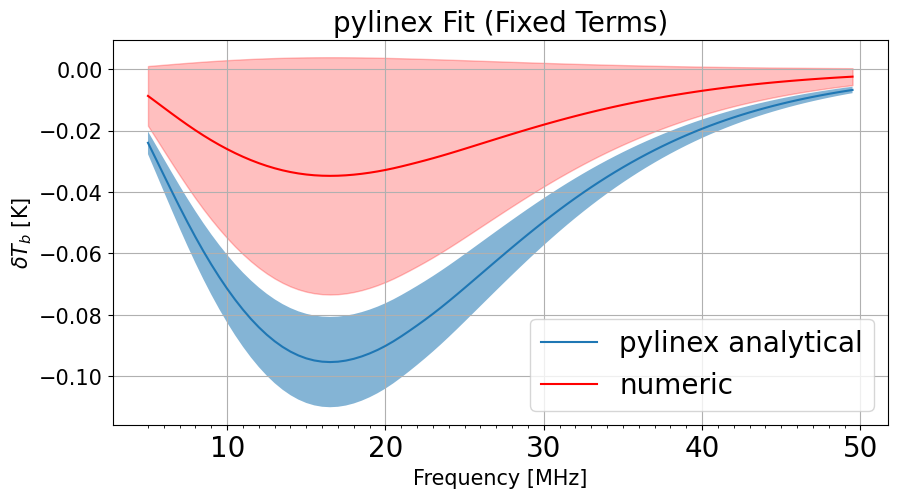

In [ ]:
### This cell now plots the one sigma error of the analytical pylinex error ###
mean = rn_Fatima_simp1_vhc_fixed[11][0].subbasis_channel_mean("signal")  # values that define the mean of the fit.
error = rn_Fatima_simp1_vhc_fixed[11][0].subbasis_channel_error("signal")
mean_numeric = rn_Fatima_simp1_vhc_fixed[1]
sigma1 = rn_Fatima_simp1_vhc_fixed[2]
error_numeric = np.abs(sigma1-mean)
# This is a boiler plate plot with all the good options figured out
plt.figure(figsize=(10, 5))


plt.plot(frequencies,mean, label="pylinex analytical")
plt.plot(frequencies,mean_numeric, color = "red", label = "numeric")
plt.fill_between(frequencies, mean+error, mean-error,alpha=0.55)
plt.fill_between(frequencies, mean_numeric+error_numeric, mean_numeric-error_numeric,alpha=0.25, color="red") 
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(r"pylinex Fit (Fixed Terms)", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

#### Sampler (First step of the MCMC)

In [ ]:
## Let's start reverse engineering Joshua's code:

# these set the error for the density parameters
omM0sigma = 0.013
omL0sigma = 0.0062
omB0sigma = 0.00014/h**2

curve_number = 0
sigma_range = 10



lst_bins = 10
frequencies = frequencies
forecast_file_path = "/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test_00000025"
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/least_squares_test_dummy'

signal_training_set_file_name = ''

# Let's make our signal training set and function:
signal_training_set = lambdaCDM_training_set[:,16::2]  # hopefully this doesn't need the exact format of TrainingSetCreator. Won't be too terrible to massage it into that format, but it would be very annoying.
signal_expander = RepeatExpander(lst_bins)
signal_model = perses.models.LambdaCDMModel(frequencies, in_Kelvin=True)
signal_model = ExpandedModel(signal_model, signal_expander)
model_names = ['signal', 'systematics']

# loads the foreground training set
f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG_00000025","r")
test_case_10LSTs_raw= f["data"]
N=100000
np.random.shuffle(np.array(test_case_10LSTs_raw))
test_case_10LSTs = test_case_10LSTs_raw[0:N]
fg_training_set = test_case_10LSTs
fg_training_set = np.reshape(fg_training_set, (len(fg_training_set), -1)) # this shapes it into the correct shape for th TrainedBasis pylinex class

# signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(omM0-omM0sigma*sigma_range, omM0+omM0sigma*sigma_range)) # omM0
distribution_list.add_distribution(UniformDistribution(omL0-omL0sigma*sigma_range, omL0+omL0sigma*sigma_range)) # omL0
distribution_list.add_distribution(UniformDistribution(omB0-omB0sigma*sigma_range, omB0+omB0sigma*sigma_range)) # omB0

# I don't need this conditional expression
# condition_expression = Expression(\
# 	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
# 	num_arguments=3, import_strings=['import numpy as np'])

# condition_distribution = UniformConditionDistribution(condition_expression)

# prior = WindowedDistribution(distribution_list, condition_distribution)

prior = distribution_list
bounds = {\
	'omM0': (omM0-omM0sigma*5, omM0+omM0sigma*5),\
	'omL0': (omL0-omL0sigma*5, omL0+omL0sigma*5),\
	'omB0': (omB0-omB0sigma*5, omB0+omB0sigma*5),\
	}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 

forecast_files = h5py.File(forecast_file_path,'r')
forecaster = Forecaster(forecast_file_path)
error = forecast_files['error'][()]
data = forecast_files['data'][()][curve_number]    
input_signal = forecast_files['input_curves/signal'][0] 
num_linear_fg_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['systematics'].num_basis_vectors

#FG Model and Training Set for Full Data

fg_trained_basis = TrainedBasis(fg_training_set, num_linear_fg_terms, error=error, \
	mean_translation=True)
fg_trained_basis.generate_gaussian_prior(diagonal=True)
fg_priors = fg_trained_basis.gaussian_prior
fg_basis_model = BasisModel(fg_trained_basis)
models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.

full_data_model = SumModel(model_names, models)
fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'systematics', prior=fg_priors)
full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.

linear_fit_parameter_covariance = forecaster.plotter.parameter_covariances['signal'][curve_number]
linear_fit_parameter_mean = forecaster.plotter.parameter_means['signal'][curve_number]
num_linear_signal_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['signal'].num_basis_vectors
basis_sum = forecaster.plotter.get_basis_sum("0")["signal"]
signal_trained_basis = basis_sum
projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)
signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_path,\
	**bounds)

least_square_fitter.run(iterations=100, attempt_threshold=100,\
	run_if_iterations_exist=False)

# This probably needs to include the covariance rather than just an identity. Maybe the MCMC fitter deals with this?
guess_distribution = GaussianDistribution(least_square_fitter.argmin, np.identity(signal_model.num_parameters)*0.005)

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])



# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test_00000025 already exists. Will perform analysis using existing file. If you wish to rerun, move or delete existing file.
Computing Least Square Fit...


100%|██████████| 1/1 [00:00<00:00, 33.97it/s]


<Axes: title={'center': 'Least square fit parameter histogram'}, xlabel='omB0', ylabel='# of occurrences'>

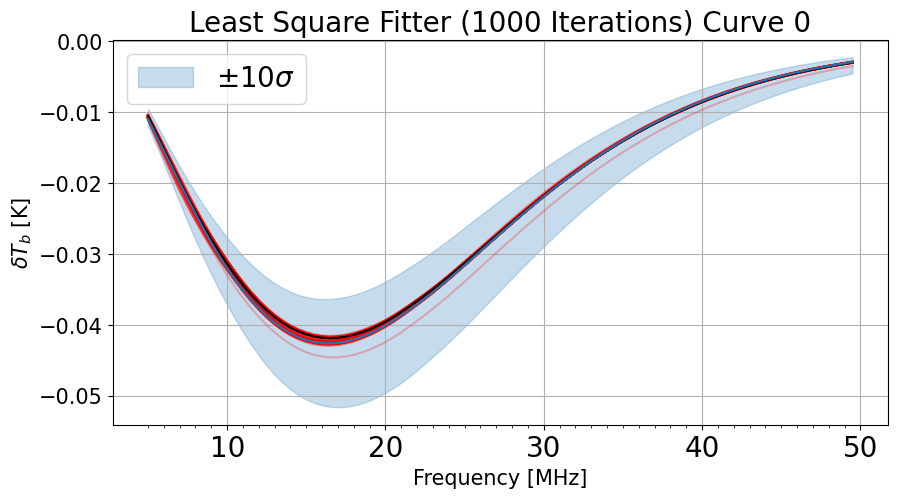

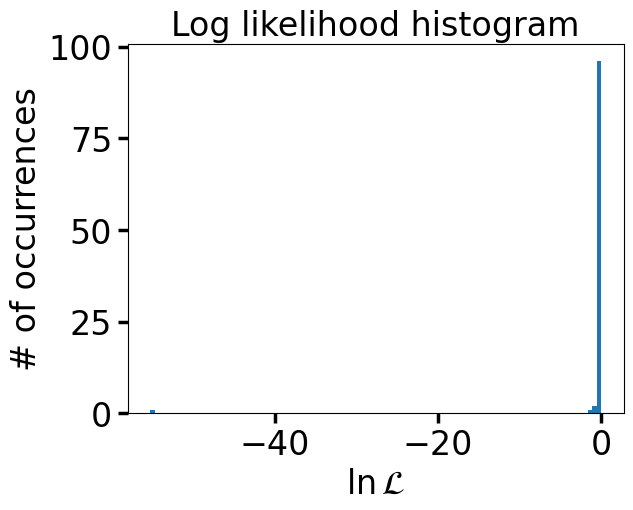

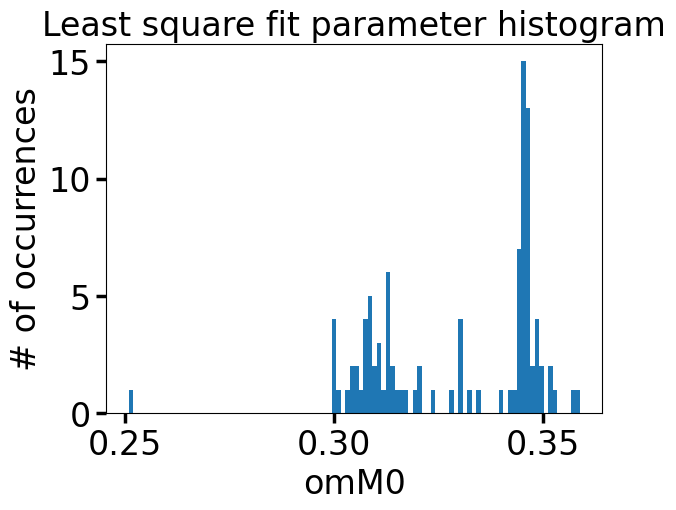

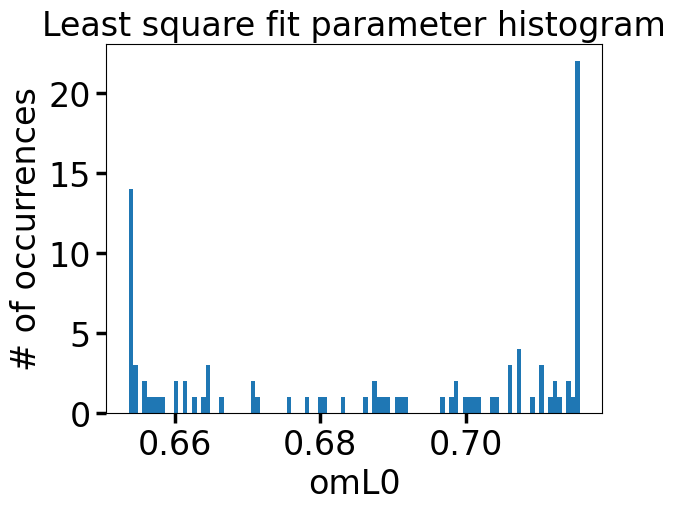

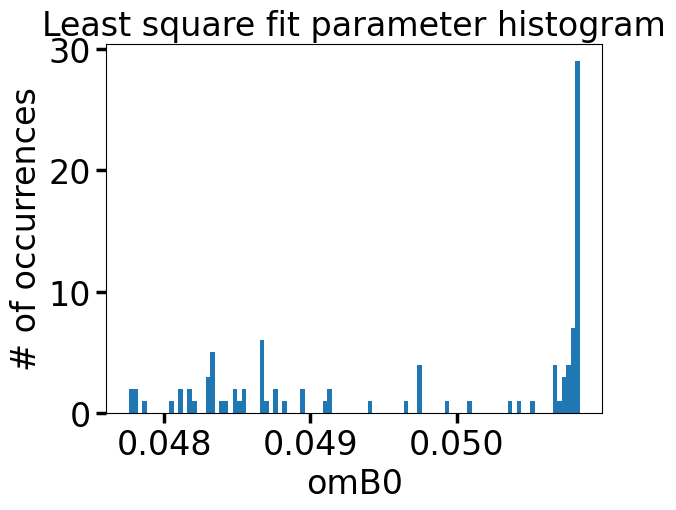

In [ ]:
# Plots all the useful information for the 

plt.figure(figsize=(10, 5))
parameter_max = np.array([[omR0,0],[omM0+omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0-omB0sigma*sigma_range,0]])
parameter_min = np.array([[omR0,0],[omM0-omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0+omB0sigma*sigma_range,0]])
parameter_argmin = np.array([[omR0,0],[least_square_fitter.argmin[0],0],[omK0,0],[least_square_fitter.argmin[1],0],[least_square_fitter.argmin[2],0]])
for n in np.arange(100):
    parameters = np.array([[omR0,0],[least_square_fitter.argmins[n][0],0],[omK0,0],[least_square_fitter.argmins[n][1],0],[least_square_fitter.argmins[n][2],0]])
    plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::],\
                 py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::],color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_argmin,1)[0][0][8::],color="tab:blue")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter (1000 Iterations) Curve {curve_number}", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

least_square_fitter.plot_loglikelihood_histogram(bins=100)
least_square_fitter.plot_parameter_histogram("omM0",bins=100)
least_square_fitter.plot_parameter_histogram("omL0",bins=100)
least_square_fitter.plot_parameter_histogram("omB0",bins=100)

In [ ]:
# Just a reminder of what we got from the least square fitter:
# least_square_fitter.run(iterations=100, attempt_threshold=100,\
# 	run_if_iterations_exist=False)

# guess_distribution = GaussianDistribution(least_square_fitter.argmin,\
# 	np.identity(signal_model.num_parameters))

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

# guess_distribution_set =\
# 	DistributionSet([(guess_distribution, signal_model.parameters, None)])

# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

## here are some variables we need to define for the Sampler (the MCMC proper)

# file name of the hdf5 file
file_name = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_test1'

# number of MCMC chains being iterated together
num_walkers = 5

# likelihood to explore (I'm hoping it's the same as the least square fitter)
loglikelihood = full_loglikelihood  # NOTE: you'll have to run the least square fitter to populate this variable

# JuimpingDistributionSet object that defines where the MCMC is allowed to jump from a starting point. 
# I don't fully understand what this does right now, but we'll explore it

# guess_distribution = GaussianDistribution(least_square_fitter.argmin,\    
# 	np.identity(signal_model.num_parameters))

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

# guess_distribution_set =\
# 	DistributionSet([(guess_distribution, signal_model.parameters, None)])

jumping_distribution = GaussianJumpingDistribution(covariance)


jumping_distribution_set = JumpingDistributionSet([(jumping_distribution, signal_model.parameters)])



#DistributionSet object that governs the initial guesses. Created from the linear least squares you should have just done before this.
guess_distribution_set = guess_distribution_set   # NOTE: comes from the least squares fitter

#Optional DistributionSet object that sets priors on your parameters Created from the linear least squares you should have just done before this
prior_distribution_set = prior_distribution_set    # NOTE: comes from the least squares fitter

# print the time after each checkpoint
verbose = True

# restart_mode seems handy (take a look at the documentation under Sampler.py in pylinex/nonlinear). Going to ignore it for now.

test_Sampler = Sampler(file_name,num_walkers,loglikelihood,jumping_distribution_set=jumping_distribution_set, guess_distribution_set=guess_distribution_set,prior_distribution_set=prior_distribution_set,verbose=verbose)


NameError: name 'covariance' is not defined

In [ ]:
test_Sampler.run_checkpoints(100)

Starting checkpoint #1 at Mon Feb 23 11:46:03 2026.
Finished checkpoint #1 at Mon Feb 23 11:46:03 2026.
Finished checkpoint #2 at Mon Feb 23 11:46:03 2026.
Finished checkpoint #3 at Mon Feb 23 11:46:03 2026.
Finished checkpoint #4 at Mon Feb 23 11:46:04 2026.
Finished checkpoint #5 at Mon Feb 23 11:46:04 2026.
Finished checkpoint #6 at Mon Feb 23 11:46:04 2026.
Finished checkpoint #7 at Mon Feb 23 11:46:04 2026.
Finished checkpoint #8 at Mon Feb 23 11:46:05 2026.
Finished checkpoint #9 at Mon Feb 23 11:46:05 2026.
Finished checkpoint #10 at Mon Feb 23 11:46:05 2026.


100%|██████████| 1/1 [00:00<00:00, 47.76it/s]


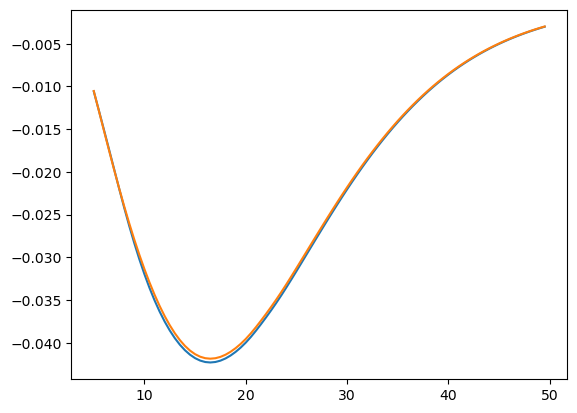

In [ ]:
plt.plot(frequencies, py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0]]),1)[0][0][8::])
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][0])

In [ ]:
test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_test0')


100%|██████████| 1/1 [00:00<00:00, 53.02it/s]


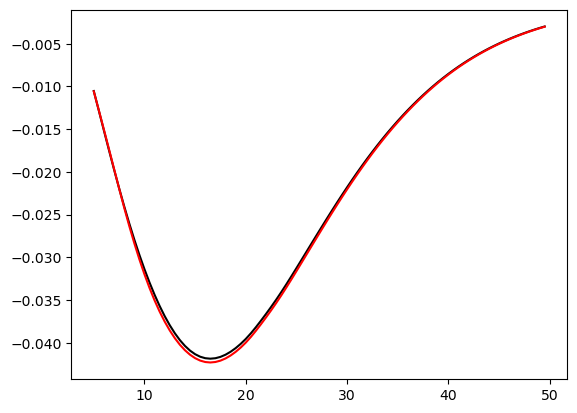

In [ ]:
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.plot(frequencies, py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0]]),1)[0][0][8::],label="input signal", color="red")

100%|██████████| 1/1 [00:00<00:00, 38.21it/s]


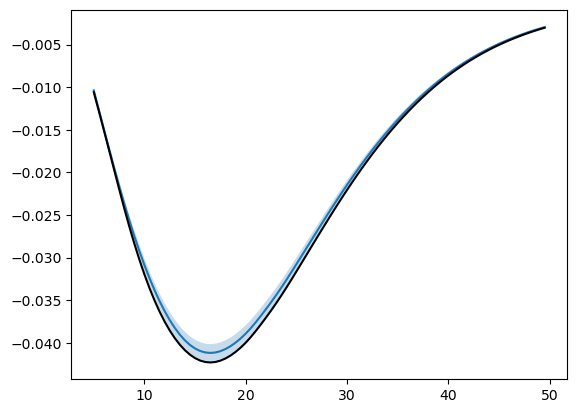

In [ ]:
reconstructions = test_Fitter.reconstruction_confidence_intervals(100,[0.68,0.95,0.997],return_reconstructions=True)
mean = reconstructions[1].mean()
plt.plot(frequencies,signal_trained_basis.basis[0]*mean)
plt.fill_between(frequencies,signal_trained_basis.basis[0]*reconstructions[0][0][0],signal_trained_basis.basis[0]*reconstructions[0][0][1],alpha=0.25)
plt.plot(frequencies, py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0]]),1)[0][0][8::],label="input signal", color="black")

##### Plot the results of the MCMC

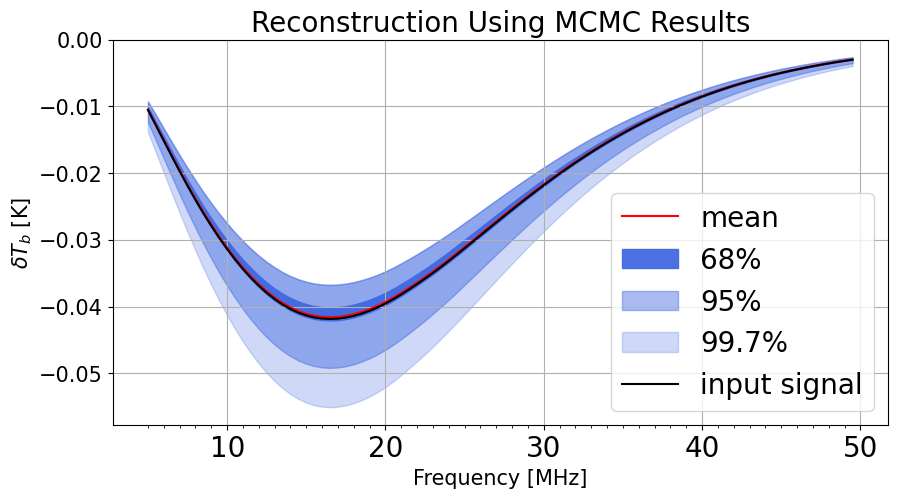

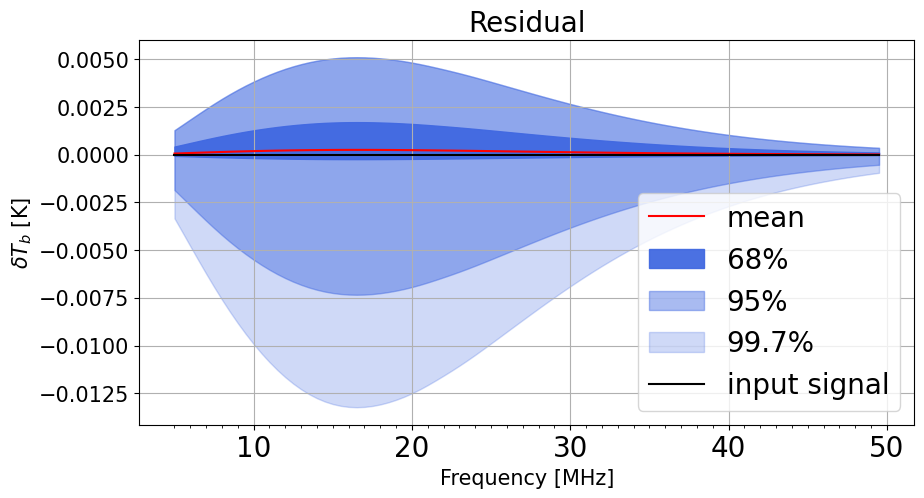

In [ ]:
# Plots the results of the MCMC attempting to fit the data:

test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_test0')
reconstructions = test_Fitter.reconstruction_confidence_intervals(1000,[0.68,0.95,0.997],return_reconstructions=True)
mean = reconstructions[1].mean()

plt.figure(figsize=(10, 5))
plt.plot(frequencies,signal_trained_basis.basis[0]*mean,color="red",label="mean")
plt.fill_between(frequencies,signal_trained_basis.basis[0]*reconstructions[0][0][0],signal_trained_basis.basis[0]*reconstructions[0][0][1],alpha=0.95,label="68%",color="#4169E1")
plt.fill_between(frequencies,signal_trained_basis.basis[0]*reconstructions[0][1][0],signal_trained_basis.basis[0]*reconstructions[0][1][1],alpha=0.45,label="95%",color="#4169E1")
plt.fill_between(frequencies,signal_trained_basis.basis[0]*reconstructions[0][2][0],signal_trained_basis.basis[0]*reconstructions[0][2][1],alpha=0.25,label="99.7%",color="#4169E1")
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black",label="input signal")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Reconstruction Using MCMC Results", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

## Residuals
plt.figure(figsize=(10, 5))
plt.plot(frequencies,signal_trained_basis.basis[0]*mean-forecaster.plotter.channel_means["signal"][curve_number],color="red",label="mean")
plt.fill_between(frequencies,signal_trained_basis.basis[0]*reconstructions[0][0][0]-forecaster.plotter.channel_means["signal"][curve_number],signal_trained_basis.basis[0]*reconstructions[0][0][1]-forecaster.plotter.channel_means["signal"][curve_number],alpha=0.95,label="68%",color="#4169E1")
plt.fill_between(frequencies,signal_trained_basis.basis[0]*reconstructions[0][1][0]-forecaster.plotter.channel_means["signal"][curve_number],signal_trained_basis.basis[0]*reconstructions[0][1][1]-forecaster.plotter.channel_means["signal"][curve_number],alpha=0.45,label="95%",color="#4169E1")
plt.fill_between(frequencies,signal_trained_basis.basis[0]*reconstructions[0][2][0]-forecaster.plotter.channel_means["signal"][curve_number],signal_trained_basis.basis[0]*reconstructions[0][2][1]-forecaster.plotter.channel_means["signal"][curve_number],alpha=0.25,label="99.7%",color="#4169E1")
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number]-forecaster.plotter.channel_means["signal"][curve_number],color="black",label="input signal")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Residual", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

In [ ]:
test_Fitter.parameter_mean

array([0.33297397, 0.68607053, 0.04932196])

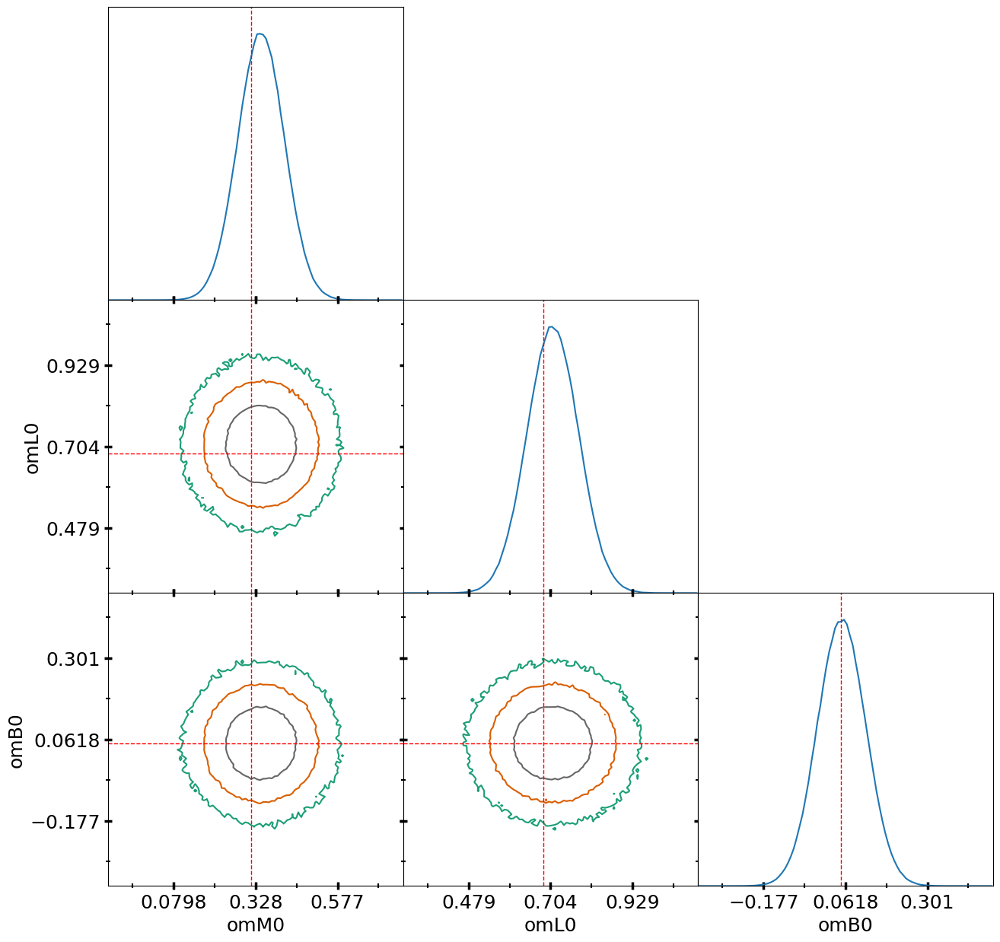

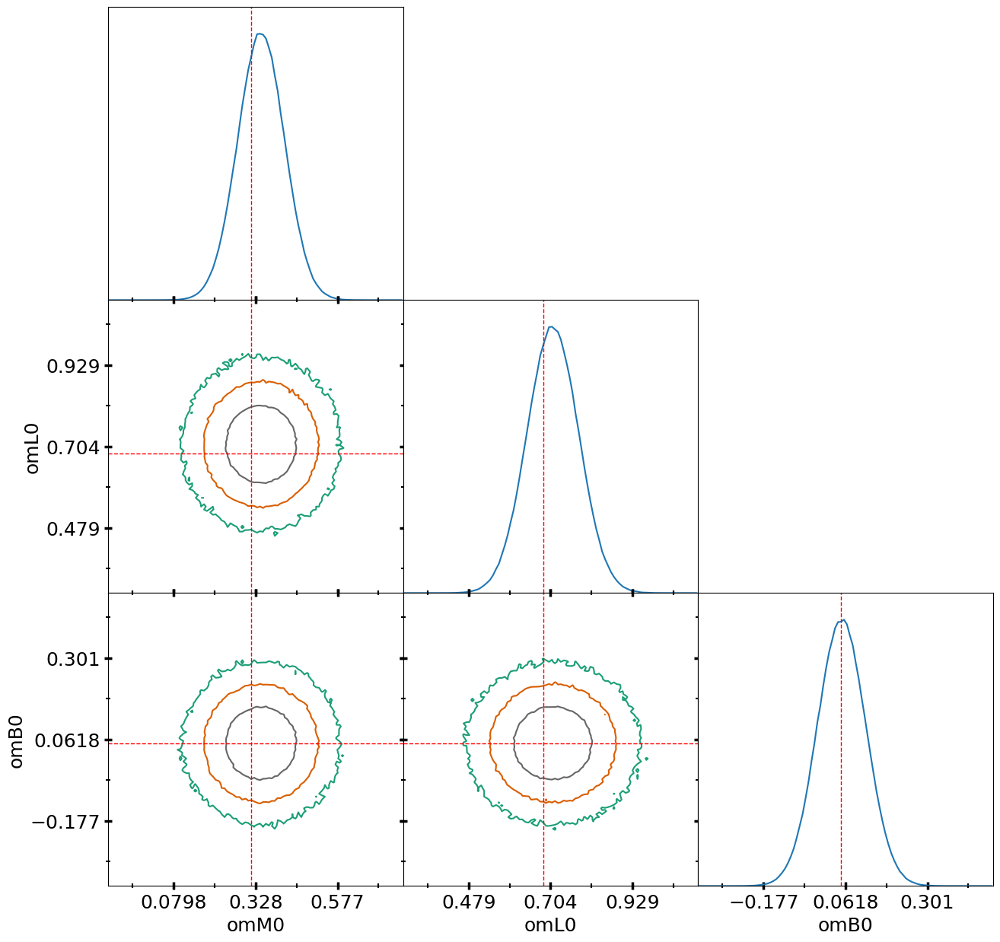

In [ ]:
test_Fitter.guess_distribution_set_triangle_plot(1000000,figsize=(15,15),fontsize=18,contour_confidence_levels=[0.68,0.95,0.997],reference_value_mean=[omM0,omL0,omB0])

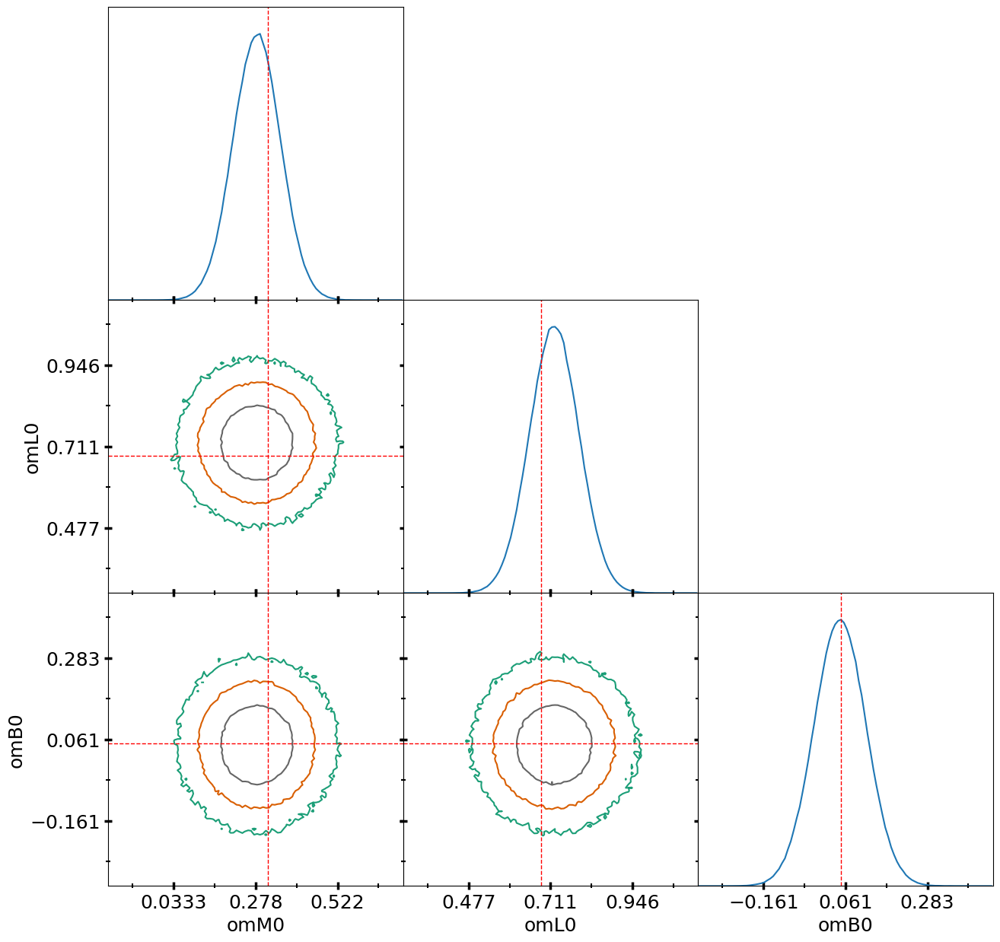

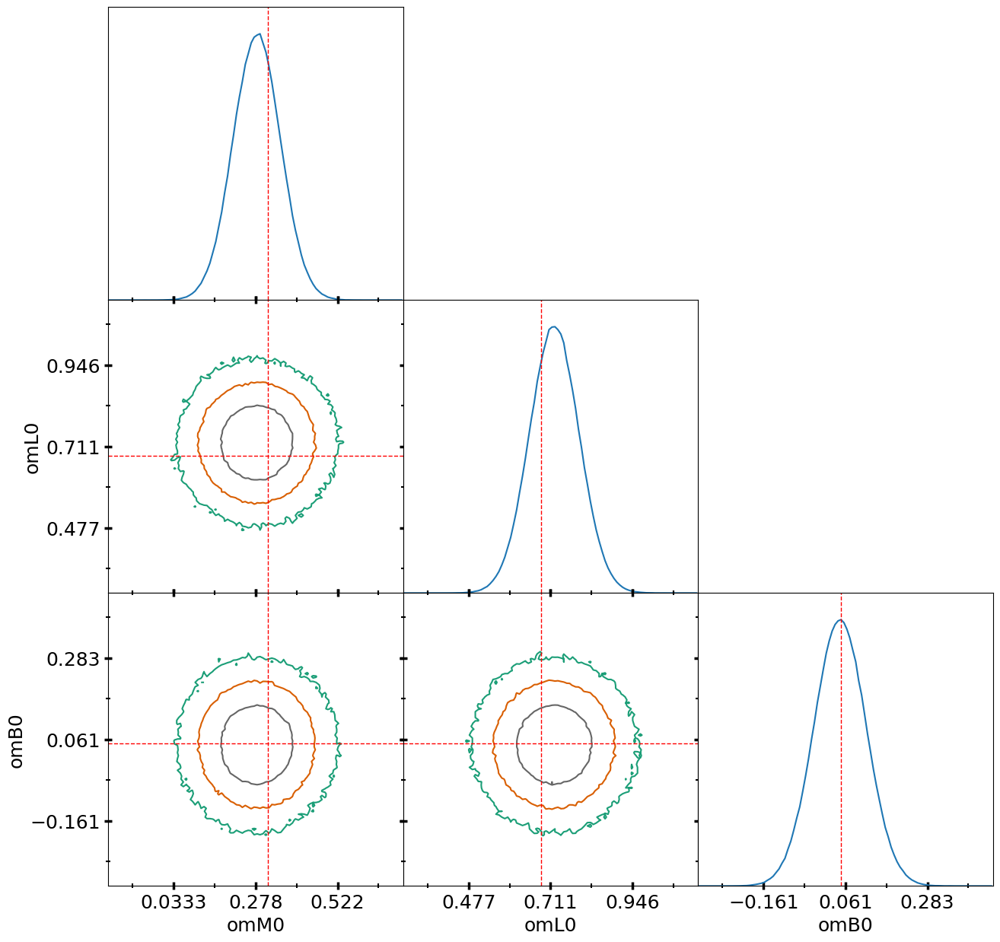

In [ ]:
test_Fitter.jumping_distribution_set_triangle_plot(1000000,figsize=(15,15),fontsize=18,contour_confidence_levels=[0.68,0.95,0.997],reference_value_mean=[omM0,omL0,omB0])

In [ ]:
## Let's start reverse engineering Joshua's code:

# these set the error for the density parameters
omM0sigma = 0.013
omL0sigma = 0.0062
omB0sigma = 0.00014/h**2

curve_number = 0
sigma_range = 10


lst_bins = 10
frequencies = frequencies
forecast_file_path = "/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test"
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/least_squares_test0'

signal_training_set_file_name = ''

# Let's make our signal training set and function:
signal_training_set = lambdaCDM_training_set[:,16::2]  # hopefully this doesn't need the exact format of TrainingSetCreator. Won't be too terrible to massage it into that format, but it would be very annoying.
signal_expander = RepeatExpander(lst_bins)
signal_model = perses.models.LambdaCDMModel(frequencies, in_Kelvin=True)
signal_model = ExpandedModel(signal_model, signal_expander)
model_names = ['signal', 'systematics']

# loads the foreground training set
fg_training_set = test_case_10LSTs
fg_training_set = np.reshape(fg_training_set, (len(fg_training_set), -1)) # this shapes it into the correct shape for th TrainedBasis pylinex class

# signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(omM0-omM0sigma*sigma_range, omM0+omM0sigma*sigma_range)) # omM0
distribution_list.add_distribution(UniformDistribution(omL0-omL0sigma*sigma_range, omL0+omL0sigma*sigma_range)) # omL0
distribution_list.add_distribution(UniformDistribution(omB0-omB0sigma*sigma_range, omB0+omB0sigma*sigma_range)) # omB0

# I don't need this conditional expression
# condition_expression = Expression(\
# 	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
# 	num_arguments=3, import_strings=['import numpy as np'])

# condition_distribution = UniformConditionDistribution(condition_expression)

# prior = WindowedDistribution(distribution_list, condition_distribution)

prior = distribution_list
bounds = {\
	'omM0': (omM0-omM0sigma*5, omM0+omM0sigma*5),\
	'omL0': (omL0-omL0sigma*5, omL0+omL0sigma*5),\
	'omB0': (omB0-omB0sigma*5, omB0+omB0sigma*5),\
	}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 

forecast_files = h5py.File(forecast_file_path,'r')
forecaster = Forecaster(forecast_file_path)
error = forecast_files['error'][()]
data = forecast_files['data'][()][curve_number]    # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
input_signal = forecast_files['input_curves/signal'][0] # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
num_linear_fg_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['systematics'].num_basis_vectors

#FG Model and Training Set for Full Data

fg_trained_basis = TrainedBasis(fg_training_set, num_linear_fg_terms, error=error, \
	mean_translation=True)
fg_trained_basis.generate_gaussian_prior(diagonal=True)
fg_priors = fg_trained_basis.gaussian_prior
fg_basis_model = BasisModel(fg_trained_basis)
models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.

full_data_model = SumModel(model_names, models)
fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'systematics', prior=fg_priors)
full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.

linear_fit_parameter_covariance = forecaster.plotter.parameter_covariances['signal'][curve_number]
linear_fit_parameter_mean = forecaster.plotter.parameter_means['signal'][curve_number]
num_linear_signal_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['signal'].num_basis_vectors
basis_sum = forecaster.plotter.get_basis_sum("0")["signal"]
signal_trained_basis = basis_sum
projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)
signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_path,\
	**bounds)

least_square_fitter.run(iterations=100, attempt_threshold=100,\
	run_if_iterations_exist=False)

# This probably needs to include the covariance rather than just an identity. Maybe the MCMC fitter deals with this?
guess_distribution = GaussianDistribution(least_square_fitter.argmin, np.identity(signal_model.num_parameters)*0.0001)

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])



# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

NameError: name 'test_case_10LSTs' is not defined

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 40.54it/s]


<Axes: title={'center': 'Least square fit parameter histogram'}, xlabel='omB0', ylabel='# of occurrences'>

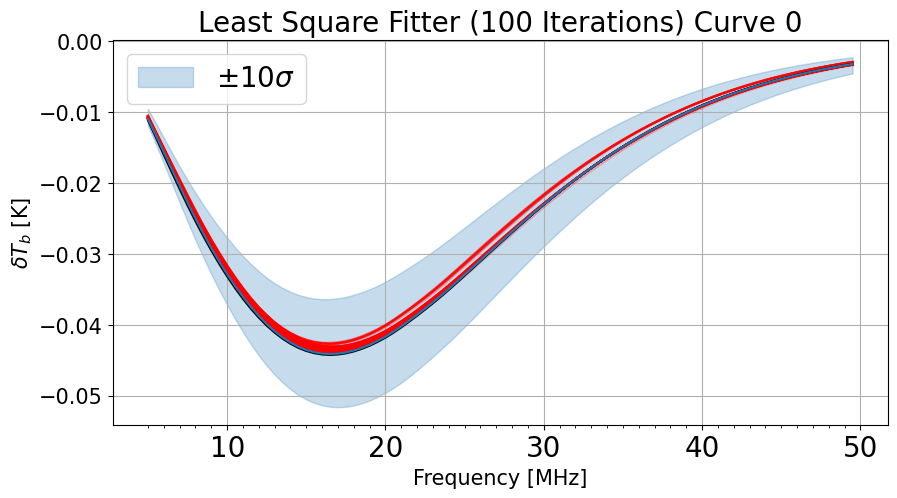

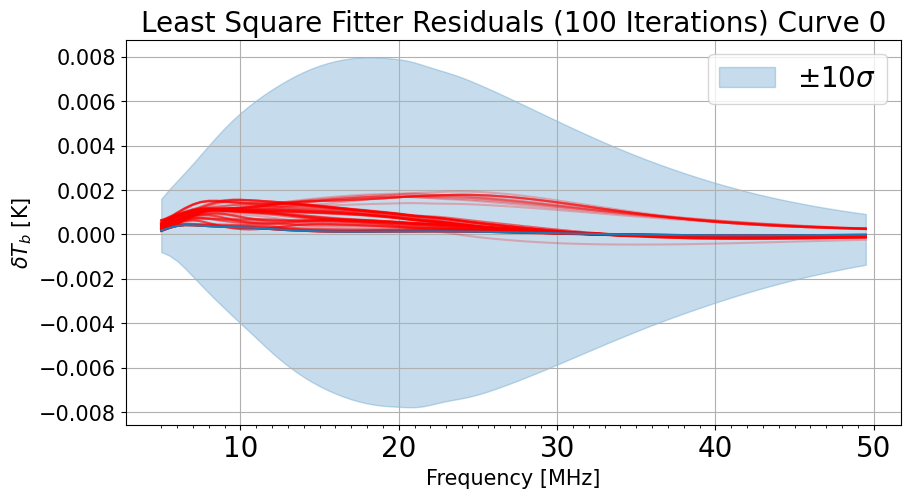

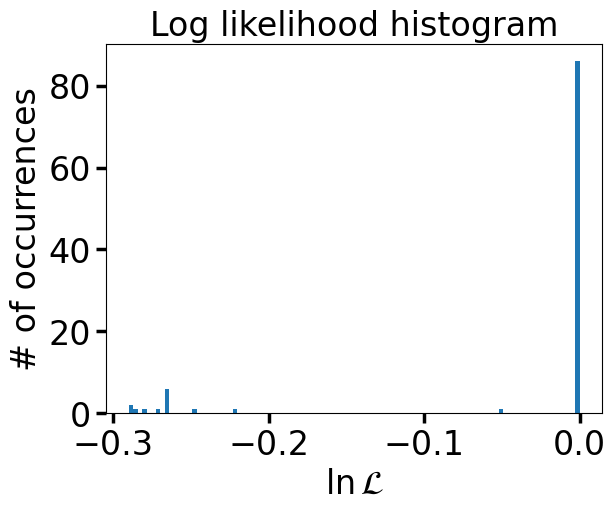

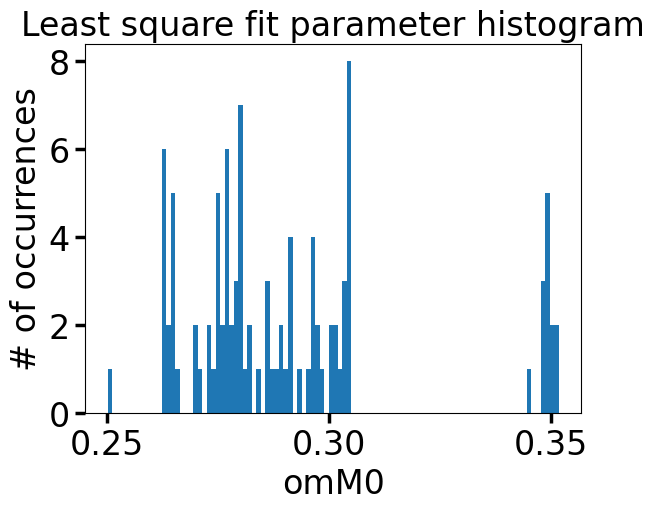

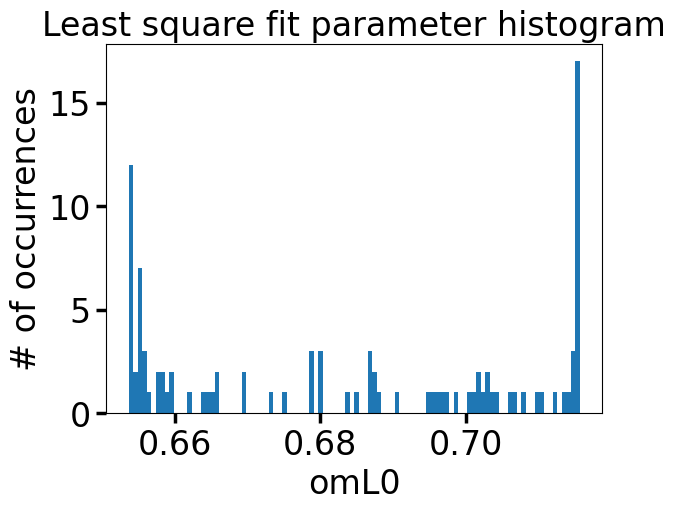

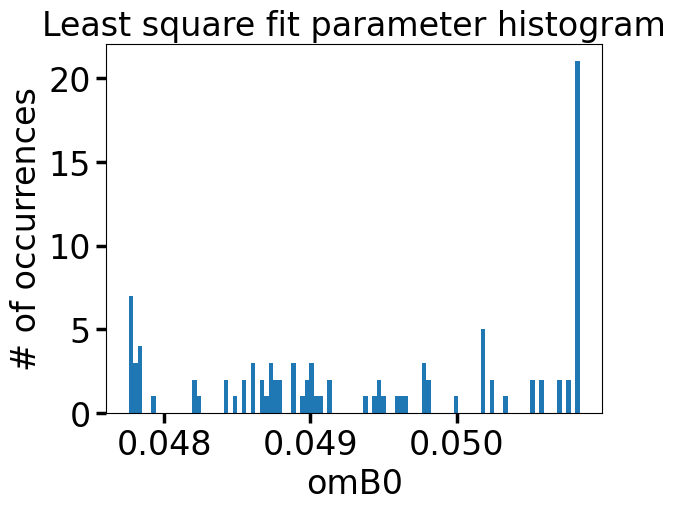

In [ ]:
# Plots all the useful information for the 

plt.figure(figsize=(10, 5))
parameter_max = np.array([[omR0,0],[omM0+omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0-omB0sigma*sigma_range,0]])
parameter_min = np.array([[omR0,0],[omM0-omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0+omB0sigma*sigma_range,0]])
parameter_argmin = np.array([[omR0,0],[least_square_fitter.argmin[0],0],[omK0,0],[least_square_fitter.argmin[1],0],[least_square_fitter.argmin[2],0]])
for n in np.arange(100):
    parameters = np.array([[omR0,0],[least_square_fitter.argmins[n][0],0],[omK0,0],[least_square_fitter.argmins[n][1],0],[least_square_fitter.argmins[n][2],0]])
    plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::],\
                 py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::],color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_argmin,1)[0][0][8::],color="tab:blue")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter (100 Iterations) Curve {curve_number}", fontsize=20)
plt.legend(fontsize=20)
plt.grid()


## Residuals
plt.figure(figsize=(10, 5))
for n in np.arange(100):
    parameters = np.array([[omR0,0],[least_square_fitter.argmins[n][0],0],[omK0,0],[least_square_fitter.argmins[n][1],0],[least_square_fitter.argmins[n][2],0]])
    plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::]-forecaster.plotter.channel_means["signal"][curve_number],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::]-forecaster.plotter.channel_means["signal"][curve_number],\
                 py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::]-forecaster.plotter.channel_means["signal"][curve_number],color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
# plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_argmin,1)[0][0][8::]-forecaster.plotter.channel_means["signal"][curve_number],color="tab:blue")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter Residuals (100 Iterations) Curve {curve_number}", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

least_square_fitter.plot_loglikelihood_histogram(bins=100)
least_square_fitter.plot_parameter_histogram("omM0",bins=100)
least_square_fitter.plot_parameter_histogram("omL0",bins=100)
least_square_fitter.plot_parameter_histogram("omB0",bins=100)

In [ ]:
## Let's start reverse engineering Joshua's code:

# these set the error for the density parameters
omM0sigma = 0.013
omL0sigma = 0.0062
omB0sigma = 0.00014/h**2

curve_number = 0
sigma_range = 10

import os, sys
import numpy as np
import h5py
import matplotlib.pyplot as plot
from pylinex import TrainedBasis, SumModel,\
	BasisModel, SingleConditionalFitModel, ExpandedModel,\
	RepeatExpander, ConditionalFitGaussianLoglikelihood, \
	SlicedModel, GaussianLoglikelihood, LeastSquareFitter, Sampler,\
	BurnRule, NLFitter, TrainingSetCreator, ProjectedModel, Forecaster
from perses.models import TurningPointModel
from perses.simulations import DriftscanSetCreator
from distpy import Expression, UniformConditionDistribution,\
	WindowedDistribution, DistributionList, DistributionSet,\
	UniformDistribution, GaussianDistribution, UniformConditionDistribution

lst_bins = 10
frequencies = frequencies
forecast_file_path = "/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test"
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/least_squares_test1'

signal_training_set_file_name = ''

# Let's make our signal training set and function:
signal_training_set = lambdaCDM_training_set[:,16::2]  # hopefully this doesn't need the exact format of TrainingSetCreator. Won't be too terrible to massage it into that format, but it would be very annoying.
signal_expander = RepeatExpander(lst_bins)
signal_model = LambdaCDMModel(frequencies, in_Kelvin=True)
signal_model = ExpandedModel(signal_model, signal_expander)
model_names = ['signal', 'systematics']

# loads the foreground training set
fg_training_set = test_case_10LSTs
fg_training_set = np.reshape(fg_training_set, (len(fg_training_set), -1)) # this shapes it into the correct shape for th TrainedBasis pylinex class

# signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(omM0-omM0sigma*sigma_range, omM0+omM0sigma*sigma_range)) # omM0
distribution_list.add_distribution(UniformDistribution(omL0-omL0sigma*sigma_range, omL0+omL0sigma*sigma_range)) # omL0
distribution_list.add_distribution(UniformDistribution(omB0-omB0sigma*sigma_range, omB0+omB0sigma*sigma_range)) # omB0

condition_expression = Expression(\
	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
	num_arguments=3, import_strings=['import numpy as np'])

condition_distribution = UniformConditionDistribution(condition_expression)

prior = WindowedDistribution(distribution_list, condition_distribution)

bounds = {\
	'omM0': (omM0-omM0sigma*5, omM0+omM0sigma*5),\
	'omL0': (omL0-omL0sigma*5, omL0+omL0sigma*5),\
	'omB0': (omB0-omB0sigma*5, omB0+omB0sigma*5),\
	}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 

forecast_files = h5py.File(forecast_file_path,'r')
forecaster = Forecaster(forecast_file_path)
error = forecast_files['error'][()]
data = forecast_files['data'][()][curve_number]    # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
input_signal = forecast_files['input_curves/signal'][0] # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
num_linear_fg_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['systematics'].num_basis_vectors

#FG Model and Training Set for Full Data

fg_trained_basis = TrainedBasis(fg_training_set, num_linear_fg_terms, error=error, \
	mean_translation=True)
fg_trained_basis.generate_gaussian_prior(diagonal=True)
fg_priors = fg_trained_basis.gaussian_prior
fg_basis_model = BasisModel(fg_trained_basis)
models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.

full_data_model = SumModel(model_names, models)
fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'systematics', prior=fg_priors)
full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.

linear_fit_parameter_covariance = forecaster.plotter.parameter_covariances['signal'][curve_number]
linear_fit_parameter_mean = forecaster.plotter.parameter_means['signal'][curve_number]
num_linear_signal_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['signal'].num_basis_vectors
basis_sum = forecaster.plotter.get_basis_sum("0")["signal"]
signal_trained_basis = basis_sum
projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)
signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_path,\
	**bounds)

least_square_fitter.run(iterations=1000, attempt_threshold=1000,\
	run_if_iterations_exist=False)

guess_distribution = GaussianDistribution(least_square_fitter.argmin,\
	np.identity(signal_model.num_parameters))

guess_distribution =\
	WindowedDistribution(guess_distribution, condition_distribution)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])

# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test already exists. Will perform analysis using existing file. If you wish to rerun, move or delete existing file.
Computing Least Square Fit...


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 40.32it/s]


100%|██████████| 1/1 [00:00<00:00, 47.19it/s]


<Axes: title={'center': 'Least square fit parameter histogram'}, xlabel='omB0', ylabel='# of occurrences'>

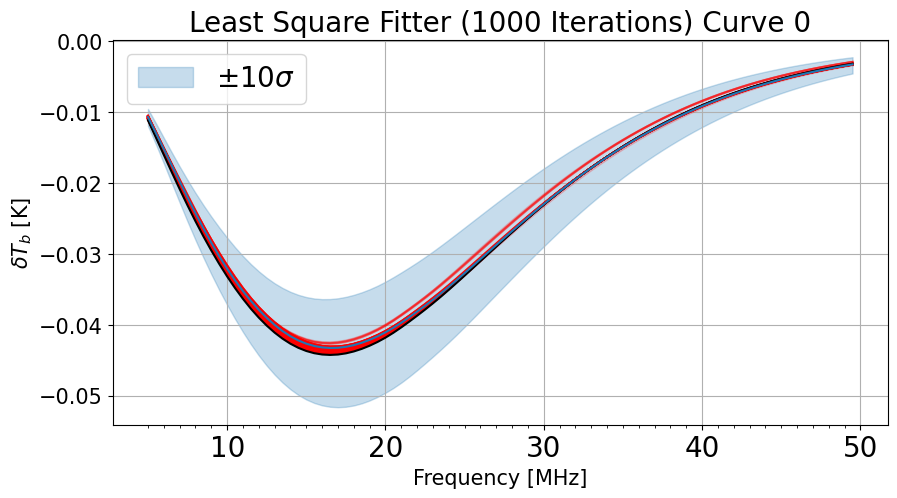

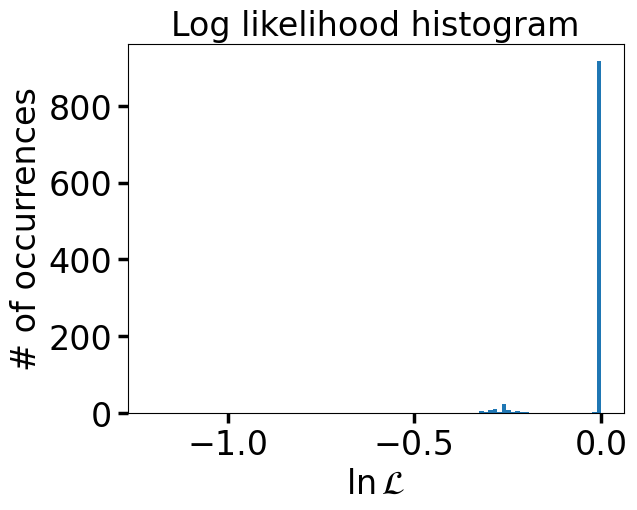

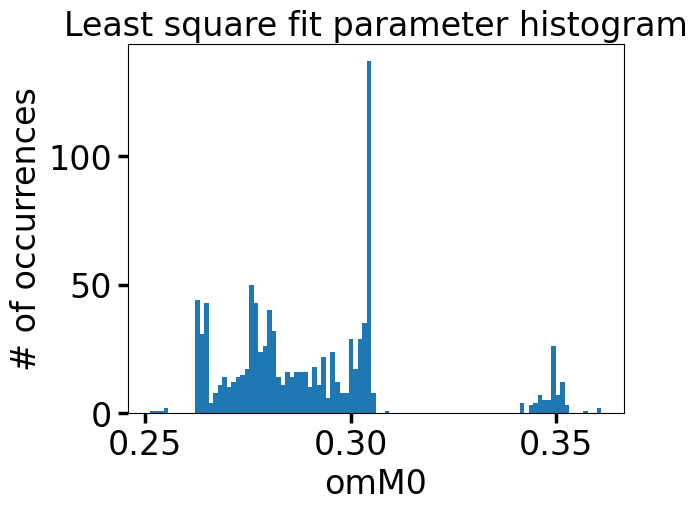

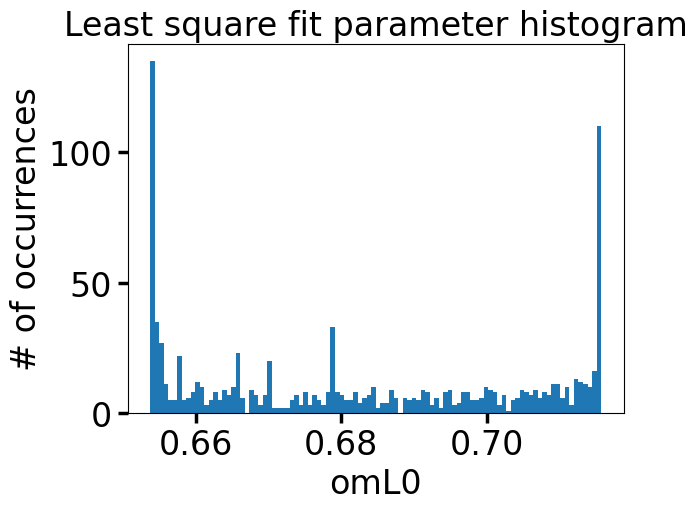

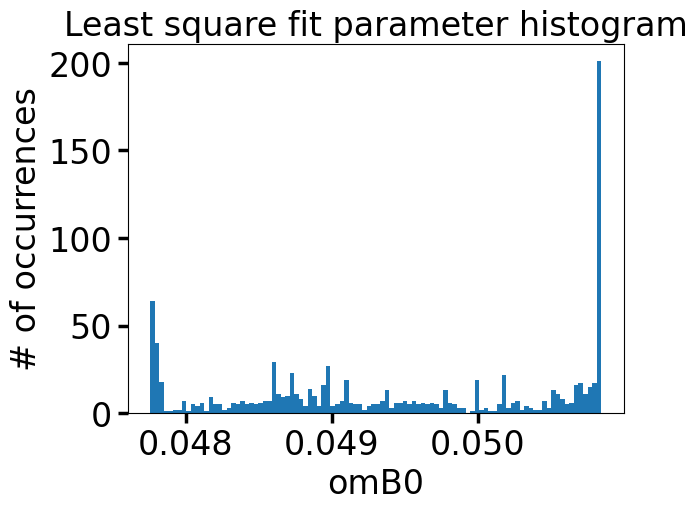

In [ ]:
# Plots all the useful information for the 

plt.figure(figsize=(10, 5))
parameter_max = np.array([[omR0,0],[omM0+omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0-omB0sigma*sigma_range,0]])
parameter_min = np.array([[omR0,0],[omM0-omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0+omB0sigma*sigma_range,0]])
parameter_argmin = np.array([[omR0,0],[least_square_fitter.argmin[0],0],[omK0,0],[least_square_fitter.argmin[1],0],[least_square_fitter.argmin[2],0]])
for n in np.arange(100):
    parameters = np.array([[omR0,0],[least_square_fitter.argmins[n][0],0],[omK0,0],[least_square_fitter.argmins[n][1],0],[least_square_fitter.argmins[n][2],0]])
    plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::],\
                 py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::],color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_argmin,1)[0][0][8::],color="tab:blue")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter (1000 Iterations) Curve {curve_number}", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

least_square_fitter.plot_loglikelihood_histogram(bins=100)
least_square_fitter.plot_parameter_histogram("omM0",bins=100)
least_square_fitter.plot_parameter_histogram("omL0",bins=100)
least_square_fitter.plot_parameter_histogram("omB0",bins=100)

In [ ]:
## Let's start reverse engineering Joshua's code:

# these set the error for the density parameters
omM0sigma = 0.013
omL0sigma = 0.0062
omB0sigma = 0.00014/h**2

curve_number = 1
sigma_range = 10

import os, sys
import numpy as np
import h5py
import matplotlib.pyplot as plot
from pylinex import TrainedBasis, SumModel,\
	BasisModel, SingleConditionalFitModel, ExpandedModel,\
	RepeatExpander, ConditionalFitGaussianLoglikelihood, \
	SlicedModel, GaussianLoglikelihood, LeastSquareFitter, Sampler,\
	BurnRule, NLFitter, TrainingSetCreator, ProjectedModel, Forecaster
from perses.models import TurningPointModel
from perses.simulations import DriftscanSetCreator
from distpy import Expression, UniformConditionDistribution,\
	WindowedDistribution, DistributionList, DistributionSet,\
	UniformDistribution, GaussianDistribution, UniformConditionDistribution

lst_bins = 10
frequencies = frequencies
forecast_file_path = "/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test"
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/least_squares_test2'

signal_training_set_file_name = ''

# Let's make our signal training set and function:
signal_training_set = lambdaCDM_training_set[:,16::2]  # hopefully this doesn't need the exact format of TrainingSetCreator. Won't be too terrible to massage it into that format, but it would be very annoying.
signal_expander = RepeatExpander(lst_bins)
signal_model = LambdaCDMModel(frequencies, in_Kelvin=True)
signal_model = ExpandedModel(signal_model, signal_expander)
model_names = ['signal', 'systematics']

# loads the foreground training set
fg_training_set = test_case_10LSTs
fg_training_set = np.reshape(fg_training_set, (len(fg_training_set), -1)) # this shapes it into the correct shape for th TrainedBasis pylinex class

# signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(omM0-omM0sigma*sigma_range, omM0+omM0sigma*sigma_range)) # omM0
distribution_list.add_distribution(UniformDistribution(omL0-omL0sigma*sigma_range, omL0+omL0sigma*sigma_range)) # omL0
distribution_list.add_distribution(UniformDistribution(omB0-omB0sigma*sigma_range, omB0+omB0sigma*sigma_range)) # omB0

condition_expression = Expression(\
	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
	num_arguments=3, import_strings=['import numpy as np'])

condition_distribution = UniformConditionDistribution(condition_expression)

prior = WindowedDistribution(distribution_list, condition_distribution)

bounds = {\
	'omM0': (omM0-omM0sigma*5, omM0+omM0sigma*5),\
	'omL0': (omL0-omL0sigma*5, omL0+omL0sigma*5),\
	'omB0': (omB0-omB0sigma*5, omB0+omB0sigma*5),\
	}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 

forecast_files = h5py.File(forecast_file_path,'r')
forecaster = Forecaster(forecast_file_path)
error = forecast_files['error'][()]
data = forecast_files['data'][()][curve_number]    # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
input_signal = forecast_files['input_curves/signal'][0] # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
num_linear_fg_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['systematics'].num_basis_vectors

#FG Model and Training Set for Full Data

fg_trained_basis = TrainedBasis(fg_training_set, num_linear_fg_terms, error=error, \
	mean_translation=True)
fg_trained_basis.generate_gaussian_prior(diagonal=True)
fg_priors = fg_trained_basis.gaussian_prior
fg_basis_model = BasisModel(fg_trained_basis)
models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.

full_data_model = SumModel(model_names, models)
fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'systematics', prior=fg_priors)
full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.

linear_fit_parameter_covariance = forecaster.plotter.parameter_covariances['signal'][curve_number]
linear_fit_parameter_mean = forecaster.plotter.parameter_means['signal'][curve_number]
num_linear_signal_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['signal'].num_basis_vectors
basis_sum = forecaster.plotter.get_basis_sum("0")["signal"]
signal_trained_basis = basis_sum
projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)
signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_path,\
	**bounds)

least_square_fitter.run(iterations=1000, attempt_threshold=1000,\
	run_if_iterations_exist=False)

guess_distribution = GaussianDistribution(least_square_fitter.argmin,\
	np.identity(signal_model.num_parameters))

guess_distribution =\
	WindowedDistribution(guess_distribution, condition_distribution)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])

# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test already exists. Will perform analysis using existing file. If you wish to rerun, move or delete existing file.
Computing Least Square Fit...


100%|██████████| 1/1 [00:00<00:00, 38.98it/s]


100%|██████████| 1/1 [00:00<00:00, 30.36it/s]


<Axes: title={'center': 'Least square fit parameter histogram'}, xlabel='omB0', ylabel='# of occurrences'>

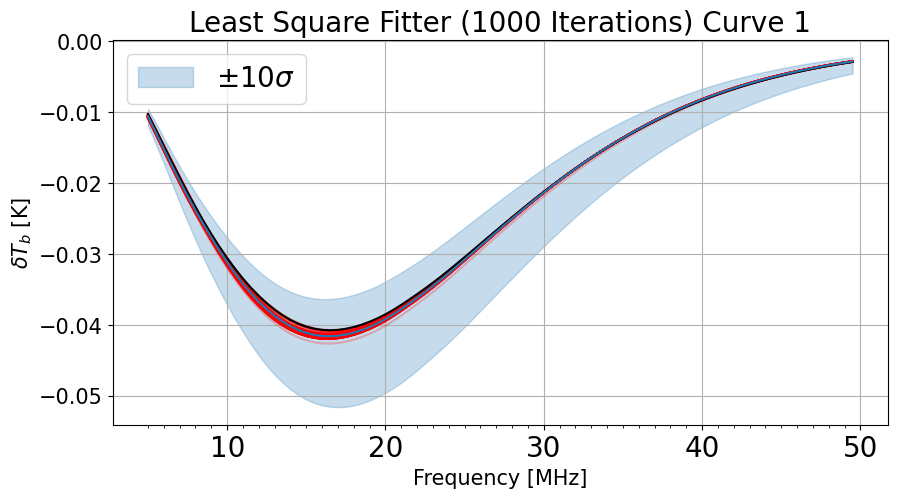

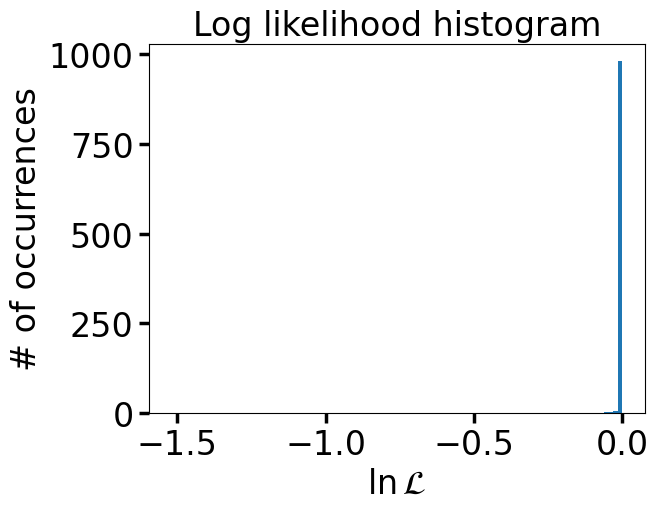

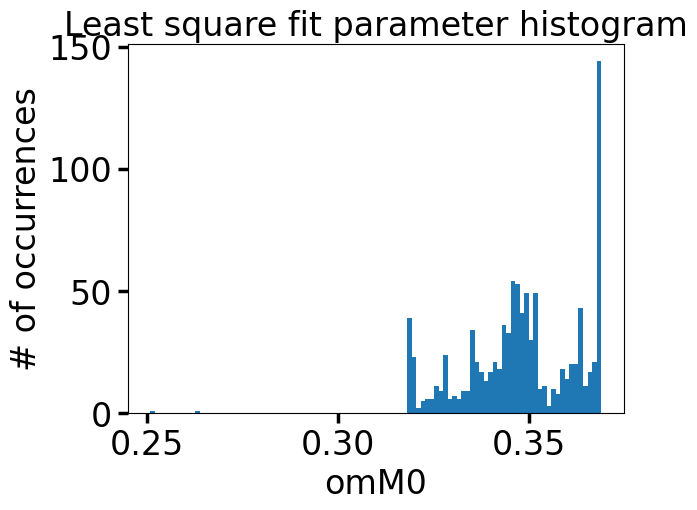

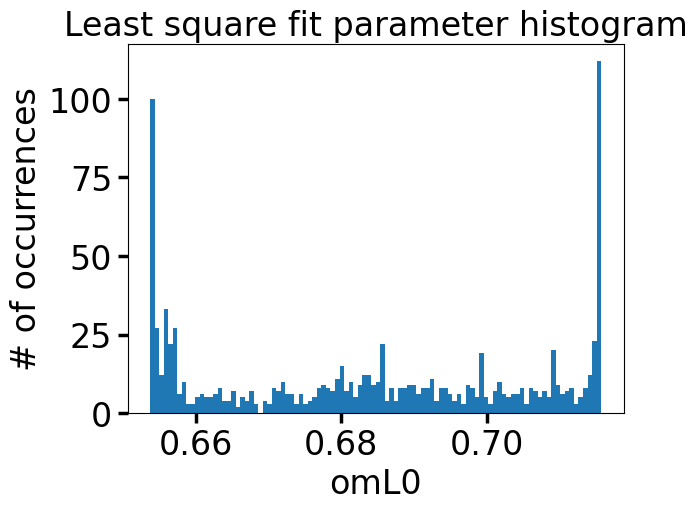

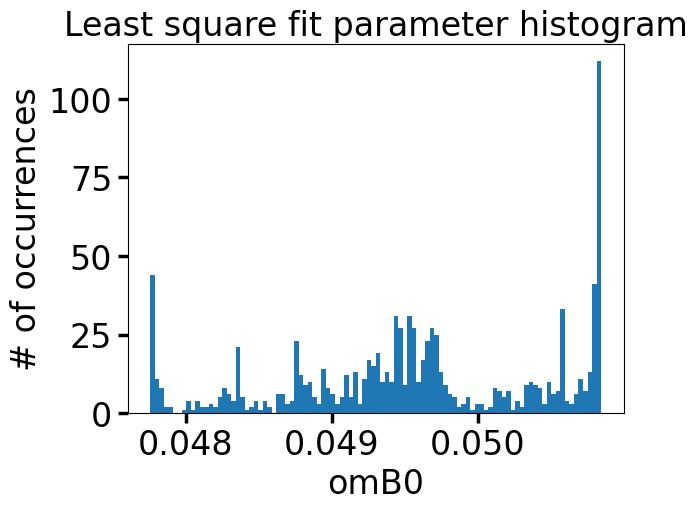

In [ ]:
# Plots all the useful information for the 

plt.figure(figsize=(10, 5))
parameter_max = np.array([[omR0,0],[omM0+omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0-omB0sigma*sigma_range,0]])
parameter_min = np.array([[omR0,0],[omM0-omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0+omB0sigma*sigma_range,0]])
parameter_argmin = np.array([[omR0,0],[least_square_fitter.argmin[0],0],[omK0,0],[least_square_fitter.argmin[1],0],[least_square_fitter.argmin[2],0]])
for n in np.arange(100):
    parameters = np.array([[omR0,0],[least_square_fitter.argmins[n][0],0],[omK0,0],[least_square_fitter.argmins[n][1],0],[least_square_fitter.argmins[n][2],0]])
    plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::],\
                 py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::],color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_argmin,1)[0][0][8::],color="tab:blue")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter (1000 Iterations) Curve {curve_number}", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

least_square_fitter.plot_loglikelihood_histogram(bins=100)
least_square_fitter.plot_parameter_histogram("omM0",bins=100)
least_square_fitter.plot_parameter_histogram("omL0",bins=100)
least_square_fitter.plot_parameter_histogram("omB0",bins=100)

In [ ]:
## Let's start reverse engineering Joshua's code:

# these set the error for the density parameters
omM0sigma = 0.013
omL0sigma = 0.0062
omB0sigma = 0.00014/h**2

curve_number = 2
sigma_range = 10

import os, sys
import numpy as np
import h5py
import matplotlib.pyplot as plot
from pylinex import TrainedBasis, SumModel,\
	BasisModel, SingleConditionalFitModel, ExpandedModel,\
	RepeatExpander, ConditionalFitGaussianLoglikelihood, \
	SlicedModel, GaussianLoglikelihood, LeastSquareFitter, Sampler,\
	BurnRule, NLFitter, TrainingSetCreator, ProjectedModel, Forecaster
from perses.models import TurningPointModel
from perses.simulations import DriftscanSetCreator
from distpy import Expression, UniformConditionDistribution,\
	WindowedDistribution, DistributionList, DistributionSet,\
	UniformDistribution, GaussianDistribution, UniformConditionDistribution

lst_bins = 10
frequencies = frequencies
forecast_file_path = "/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test"
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/least_squares_test3'

signal_training_set_file_name = ''

# Let's make our signal training set and function:
signal_training_set = lambdaCDM_training_set[:,16::2]  # hopefully this doesn't need the exact format of TrainingSetCreator. Won't be too terrible to massage it into that format, but it would be very annoying.
signal_expander = RepeatExpander(lst_bins)
signal_model = LambdaCDMModel(frequencies, in_Kelvin=True)
signal_model = ExpandedModel(signal_model, signal_expander)
model_names = ['signal', 'systematics']

# loads the foreground training set
fg_training_set = test_case_10LSTs
fg_training_set = np.reshape(fg_training_set, (len(fg_training_set), -1)) # this shapes it into the correct shape for th TrainedBasis pylinex class

# signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(omM0-omM0sigma*sigma_range, omM0+omM0sigma*sigma_range)) # omM0
distribution_list.add_distribution(UniformDistribution(omL0-omL0sigma*sigma_range, omL0+omL0sigma*sigma_range)) # omL0
distribution_list.add_distribution(UniformDistribution(omB0-omB0sigma*sigma_range, omB0+omB0sigma*sigma_range)) # omB0

condition_expression = Expression(\
	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
	num_arguments=3, import_strings=['import numpy as np'])

condition_distribution = UniformConditionDistribution(condition_expression)

prior = WindowedDistribution(distribution_list, condition_distribution)

bounds = {\
	'omM0': (omM0-omM0sigma*5, omM0+omM0sigma*5),\
	'omL0': (omL0-omL0sigma*5, omL0+omL0sigma*5),\
	'omB0': (omB0-omB0sigma*5, omB0+omB0sigma*5),\
	}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 

forecast_files = h5py.File(forecast_file_path,'r')
forecaster = Forecaster(forecast_file_path)
error = forecast_files['error'][()]
data = forecast_files['data'][()][curve_number]    # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
input_signal = forecast_files['input_curves/signal'][0] # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
num_linear_fg_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['systematics'].num_basis_vectors

#FG Model and Training Set for Full Data

fg_trained_basis = TrainedBasis(fg_training_set, num_linear_fg_terms, error=error, \
	mean_translation=True)
fg_trained_basis.generate_gaussian_prior(diagonal=True)
fg_priors = fg_trained_basis.gaussian_prior
fg_basis_model = BasisModel(fg_trained_basis)
models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.

full_data_model = SumModel(model_names, models)
fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'systematics', prior=fg_priors)
full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.

linear_fit_parameter_covariance = forecaster.plotter.parameter_covariances['signal'][curve_number]
linear_fit_parameter_mean = forecaster.plotter.parameter_means['signal'][curve_number]
num_linear_signal_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['signal'].num_basis_vectors
basis_sum = forecaster.plotter.get_basis_sum("0")["signal"]
signal_trained_basis = basis_sum
projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)
signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_path,\
	**bounds)

least_square_fitter.run(iterations=1000, attempt_threshold=1000,\
	run_if_iterations_exist=False)

guess_distribution = GaussianDistribution(least_square_fitter.argmin,\
	np.identity(signal_model.num_parameters))

guess_distribution =\
	WindowedDistribution(guess_distribution, condition_distribution)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])

# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test already exists. Will perform analysis using existing file. If you wish to rerun, move or delete existing file.
Computing Least Square Fit...


100%|██████████| 1/1 [00:00<00:00, 56.17it/s]


100%|██████████| 1/1 [00:00<00:00, 40.99it/s]


<Axes: title={'center': 'Least square fit parameter histogram'}, xlabel='omB0', ylabel='# of occurrences'>

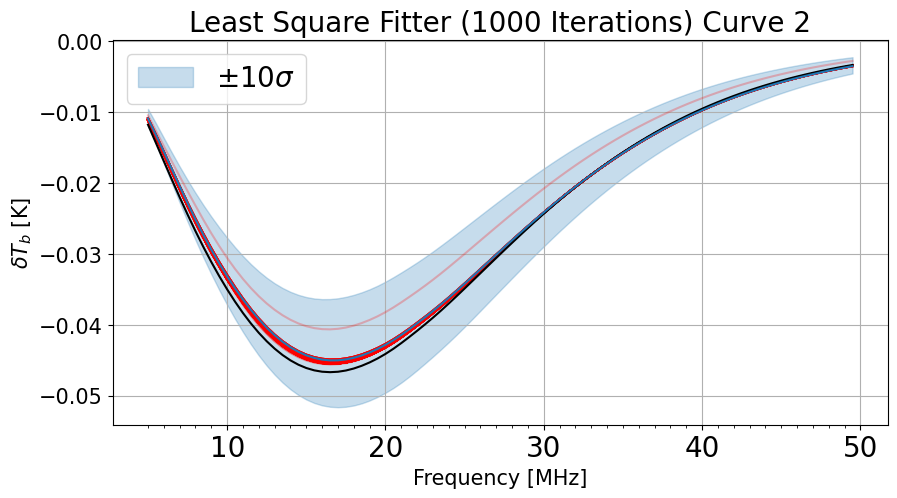

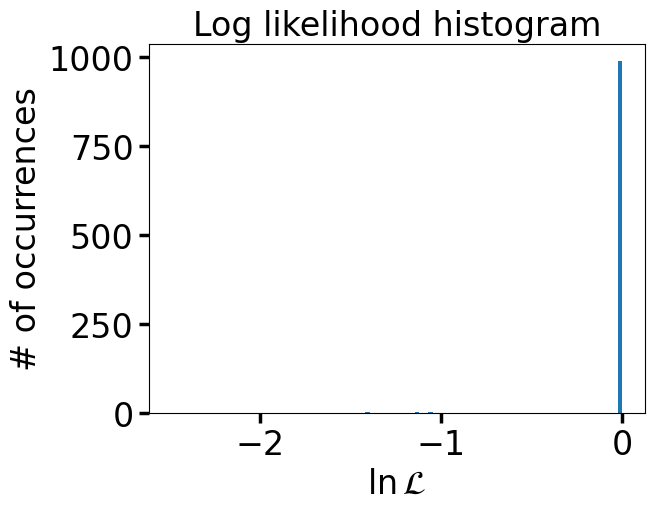

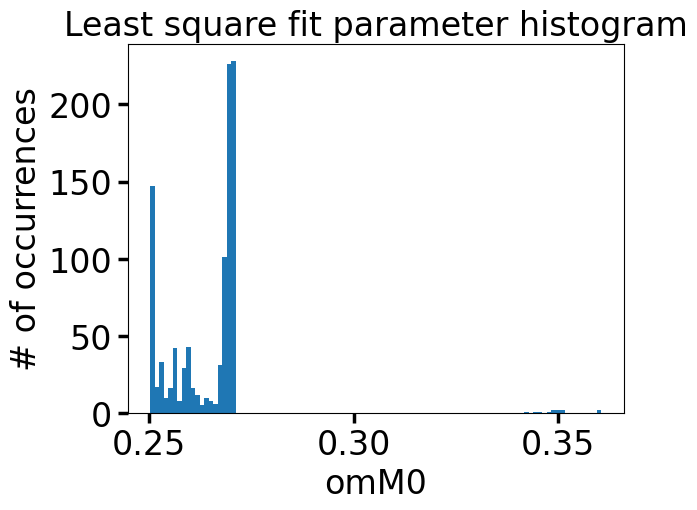

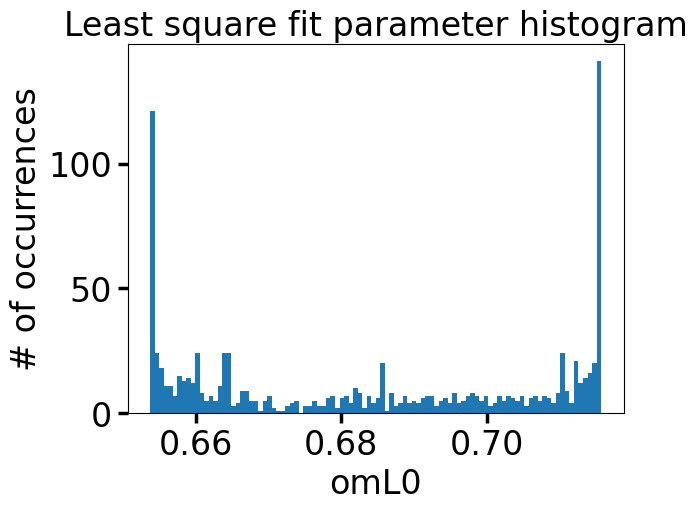

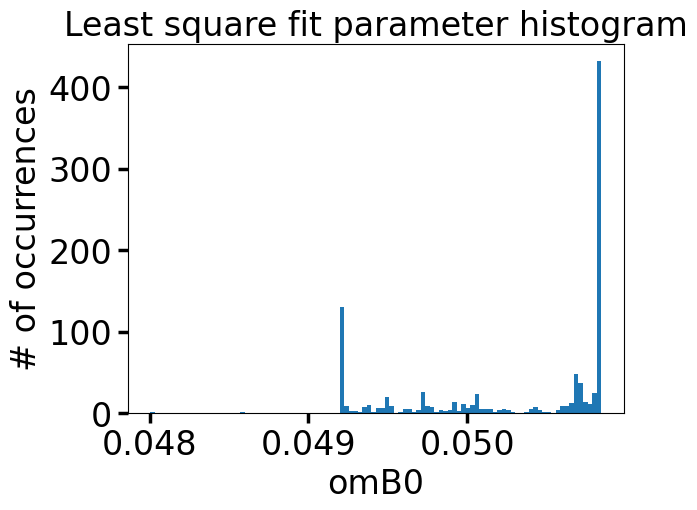

In [ ]:
# Plots all the useful information for the 

plt.figure(figsize=(10, 5))
parameter_max = np.array([[omR0,0],[omM0+omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0-omB0sigma*sigma_range,0]])
parameter_min = np.array([[omR0,0],[omM0-omM0sigma*sigma_range,0],[omK0,0],[omL0+omL0sigma*sigma_range,0],[omB0+omB0sigma*sigma_range,0]])
parameter_argmin = np.array([[omR0,0],[least_square_fitter.argmin[0],0],[omK0,0],[least_square_fitter.argmin[1],0],[least_square_fitter.argmin[2],0]])
for n in np.arange(100):
    parameters = np.array([[omR0,0],[least_square_fitter.argmins[n][0],0],[omK0,0],[least_square_fitter.argmins[n][1],0],[least_square_fitter.argmins[n][2],0]])
    plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::],\
                 py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::],color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_argmin,1)[0][0][8::],color="tab:blue")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter (1000 Iterations) Curve {curve_number}", fontsize=20)
plt.legend(fontsize=20)
plt.grid()

least_square_fitter.plot_loglikelihood_histogram(bins=100)
least_square_fitter.plot_parameter_histogram("omM0",bins=100)
least_square_fitter.plot_parameter_histogram("omL0",bins=100)
least_square_fitter.plot_parameter_histogram("omB0",bins=100)

In [ ]:
loglikelihoods = np.array([])
for n in range(1000):
    loglikelihoods = np.append(loglikelihoods,least_square_fitter.loglikelihood(np.array([least_square_fitter.argmins[n][0],least_square_fitter.argmins[n][1],least_square_fitter.argmins[n][2]])))

100%|██████████| 1/1 [00:00<00:00, 62.45it/s]


In [ ]:
loglikelihoods
threshold = -10e-8
filtered_list = loglikelihoods[loglikelihoods > threshold]

(array([ 1.,  0.,  0.,  0.,  0.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,  2.,
         0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,
         0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,
         0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.,
         0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.

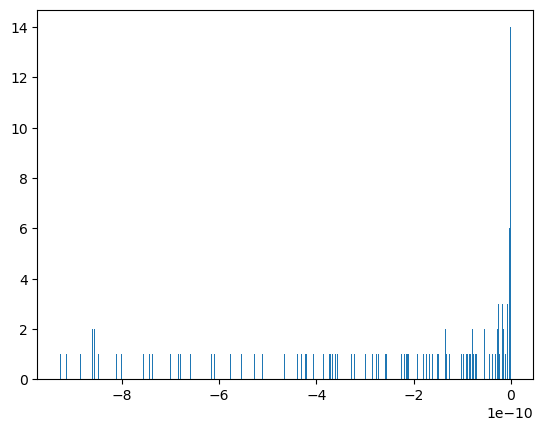

In [ ]:
loglikelihoods
threshold = -10e-10
filtered_list = loglikelihoods[loglikelihoods > threshold]
plt.hist(filtered_list,bins=500)
# plt.xlim(-0.0001,0.0001)

In [ ]:
plt.figure(figsize=(10, 5))

parameters = np.array([[omR0,0],[least_square_fitter.argmin[0],0],[omK0,0],[least_square_fitter.argmin[1],0],[least_square_fitter.argmin[2],0]])
plt.plot(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameters,1)[0][0][8::],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.plot(frequencies,forecaster.plotter.channel_means["signal"][curve_number],color="black")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(r"Least Square Fitter (100 Iterations) Curve 0", fontsize=20)
plt.grid()

<Axes: title={'center': 'Log likelihood histogram'}, xlabel='$\\ln{\\mathcal{L}}$', ylabel='# of occurrences'>

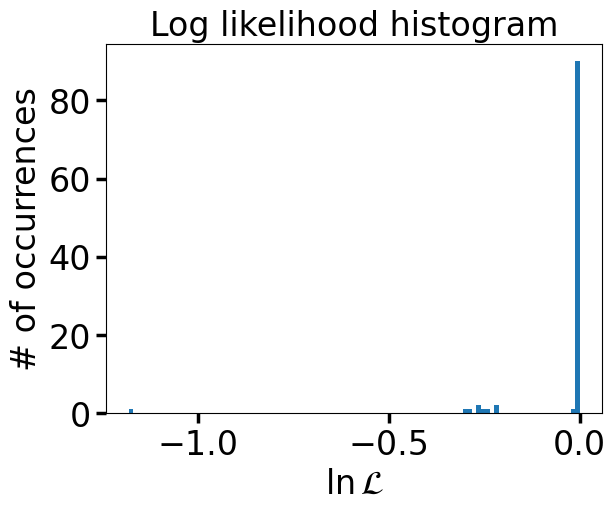

In [ ]:
least_square_fitter.plot_loglikelihood_histogram(bins=100)

In [ ]:
# this is where I made the little bit of code to put in the generate_guess() method for the LeastSquareFitter class.

# draw = np.array([])
# draw_function = lambda lower,upper: np.random.uniform(lower,upper)
# for i,parameter in enumerate(least_square_fitter.parameters):
#     draw = np.append(draw,draw_function(least_square_fitter.prior_set.bounds[parameter][0],least_square_fitter.prior_set.bounds[parameter][1]))
# draw

array([0.26232664, 0.66121955, 0.04921701])

In [ ]:
perses.models.LambdaCDMModel

perses.models.LambdaCDMModel.LambdaCDMModel

100%|██████████| 100/100 [09:00<00:00,  5.40s/it]


Maximum bias of the systematics rms is 4.903217793254975
Maximum bias of the signal rms is 0.26393016429576427
Average number of systematics terms used for fit: 58.86
Average number of signal terms used for fit: 24.54
Reduced Chi Squared of mean fit: [1.07702875]
Mean Reduced Chi Squared: 2.6631287249309055
STD of Reduced Chi Squared Distribution: 7.0579989980490065


100%|██████████| 100/100 [08:38<00:00,  5.18s/it]


Maximum bias of the systematics rms is 3.3540455140875958
Maximum bias of the signal rms is 0.02088293023552934
Average number of systematics terms used for fit: 58.35
Average number of signal terms used for fit: 24.69
Reduced Chi Squared of mean fit: [1.22525174]
Mean Reduced Chi Squared: 1.9562099243663709
STD of Reduced Chi Squared Distribution: 5.061401878191247


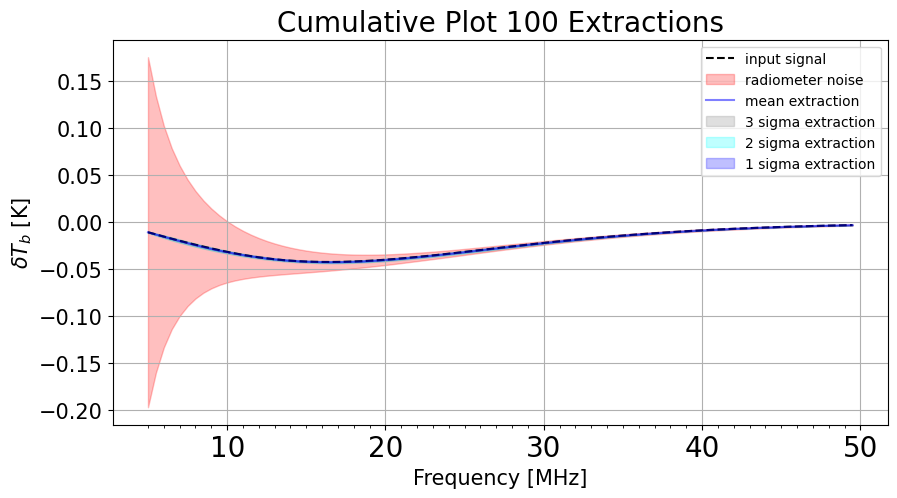

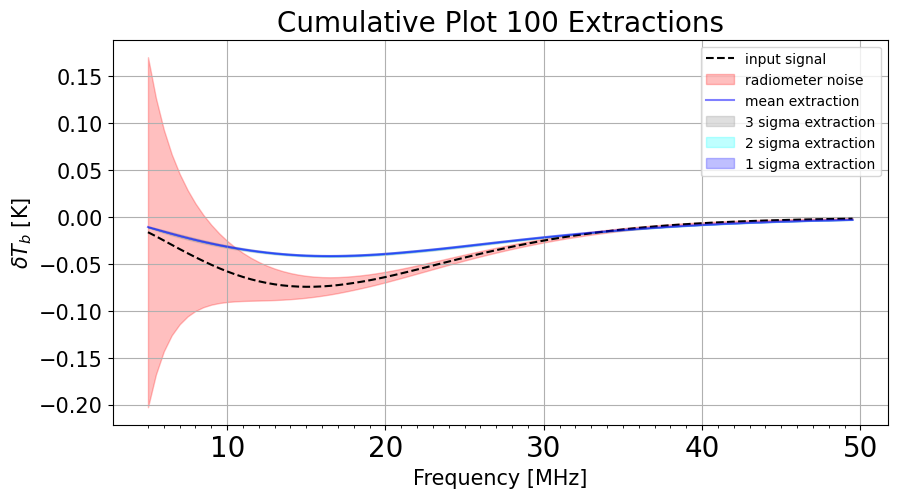

In [ ]:
# Important variables:
n_LSTs = 10 # this should match the number of foreground_training_sets you've made
## Spectral Index Map Variable
n_regions = 8   # number of regions that are created for your multi-region model
temp1 = 10     # lower frequency that is used for the temperature for the spectral index of the spectral index map
temp2 = 50     # upper frequency
f_low = temp1   # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
f_high = temp2  # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
NSIDE = 32
## Monochromatic Beam Variables.
N_beam = 10000   # Number of beams to create. I'm not varying the beam right now, but this may be helpful later.
low_std = 0.4
high_std = 1
## Synchrotron Foreground Variables
ylim = None
N_TS = 1000   # Number of curves in the training set
parameter_variation = [0,0.05,0]
sky_maps = master_foreground_array
sky_maps_truncated = sky_maps[:,4:49,:]  # the trucated sky maps that map the frequency range of frequencies (though it may not match the number of bins)
frequency_range_truncated = np.arange(5,50)  # Truncated frequency range that matches the sky map frequencies
# Pylinex Extraction Variables
N_extractions = 100
num_sig_vectors = 40   # maximum number of signal modes to use in the extractions
num_sys_vectors = 100    # maximum number of systematic modes to use in the extraction
num_basis_vectors = 100  # number of basis vectors to create for the root bases (make sure its as big as the largest num_sys or num_sig_vectors number)
## signal that is used as the input to the observation data: ##
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0/h**2],[H0,0]])
input_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)[0][0][8:] # fiducial signal
input_signal_EDE = EDE_training_set_curves[1,::2]
##  ##
signal_training_set = lambdaCDM_training_set[:,16::2]  ### indexing is needed to get it into the correct shape for the extraction. Training set used in the pylinex fit
signal_training_set_EDE=EDE_training_set_curves[:,::2]

# Step 1: Create the spectral index map that will govern the B_values of the beam (since they govern the indices of the regions).
# NPIX = hp.nside2npix(NSIDE)
# spectral_maps = np.zeros((n_LSTs,NPIX))
# for l in range(n_LSTs):
#     spectral_map = py21cmsig.spectral_index_map(f_low,f_high,n_regions,temp1,temp2,NSIDE,ULSA_direction_32 = master_foreground_array[l])
#     spectral_maps[l] = spectral_map

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","w")
# f.create_dataset("spectral maps",data=spectral_maps)
# f.close()

if NSIDE != 32:
    raise ValueError ("The saved spectral maps are only 32 bit right now.")
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","r")
spectral_maps = np.array(hdf5["spectral maps"])   # I'v visually varified that these make sense


# Step 2: Create the monochromatic beam

# monochromatic_gaussian_B_values = py21cmsig.create_monochromatic_gaussian_beam_training_set(frequencies,N_beam,[low_std,high_std],n_LSTs,n_regions,NSIDE,spectral_maps,plot_extremes = True)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","w")
# f.create_dataset("B values",data=monochromatic_gaussian_B_values[0])
# f.create_dataset("parameters",data=monochromatic_gaussian_B_values[1])
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","r")
monochromatic_gaussian_B_values = np.array(hdf5["B values"])   # I've visually varified that these make sense
monochromatic_gaussian_parameters = np.array(hdf5["parameters"])
if len(frequencies) != monochromatic_gaussian_B_values[0][0].shape[0]:
    raise ValueError ("Your loaded B_values do not have the same length as your frequencies. This will cause problems later")

# Step 3: Create the beam-weighted foreground training set:
## Step 3a: Create the BTS_curves to input to the foreground function:

# print("NOTE: The B_values must be massaged into a form that fits the frequency bins of the sky maps. In this case I've massaged the 90 bin B_values to fit the 45 bin sky maps")
# B_values_massaged = monochromatic_gaussian_B_values[:,:,::2,:]  ### NOTE: the ::2 allows the 90 frequency bin B_values to match the 45 frequency bins of the sky maps
# BTS_curves_monochromaticbeam = create_BTS_curves(frequencies,frequency_range_truncated,B_values_massaged,sky_maps_truncated,n_regions,spectral_index_map,n_LSTs)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","w")
# f.create_dataset("curves",data=BTS_curves_monochromaticbeam)
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","r")
BTS_curves_monochromaticbeam = np.array(hdf5["curves"])   # I've visually varified that these make sense

# simulated_foreground_array sets the "true sky" observations that will be compared to the training sets for the extraction. It's your data, basically. 
parameter_variation_true = [0,0,0]   
simulated_foreground_array_10LSTs = np.zeros((n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    simulated_foreground_array_10LSTs[l,:] = synchrotron_foreground_updated_given_Bvalues(1,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation_true,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

# The systematics training set itself
monochro_beam_TS_10LSTs = np.zeros((N_TS,n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    monochro_beam_TS_10LSTs[:,l,:] = synchrotron_foreground_updated_given_Bvalues(N_TS,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

static_monchrome_beam_simulation=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs,input_signal,N_antenna,dnu,dt)
static_monchrome_beam_simulation_EDE=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs,input_signal_EDE,N_antenna,dnu,dt)

# Pylinex Extractions
data=static_monchrome_beam_simulation[0]
noise = static_monchrome_beam_simulation[5]
signal = static_monchrome_beam_simulation[1]
systematics = static_monchrome_beam_simulation[2]
extraction_static_monochrome_fiducial = py21cmsig.extraction_statistics(N_extractions,monochro_beam_TS_10LSTs,signal_training_set,data,noise,signal,systematics,\
                                                  frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
                                                    title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
                                                        num_basis_vectors=num_basis_vectors,ylim=ylim,priors=True)

data_EDE=static_monchrome_beam_simulation_EDE[0]
noise_EDE = static_monchrome_beam_simulation_EDE[5]
signal_EDE = static_monchrome_beam_simulation_EDE[1]
systematics_EDE = static_monchrome_beam_simulation_EDE[2]
extraction_static_monochrome_EDE = py21cmsig.extraction_statistics(N_extractions,monochro_beam_TS_10LSTs,signal_training_set,data_EDE,noise_EDE,signal_EDE,systematics_EDE,\
                                                  frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
                                                    title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
                                                        num_basis_vectors=num_basis_vectors,ylim=ylim,priors=True)



# single_extraction_monochromatic_DMD = py21cmsig.pylinex_extraction(monochro_beam_TS_10LSTs,signal_training_set_DMD,data_DMD,noise_DMD,signal_DMD,frequencies,\
#                                                                multi_spectra=True,num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,num_basis_vectors=num_basis_vectors,ylim=ylim,priors=False)

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1., 11., 13., 28., 20.,
        12.,  6.,  3.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.]),
 array([0.  , 0.08, 0.16, 0.24, 0.32, 0.4 , 0.48, 0.56, 0.64, 0.72, 0.8 ,
        0.88, 0.96, 1.04, 1.12, 1.2 , 1.28, 1.36, 1.44, 1.52, 1.6 , 1.68,
        1.76, 1.84, 1.92, 2.  , 2.08, 2.16, 2.24, 2.32, 2.4 , 2.48, 2.56,
        2.64, 2.72, 2.8 , 2.88, 2.96, 3.04, 3.12, 3.2 , 3.28, 3.36, 3.44,
        3.52, 3.6 , 3.68, 3.76, 3.84, 3.92, 4.  , 4.08, 4.16, 4.24, 4.32,
        4.4 , 4.48, 4.56, 4.64, 4.72, 4.8 , 4.88, 4.96, 5.04, 5.

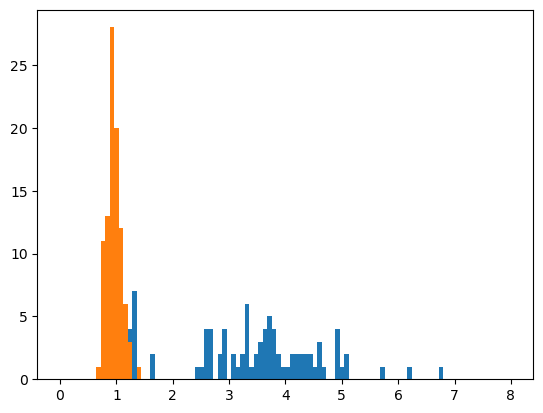

In [ ]:
histogram10=copy.deepcopy(extraction_static_monochrome_EDE[6])
histogram10=np.delete(histogram10,np.where(histogram10 >= 2000))
histogram20=copy.deepcopy(extraction_static_monochrome_fiducial[6])
histogram20=np.delete(histogram20,np.where(histogram20 >= 2000))


plt.hist(extraction_static_monochrome_EDE[6],bins=100,range=(0,8))
plt.hist(extraction_static_monochrome_fiducial[6],bins=100,range=(0,8))

In [ ]:
histogram10.mean()
# histogram10.std()

3.261459159819986

In [ ]:
histogram10.mean()

5.396182121745308

In [ ]:
extraction_static_monochrome_fiducial[6].std()

0.11100144360074228

(array([31.,  0.,  0.,  0.,  0., 13.,  0.,  0.,  0., 56.]),
 array([53. , 53.2, 53.4, 53.6, 53.8, 54. , 54.2, 54.4, 54.6, 54.8, 55. ]),
 <BarContainer object of 10 artists>)

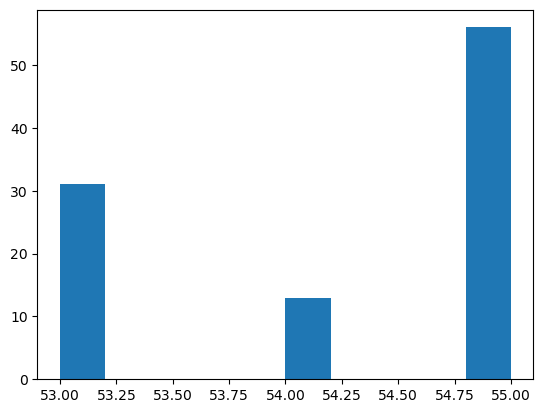

In [ ]:
plt.hist(extraction_static_monochrome_EDE[13])

100%|██████████| 100/100 [05:16<00:00,  3.16s/it]


Maximum bias of the systematics rms is 58.6824889776307
Maximum bias of the signal rms is 58.7046442639564
Average number of systematics terms used for fit: 60.72
Average number of signal terms used for fit: 2.73
Reduced Chi Squared of mean fit: [0.99949667]
Mean Reduced Chi Squared: 0.9946114634488126
STD of Reduced Chi Squared Distribution: 0.04623272386532318


100%|██████████| 100/100 [05:22<00:00,  3.22s/it]


Maximum bias of the systematics rms is 98.51136136466657
Maximum bias of the signal rms is 98.54497435246293
Average number of systematics terms used for fit: 60.61
Average number of signal terms used for fit: 4.18
Reduced Chi Squared of mean fit: [1.02041634]
Mean Reduced Chi Squared: 0.9919244129884605
STD of Reduced Chi Squared Distribution: 0.04872459054158861


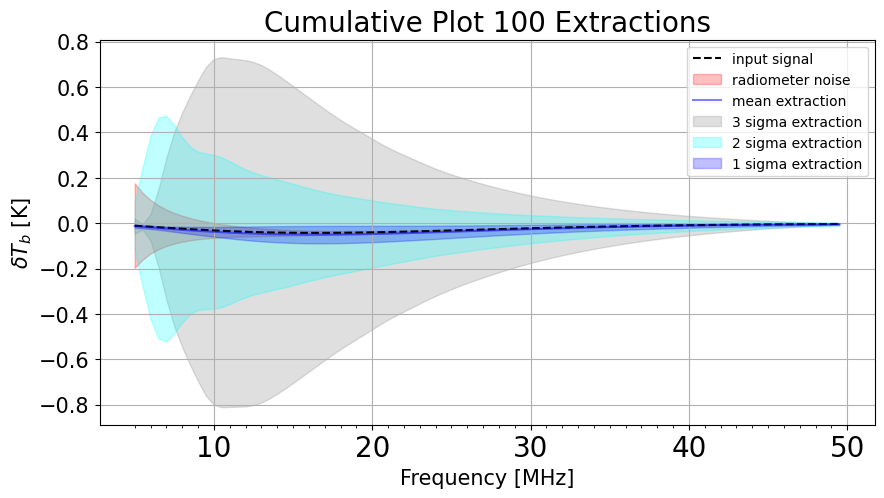

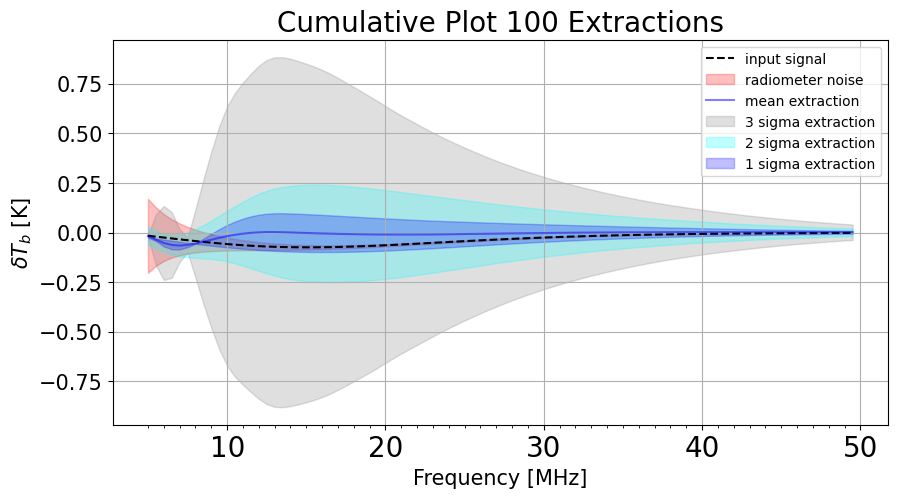

In [ ]:
# Important variables:
n_LSTs = 10 # this should match the number of foreground_training_sets you've made
## Spectral Index Map Variable
n_regions = 8   # number of regions that are created for your multi-region model
temp1 = 10     # lower frequency that is used for the temperature for the spectral index of the spectral index map
temp2 = 50     # upper frequency
f_low = temp1   # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
f_high = temp2  # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
NSIDE = 32
## Monochromatic Beam Variables.
N_beam = 10000   # Number of beams to create. I'm not varying the beam right now, but this may be helpful later.
low_std = 0.4
high_std = 1
## Synchrotron Foreground Variables
ylim = None
N_TS = 1000   # Number of curves in the training set
parameter_variation = [0,0.05,0]
sky_maps = master_foreground_array
sky_maps_truncated = sky_maps[:,4:49,:]  # the trucated sky maps that map the frequency range of frequencies (though it may not match the number of bins)
frequency_range_truncated = np.arange(5,50)  # Truncated frequency range that matches the sky map frequencies
# Pylinex Extraction Variables
N_extractions = 100
num_sig_vectors = 40   # maximum number of signal modes to use in the extractions
num_sys_vectors = 100    # maximum number of systematic modes to use in the extraction
num_basis_vectors = 100  # number of basis vectors to create for the root bases (make sure its as big as the largest num_sys or num_sig_vectors number)
## signal that is used as the input to the observation data: ##
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0/h**2],[H0,0]])
input_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)[0][0][8:] # fiducial signal
input_signal_EDE = EDE_training_set_curves[1,::2]
##  ##
signal_training_set = lambdaCDM_training_set[:,16::2]  ### indexing is needed to get it into the correct shape for the extraction. Training set used in the pylinex fit
signal_training_set_EDE=EDE_training_set_curves[:,::2]

# Step 1: Create the spectral index map that will govern the B_values of the beam (since they govern the indices of the regions).
# NPIX = hp.nside2npix(NSIDE)
# spectral_maps = np.zeros((n_LSTs,NPIX))
# for l in range(n_LSTs):
#     spectral_map = py21cmsig.spectral_index_map(f_low,f_high,n_regions,temp1,temp2,NSIDE,ULSA_direction_32 = master_foreground_array[l])
#     spectral_maps[l] = spectral_map

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","w")
# f.create_dataset("spectral maps",data=spectral_maps)
# f.close()

if NSIDE != 32:
    raise ValueError ("The saved spectral maps are only 32 bit right now.")
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","r")
spectral_maps = np.array(hdf5["spectral maps"])   # I'v visually varified that these make sense


# Step 2: Create the monochromatic beam

# monochromatic_gaussian_B_values = py21cmsig.create_monochromatic_gaussian_beam_training_set(frequencies,N_beam,[low_std,high_std],n_LSTs,n_regions,NSIDE,spectral_maps,plot_extremes = True)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","w")
# f.create_dataset("B values",data=monochromatic_gaussian_B_values[0])
# f.create_dataset("parameters",data=monochromatic_gaussian_B_values[1])
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","r")
monochromatic_gaussian_B_values = np.array(hdf5["B values"])   # I've visually varified that these make sense
monochromatic_gaussian_parameters = np.array(hdf5["parameters"])
if len(frequencies) != monochromatic_gaussian_B_values[0][0].shape[0]:
    raise ValueError ("Your loaded B_values do not have the same length as your frequencies. This will cause problems later")

# Step 3: Create the beam-weighted foreground training set:
## Step 3a: Create the BTS_curves to input to the foreground function:

# print("NOTE: The B_values must be massaged into a form that fits the frequency bins of the sky maps. In this case I've massaged the 90 bin B_values to fit the 45 bin sky maps")
# B_values_massaged = monochromatic_gaussian_B_values[:,:,::2,:]  ### NOTE: the ::2 allows the 90 frequency bin B_values to match the 45 frequency bins of the sky maps
# BTS_curves_monochromaticbeam = create_BTS_curves(frequencies,frequency_range_truncated,B_values_massaged,sky_maps_truncated,n_regions,spectral_index_map,n_LSTs)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","w")
# f.create_dataset("curves",data=BTS_curves_monochromaticbeam)
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","r")
BTS_curves_monochromaticbeam = np.array(hdf5["curves"])   # I've visually varified that these make sense

# simulated_foreground_array sets the "true sky" observations that will be compared to the training sets for the extraction. It's your data, basically. 
parameter_variation_true = [0,0,0]   
simulated_foreground_array_10LSTs = np.zeros((n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    simulated_foreground_array_10LSTs[l,:] = synchrotron_foreground_updated_given_Bvalues(1,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation_true,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

# The systematics training set itself
monochro_beam_TS_10LSTs = np.zeros((N_TS,n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    monochro_beam_TS_10LSTs[:,l,:] = synchrotron_foreground_updated_given_Bvalues(N_TS,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

static_monchrome_beam_simulation=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs,input_signal,N_antenna,dnu,dt)
static_monchrome_beam_simulation_EDE=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs,input_signal_EDE,N_antenna,dnu,dt)

# Pylinex Extractions
data=static_monchrome_beam_simulation[0]
noise = static_monchrome_beam_simulation[5]
signal = static_monchrome_beam_simulation[1]
systematics = static_monchrome_beam_simulation[2]
extraction_static_monochrome_fiducial_priors = py21cmsig.extraction_statistics(N_extractions,monochro_beam_TS_10LSTs,signal_training_set,data,noise,signal,systematics,\
                                                  frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
                                                    title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
                                                        num_basis_vectors=num_basis_vectors,ylim=ylim,priors=False)

data_EDE=static_monchrome_beam_simulation_EDE[0]
noise_EDE = static_monchrome_beam_simulation_EDE[5]
signal_EDE = static_monchrome_beam_simulation_EDE[1]
systematics_EDE = static_monchrome_beam_simulation_EDE[2]
extraction_static_monochrome_EDE_priors = py21cmsig.extraction_statistics(N_extractions,monochro_beam_TS_10LSTs,signal_training_set,data_EDE,noise_EDE,signal_EDE,systematics_EDE,\
                                                  frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
                                                    title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
                                                        num_basis_vectors=num_basis_vectors,ylim=ylim,priors=False)



# single_extraction_monochromatic_DMD = py21cmsig.pylinex_extraction(monochro_beam_TS_10LSTs,signal_training_set_DMD,data_DMD,noise_DMD,signal_DMD,frequencies,\
#                                                                multi_spectra=True,num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,num_basis_vectors=num_basis_vectors,ylim=ylim,priors=False)

In [ ]:
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/fiducial_chi_squared_1000extractions","r")
histogram1 = np.array(hdf5["curves"])   # I've visually varified that these make sense
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/EDE_chi_squared_1000extractions","r")
histogram2 = np.array(hdf5["curves"])   # I've visually varified that these make sense

In [ ]:
# histogram1=copy.deepcopy(extraction_static_monochrome_fiducial_priors[5])
# histogram1=np.delete(histogram1,np.where(histogram1 >= 5))
# histogram2=copy.deepcopy(extraction_static_monochrome_EDE_priors[5])
# histogram2=np.delete(histogram2,np.where(histogram2 >= 5))

print(f"{histogram1.mean()} +/-  {histogram1.std()}")
print(f"{histogram2.mean()} +/-  {histogram2.std()}")

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/fiducial_chi_squared_1000extractions","w")
# f.create_dataset("curves",data=histogram1)
# f.close()

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/EDE_chi_squared_1000extractions","w")
# f.create_dataset("curves",data=histogram2)
# f.close()

1.0562370103621956 +/-  0.051215067242996896
1.2544027205043868 +/-  0.06738930745758408


In [ ]:
(histogram1.mean()+3*histogram1.std()-histogram2.mean())/histogram2.std()

-0.6606464748316708

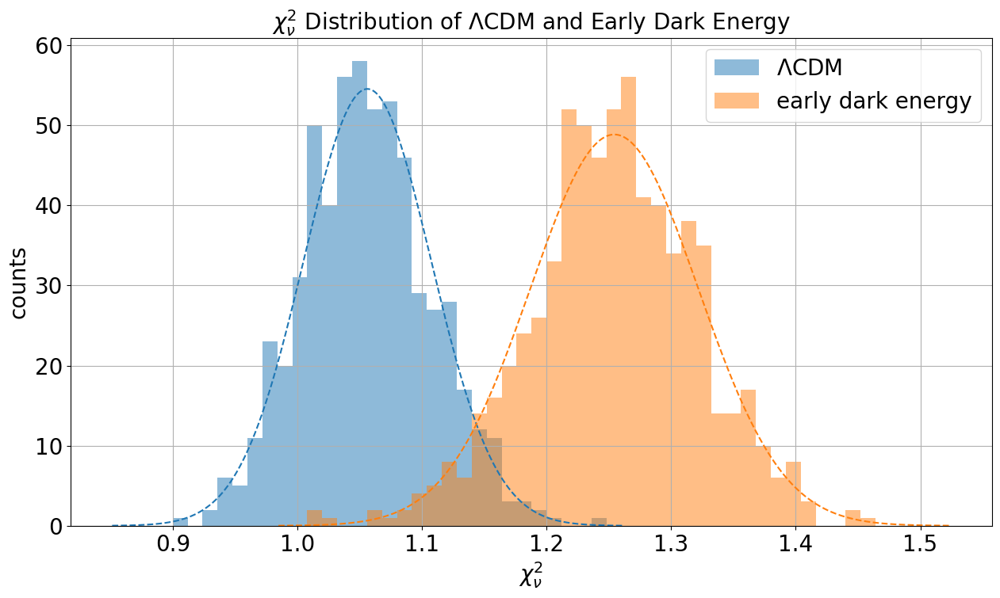

In [ ]:
fig=plt.figure(figsize=(15, 8))
plt.hist(histogram1,bins=50,range=(0.9,1.5),alpha=0.5,label=r"$\Lambda$CDM")
plt.hist(histogram2,bins = 50,range=(0.9,1.5),alpha=0.5,label="early dark energy")
mu1,mu2 = histogram1.mean(),histogram2.mean()
sigma1,sigma2 = histogram1.std(),histogram2.std()
x1,x2 = np.linspace(mu1 - 4*sigma1, mu1 + 4*sigma1, 1000),np.linspace(mu2 - 4*sigma2, mu2 + 4*sigma2, 1000)
y1,y2 = scipy.stats.norm.pdf(x1, loc=mu1, scale=sigma1),scipy.stats.norm.pdf(x2, loc=mu2, scale=sigma2)
plt.plot(x1,y1*7,color="tab:blue",ls="--")
plt.plot(x2,y2*8.25,color="tab:orange",ls="--")
plt.grid()
plt.ylabel("counts",fontsize=20)
plt.xlabel(r"$\chi^2_\nu$",fontsize=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title(r"$\chi^2_\nu$ Distribution of $\Lambda$CDM and Early Dark Energy",fontsize=20)
plt.legend(fontsize=20)

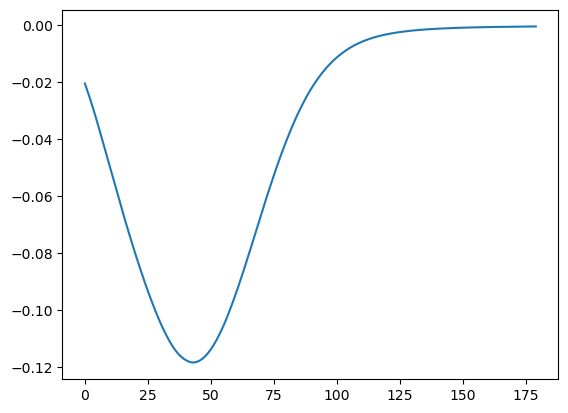

In [ ]:
plt.plot(MCDM_training_set_curves[0])

In [ ]:
n_LSTs

10

100%|██████████| 10/10 [00:54<00:00,  5.46s/it]


Maximum bias of the systematics rms is 70.09780608332721
Maximum bias of the signal rms is 70.0766272404862
Average number of systematics terms used for fit: 60.8
Average number of signal terms used for fit: 5.6
Reduced Chi Squared of mean fit: [1.01737306]
Mean Reduced Chi Squared: 0.9902079797432393
STD of Reduced Chi Squared Distribution: 0.033660564054995845


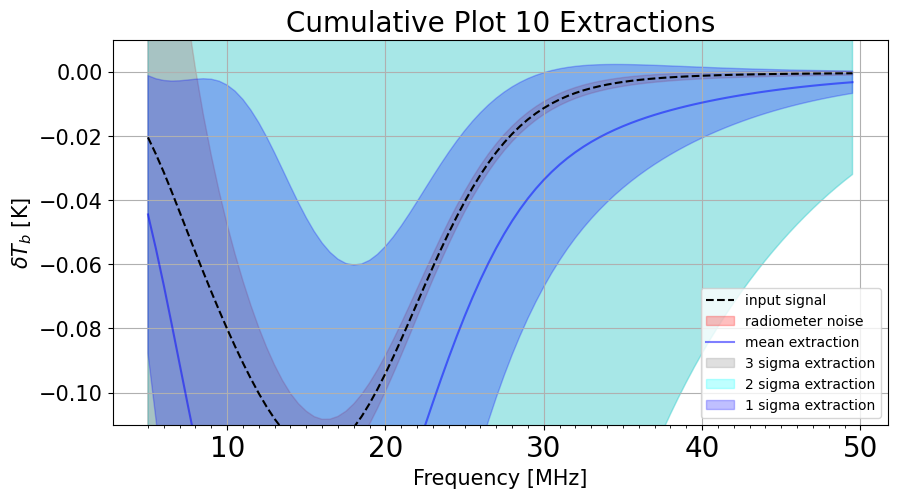

In [ ]:
# Important variables:
n_LSTs = 10 # this should match the number of foreground_training_sets you've made
## Spectral Index Map Variable
n_regions = 8   # number of regions that are created for your multi-region model
temp1 = 10     # lower frequency that is used for the temperature for the spectral index of the spectral index map
temp2 = 50     # upper frequency
f_low = temp1   # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
f_high = temp2  # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
NSIDE = 32
## Monochromatic Beam Variables.
N_beam = 10000   # Number of beams to create. I'm not varying the beam right now, but this may be helpful later.
low_std = 0.4
high_std = 1
## Synchrotron Foreground Variables
ylim = (-0.11,0.01)
N_TS = 1000   # Number of curves in the training set
parameter_variation = [0,0.05,0]
sky_maps = master_foreground_array
sky_maps_truncated = sky_maps[:,4:49,:]  # the trucated sky maps that map the frequency range of frequencies (though it may not match the number of bins)
frequency_range_truncated = np.arange(5,50)  # Truncated frequency range that matches the sky map frequencies
# Pylinex Extraction Variables
N_extractions = 10
num_sig_vectors = 20   # maximum number of signal modes to use in the extractions
num_sys_vectors = 200    # maximum number of systematic modes to use in the extraction
num_basis_vectors = 200  # number of basis vectors to create for the root bases (make sure its as big as the largest num_sys or num_sig_vectors number)
## signal that is used as the input to the observation data: ##
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0/h**2],[H0,0]])
input_signal_MCDM = MCDM_training_set_curves[0,::2]
##  ##
signal_training_set_MCDM = MCDM_training_set_curves[:,::2]  ### indexing is neMCDMd to get it into the correct shape for the extraction. Training set used in the pylinex fit


# Step 1: Create the spectral index map that will govern the B_values of the beam (since they govern the indices of the regions).
# NPIX = hp.nside2npix(NSIDE)
# spectral_maps = np.zeros((n_LSTs,NPIX))
# for l in range(n_LSTs):
#     spectral_map = py21cmsig.spectral_index_map(f_low,f_high,n_regions,temp1,temp2,NSIDE,ULSA_direction_32 = master_foreground_array[l])
#     spectral_maps[l] = spectral_map

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","w")
# f.create_dataset("spectral maps",data=spectral_maps)
# f.close()

if NSIDE != 32:
    raise ValueError ("The saved spectral maps are only 32 bit right now.")
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","r")
spectral_maps = np.array(hdf5["spectral maps"])   # I'v visually varified that these make sense


# Step 2: Create the monochromatic beam

# monochromatic_gaussian_B_values = py21cmsig.create_monochromatic_gaussian_beam_training_set(frequencies,N_beam,[low_std,high_std],n_LSTs,n_regions,NSIDE,spectral_maps,plot_extremes = True)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","w")
# f.create_dataset("B values",data=monochromatic_gaussian_B_values[0])
# f.create_dataset("parameters",data=monochromatic_gaussian_B_values[1])
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","r")
monochromatic_gaussian_B_values = np.array(hdf5["B values"])   # I've visually varified that these make sense
monochromatic_gaussian_parameters = np.array(hdf5["parameters"])
if len(frequencies) != monochromatic_gaussian_B_values[0][0].shape[0]:
    raise ValueError ("Your loaded B_values do not have the same length as your frequencies. This will cause problems later")

# Step 3: Create the beam-weighted foreground training set:
## Step 3a: Create the BTS_curves to input to the foreground function:

# print("NOTE: The B_values must be massaged into a form that fits the frequency bins of the sky maps. In this case I've massaged the 90 bin B_values to fit the 45 bin sky maps")
# B_values_massaged = monochromatic_gaussian_B_values[:,:,::2,:]  ### NOTE: the ::2 allows the 90 frequency bin B_values to match the 45 frequency bins of the sky maps
# BTS_curves_monochromaticbeam = create_BTS_curves(frequencies,frequency_range_truncated,B_values_massaged,sky_maps_truncated,n_regions,spectral_index_map,n_LSTs)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","w")
# f.create_dataset("curves",data=BTS_curves_monochromaticbeam)
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","r")
BTS_curves_monochromaticbeam = np.array(hdf5["curves"])   # I've visually varified that these make sense

# simulated_foreground_array sets the "true sky" observations that will be compared to the training sets for the extraction. It's your data, basically. 
parameter_variation_true = [0,0,0]   
simulated_foreground_array_10LSTs_MCDM = np.zeros((n_LSTs,len(frequencies)))
for l in np.arange(n_LSTs):
    simulated_foreground_array_10LSTs_MCDM[l,:] = synchrotron_foreground_updated_given_Bvalues(1,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation_true,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

# The systematics training set itself
monochro_beam_TS_10LSTs = np.zeros((N_TS,n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    monochro_beam_TS_10LSTs[:,l,:] = synchrotron_foreground_updated_given_Bvalues(N_TS,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

static_monchrome_beam_simulation_MCDM=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs_MCDM,input_signal_MCDM,N_antenna,dnu,dt)

# Pylinex Extractions
data_MCDM=static_monchrome_beam_simulation_MCDM[0]
noise_MCDM = static_monchrome_beam_simulation_MCDM[5]
signal_MCDM = static_monchrome_beam_simulation_MCDM[1]
systematics_MCDM = static_monchrome_beam_simulation_MCDM[2]
test_extraction_static_monochrome_MCDM = py21cmsig.extraction_statistics(N_extractions,monochro_beam_TS_10LSTs,signal_training_set_MCDM,data_MCDM,noise_MCDM,signal_MCDM,systematics_MCDM,\
                                                  frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
                                                    title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
                                                        num_basis_vectors=num_basis_vectors,ylim=ylim,priors=False)

# single_extraction_monochromatic_MCDM = py21cmsig.pylinex_extraction(monochro_beam_TS_10LSTs,signal_training_set_MCDM,data_MCDM,noise_MCDM,signal_MCDM,frequencies,\
#                                                                multi_spectra=True,num_sig_vectors=3,num_sys_vectors=num_sys_vectors,num_basis_vectors=num_basis_vectors,ylim=ylim)





In [ ]:
fig=plt.figure(figsize=(15, 8))
plt.hist(histogram1,bins=50,range=(0.9,1.5),alpha=0.5,label=r"$\Lambda$CDM")
plt.hist(histogram2,bins = 50,range=(0.9,1.5),alpha=0.5,label="early dark energy")
mu1,mu2 = histogram1.mean(),histogram2.mean()
sigma1,sigma2 = histogram1.std(),histogram2.std()
x1,x2 = np.linspace(mu1 - 4*sigma1, mu1 + 4*sigma1, 1000),np.linspace(mu2 - 4*sigma2, mu2 + 4*sigma2, 1000)
y1,y2 = scipy.stats.norm.pdf(x1, loc=mu1, scale=sigma1),scipy.stats.norm.pdf(x2, loc=mu2, scale=sigma2)
plt.plot(x1,y1*7,color="tab:blue",ls="--")
plt.plot(x2,y2*8.25,color="tab:orange",ls="--")
plt.grid()
plt.ylabel("counts",fontsize=20)
plt.xlabel(r"$\chi^2_\nu$",fontsize=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.title(r"$\chi^2_\nu$ Distribution of $\Lambda$CDM and Early Dark Energy",fontsize=20)
plt.legend(fontsize=20)

In [ ]:
extraction_static_monochrome_DMD = py21cmsig.extraction_statistics(100,monochro_beam_TS_10LSTs,signal_training_set,data_DMD,noise_DMD,signal_DMD,systematics_DMD,\
                                                  frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
                                                    title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
                                                        num_basis_vectors=num_basis_vectors,ylim=ylim,priors=True)

NameError: name 'monochro_beam_TS_10LSTs' is not defined

In [ ]:
extraction_static_monochrome_DMD[5][44] = 1

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  1.,  5.,  9.,  9.,  2.,
         6.,  9.,  6., 10.,  2.,  4.,  6.,  9.,  4.,  5.,  3.,  2.,  1.,
         1.,  2.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.]),
 array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
        0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
        0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
        0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
        0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.  , 1.01, 1.02, 1.03, 1.04,
        1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.

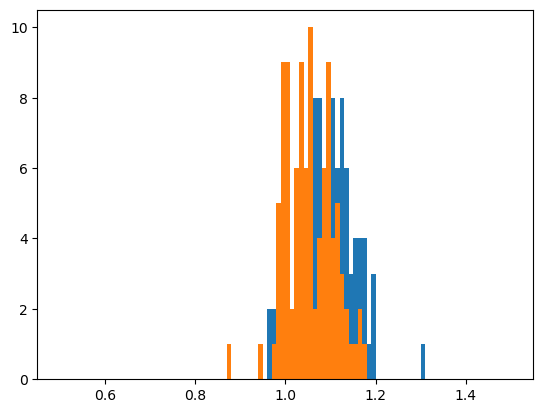

In [ ]:
plt.hist(extraction_static_monochrome_DMD[5],bins=100,range=(0.5,1.5))
plt.hist(extraction_static_monochrome_fiducial[5],bins=100,range=(0.5,1.5))

(0.0, 2.0)

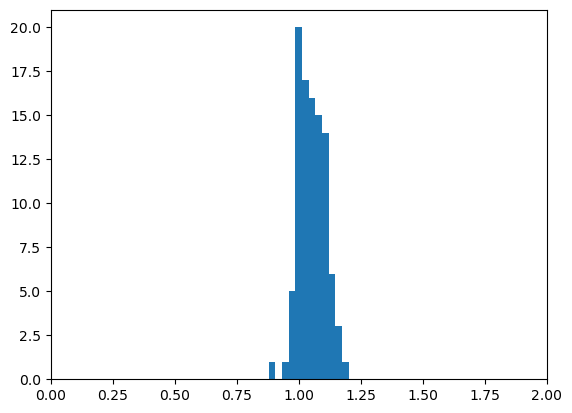

In [ ]:
plt.hist(extraction_static_monochrome_fiducial[5],bins=1000)
plt.xlim(0,2)

In [ ]:
extraction_static_monochrome_fiducial[0].shape

(100, 90)

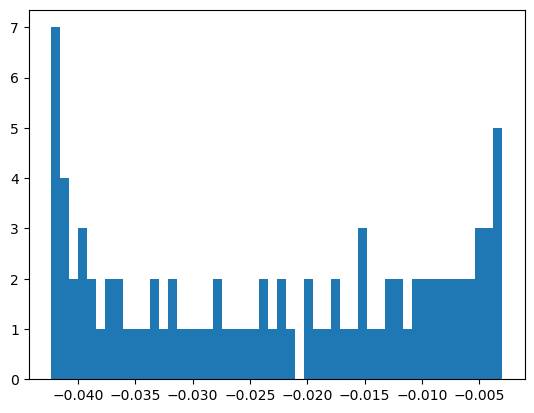

In [ ]:
derpp=plt.hist(f_real,bins=50)[1]
# plt.hist(f_obs,bins=25)

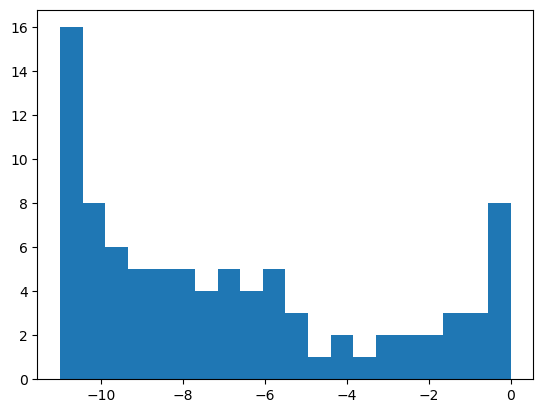

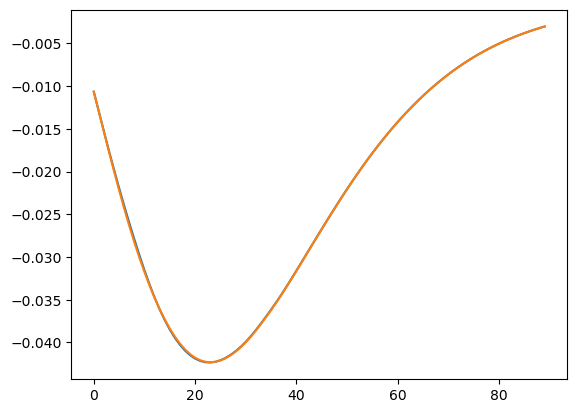

In [ ]:
plt.plot(f_real)
plt.plot(f_obs)

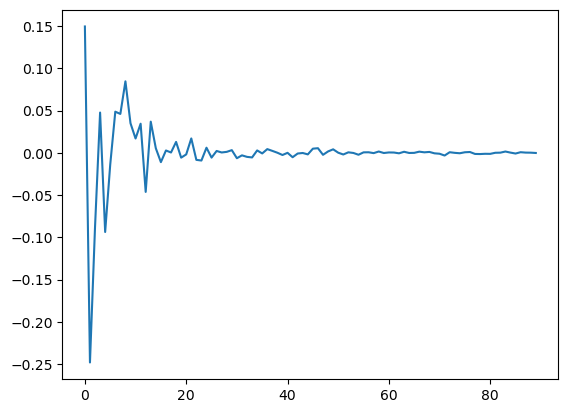

In [ ]:
plt.plot(static_monchrome_beam_simulation[3][1])

In [ ]:
test_signal=py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)[0][0][8:]
test_signal.shape

100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


(90,)

In [ ]:
noise_mod=scipy.interpolate.CubicSpline(np.arange(5,50,0.5),noise[0])(np.arange(5,50,0.5))

In [ ]:
static_monchrome_beam_simulation[0][n]

array([2236465.83502732, 1768296.40379561, 1417280.97384196,
       1157330.8789617 ,  962357.71568287,  809353.44620823,
        687633.90355753,  590009.10454127,  510945.90432812,
        445772.38911314,  391605.27692797,  346162.74327409,
        307780.95230022,  275053.70758577,  246987.99222175,
        222746.98234301,  201706.53804811,  183328.81734294,
        167208.36586423,  152993.04335452,  140410.96717078,
        129223.1006854 ,  119242.21186148,  110302.36079113,
        102271.49557565,   95031.75233085,   88488.05707792,
         82554.98213321,   77162.85196447,   72248.71225096,
         67760.59997867,   63651.32976094,   59881.64156902,
         56415.62427845,   53223.21798062,   50276.79054502,
         47552.98477585,   45030.29821411,   42690.3784833 ,
         40516.29820932,   38493.53514155,   36608.60098083,
         34849.88649866,   33206.56268747,   31669.25066992,
         30229.19797188,   28878.77481042,   27610.83736843,
         26419.13062581,

In [ ]:
extraction_static_monochrome_fiducial[5]

array([27.78328025,  1.09025241,  1.04540879,  1.07456853,  1.07032983,
        1.09436299,  1.03817164,  1.13578556,  1.05489684,  0.99990571,
        1.09744704,  0.98555358,  1.13661261,  1.03295555,  0.99289009,
        1.0040108 ,  1.12285625,  1.03991835,  1.03596406,  1.11573118,
        1.08110282,  1.03119008,  0.99762821,  0.9985837 ,  1.05255049,
        0.97894983,  1.02781085,  1.10666042,  1.10970138,  0.99043631,
        1.02410302,  1.02439679,  1.11357344,  1.0742631 ,  1.05030052,
        1.01378559,  1.10034806,  1.0823747 ,  1.06220627,  1.05604669,
        0.98250513,  1.03724013,  0.99300963,  1.05830635,  0.98097028,
        1.09013015,  1.05131052,  0.98465715,  1.09766364,  1.16300876,
        0.87908256,  1.11127846,  1.0249297 ,  1.12152073,  1.11671957,
        1.02903564,  0.99728263,  1.05545223,  1.14013523,  1.09115652,
        1.04357617,  1.11903151,  0.94905968,  1.00091721,  1.04044729,
        1.03612989,  1.05239473,  1.15791595,  1.0089689 ,  0.98

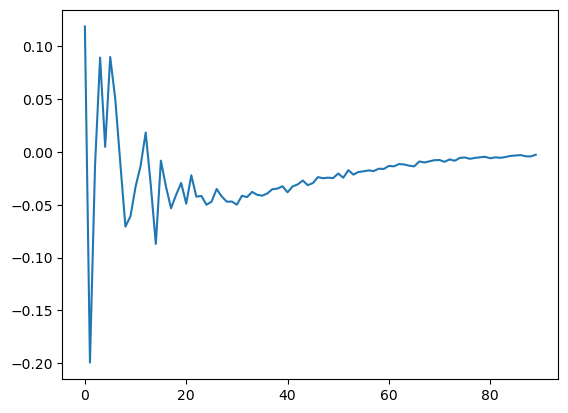

In [ ]:
plt.plot(extraction_static_monochrome_fiducial[0][0]+static_monchrome_beam_simulation[3][0])

In [ ]:
x_fid

(array([22., 29., 13.,  7., 12.]),
 array([-12. ,  -9.6,  -7.2,  -4.8,  -2.4,   0. ]),
 <BarContainer object of 5 artists>)

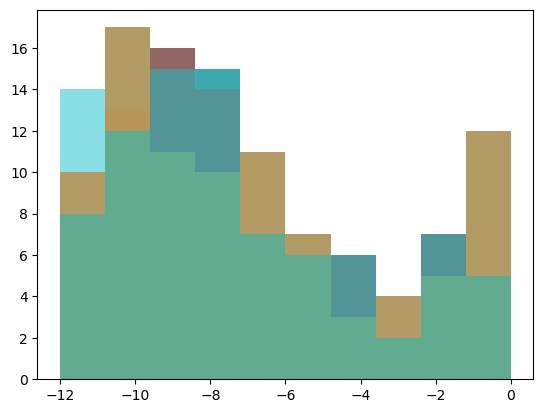

In [ ]:
test_chi = np.zeros(100)
for n in range(100):
    f_real = test_signal
    f_obs = extraction_static_monochrome_DMD[0][n]+static_monchrome_beam_simulation[3][0]
    noise_new = static_monchrome_beam_simulation[5][0]
    x_real=plt.hist(f_real/noise_new,bins=10,range=(-12,0),alpha=0.5)
    x_fid =plt.hist(f_obs/noise_new,bins=10,range=(-12,0),alpha=0.5)
    test_chi[n]=np.sum((x_real[0]-x_fid[0])**2)/89

(array([13.,  1., 34.,  5.,  0.,  0., 41.,  0.,  0.,  6.]),
 array([1.35955056, 1.41797753, 1.47640449, 1.53483146, 1.59325843,
        1.65168539, 1.71011236, 1.76853933, 1.82696629, 1.88539326,
        1.94382022]),
 <BarContainer object of 10 artists>)

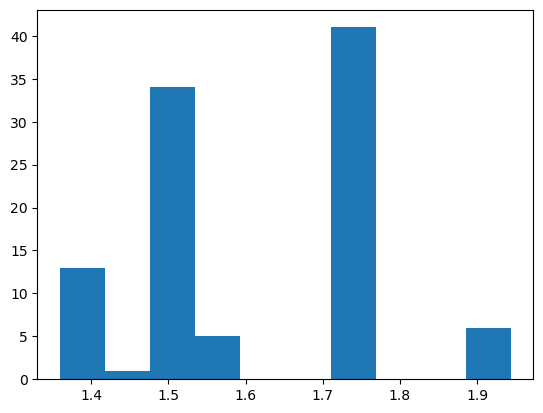

In [ ]:
plt.hist(test_chi)

1.0561797752808988

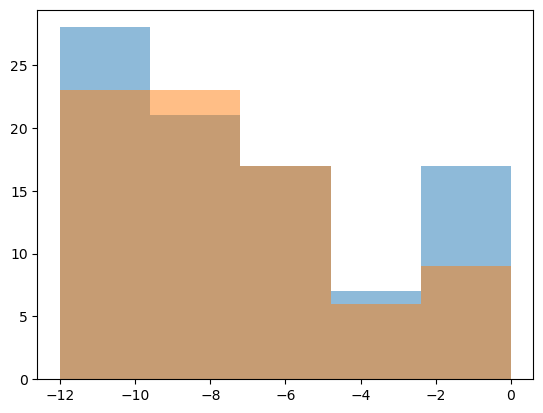

In [ ]:

n=4
temp_new = scipy.interpolate.CubicSpline(np.arange(5,50,0.5),static_monchrome_beam_simulation[0][n])(np.arange(5,50,0.5))
noise_new = sigT(temp_new,N_antenna,dnu,dt)
f_real = test_signal
f_obs = np.random.normal(test_signal,noise_new)
scipy.stats.chisquare(f_real,f_obs)[0]
x_real=plt.hist(f_real/noise_new,bins=5,range=(-12,0),alpha=0.5)
x_fid =plt.hist(f_obs/noise_new,bins=5,range=(-12,0),alpha=0.5)
np.sum((x_real[0]-x_fid[0])**2)/89

In [ ]:
scipy.stats.chisquare(f_real/noise_new,f_obs/noise_new)

Power_divergenceResult(statistic=-7.7248242288237865, pvalue=1.0)

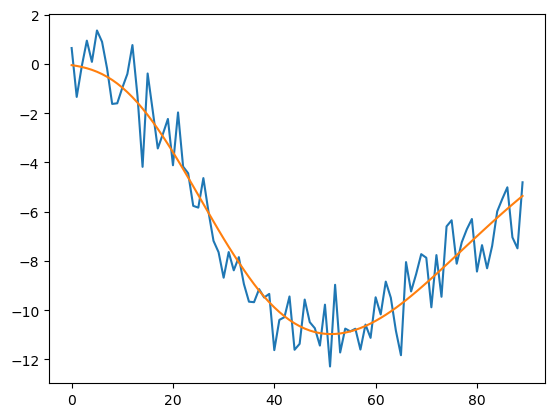

In [ ]:
plt.plot(f_obs/noise_new)
plt.plot(f_real/noise_new)



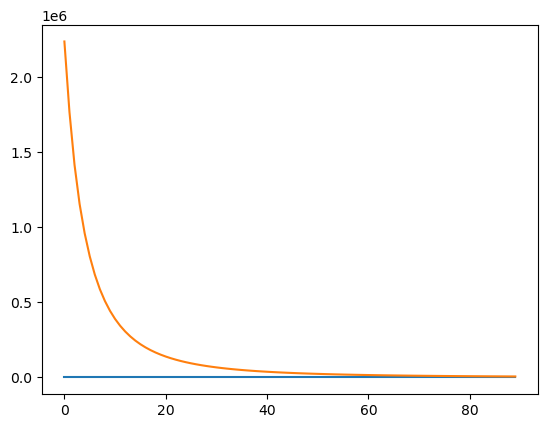

In [ ]:
plt.plot(f_real)
plt.plot(f_obs)

In [ ]:
scipy.stats.chisquare?

Signature: scipy.stats.chisquare(f_obs, f_exp=None, ddof=0, axis=0)
Docstring:
Calculate a one-way chi-square test.

The chi-square test tests the null hypothesis that the categorical data
has the given frequencies.

Parameters
----------
f_obs : array_like
    Observed frequencies in each category.
f_exp : array_like, optional
    Expected frequencies in each category.  By default the categories are
    assumed to be equally likely.
ddof : int, optional
    "Delta degrees of freedom": adjustment to the degrees of freedom
    for the p-value.  The p-value is computed using a chi-squared
    distribution with ``k - 1 - ddof`` degrees of freedom, where `k`
    is the number of observed frequencies.  The default value of `ddof`
    is 0.
axis : int or None, optional
    The axis of the broadcast result of `f_obs` and `f_exp` along which to
    apply the test.  If axis is None, all values in `f_obs` are treated
    as a single data set.  Default is 0.

Returns
-------
res: Power_divergence

In [ ]:
plt.hist?

Signature:
plt.hist(
    x: 'ArrayLike | Sequence[ArrayLike]',
    bins: 'int | Sequence[float] | str | None' = None,
    range: 'tuple[float, float] | None' = None,
    density: 'bool' = False,
    weights: 'ArrayLike | None' = None,
    cumulative: 'bool | float' = False,
    bottom: 'ArrayLike | float | None' = None,
    histtype: "Literal['bar', 'barstacked', 'step', 'stepfilled']" = 'bar',
    align: "Literal['left', 'mid', 'right']" = 'mid',
    orientation: "Literal['vertical', 'horizontal']" = 'vertical',
    rwidth: 'float | None' = None,
    log: 'bool' = False,
    color: 'ColorType | Sequence[ColorType] | None' = None,
    label: 'str | Sequence[str] | None' = None,
    stacked: 'bool' = False,
    *,
    data=None,
    **kwargs,
) -> 'tuple[np.ndarray | list[np.ndarray], np.ndarray, BarContainer | Polygon | list[BarContainer | Polygon]]'
Docstring:
Compute and plot a histogram.

This method uses `numpy.histogram` to bin the data in *x* and count the
number of values in eac

In [ ]:


## Creates the 10 LST simulation and training set to test the MCMC part of Pylinex ##

# This loads that in
f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG_00025","r")
test_case_10LSTs_raw= f["data"]



# varied regolith raw (from Fatima)
# f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
# varied_regolith_training_set_raw= f["Foreground_Training_Set"]
# varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# # Training Sets 10LST for Varied Regolith  # parameters are all the same as varied regolith training set raw params
# varied_regolith_TS_raw_10LSTs = np.zeros((10,221,50))
# f1 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
# varied_regolith_TS_raw_10LSTs[0] = f1["Foreground_Training_Set"][:,0,:]
# f2 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_2","r")
# varied_regolith_TS_raw_10LSTs[1] = f2["Foreground_Training_Set"][:,0,:]
# f3 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_3","r")
# varied_regolith_TS_raw_10LSTs[2] = f3["Foreground_Training_Set"][:,0,:]
# f4 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_4","r")
# varied_regolith_TS_raw_10LSTs[3] = f4["Foreground_Training_Set"][:,0,:]
# f5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_5","r")
# varied_regolith_TS_raw_10LSTs[4] = f5["Foreground_Training_Set"][:,0,:]
# f6 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_6","r")
# varied_regolith_TS_raw_10LSTs[5] = f6["Foreground_Training_Set"][:,0,:]
# f7 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_7","r")
# varied_regolith_TS_raw_10LSTs[6] = f7["Foreground_Training_Set"][:,0,:]
# f8 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_8","r")
# varied_regolith_TS_raw_10LSTs[7] = f8["Foreground_Training_Set"][:,0,:]
# f9 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_9","r")
# varied_regolith_TS_raw_10LSTs[8] = f9["Foreground_Training_Set"][:,0,:]
# f10 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_10","r")
# varied_regolith_TS_raw_10LSTs[9] = f10["Foreground_Training_Set"]

# # varied regolith beam maps (all sky and normalized)
# hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
# beams = hdf5["beams"]
# beam_parameters = hdf5["parameters"]

# # Loads up the raw sky maps
# hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
# raw_sky_maps = hdf5["sky_maps"]

# # fiducial signal
# parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2]])
# # fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_array,1)[0][0][8:] 

# ## Interpolate the varied beams to match the rest of the data
# varied_regolith_training_set_10LSTs = np.zeros((10,len(varied_regolith_training_set_raw),len(frequencies)))
# for l in range(10):
#     for n in range(len(varied_regolith_training_set_raw)):
#         beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_TS_raw_10LSTs[l][n])
#         varied_regolith_training_set_10LSTs[l][n] = beam_regolith_interp(frequencies)

# ## The rest of this code block creates 10 LST training sets        
# foreground_example_1_10LSTs = np.zeros((10,len(frequencies)))
# true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
# for l in range(10):
#     beam_parameters = np.zeros((3,2))
#     percent_range = 0.0000000000000001
#     L_low = true_parameters[3]-true_parameters[3]*percent_range
#     if L_low < 0.5:
#         L_low = 0.5
#     L_high = true_parameters[3]+true_parameters[3]*percent_range
#     if L_high > 3:
#         L_high = 3
#     n1_low = true_parameters[4]-true_parameters[4]*percent_range
#     if n1_low < 3.2:
#         n1_low = 3.2
#     n1_high = true_parameters[4]+true_parameters[4]*percent_range
#     if n1_high > 4.2:
#         n1_high = 4.2
#     n2_low = true_parameters[5]-true_parameters[5]*percent_range
#     if n2_low < 3.8:
#         n2_low = 3.8
#     n2_high = true_parameters[5]+true_parameters[5]*percent_range
#     if n2_high > 4.8:
#         n2_high = 4.8

#     beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
#     N=1
#     Nb=0
#     Nf=0
#     n_regions = 5
#     reference_frequency = 25
#     sky_map = master_foreground_array[l]
#     beam_sky_training_set = beams[:,5:,:]
#     beam_sky_training_set_params = varied_regolith_training_set_raw_params
#     STS_data = varied_regolith_training_set_10LSTs[l]
#     STS_params = varied_regolith_training_set_raw_params
#     show_parameter_ranges = True
#     define_parameter_mean = False
#     foreground_parameters = np.array([0,0,0])
#     parameter_mean = None
#     B_value_functions = py21cmsig.B_value_interp(beam_sky_training_set,beam_sky_training_set_params,\
#                          frequencies,sky_map,reference_frequency,n_regions)


#     foreground_element = py21cmsig.beam_weighted_synchrotron_foreground(n_regions,frequencies,reference_frequency,sky_map, beam_sky_training_set,N,\
#                                             beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
#                                                 show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
#     foreground_example_1_10LSTs[l] = foreground_element[0][0]

# # Example of not having enough curves
# simple_Fatima_sim=py21cmsig.multi_spectra_simulation_run(frequencies,foreground_example_1_10LSTs,fiducial_signal,N_antenna,dnu,dt)
# beam_parameters = np.zeros((3,2))
# percent_range = 0.00000025
# true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
# N_raw=1000000
# N = 100000
# N_samp = int(np.sqrt(N_raw))**2
# Nb=0
# Nf=0


# test_case_10LSTs_raw = np.zeros((N_samp,10,len(frequencies)))
# for l in range(10):
#     L_low = true_parameters[3]-true_parameters[3]*percent_range
#     if L_low < 0.5:
#         L_low = 0.5
#     L_high = true_parameters[3]+true_parameters[3]*percent_range
#     if L_high > 3:
#         L_high = 3
#     n1_low = true_parameters[4]-true_parameters[4]*percent_range
#     if n1_low < 3.2:
#         n1_low = 3.2
#     n1_high = true_parameters[4]+true_parameters[4]*percent_range
#     if n1_high > 4.2:
#         n1_high = 4.2
#     n2_low = true_parameters[5]-true_parameters[5]*percent_range
#     if n2_low < 3.8:
#         n2_low = 3.8
#     n2_high = true_parameters[5]+true_parameters[5]*percent_range
#     if n2_high > 4.8:
#         n2_high = 4.8


#     beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
#     foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
#     # parameter_mean =  true_parameters[0:3]
#     n_regions = 5
#     reference_frequency = 25
#     sky_map = master_foreground_array[l]
#     beam_sky_training_set = beams[:,5:,:]
#     beam_sky_training_set_params = varied_regolith_training_set_raw_params
#     raw_beam_weighted_sky_maps = raw_sky_maps
#     STS_data = varied_regolith_training_set_10LSTs[l]
#     STS_params = varied_regolith_training_set_raw_params
#     show_parameter_ranges = True
#     define_parameter_mean = False
#     data=simple_Fatima_sim[0]
#     B_value_functions = py21cmsig.B_value_interp(beam_sky_training_set,beam_sky_training_set_params,\
#                          frequencies,sky_map,reference_frequency,n_regions)
#     test_case_element = py21cmsig.beam_weighted_synchrotron_foreground(n_regions,frequencies,reference_frequency,sky_map, beam_sky_training_set,N_raw,\
#                                             beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
#                                                 show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
#     test_case_10LSTs_raw[:,l,:] = test_case_element[0]
    
N=100000
np.random.shuffle(np.array(test_case_10LSTs_raw))
test_case_10LSTs = test_case_10LSTs_raw[0:N]

# hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG_00025","w")
# hdf5.create_dataset("data",data=test_case_10LSTs_raw)
# hdf5.close()

## End of the section that creates the training set and input signal ##

In [ ]:
# # have to make my fiducial model function a "LoadableModel" for pylinex
# # This is the simplified version that does not vary omR0 or omK0 (which rarely vary anyways)
# """
# File: perses/models/LambdaCDMModel.py
# Author: David W. Barker
# Date: 16 Feb 2026

# Description: File containing class extending pylinex's Model class to model
#              global 21-cm signals using the fiducial Lambda CDM model, but
#              for the cosmic Dark Ages at this time.
# """
# import numpy as np
# from scipy.interpolate import make_interp_spline as make_spline
# from pylinex import LoadableModel
# from pylinex.util import sequence_types, bool_types, create_hdf5_dataset,\
#     get_hdf5_value

# class LambdaCDMModel(LoadableModel):
#     """Class extending pylinex's Model class to model global 21-cm signals using
#     the the math behind adiabatic expansion, compton scattering, and stimulated emission, 
#     but keep in mind that this does not work beyond the Dark Ages as of now."""
    
#     def __init__(self, frequencies, in_Kelvin=False):
#         """
#         Initializes a new LambdaCDMModel applying to the given frequencies.
        
#         frequencies: 1D (monotonically increasing) array of values in MHz
#         in_Kelvin: if True, units are K; if False (default), units are mK
#         """
#         self.frequencies = frequencies
#         self.in_Kelvin = in_Kelvin

#     @property
#     def frequencies(self):
#         """
#         Property storing the frequencies at which to evaluate the model.
#         """
#         if not hasattr(self, '_frequencies'):
#             raise AttributeError("frequencies was referenced before it was " +\
#                 "set.")
#         return self._frequencies
    
#     @frequencies.setter
#     def frequencies(self, value):
#         """
#         Setter for the frequencies at which to evaluate the model.
        
#         value: 1D (monotonically increasing) array of frequency values in MHz
#         """
#         if type(value) in sequence_types:
#             self._frequencies = np.array(value)
#         else:
#             raise TypeError("frequencies was set to a non-sequence.")
#         if value.max() > 50:
#             raise ValueError("This model only works within the cosmic Dark Ages (less than 50 MHz)")
        
#     @property
#     def in_Kelvin(self):
#         """
#         Property storing whether or not the model returns signals in K (True)
#         or mK (False, default)
#         """
#         if not hasattr(self, '_in_Kelvin'):
#             raise AttributeError("in_Kelvin was referenced before it was set.")
#         return self._in_Kelvin
    
#     @in_Kelvin.setter
#     def in_Kelvin(self, value):
#         """
#         Setter for the bool determining whether or not the model returns signal
#         in K.
        
#         value: either True or False
#         """
#         if type(value) in bool_types:
#             self._in_Kelvin = value
#         else:
#             raise TypeError("in_Kelvin was set to a non-bool.")
        
#     def __call__(self, parameters):
#         """
#         Evaluates this LambdaCDMModel at the given parameter values.
        
#         parameters: array of length 5, containing the density parameter for radiation,
#                     matter, curvature, dark energy, and baryons.

#         returns: fiducial Lambda CDM model evaluated at the given parameters
#         """
#         if len(parameters) != 3:
#             raise ValueError("There should be 3 parameters given to the LambdaCDMModel: the density parameter for matter: omM0,\
#                             , dark energy: omL0, and baryons: omB0" )
#         model_parameters = [[8.600000001024455e-05 ,0],[parameters[0],0],[0,0],[parameters[1],0],[parameters[2],0]]
        
#         raw_values = np.array(py21cmsig.lambdaCDM_training_set(np.arange(1,51),model_parameters,N=1,verbose=False)[0][0])
#         interpolator = scipy.interpolate.CubicSpline(np.arange(1,51),raw_values)
#         signal_in_mK = interpolator(self.frequencies)
        
#         if self.in_Kelvin:
#             return signal_in_mK
#         else:
#             return signal_in_mK * 1e3
        
#     @property
#     def parameters(self):
#         """
#         Property storing a list of strings associated with the parameters
#         necessitated by this model.
#         """
#         if not hasattr(self, '_parameters'):
#             self._parameters = ["omM0","omL0","omB0"]
#         return self._parameters
    
#     @property
#     def gradient_computable(self):
#         """
#         Property storing a boolean describing whether the gradient of this
#         model is computable. The gradient is not implemented for the
#         TurningPointModel right now.
#         """
#         return False
    
#     @property
#     def hessian_computable(self):
#         """
#         Property storing a boolean describing whether the hessian of this model
#         is computable. The hessian is not implemented for the TurningPointModel
#         right now.
#         """
#         return False
    
#     def fill_hdf5_group(self, group):
#         """
#         Fills the given hdf5 file group with information about this model.
        
#         group: hdf5 file group to fill with information about this model
#         """
#         group.attrs['class'] = 'LambdaCDMModel'
#         group.attrs['import_string'] =\
#             'from perses.models import LambdaCDMModel'
#         group.attrs['in_Kelvin'] = self.in_Kelvin
#         create_hdf5_dataset(group, 'frequencies', data=self.frequencies)

#     @staticmethod
#     def load_from_hdf5_group(group):
#         """
#         Loads a model from the given group. The load_from_hdf5_group of a given
#         subclass model should always be called.
        
#         group: the hdf5 file group from which to load the Model
        
#         returns: a Model of the Model subclass for which this is called
#         """
#         frequencies = get_hdf5_value(group['frequencies'])
#         in_Kelvin = group.attrs['in_Kelvin']
#         return LambdaCDMModel(frequencies, in_Kelvin=in_Kelvin)

#     def __eq__(self, other):
#         """
#         Checks for equality with other.
        
#         other: object to check for equality
        
#         returns: True if other is equal to this model, False otherwise
#         """
#         if not isinstance(other, LambdaCDMModel):
#             return False
#         if self.in_Kelvin != other.in_Kelvin:
#             return False
#         return\
#             np.allclose(self.frequencies, other.frequencies, rtol=0, atol=1e-6)
    
#     @property
#     def bounds(self):
#         """
#         Property storing natural parameter bounds in a dictionary.
#         """
#         if not hasattr(self, '_bounds'):
#             self._bounds =\
#                 {parameter: (None, None) for parameter in self.parameters}
#         return self._bounds

In [ ]:
forecaster.plotter.get_basis_sum("0")["signal"].basis.shape

(1, 90)

In [ ]:
forecast_file_path = "/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test"

In [ ]:
forecast_files = h5py.File(forecast_file_path,'r')
forecaster = Forecaster(forecast_file_path)
error = forecast_files['error'][()]

/home/dbarker7752/21_cm_group/Exotic_Models_Data/pylinex_forecaster_test already exists. Will perform analysis using existing file. If you wish to rerun, move or delete existing file.


In [ ]:
forecaster.plotter.parameter_means['signal'][curve_number]

array([237.67005041])

###### Pylinex Component

100%|██████████| 1000/1000 [00:00<00:00, 70963.61it/s]


The MetaFitter chose 59 systematics terms based on DIC minimization.
The MetaFitter chose 2 signal terms based on DIC minimization.
1.0279649427765696 Chi Squared
0.9040503539363286 Psi Squared


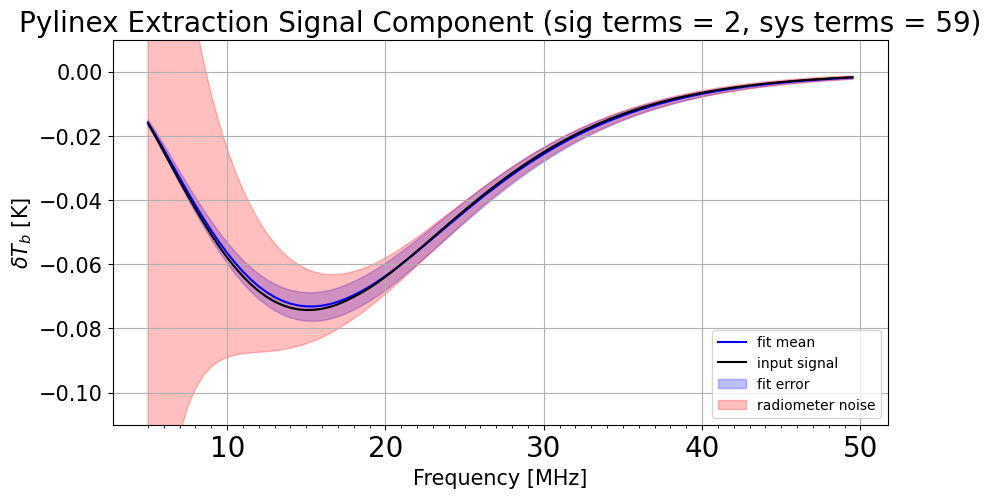

In [ ]:
# Important variables:
n_LSTs = 10 # this should match the number of foreground_training_sets you've made
## Spectral Index Map Variable
n_regions = 8   # number of regions that are created for your multi-region model
temp1 = 10     # lower frequency that is used for the temperature for the spectral index of the spectral index map
temp2 = 50     # upper frequency
f_low = temp1   # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
f_high = temp2  # Only concerns the residual maps that are displayed through spectral_index_map_visualizations (not important for this)
NSIDE = 32
## Monochromatic Beam Variables.
N_beam = 10000   # Number of beams to create. I'm not varying the beam right now, but this may be helpful later.
low_std = 0.4
high_std = 1
## Synchrotron Foreground Variables
ylim = (-0.11,0.01)
N_TS = 1000   # Number of curves in the training set
parameter_variation = [0,0.05,0]
sky_maps = master_foreground_array
sky_maps_truncated = sky_maps[:,4:49,:]  # the trucated sky maps that map the frequency range of frequencies (though it may not match the number of bins)
frequency_range_truncated = np.arange(5,50)  # Truncated frequency range that matches the sky map frequencies
# Pylinex Extraction Variables
N_extractions = 10
num_sig_vectors = 20   # maximum number of signal modes to use in the extractions
num_sys_vectors = 200    # maximum number of systematic modes to use in the extraction
num_basis_vectors = 200  # number of basis vectors to create for the root bases (make sure its as big as the largest num_sys or num_sig_vectors number)
## signal that is used as the input to the observation data: ##
parameter_array = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0/h**2],[H0,0]])
input_signal_EDE = EDE_training_set_curves[1,::2]
##  ##
signal_training_set_EDE = EDE_training_set_curves[:,::2]  ### indexing is needed to get it into the correct shape for the extraction. Training set used in the pylinex fit


# Step 1: Create the spectral index map that will govern the B_values of the beam (since they govern the indices of the regions).
# NPIX = hp.nside2npix(NSIDE)
# spectral_maps = np.zeros((n_LSTs,NPIX))
# for l in range(n_LSTs):
#     spectral_map = py21cmsig.spectral_index_map(f_low,f_high,n_regions,temp1,temp2,NSIDE,ULSA_direction_32 = master_foreground_array[l])
#     spectral_maps[l] = spectral_map

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","w")
# f.create_dataset("spectral maps",data=spectral_maps)
# f.close()

if NSIDE != 32:
    raise ValueError ("The saved spectral maps are only 32 bit right now.")
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/spectral_index_map_10to50MHz_32bit","r")
spectral_maps = np.array(hdf5["spectral maps"])   # I'v visually varified that these make sense


# Step 2: Create the monochromatic beam

# monochromatic_gaussian_B_values = py21cmsig.create_monochromatic_gaussian_beam_training_set(frequencies,N_beam,[low_std,high_std],n_LSTs,n_regions,NSIDE,spectral_maps,plot_extremes = True)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","w")
# f.create_dataset("B values",data=monochromatic_gaussian_B_values[0])
# f.create_dataset("parameters",data=monochromatic_gaussian_B_values[1])
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBvalues_90fbins_10000beams","r")
monochromatic_gaussian_B_values = np.array(hdf5["B values"])   # I've visually varified that these make sense
monochromatic_gaussian_parameters = np.array(hdf5["parameters"])
if len(frequencies) != monochromatic_gaussian_B_values[0][0].shape[0]:
    raise ValueError ("Your loaded B_values do not have the same length as your frequencies. This will cause problems later")

# Step 3: Create the beam-weighted foreground training set:
## Step 3a: Create the BTS_curves to input to the foreground function:

# print("NOTE: The B_values must be massaged into a form that fits the frequency bins of the sky maps. In this case I've massaged the 90 bin B_values to fit the 45 bin sky maps")
# B_values_massaged = monochromatic_gaussian_B_values[:,:,::2,:]  ### NOTE: the ::2 allows the 90 frequency bin B_values to match the 45 frequency bins of the sky maps
# BTS_curves_monochromaticbeam = create_BTS_curves(frequencies,frequency_range_truncated,B_values_massaged,sky_maps_truncated,n_regions,spectral_index_map,n_LSTs)

# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","w")
# f.create_dataset("curves",data=BTS_curves_monochromaticbeam)
# f.close()

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/monogaussBTS_curves_90fbins_10000beams","r")
BTS_curves_monochromaticbeam = np.array(hdf5["curves"])   # I've visually varified that these make sense

# simulated_foreground_array sets the "true sky" observations that will be compared to the training sets for the extraction. It's your data, basically. 
parameter_variation_true = [0,0,0]   
simulated_foreground_array_10LSTs_EDE = np.zeros((n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    simulated_foreground_array_10LSTs_EDE[l,:] = synchrotron_foreground_updated_given_Bvalues(1,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation_true,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

# The systematics training set itself
monochro_beam_TS_10LSTs = np.zeros((N_TS,n_LSTs,len(frequencies)))
for l in range(n_LSTs):
    monochro_beam_TS_10LSTs[:,l,:] = synchrotron_foreground_updated_given_Bvalues(N_TS,n_regions,frequencies,spectral_maps[l],sky_maps[l],parameter_variation,\
                                                                                     np.array([monochromatic_gaussian_B_values[0][l]]),np.array([monochromatic_gaussian_parameters[0]]),\
                                                                                       np.array([BTS_curves_monochromaticbeam[0][l]]))[0]

static_monchrome_beam_simulation_EDE=py21cmsig.multi_spectra_simulation_run(frequencies,simulated_foreground_array_10LSTs_EDE,input_signal_EDE,N_antenna,dnu,dt)

# Pylinex Extractions
data_EDE=static_monchrome_beam_simulation_EDE[0]
noise_EDE = static_monchrome_beam_simulation_EDE[5]
signal_EDE = static_monchrome_beam_simulation_EDE[1]
systematics_EDE = static_monchrome_beam_simulation_EDE[2]
# test_extraction_static_monochrome_EDE = py21cmsig.extraction_statistics(N_extractions,monochro_beam_TS_10LSTs,signal_training_set_EDE,data_EDE,noise_EDE,signal_EDE,systematics_EDE,\
#                                                   frequencies,multi_spectra=True,display_type = "cumulative sigmas",\
#                                                     title="Cumulative Plot",num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,\
#                                                         num_basis_vectors=num_basis_vectors,ylim=ylim)

single_extraction_monochromatic_EDE = py21cmsig.pylinex_extraction(monochro_beam_TS_10LSTs,signal_training_set_EDE,data_EDE,noise_EDE,signal_EDE,frequencies,\
                                                               multi_spectra=True,num_sig_vectors=3,num_sys_vectors=num_sys_vectors,num_basis_vectors=num_basis_vectors,ylim=ylim)





In [ ]:
reload(py21cmsig)

Prepared Haslam map in 0.127 s.


<module 'py21cmsig' from '/home/dbarker7752/py21cmsig/py21cmsig.py'>

In [ ]:
py21cmsig.EDE_training_set?

Signature:
py21cmsig.EDE_training_set(
    frequency_array,
    parameters,
    N,
    gaussian=False,
    B=0.049111944299283325,
    M=0.3139476099596564,
    verbose=True,
)
Docstring:
"Creates a training set of singal curves based on the parameter range of the early dark energy model.

Parameters
frequency_array: array of frequencies to calculate the curve at. array-like.
parameters: Set of mean values and standard deviation of your parameters if gaussian. If Gaussian, first column is mean, second column is standard deviation
            If not Gaussian, then each row is a parameter and each column represents a value of that parameter that will be included
            in the interpolation to get new parameters. I don't linearly sample this because it usually weights the distribution
            heavily towards one end of the parameter space. Better to interpolate and space out the curves equally.
N: The number of curves you would like to have in your training set. Interger
B: Densi

100%|██████████| 1/1 [00:00<00:00, 22.38it/s]


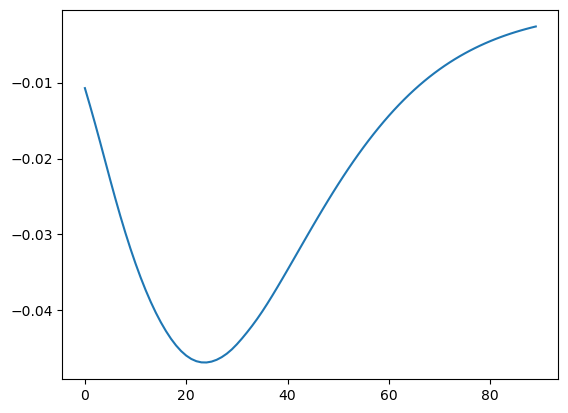

In [ ]:
plt.plot(py21cmsig.EDE_training_set(np.arange(5,50,0.5),parameters=[2e-5,50],N=1)[0][0])

###### Least Squares Component

In [ ]:
## Let's start reverse engineering Joshua's code:
iterations = 100   # number of least square iterations to perform


extraction = single_extraction_monochromatic_EDE
# these set the error for the density parameters
z_c_lower = 20
z_c_upper = 200
Omega_ee_lower = 1e-5
Omega_ee_upper = 6e-5


lst_bins = 10
frequencies = frequencies
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/least_squares_monochrome_EDE_100iterations'

signal_training_set_file_name = ''

# Let's make our signal training set and function:
signal_training_set = EDE_training_set_curves[:,::2]  # hopefully this doesn't need the exact format of TrainingSetCreator. Won't be too terrible to massage it into that format, but it would be very annoying.
signal_expander = RepeatExpander(lst_bins)
signal_model = perses.models.EarlyDarkEnergyModel(frequencies, in_Kelvin=True)
signal_model = ExpandedModel(signal_model, signal_expander)
model_names = ['signal', 'systematics']

# loads the foreground training set
fg_training_set = monochro_beam_TS_10LSTs
fg_training_set = np.reshape(fg_training_set, (len(fg_training_set), -1)) # this shapes it into the correct shape for th TrainedBasis pylinex class

# signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(Omega_ee_lower, Omega_ee_upper)) # Omega_ee
distribution_list.add_distribution(UniformDistribution(z_c_lower, z_c_upper)) # z_c

# I don't need this conditional expression
# condition_expression = Expression(\
# 	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
# 	num_arguments=3, import_strings=['import numpy as np'])

# condition_distribution = UniformConditionDistribution(condition_expression)

# prior = WindowedDistribution(distribution_list, condition_distribution)

prior = distribution_list
bounds = {\
	'Omega_ee': (Omega_ee_lower, Omega_ee_upper),\
        "z_c": (z_c_lower,z_c_upper)}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 

# forecast_files = h5py.File(forecast_file_path,'r')
# forecaster = Forecaster(forecast_file_path)
# error = forecast_files['error'][()]
# data = forecast_files['data'][()][curve_number]    # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
# input_signal = forecast_files['input_curves/signal'][0] # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
# num_linear_fg_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['systematics'].num_basis_vectors

# non forecaster version
fitter = extraction[0]
bases = extraction[1]
error = fitter.error 
data = fitter.data
input_signal = input_signal_EDE  # from the pylinex extraction cell above
num_linear_fg_terms = fitter.sizes["systematics"]

# #FG Model and Training Set for Full Data

fg_trained_basis = bases[1]
fg_trained_basis.generate_gaussian_prior(diagonal=True)
fg_priors = fg_trained_basis.gaussian_prior
fg_basis_model = BasisModel(fg_trained_basis)
models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.

full_data_model = SumModel(model_names, models)
fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'systematics', prior=fg_priors)
full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.
num_linear_sig_terms = fitter.sizes["signal"]
linear_fit_parameter_covariance = fitter.subbasis_parameter_covariance("signal")
linear_fit_parameter_mean = fitter.subbasis_parameter_mean("signal")
num_linear_signal_terms = fitter.sizes["signal"]
signal_trained_basis = bases[0]
projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)
signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_path,\
	**bounds)

least_square_fitter.run(iterations=iterations, attempt_threshold=100,\
	run_if_iterations_exist=False,verbose=True)

# This is the covariance code:
covariance = np.cov(np.array(least_square_fitter.argmins).T)

# This probably needs to include the covariance rather than just an identity. Maybe the MCMC fitter deals with this?
guess_distribution = GaussianDistribution(least_square_fitter.argmin, covariance)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])

guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

Computing Least Square Fit...
Starting iteration #1 of LeastSquareFitter at Tue Mar  3 11:08:38 2026.
Starting iteration #2 of LeastSquareFitter at Tue Mar  3 11:08:38 2026.
Starting iteration #3 of LeastSquareFitter at Tue Mar  3 11:08:38 2026.
Starting iteration #4 of LeastSquareFitter at Tue Mar  3 11:08:39 2026.


/home/dbarker7752/anaconda3/lib/python3.12/site-packages/scipy/optimize/_slsqp_py.py:437: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)
/home/dbarker7752/anaconda3/lib/python3.12/site-packages/scipy/optimize/_slsqp_py.py:441: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  g = append(wrapped_grad(x), 0.0)


Starting iteration #5 of LeastSquareFitter at Tue Mar  3 11:08:39 2026.
Starting iteration #6 of LeastSquareFitter at Tue Mar  3 11:08:40 2026.
Starting iteration #7 of LeastSquareFitter at Tue Mar  3 11:08:40 2026.
Starting iteration #8 of LeastSquareFitter at Tue Mar  3 11:08:41 2026.
Starting iteration #9 of LeastSquareFitter at Tue Mar  3 11:08:42 2026.
Starting iteration #10 of LeastSquareFitter at Tue Mar  3 11:08:43 2026.
Starting iteration #11 of LeastSquareFitter at Tue Mar  3 11:08:45 2026.
Starting iteration #12 of LeastSquareFitter at Tue Mar  3 11:08:46 2026.
Starting iteration #13 of LeastSquareFitter at Tue Mar  3 11:08:47 2026.
Starting iteration #14 of LeastSquareFitter at Tue Mar  3 11:08:50 2026.
Starting iteration #15 of LeastSquareFitter at Tue Mar  3 11:08:51 2026.
Starting iteration #16 of LeastSquareFitter at Tue Mar  3 11:08:51 2026.
Starting iteration #17 of LeastSquareFitter at Tue Mar  3 11:08:52 2026.
Starting iteration #18 of LeastSquareFitter at Tue Mar  

In [ ]:
linear_fit_parameter_covariance[0][0]

375.35546359715033

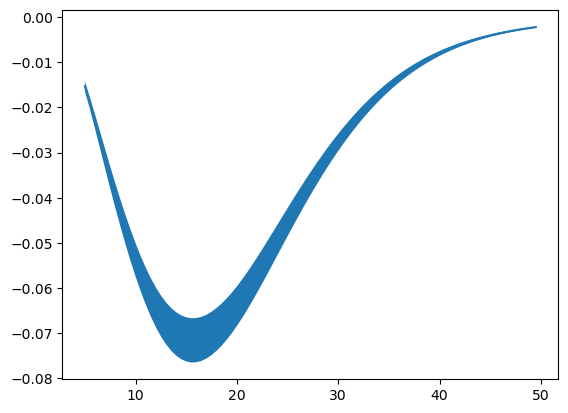

In [ ]:
plt.plot(frequencies,bases[0].basis[0]*linear_fit_parameter_mean[0])
plt.fill_between(frequencies,bases[0].basis[0]*linear_fit_parameter_mean[0]+bases[0].basis[0]*np.sqrt(linear_fit_parameter_covariance[0][0])\
                ,bases[0].basis[0]*linear_fit_parameter_mean[0]-bases[0].basis[0]*np.sqrt(linear_fit_parameter_covariance[0][0]))

In [ ]:
signal_parameter_loglikelihood(np.array(EDE_training_set_parameters[0]*2))

-0.6162792503359293

In [ ]:
[least_square_fitter.argmin][0]

array([4.86726909e-05, 7.46573592e+01])

In [ ]:
EDE_training_set_parameters[1]

array([2.76956160e-05, 9.21979618e+01])

100%|██████████| 1/1 [00:00<00:00, 30.86it/s]


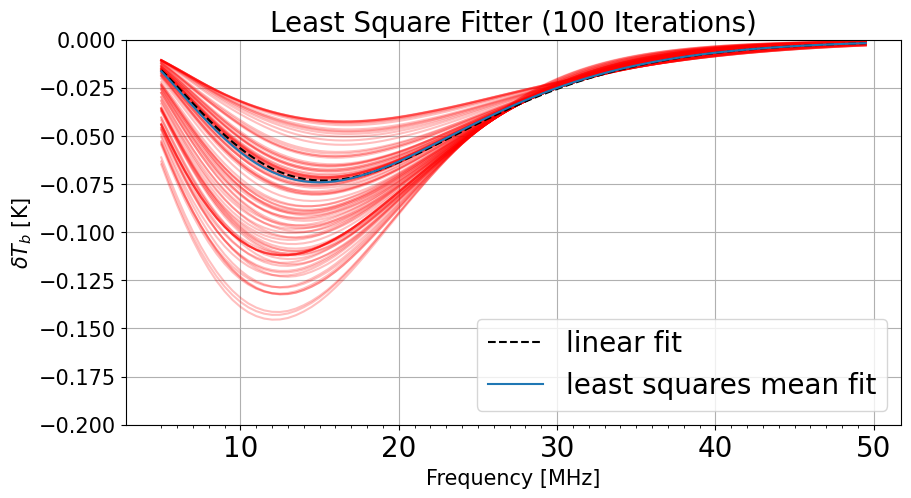

In [ ]:
plt.figure(figsize=(10, 5))
for n in np.arange(iterations):
    parameters = least_square_fitter.argmins
    plt.plot(frequencies,py21cmsig.EDE_training_set(np.arange(5,50,0.5),parameters[n],1)[0][0],color="red",alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
# plt.fill_between(frequencies,py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_max,1)[0][0][8::],\
#                  py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.5),parameter_min,1)[0][0][8::],color="tab:blue",alpha=0.25, label = rf"$\pm{sigma_range}\sigma$")
plt.plot(frequencies,fitter.subbasis_channel_mean("signal"),color="black",ls="--",label = "linear fit")
plt.plot(frequencies,py21cmsig.EDE_training_set(np.arange(5,50,0.5),least_square_fitter.argmin,1)[0][0],color="tab:blue",label="least squares mean fit")
plt.xticks(ticks=np.arange(5,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(rf"Least Square Fitter ({iterations} Iterations)", fontsize=20)
plt.ylim(-0.2,0)
plt.grid()
plt.legend(fontsize=20)

In [ ]:
least_square_fitter.argmins

[array([1.80512260e-05, 1.70682873e+02]),
 array([3.17570229e-05, 2.95692831e+01]),
 array([3.48447757e-05, 1.10558808e+02]),
 array([6.00000000e-05, 2.08439475e+01]),
 array([3.75722312e-05, 3.19549951e+01]),
 array([4.86726909e-05, 7.46573592e+01]),
 array([2.99565909e-05, 4.19992360e+01]),
 array([3.03616073e-05, 6.87648100e+01]),
 array([2.29728931e-05, 8.53243384e+01]),
 array([4.93162959e-05, 8.83164481e+01]),
 array([1.10409907e-05, 1.81342488e+02]),
 array([2.72063188e-05, 8.50057232e+01]),
 array([5.04051396e-05, 1.02235100e+02]),
 array([5.64932420e-05, 4.79956805e+01]),
 array([1.00989645e-05, 5.94580746e+01]),
 array([5.91488642e-05, 4.51890621e+01]),
 array([4.63048982e-05, 1.40217697e+02]),
 array([3.75184495e-05, 2.50657232e+01]),
 array([1.82743465e-05, 9.65004396e+01]),
 array([5.22433493e-05, 1.57654874e+02]),
 array([2.99890043e-05, 4.35206301e+01]),
 array([4.32318776e-05, 1.91858434e+02]),
 array([2.22149860e-05, 6.06842273e+01]),
 array([2.56349257e-05, 1.65436591

In [ ]:
least_square_fitter.argmin

array([1.30223599e-05, 1.05939602e+02])

###### MCMC Component

In [ ]:
# Just a reminder of what we got from the least square fitter:
# least_square_fitter.run(iterations=100, attempt_threshold=100,\
# 	run_if_iterations_exist=False)

# guess_distribution = GaussianDistribution(least_square_fitter.argmin,\
# 	np.identity(signal_model.num_parameters))

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

# guess_distribution_set =\
# 	DistributionSet([(guess_distribution, signal_model.parameters, None)])

# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

## here are some variables we need to define for the Sampler (the MCMC proper)

# file name of the hdf5 file
file_name = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome_EDE_10w100it'

# number of MCMC chains being iterated together
num_walkers = 10

# likelihood to explore (I'm hoping it's the same as the least square fitter)
loglikelihood = full_loglikelihood  # NOTE: you'll have to run the least square fitter to populate this variable

# JuimpingDistributionSet object that defines where the MCMC is allowed to jump from a starting point. 
# I don't fully understand what this does right now, but we'll explore it

# guess_distribution = GaussianDistribution(least_square_fitter.argmin,\    
# 	np.identity(signal_model.num_parameters))

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

# guess_distribution_set =\
# 	DistributionSet([(guess_distribution, signal_model.parameters, None)])

jumping_distribution = GaussianJumpingDistribution(covariance)


jumping_distribution_set = JumpingDistributionSet([(jumping_distribution, signal_model.parameters)])
jumping_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))


#DistributionSet object that governs the initial guesses. Created from the linear least squares you should have just done before this.
guess_distribution_set = guess_distribution_set   # NOTE: comes from the least squares fitter

#Optional DistributionSet object that sets priors on your parameters Created from the linear least squares you should have just done before this
prior_distribution_set = prior_distribution_set    # NOTE: comes from the least squares fitter

# print the time after each checkpoint
verbose = True

# restart_mode seems handy (take a look at the documentation under Sampler.py in pylinex/nonlinear). Going to ignore it for now.

Sampler_monochrome_EDE = Sampler(file_name,num_walkers,loglikelihood,jumping_distribution_set=jumping_distribution_set, guess_distribution_set=guess_distribution_set,prior_distribution_set=prior_distribution_set,verbose=verbose)
Sampler_monochrome_EDE.run_checkpoints(100)

Starting checkpoint #1 at Tue Mar  3 11:12:13 2026.
Finished checkpoint #1 at Tue Mar  3 11:12:41 2026.
Finished checkpoint #2 at Tue Mar  3 11:13:05 2026.
Finished checkpoint #3 at Tue Mar  3 11:13:31 2026.
Finished checkpoint #4 at Tue Mar  3 11:13:59 2026.
Finished checkpoint #5 at Tue Mar  3 11:14:25 2026.
Finished checkpoint #6 at Tue Mar  3 11:14:52 2026.
Finished checkpoint #7 at Tue Mar  3 11:15:18 2026.
Finished checkpoint #8 at Tue Mar  3 11:15:47 2026.
Finished checkpoint #9 at Tue Mar  3 11:16:14 2026.
Finished checkpoint #10 at Tue Mar  3 11:16:41 2026.
Finished checkpoint #11 at Tue Mar  3 11:17:08 2026.
Finished checkpoint #12 at Tue Mar  3 11:17:35 2026.
Finished checkpoint #13 at Tue Mar  3 11:18:04 2026.
Finished checkpoint #14 at Tue Mar  3 11:18:32 2026.
Finished checkpoint #15 at Tue Mar  3 11:18:57 2026.
Finished checkpoint #16 at Tue Mar  3 11:19:26 2026.
Finished checkpoint #17 at Tue Mar  3 11:19:52 2026.
Finished checkpoint #18 at Tue Mar  3 11:20:20 2026.
Fin

In [ ]:
EDE_training_set_parameters[1]

array([2.76956160e-05, 9.21979618e+01])

In [ ]:
test_Fitter.parameter_mean

array([3.53032177e-05, 8.72644790e+01])

In [ ]:
np.sqrt(test_Fitter.parameter_covariance)

array([[1.40553596e-05,            nan],
       [           nan, 9.85125379e+00]])

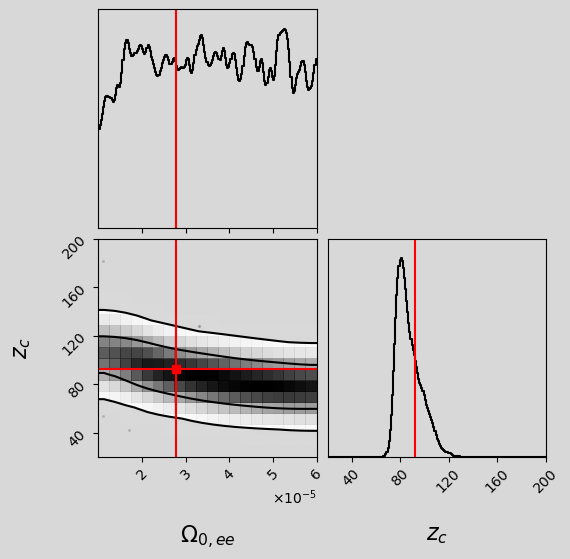

In [ ]:
# Corner Plot
test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome_EDE_10w100it')

#aesthetics
figure_color = '#D8D8D8'
plot_color =  '#D8D8D8'
truth_color = "red"
histogram_color = "black"

fig=plt.figure(figsize=(6, 6))
fig.set_facecolor(figure_color)
data=np.array([test_Fitter.chain[:,:,0][np.arange(10),:].flatten(),test_Fitter.chain[:,:,1][np.arange(10),:].flatten()]).T   # loads in the data from the Sampler in the proper format
labels = [r"$\Omega_{0,ee}$",r"$z_c$"]
parameter1 = "signal_Omega_ee"
parameter2 = "signal_z_c"
label_fontsize = 16
hist_bin_factor = 10   # Helps in the smoothing process by increasing bin number.
smooth = 2  # smooths the 2-D contours
smooth1d = 2  # smooths the 1-D histogram
range = [(test_Fitter.prior_distribution_set.minimum[parameter1],test_Fitter.prior_distribution_set.maximum[parameter1]),(test_Fitter.prior_distribution_set.minimum[parameter2],test_Fitter.prior_distribution_set.maximum[parameter2])]
truths = [EDE_training_set_parameters[1][0],EDE_training_set_parameters[1][1]]
# truths = test_Fitter.parameter_mean

fig = corner.corner(data,bins=20,labels = labels,label_kwargs={"fontsize": label_fontsize},color=histogram_color,hist_bin_factor=hist_bin_factor, smooth = smooth, smooth1d=smooth1d,range=range,truths=truths,truth_color=truth_color,verbose=True,fig=fig,plot_contours=True,levels=[0.68,0.95],use_math_text=True)
for ax in fig.get_axes():
    ax.set_facecolor(plot_color)

(array([ 65.42194648, 111.8400798 , 158.25821313]),
 [Text(65.42194647748244, 0, '65.4'),
  Text(111.84007980347774, 0, '112'),
  Text(158.25821312947303, 0, '158')])

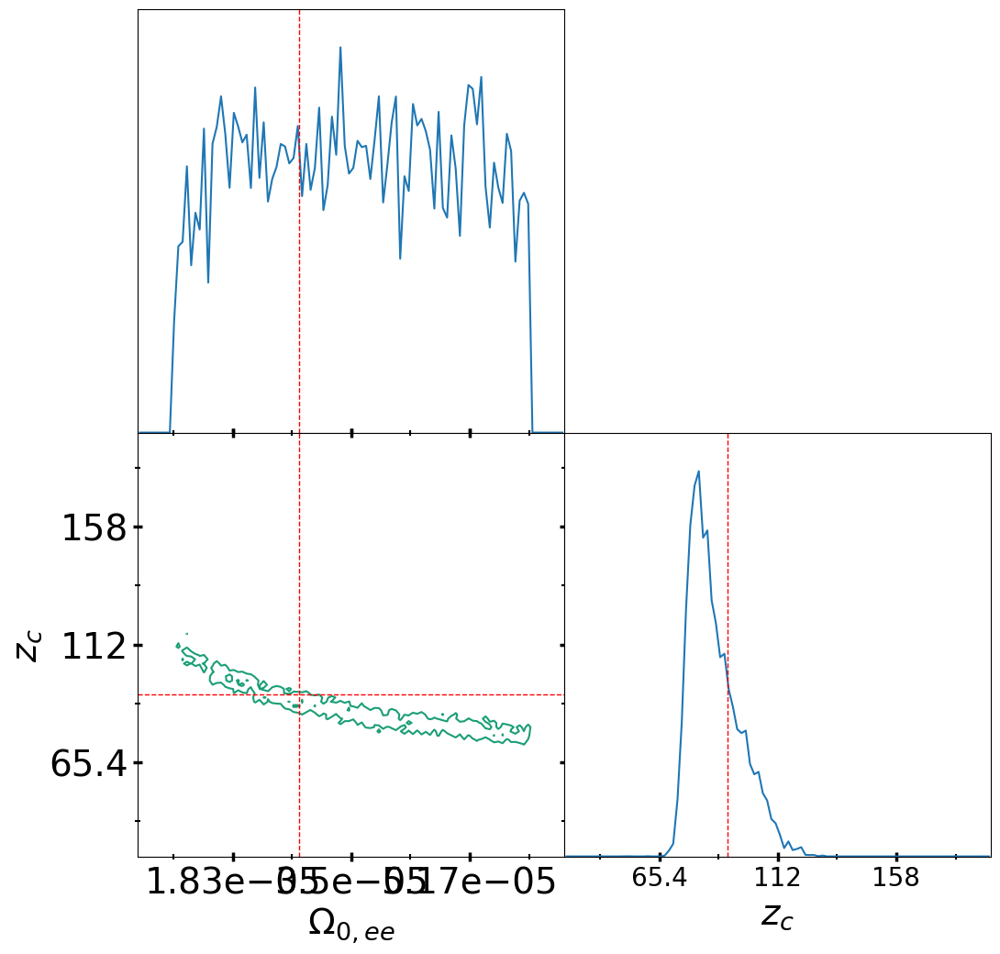

In [ ]:
# Plots the results of the MCMC attempting to fit the data:
test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome_EDE_10w100it')
reference_value_mean = [EDE_training_set_parameters[1][0],EDE_training_set_parameters[1][1]]
#reference_value_covariance = np.array([[omM0h2sigma**2,omM0h2sigma*omB0h2sigma],[omM0h2sigma*omB0h2sigma,omB0h2sigma**2]])
reference_value_covariance = None
contour_confidence_levels = 0.68
def parameter_renamer(parameter):
    if parameter == "signal_Omega_ee":
        parameter1 = r"$\Omega_{0,ee}$"
    else:
        parameter1 = r"$z_c$"
    return parameter1
test_Fitter.triangle_plot(nbins=100,parameter_renamer=parameter_renamer,reference_value_mean=reference_value_mean,reference_value_covariance=reference_value_covariance,contour_confidence_levels=contour_confidence_levels)
plt.xticks(size=20)

In [ ]:
# single_extraction_monochromatic_ERB = py21cmsig.pylinex_extraction(monochro_beam_TS_10LSTs,signal_training_set,data,noise,signal,frequencies,\
#                                                                multi_spectra=True,num_sig_vectors=num_sig_vectors,num_sys_vectors=num_sys_vectors,num_basis_vectors=num_basis_vectors,ylim=ylim)


In [ ]:
reload(py21cmsig)

Prepared Haslam map in 0.161 s.


<module 'py21cmsig' from '/home/dbarker7752/py21cmsig/py21cmsig.py'>

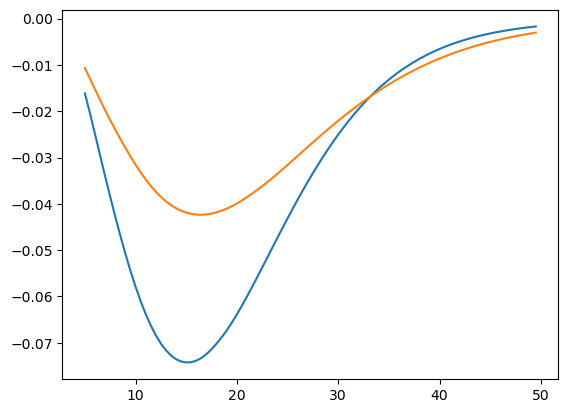

In [ ]:
plt.plot(frequencies,EDE_training_set_curves[1,::2])
plt.plot(frequencies,input_signal)

In [ ]:
reload(py21cmsig)

/home/dbarker7752/perses/perses/foregrounds/HaslamGalaxy.py:83: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  self._haslam_map_408 = hp.read_map(file_name, verbose=False)


Prepared Haslam map in 0.143 s.


<module 'py21cmsig' from '/home/dbarker7752/py21cmsig/py21cmsig.py'>

In [ ]:
# Just a reminder of what we got from the least square fitter:
# least_square_fitter.run(iterations=100, attempt_threshold=100,\
# 	run_if_iterations_exist=False)

# guess_distribution = GaussianDistribution(least_square_fitter.argmin,\
# 	np.identity(signal_model.num_parameters))

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

# guess_distribution_set =\
# 	DistributionSet([(guess_distribution, signal_model.parameters, None)])

# guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
# prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

## here are some variables we need to define for the Sampler (the MCMC proper)

# file name of the hdf5 file
file_name = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome_DMD'

# number of MCMC chains being iterated together
num_walkers = 5

# likelihood to explore (I'm hoping it's the same as the least square fitter)
loglikelihood = full_loglikelihood  # NOTE: you'll have to run the least square fitter to populate this variable

# JuimpingDistributionSet object that defines where the MCMC is allowed to jump from a starting point. 
# I don't fully understand what this does right now, but we'll explore it

# guess_distribution = GaussianDistribution(least_square_fitter.argmin,\    
# 	np.identity(signal_model.num_parameters))

# guess_distribution =\
# 	WindowedDistribution(guess_distribution, condition_distribution)

# guess_distribution_set =\
# 	DistributionSet([(guess_distribution, signal_model.parameters, None)])

jumping_distribution = GaussianJumpingDistribution(covariance)


jumping_distribution_set = JumpingDistributionSet([(jumping_distribution, signal_model.parameters)])
jumping_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))


#DistributionSet object that governs the initial guesses. Created from the linear least squares you should have just done before this.
guess_distribution_set = guess_distribution_set   # NOTE: comes from the least squares fitter

#Optional DistributionSet object that sets priors on your parameters Created from the linear least squares you should have just done before this
prior_distribution_set = prior_distribution_set    # NOTE: comes from the least squares fitter

# print the time after each checkpoint
verbose = True

# restart_mode seems handy (take a look at the documentation under Sampler.py in pylinex/nonlinear). Going to ignore it for now.

Sampler_monochrome = Sampler(file_name,num_walkers,loglikelihood,jumping_distribution_set=jumping_distribution_set, guess_distribution_set=guess_distribution_set,prior_distribution_set=prior_distribution_set,verbose=verbose)
Sampler_monochrome.run_checkpoints(10)

Starting checkpoint #1 at Sun Mar  1 17:15:29 2026.
Finished checkpoint #1 at Sun Mar  1 17:15:46 2026.
Finished checkpoint #2 at Sun Mar  1 17:15:58 2026.
Finished checkpoint #3 at Sun Mar  1 17:16:13 2026.
Finished checkpoint #4 at Sun Mar  1 17:16:29 2026.
Finished checkpoint #5 at Sun Mar  1 17:16:42 2026.
Finished checkpoint #6 at Sun Mar  1 17:16:59 2026.
Finished checkpoint #7 at Sun Mar  1 17:17:15 2026.
Finished checkpoint #8 at Sun Mar  1 17:17:28 2026.
Finished checkpoint #9 at Sun Mar  1 17:17:41 2026.
Finished checkpoint #10 at Sun Mar  1 17:17:56 2026.


In [ ]:
test_Fitter = NLFitter('/home/dbarker7752/21_cm_group/Exotic_Models_Data/Sampler_monochrome_DMD')

In [ ]:
np.sqrt(test_Fitter.parameter_covariance)/3

array([[8.25401010e+26,            nan],
       [           nan, 9.63598671e-02]])

In [ ]:
test_Fitter.parameter_mean/3

array([1.78226282e+27, 5.00888533e-01])

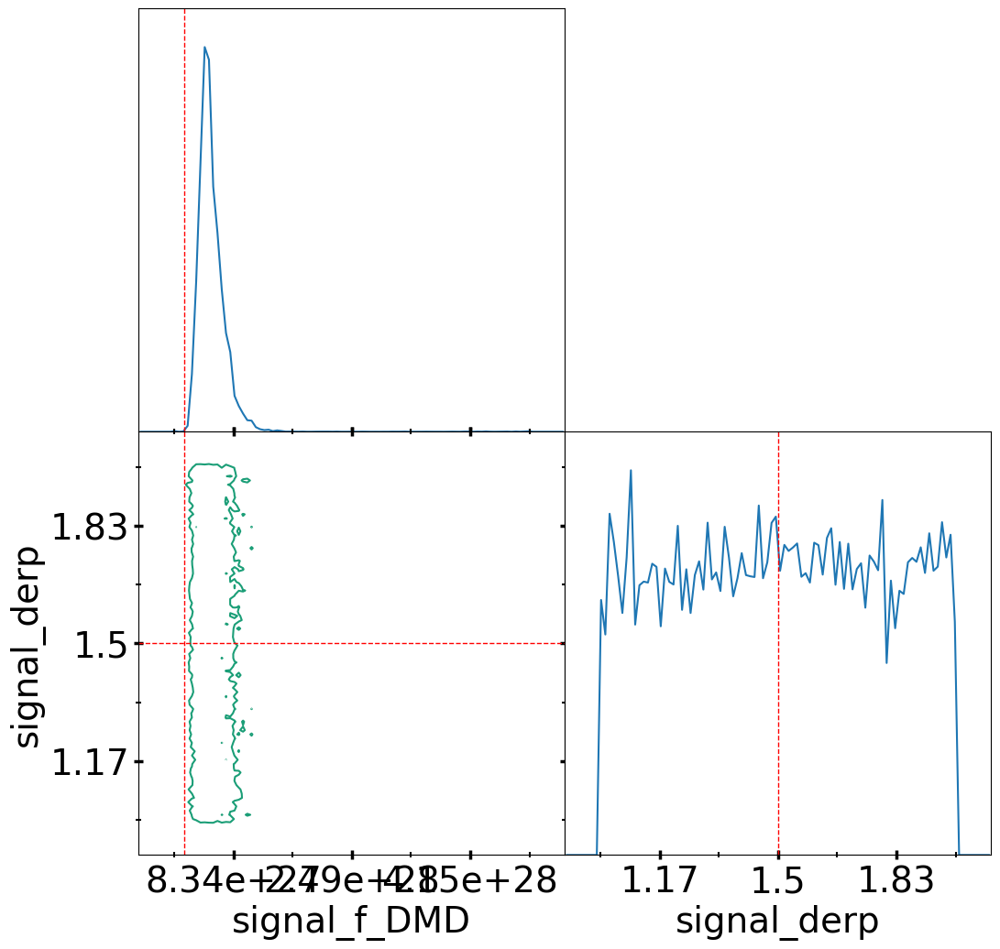

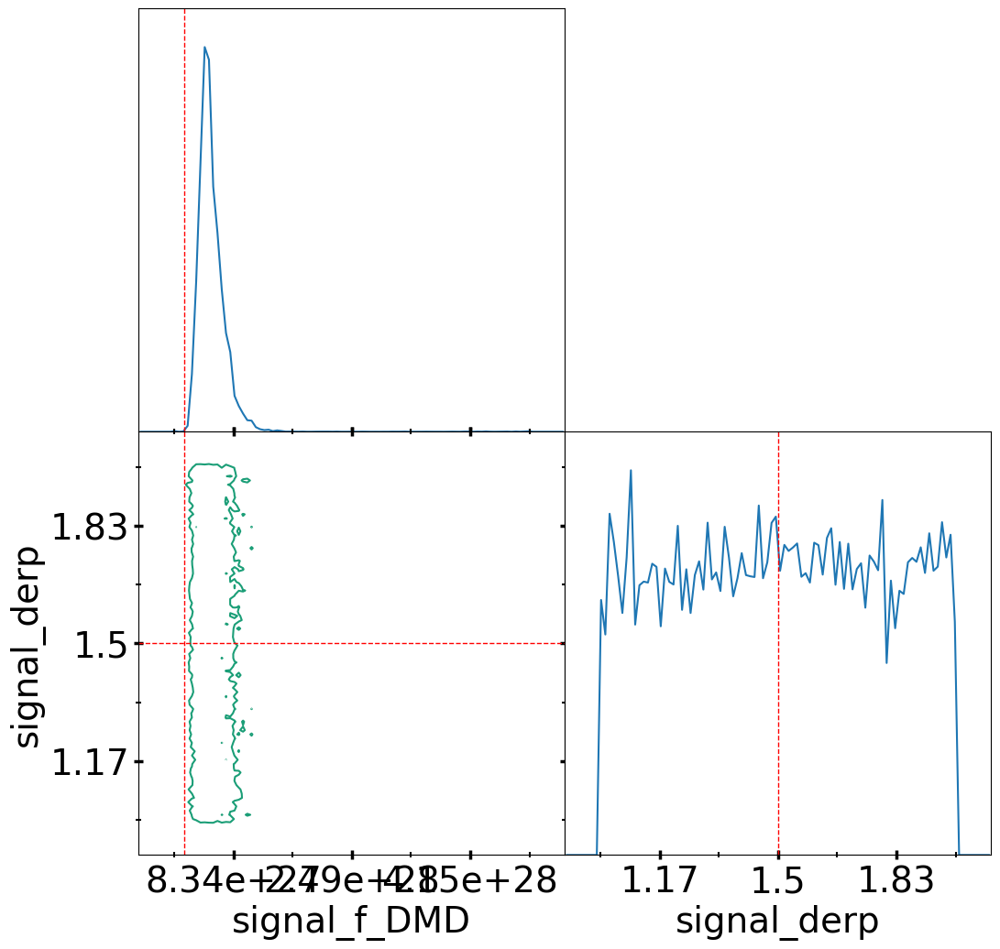

In [ ]:
test_Fitter.triangle_plot(reference_value_mean=[DMD_training_set_parameters[0],1.5])

In [ ]:
## Let's start reverse engineering Joshua's code:
iterations = 10   # number of least square iterations to perform


extraction = single_extraction_monochromatic_DMD
# these set the error for the density parameters
fDMD_lower = 0.5e26
fDMD_upper = 500e26


lst_bins = 10
frequencies = frequencies
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = '/home/dbarker7752/21_cm_group/Exotic_Models_Data/least_squares_monochrome_DMD'

signal_training_set_file_name = ''

# Let's make our signal training set and function:
signal_training_set = DMD_training_set_curves[:,::2]  # hopefully this doesn't need the exact format of TrainingSetCreator. Won't be too terrible to massage it into that format, but it would be very annoying.
signal_expander = RepeatExpander(lst_bins)
signal_model = perses.models.DarkMatterDecayModel(frequencies, in_Kelvin=True)
signal_model = ExpandedModel(signal_model, signal_expander)
model_names = ['signal', 'systematics']

# loads the foreground training set
fg_training_set = monochro_beam_TS_10LSTs
fg_training_set = np.reshape(fg_training_set, (len(fg_training_set), -1)) # this shapes it into the correct shape for th TrainedBasis pylinex class

# signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(0.5e26, 500e26)) # f_DMD
distribution_list.add_distribution(UniformDistribution(1, 2)) # derp

# I don't need this conditional expression
# condition_expression = Expression(\
# 	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
# 	num_arguments=3, import_strings=['import numpy as np'])

# condition_distribution = UniformConditionDistribution(condition_expression)

# prior = WindowedDistribution(distribution_list, condition_distribution)

prior = distribution_list
bounds = {\
	'f_DMD': (0.5e26, 500e26),\
        "derp": (1,2)}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 

# forecast_files = h5py.File(forecast_file_path,'r')
# forecaster = Forecaster(forecast_file_path)
# error = forecast_files['error'][()]
# data = forecast_files['data'][()][curve_number]    # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
# input_signal = forecast_files['input_curves/signal'][0] # The last index was removed in my code as Joshua was referencing something that didn't exist yet.
# num_linear_fg_terms = forecaster.plotter.get_basis_sum(icurve=curve_number)['systematics'].num_basis_vectors

# non forecaster version
fitter = extraction[0]
bases = extraction[1]
error = fitter.error 
data = fitter.data
input_signal = input_signal  # from the pylinex extraction cell above
num_linear_fg_terms = fitter.sizes["systematics"]

# #FG Model and Training Set for Full Data

fg_trained_basis = bases[1]
fg_trained_basis.generate_gaussian_prior(diagonal=True)
fg_priors = fg_trained_basis.gaussian_prior
fg_basis_model = BasisModel(fg_trained_basis)
models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.

full_data_model = SumModel(model_names, models)
fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'systematics', prior=fg_priors)
full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.
num_linear_sig_terms = fitter.sizes["signal"]
linear_fit_parameter_covariance = fitter.subbasis_parameter_covariance("signal")
linear_fit_parameter_mean = fitter.subbasis_parameter_mean("signal")
num_linear_signal_terms = fitter.sizes["signal"]
signal_trained_basis = bases[0]
projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)
signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_path,\
	**bounds)

least_square_fitter.run(iterations=iterations, attempt_threshold=100,\
	run_if_iterations_exist=False,verbose=True)

# This is the covariance code:
covariance = np.cov(np.array(least_square_fitter.argmins).T)

# This probably needs to include the covariance rather than just an identity. Maybe the MCMC fitter deals with this?
guess_distribution = GaussianDistribution(least_square_fitter.argmin, covariance)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])

guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

Computing Least Square Fit...
Starting iteration #1 of LeastSquareFitter at Sun Mar  1 17:11:16 2026.
-20.54299325366459
-20.54299325366459
-20.54299300097085
-20.54299325366459
-20.54299325366459
Starting iteration #2 of LeastSquareFitter at Sun Mar  1 17:11:16 2026.
-1.6877336276390138
-1.6877336276390138
-1.6877336214324252
-1.6877336276390138
-1.6877336276390138
Starting iteration #3 of LeastSquareFitter at Sun Mar  1 17:11:17 2026.
-1.3870841401758918
-1.3870841401758918
-1.3870841517922272
-1.3870841401758918
-1.3870841401758918
Starting iteration #4 of LeastSquareFitter at Sun Mar  1 17:11:17 2026.
-1.7014027952569442
-1.7014027952569442
-1.7014027958389293
-1.7014027952569442
-1.7014027952569442
Starting iteration #5 of LeastSquareFitter at Sun Mar  1 17:11:18 2026.
-0.7413977807289895
-0.7413977807289895
-0.741397794980926
-0.7413977807289895
-0.7413977807289895
Starting iteration #6 of LeastSquareFitter at Sun Mar  1 17:11:18 2026.
-0.05111272563010182
-0.05111272563010182
-0

v

### Coding up Primordial Black Holes:
Based off a combination of Clark et al. 2018 and Koivu et al. 2026 (in prep)

$\frac{dT_{k}}{dz} = \frac{dT_{k}}{dz}|_{org} + \frac{2(1+z)^2}{3k_bH(z)}\frac{5.34\times 10^{25}\frac{g^3}{s}f_h(E,z)(\phi_{e^\pm}+\phi_\gamma)^2\rho_{c,0}\Omega_{BH,0}}{n_hM_{BH}^3(1+f_{He}+x_e)}$

where $f_h$ is the portion of energy going into heating the IGM, $\phi_{e^\pm}$ is the portion of the Hawking radiation spectrum that is electron-positron pairs, $\phi_{\gamma}$ is the portion of the spectrum that are photons, $\Omega_{BH,0}$ is the density parameter of primordial black holes today, and $M_{BH}$ is the mass of the PBHs for the model.

And for the ionization fraction:

$\frac{dx_e}{dz} = \frac{dx_e}{dz}|_{org} + \left[\frac{f_i(E,z)}{n_hE_i}+(1-C)\frac{f_\alpha(E,z)}{n_hE_{\alpha}}\right] \frac{5.34\times 10^{25}\frac{g^3}{s}(\phi_{e^\pm}+\phi_\gamma)^2\rho_{c,0}\Omega_{BH,0}(1+z)^2}{M_{BH}^3H(z)}$

In [ ]:
# # we need to test out a different version of n_H:
# n_H_mod = lambda z,x_e: n_b0*(1+z)**3*(1-x_e) 
# n_e_mod = lambda z,x_e: n_b0*(1+z)**3*(x_e)

# def Tk_PBH (z_array,m_bh,obh0,omR0=omR0,omM0=omM0,omK0=omK0,omL0=omL0,H0=H0):
#     """Creates an array evolving the IGM temperature based on adiabatic cooling, compton scattering, and dark matter sefl-annihilation. Only works for the cosmic 
#     Dark Ages, as it does not include UV.
    
#     ===================================================================
#     Parameters
#     ===================================================================
#     z_array: an array of increasing redshift values. Needs to be a sufficiently fine grid. 
#     As of now there is some considerable numerical instabilities when your z grid is > 0.01

#     m_bh = mass of the primordial black holes
#     obh0 = density parameter of primordial black holes today.

#     ===================================================================
#     Output
#     ===================================================================
#     Tk_array:  A 2-D array with each entry being the redshift and IGM temperature
#     Tk_function: Interpolated version of your Tk_array that acts like a function with
#     redshift for its argument. Useful for future calculations.
#     xe_function: Interpolation function for the fraction of free electrons
#     xe_array: Array created from the x_e function."""

#     num=len(z_array)
#     t_c = lambda z: 1.172e8*((1+z)/10)**(-4) * 3.154e7 #[seconds] timescale of compton scattering
#     old_x_e = camb_xe_interp   # this is our model for fraction of free electrons
#     Tk_array = np.ones((num-1,2))   # creates a blank array for use below
#     z_start = z_array[-1]
#     z_end = z_array[0]
#     ## Some important constants
#     g_i = 0.3333      # fraction of energy deposited into ionization
#     g_e = 0.3333      # fraction of energy depostied into excitation of hydrogen and helium
#     g_h = 0.3333      # fraction of energy deposited into the IGM
#     E_i = 13.6     # [eV] energy of ground state hydrogen
#     E_e = 3.4      # [eV] energy of other states of hydrogen (took the next largest)
#     C = 0.5     # efficiency of the excitation in transfering energy to ionizing the IGM. Should be between 0 to 1. 1 being maximally inefficient.
#     phi_e = 0.142     # portion of the Hawking radiation spectrum that goes towards creating electron positron pairs
#     phi_gamma = 0.06        # portion of the Hawking radiation spectrum that goes towards creating photons
#     g2eV = 5.61e32      #[ev/gram] converts from grams to eV (need to have the critical density of the universe in units of energy, not mass for this.)

#     #This defines our right hand side function (turns out dxe/dz isn't needed. Too weak to cause any major effects during the dark ages.)
#     delta_z = np.abs(z_array[1]-z_array[0])
#     standard_dxe_dz = scipy.interpolate.CubicSpline(z_array,np.gradient(old_x_e(z_array))*(1/delta_z)) # standard electron fraction model based on camb
#     PBH_dxe_dz = lambda z,xe:  (g_i/(n_H_mod(z,xe)*E_i)+(1-C)*(g_e/(n_H_mod(z,xe)*E_e)))*(5.34e25*(phi_e+phi_gamma)**2*p_crit*g2eV*obh0*(1+z)**2/(m_bh**3*H(z,omR0,omM0,omK0,omL0,H0)))
    
#     ################ We are right here in our conversion from DMD to PBH
    
#     func_xe = lambda z,xe: standard_dxe_dz(z)-PBH_dxe_dz(z,xe)  # total rate of change of free electrons

#     #Initial conditions
#     xe_0 = np.array([old_x_e(z_array[-1])])    # sets our initial condition at our starting redshift (usually 1100 for dark age stuff)

#     # Time span
#     z_span = (z_start, z_end)

#     # Solve the differential equation
#     sol = solve_ivp(func_xe, z_span, xe_0, dense_output=True, method='Radau')

#     # Access the solution
#     z = sol.t
#     xe = sol.y[0]

#     xe_function=scipy.interpolate.CubicSpline(z[::-1],xe[::-1])
#     x_e = xe_function
#     xe_array = np.array([z,xe])
         
#     # g_h = lambda z: (1+2*x_e(z))/3


# ## Let's code up T_k
#     ## The heating / cooling processes ##
    
#     adiabatic = lambda zs,T:(1/(H(zs,omR0,omM0,omK0,omL0,H0)*(1+zs)))*(2*H(zs,omR0,omM0,omK0,omL0,H0)*T)
#     compton = lambda zs,T: (1/(H(zs,omR0,omM0,omK0,omL0,H0)*(1+zs)))*((x_e(zs))/(1+f_He+x_e(zs)))*((T_gamma(zs)-T)/(t_c(zs)))
#     pbh = lambda zs,m_bh,obh0: (2*g_h/(kb_ev*n_H_mod(zs,x_e(zs))*(1+f_He+x_e(zs))))*(5.34e25*(phi_e+phi_gamma)**2*p_crit*g2eV*obh0*(1+zs)**2/(m_bh**3*H(zs,omR0,omM0,omK0,omL0,H0)))    # primordial black holes

#     T0 = np.array([T_gamma(z_array[-1])])   # your initial temperature at the highest redshift. This assumes it is coupled fully to the CMB at that time.
#     z0 = z_array[-1]    # defines your starting z (useful for the loop below)
#     z_span = (z_start,z_end)
#     func = lambda z,T: adiabatic(z,T) - compton(z,T) - pbh(z,m_bh,obh0)

#     # Solve the differential equation
#     sol = solve_ivp(func, z_span, T0, dense_output=True, method='Radau')

#     # Access the solution
#     z = sol.t
#     T = sol.y[0]

#     Tk_function=scipy.interpolate.CubicSpline(z[::-1],T[::-1])  # Turns our output into a function with redshift as an argument  
#     Tk_array = np.array([z,T])   
#     return Tk_array, Tk_function, x_e, xe_array


# def PBH_training_set(frequency_array,parameters,N,verbose=True):
#     """"Creates a training set based on the formulation of the Primordial Black Hole (PBH) theory in Clark et al. 2018.

#     Parameters
#     ===================================================
#     frequency_array: array of frequencies to calculate the curve at. array-like.
#     parameters: Set of lower and upper bounds for each parameter. Should be shape (2,2), one row each for the mass of the black holes (m_bh)
#                 and the density parameter of primordial black holes (obh0). NOTE: set obh0 = 0 if you want it to follow the linear
#                 restrictions from Clark et al. 2018 based on the corresponding mass of the black hole.
#     N: The number of curves you would like to have in your training set. Interger
    
#     Returns
#     ====================================================
#     training_set: An array with your desired number of varied fiducial 21 cm curves
#     training_set_params: Parameters associated with each curve."""
#     conversion = lambda f: 1420.4/f-1 # converts between redshift and frequency
#     max_z = conversion(frequency_array[0])
#     if max_z > 1100:
#         max_z = 1100
#         print(f"Your largest redshift is {max_z}, which is before recombination. This functions will set your largest redshift equal to recombination for calculation. \
# This will likely make your plot look odd at frequencies larger than around 1.5 MHz")
#     else:
#         max_z = max_z
#     redshift_array = np.arange(conversion(frequency_array[-1]),max_z)
#     new_redshift_array = 1420.4/frequency_array-1 
#     new_redshift_array = new_redshift_array[::-1]
#     training_set = np.ones((N,len(new_redshift_array)))    # dummy array for the expanded training set
#     training_set_params = np.ones((N,len(parameters)))  # dummy array for the parameters of this expanded set.
#     x_e = camb_xe_interp
#     if parameters[1][0] == 0:
#         power_mbh_low = np.log10(parameters[0][0])
#         power_mbh_high = np.log10(parameters[0][1])
#         random_power_mbh = np.random.uniform(power_mbh_low,power_mbh_high,N)
#         training_set_params[:,0] = 10**random_power_mbh
#         power_obh0_func = lambda power_m_bh: 3*power_m_bh-52
#         power_obh0_high=power_obh0_func(random_power_mbh)
#         power_obh0_low = -9
#         random_power_obh0 = np.random.uniform(power_obh0_low,power_obh0_high,N)
#         training_set_params[:,1] = 10**random_power_obh0

#     else:
#         training_set_params[:,0] = np.random.uniform(parameters[0][0],parameters[0][1],N)
#         training_set_params[:,1] = np.random.uniform(parameters[1][0],parameters[1][1],N)        


#     if verbose:
#         for n in tqdm(range(N)):
#             m_bh,obh0=training_set_params[n]
#             T_k = Tk_PBH(redshift_array,m_bh,obh0)   # calculate our kinetic temperature to plug into the dTb function
#             dTb_element=dTb(new_redshift_array,T_k[2],T_k[1],omB0,omM0)*10**(-3)   # Need to convert back to Kelvin
#             dTb_element=dTb_element[::-1]   # You have to flip it again because of the way dTb calculates based on redshift (needs previous higher redshift to calculate next redshift)
#             training_set[n] = dTb_element
#     else:
#         for n in range(N):
#             m_bh,obh0=training_set_params[n]
#             T_k = Tk_PBH(redshift_array,m_bh,obh0)   # calculate our kinetic temperature to plug into the dTb function
#             dTb_element=dTb(new_redshift_array,T_k[2],T_k[1],omB0,omM0)*10**(-3)   # Need to convert back to Kelvin
#             dTb_element=dTb_element[::-1]   # You have to flip it again because of the way dTb calculates based on redshift (needs previous higher redshift to calculate next redshift)
#             training_set[n] = dTb_element
#     # interpolator = scipy.interpolate.CubicSpline(redshift_array,dTb_element)


    
    
#     return training_set, training_set_params, redshift_array



In [ ]:
frequency_range = np.arange(1,50,0.5)
params=np.array([[1e15,1e17],[0,0]])
PBH_TK_test=py21cmsig.Tk_PBH(z_array,1e15,1e-7)

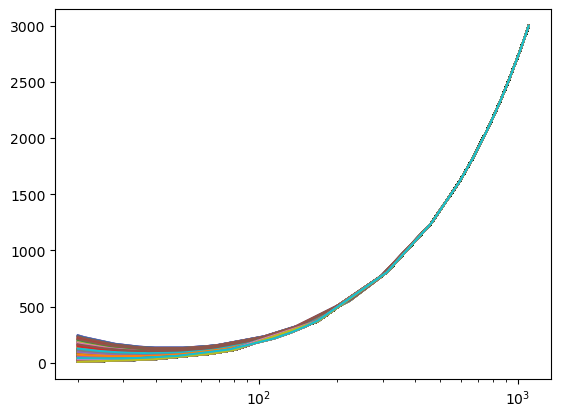

In [ ]:
params = PBH_test2[1]
for n in range(1000):
    PBH_TK_test=Tk_PBH(z_array,params[n][0],params[n][1])
    plt.plot(PBH_TK_test[0][0],PBH_TK_test[0][1])
plt.xscale("log")

945.9333333333334


100%|██████████| 1000/1000 [00:28<00:00, 35.14it/s]


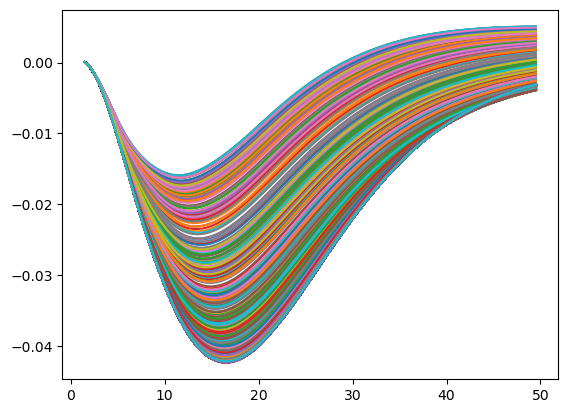

In [ ]:
frequency_range=np.arange(1.5,50,0.5)
params=np.array([[1e15,1e17],[0,0]])
PBH_TK_test2=py21cmsig.PBH_training_set(frequency_range,params,N=1000)
for n in range(1000):
    plt.plot(frequency_range,PBH_TK_test2[0][n])

In [ ]:
params = PBH_test2[1]
frequency_array = np.arange(1.5,50,0.5)
redshift_array=1420.4/frequency_array-1
redshift_array=redshift_array[::-1]
for n in range(1000):
    PBH_TK_test=py21cmsig.Tk_PBH(redshift_array,params[n][0],params[n][1])
    plt.plot(PBH_TK_test[3][0],(PBH_TK_test[3][1]-camb_xe_interp(PBH_TK_test[3][0]))/camb_xe_interp(PBH_TK_test[3][0]))
plt.xscale("log")

NameError: name 'PBH_test2' is not defined

In [ ]:
frequency_range = np.arange(1.5,50,0.5)
params=np.array([[1e15,1e17],[0,0]])
PBH_test = py21cmsig.PBH_training_set(frequency_range,params,100)
f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/PBH_training_set","w")
f.create_dataset("curves",data=PBH_test[0])
f.create_dataset("parameters",data=PBH_test[1])
f.close()

100%|██████████| 100/100 [00:02<00:00, 49.23it/s]


In [ ]:
PBH_test[0].shape

(100, 97)

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 52.16it/s]


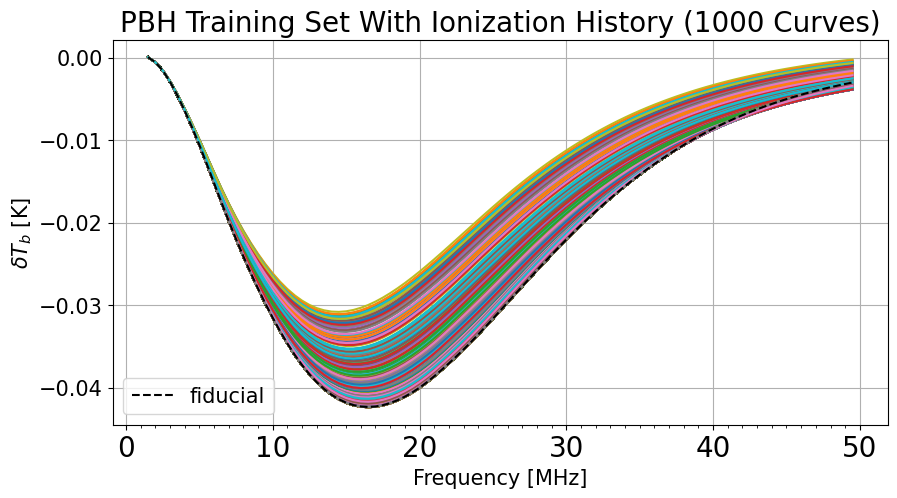

In [ ]:
plt.figure(figsize=(10, 5))
params2 = np.array([[10e45,10e45],[0,0]])
PBH_test_fiducial = py21cmsig.PBH_training_set(frequency_range,params2,1)
frequency_range
for n in range(1000):
    plt.plot(frequency_range,PBH_test[0][n])
plt.plot(frequency_range,PBH_test_fiducial[0][0],label="fiducial",color="black",ls="--")
plt.title(r"PBH Training Set With Ionization History (1000 Curves)",fontsize=20)
plt.xticks(ticks=np.arange(1,50,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

100%|██████████| 1/1 [00:00<00:00, 48.77it/s]


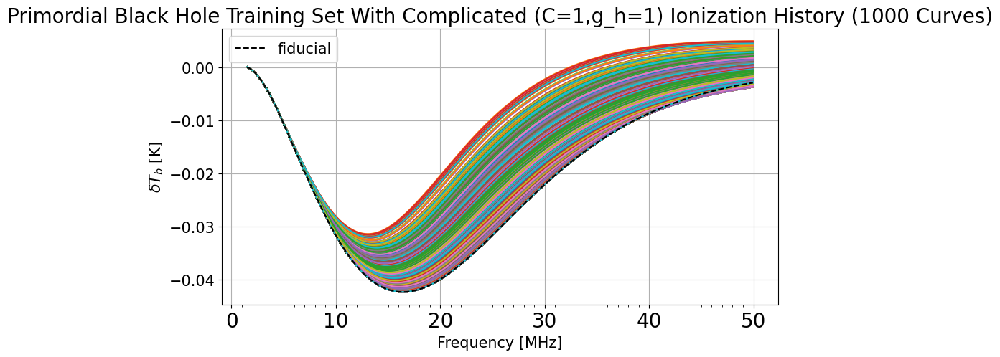

In [ ]:
plt.figure(figsize=(10, 5))
params2 = np.array([[10e45,10e45],[0,0]])
PBH_test_fiducial = PBH_training_set(frequency_range,params2,1)
frequency_range
for n in range(1000):
    plt.plot(frequency_range,PBH_test[0][n])
plt.plot(frequency_range,PBH_test_fiducial[0][0],label="fiducial",color="black",ls="--")
plt.title(r"Primordial Black Hole Training Set With Complicated (C=1,g_h=1) Ionization History (1000 Curves)",fontsize=20)
plt.xticks(ticks=np.arange(1,50,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

100%|██████████| 1/1 [00:00<00:00, 42.95it/s]


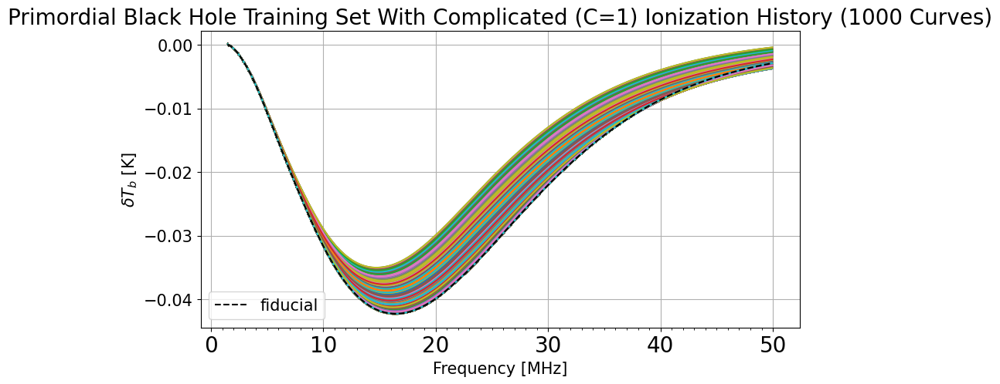

In [ ]:
plt.figure(figsize=(10, 5))
params2 = np.array([[10e45,10e45],[0,0]])
PBH_test_fiducial = PBH_training_set(frequency_range,params2,1)
frequency_range
for n in range(1000):
    plt.plot(frequency_range,PBH_test[0][n])
plt.plot(frequency_range,PBH_test_fiducial[0][0],label="fiducial",color="black",ls="--")
plt.title(r"Primordial Black Hole Training Set With Complicated (C=1) Ionization History (1000 Curves)",fontsize=20)
plt.xticks(ticks=np.arange(1,50,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

100%|██████████| 1/1 [00:00<00:00, 29.92it/s]


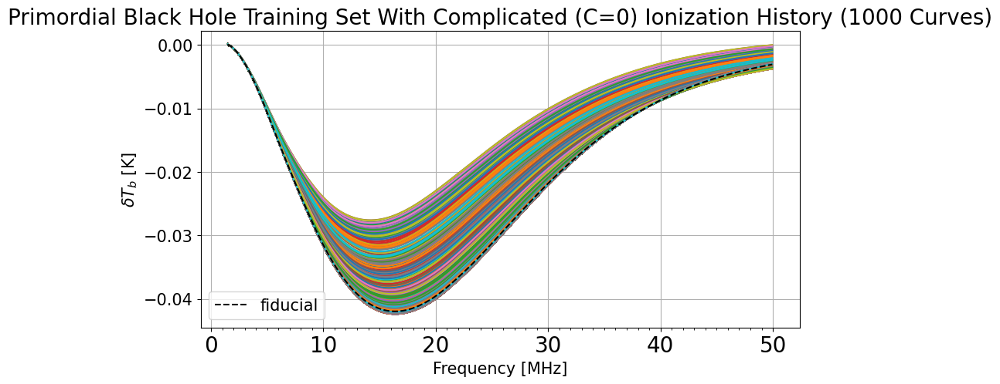

In [ ]:
plt.figure(figsize=(10, 5))
params2 = np.array([[10e45,10e45],[0,0]])
PBH_test_fiducial = PBH_training_set(frequency_range,params2,1)
frequency_range
for n in range(1000):
    plt.plot(frequency_range,PBH_test[0][n])
plt.plot(frequency_range,PBH_test_fiducial[0][0],label="fiducial",color="black",ls="--")
plt.title(r"Primordial Black Hole Training Set With Complicated (C=0) Ionization History (1000 Curves)",fontsize=20)
plt.xticks(ticks=np.arange(1,50,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

100%|██████████| 1/1 [00:00<00:00, 35.29it/s]


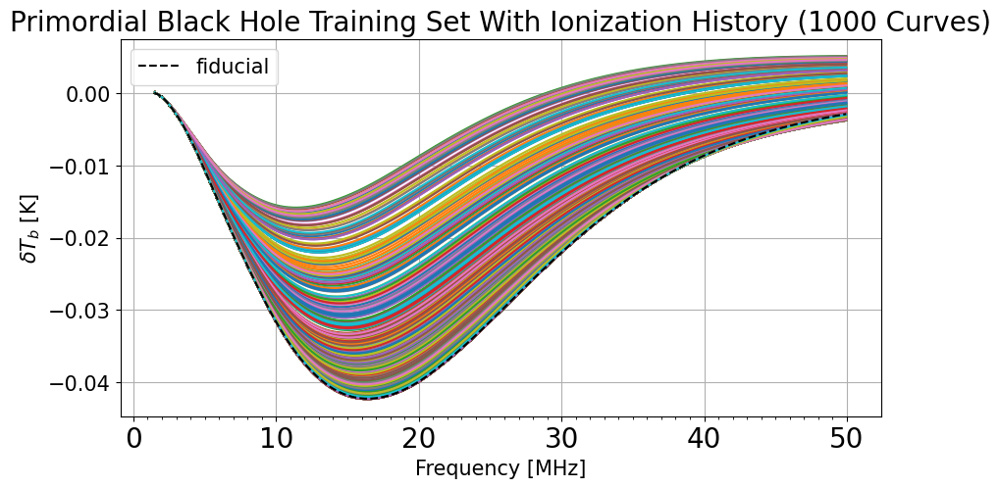

In [ ]:
plt.figure(figsize=(10, 5))
params2 = np.array([[10e45,10e45],[0,0]])
PBH_test_fiducial = PBH_training_set(frequency_range,params2,1)
frequency_range
for n in range(1000):
    plt.plot(frequency_range,PBH_test[0][n])
plt.plot(frequency_range,PBH_test_fiducial[0][0],label="fiducial",color="black",ls="--")
plt.title(r"Primordial Black Hole Training Set With Ionization History (1000 Curves)",fontsize=20)
plt.xticks(ticks=np.arange(1,50,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

100%|██████████| 1/1 [00:00<00:00, 42.01it/s]


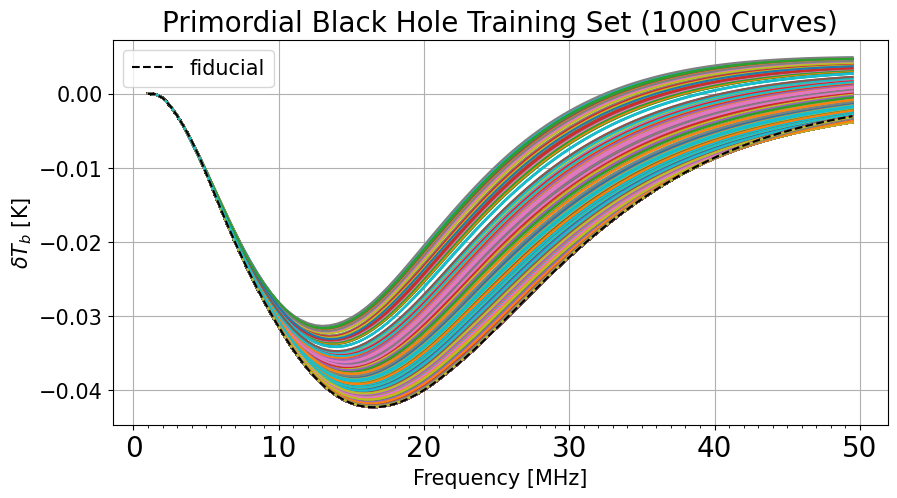

In [ ]:
plt.figure(figsize=(10, 5))
params2 = np.array([[10e45,10e45],[0,0]])
PBH_test_fiducial = PBH_training_set(frequency_range,params2,1)
frequency_range
for n in range(1000):
    plt.plot(frequency_range,PBH_test[0][n])
plt.plot(frequency_range,PBH_test_fiducial[0][0],label="fiducial",color="black",ls="--")
plt.title(r"Primordial Black Hole Training Set (1000 Curves)",fontsize=20)
plt.xticks(ticks=np.arange(1,50,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

100%|██████████| 1/1 [00:00<00:00, 44.01it/s]


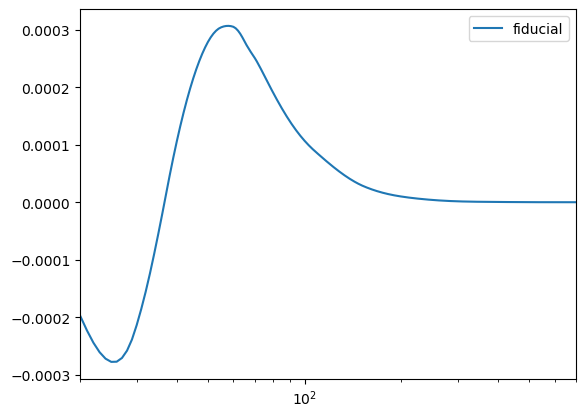

In [ ]:
params2 = np.array([[10e45,0],[obh0,0]])
PBH_test_fiducial = PBH_training_set(z_array,params2,1)
frequency_range
plt.plot(z_array,PBH_test[0][0][::-1]-PBH_test_fiducial[0][0][::-1],label="fiducial")
# plt.plot(z_array,PBH_test_fiducial[0][0][::-1],label="PBH")
# plt.plot(frequency_range,DMD_training_set_curves[8][::2],label="DMD")
plt.xscale("log")
# plt.ylim(-0.05,0.02)
plt.xlim(20,700)
plt.legend()

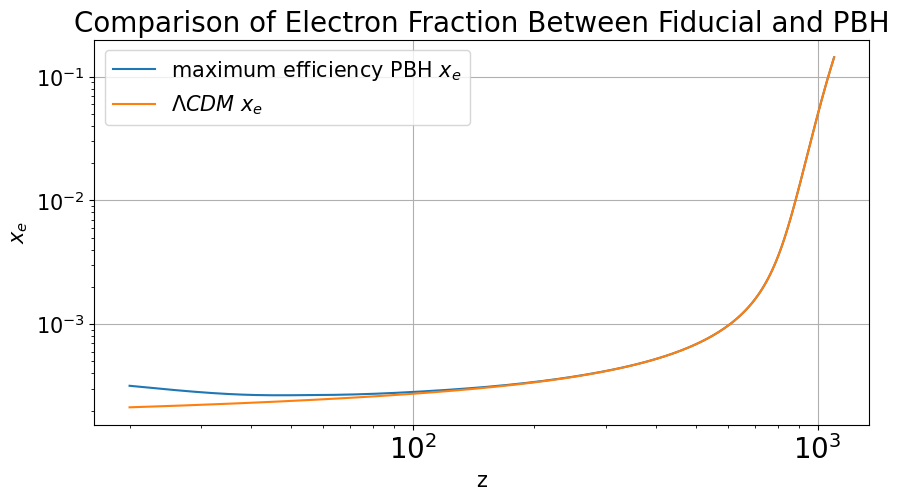

In [ ]:
plt.figure(figsize=(10, 5))
frequency_array = np.arange(1,50,0.5)
parameters = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0],[H0,0]])
plt.plot(z_array,PBH_test[2](z_array),label=r"maximum efficiency PBH $x_e$")
plt.plot(z_array,camb_xe_interp(z_array),label=r"$\Lambda CDM$ $x_e$")
plt.xscale("log")
plt.yscale("log")
plt.title(r"Comparison of Electron Fraction Between Fiducial and PBH",fontsize=20)
# plt.xticks(ticks=np.arange(1,1100,1),minor=True)
plt.xticks(size=20)
plt.xlabel("z",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$x_e$",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

/tmp/ipykernel_1242/3691760766.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=15)


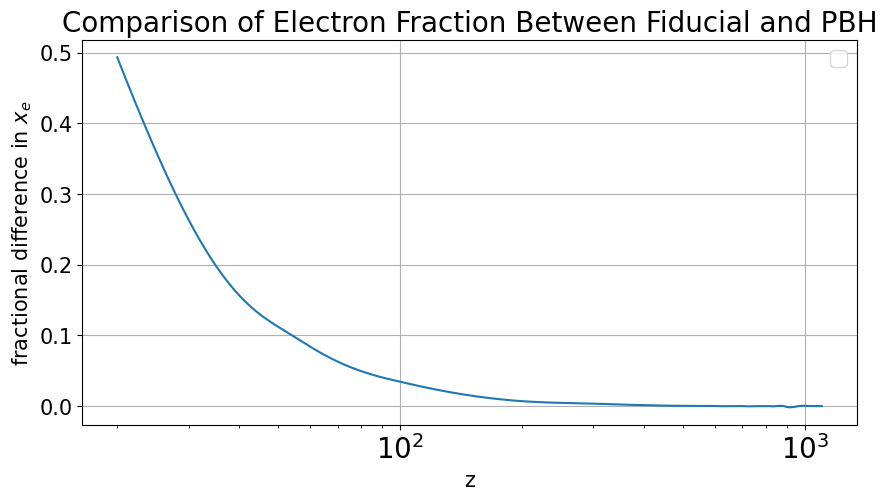

In [ ]:
plt.figure(figsize=(10, 5))
frequency_array = np.arange(1,50,0.5)
parameters = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0],[H0,0]])
plt.plot(z_array,(PBH_test[2](z_array)-camb_xe_interp(z_array))/camb_xe_interp(z_array))
plt.xscale("log")
# plt.yscale("log")
plt.title(r"Comparison of Electron Fraction Between Fiducial and PBH",fontsize=20)
# plt.xticks(ticks=np.arange(1,1100,1),minor=True)
plt.xticks(size=20)
plt.xlabel("z",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"fractional difference in $x_e$",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

In [ ]:
def Tk (z_array,omR0,omM0h2,omK0,omL0,omB0h2,H0):
    """Creates an array evolving the IGM temperature based on adiabatic cooling and compton scattering. Only works for the cosmic 
    Dark Ages, as it does not include UV
    
    ===================================================================
    Parameters
    ===================================================================
    z_array: an array of increasing redshift values. Needs to be a sufficiently fine grid. 
    As of now there is some considerable numerical instabilities when your z grid is > 0.01
    omR0: Density prameter of radiation today
    omM0: Density parameter of matter today
    omK0: Density pramameter of curvature today
    omL0: Density parameter of Dark Energy today
    ===================================================================
    Output
    ===================================================================
    Tk_array:  A 2-D array with each entry being the redshift and IGM temperature
    Tk_function: Interpolated version of your Tk_array that acts like a function with
                 redshift for its argument. Useful for future calculations.
    cosmological_parameters: An output of the cosmo parameters used to make the curve (just returns your density parameter inputs)"""
### Let's code up T_k 
    # some important functions

    # h = H0/100
    # omM0 = omM0h2/h**2   # Omega matter today
    # print(omM0)
    h = H0/100
    omM0 = omM0h2/h**2
    omB0 = omB0h2/h**2
    omC0 = omM0-omB0
    parameters_camb = camb.set_params(H0=H0, ombh2=omB0h2, omch2=omC0*h**2, As=As, ns=ns)
    camb_data= camb.get_background(parameters_camb)
    camb_xe = camb_data.get_background_redshift_evolution(z_array, ["x_e"], format="array")
    # or if you want an interpolated version:
    camb_xe_interp = scipy.interpolate.CubicSpline(z_array,camb_xe.flatten())  # Needs a redshift argument
    t_c = lambda z: 1.172e8*((1+z)/10)**(-4) * 3.154e7 #[seconds] timescale of compton scattering
    x_e = PBH_test[2]   # this is our model for fraction of free electrons
    adiabatic = lambda z,T:(1/(H(z,omR0,omM0,omK0,omL0,H0)*(1+z)))*(2*H(z,omR0,omM0,omK0,omL0,H0)*T)
    compton = lambda z,T: (1/(H(z,omR0,omM0,omK0,omL0,H0)*(1+z)))*((x_e(z))/(1+f_He+x_e(z)))*((T_gamma(z)-T)/(t_c(z)))
    z_start = z_array[-1]
    z_end = z_array[0]

    ### Let's code up T_k
    ## The heating / cooling processes ##

    T0 = np.array([T_gamma(z_array[-1])])   # your initial temperature at the highest redshift. This assumes it is coupled fully to the CMB at that time.
    z0 = z_array[-1]    # defines your starting z (useful for the loop below)
    z_span = (z_start,z_end)
    func = lambda z,T: adiabatic(z,T) - compton(z,T)

    # Solve the differential equation
    sol = solve_ivp(func, z_span, T0, dense_output=True, method='Radau')  # solve_ivp is WAY WAY WAY faster and plenty precise enough for what we're doing

    # Access the solution
    z = sol.t
    T = sol.y[0]

    Tk_function=scipy.interpolate.CubicSpline(z[::-1],T[::-1])  # Turns our output into a function with redshift as an argument  
    T_array = np.array([z,T])  

    Tk_function=scipy.interpolate.CubicSpline(z[::-1],T[::-1])  # Turns our output into a function with redshift as an argument 
    cosmological_parameters = np.array([omR0,omM0,omK0,omL0])   
    return T_array, Tk_function, cosmological_parameters

def lambdaCDM_training_set(frequency_array,parameters,N,verbose=True):
    """"Creates a training set based on the error range of the Lambda CDM cosmological constants for the fiducial 21 cm signal
    (no exotic physics).
    Parameters
    ===================================================
    frequency_array: array of frequencies to calculate the curve at. array-like.
    parameters: Set of mean values and standard deviation of your parameters. Make sure the order matches the order of the function
                As of writing this that order is: omR0,omM0,omK0,omL0,omB0. Shape should be, in this example, (5,2), with the first 
                column being the mean and the second being the standard deviation.
    N: The number of curves you would like to have in your training set. Interger
    bin_number: The number of bins in frequency space used to make the curves. Recommend 250 for LuSEE-Night as of the time writing this.
    
    Returns
    ====================================================
    training_set: An array with your desired number of varied fiducial 21 cm curves
    training_set_params: Parameters associated with each curve."""

    training_set = np.ones((N,len(frequency_array)))    # dummy array for the expanded training set
    training_set_params = np.ones((N,len(parameters)))  # dummy array for the parameters of this expanded set.
    # Note: The divide by 2 is there 




    for n in range(N):   # this will create our list of new parameters that will be randomly chosen from within the original training set's parameter space.
        new_params = np.array([])
        for k in range(len(parameters)):  # this will create a new set of random parameters for each instance
            new_params = np.append(new_params,np.random.normal(loc=parameters[k][0],scale=parameters[k][1]))
        training_set_params[n] = new_params

    redshift_array = 1420.4/frequency_array-1 
    redshift_array = redshift_array[::-1]      # need to convert to redshift since all of our functions are in redshift
    if verbose:
        for n in tqdm(range(N)):
            R,Mh2,K,L,Bh2,h1=training_set_params[n]
            h = h1/100
            omM0 = Mh2/h**2
            omB0 = Bh2/h**2
            omC0 = omM0-omB0
            parameters_camb = camb.set_params(H0=H0, ombh2=Bh2, omch2=omC0*h**2, As=As, ns=ns)
            camb_data= camb.get_background(parameters_camb)
            camb_xe = camb_data.get_background_redshift_evolution(redshift_array, ["x_e"], format="array")
            # or if you want an interpolated version:
            camb_xe_interp = scipy.interpolate.CubicSpline(redshift_array,camb_xe.flatten())  # Needs a redshift argumen
            T_k = Tk(redshift_array,R,Mh2,K,L,Bh2,h1)[1]   # calculate our kinetic temperature to plug into the dTb function
            p_crit = 1.88e-29*h**2 
            n_b0 = (1-y_P)*omB0*p_crit/m_p+y_P*omB0*p_crit/m_He 
            dTb_element=py21cmsig.dTb_modH0(redshift_array,PBH_test[2],T_k,omB0,omM0,n_b0,h)*10**(-3)   # Need to convert back to Kelvin
            dTb_element=dTb_element[::-1]   # You have to flip it again because of the way dTb calculates based on redshift (needs previous higher redshift to calculate next redshift)
            training_set[n] = dTb_element
    else:
        for n in range(N):
            R,Mh2,K,L,Bh2,h1=training_set_params[n]
            h = h1/100
            omM0 = Mh2/h**2
            omB0 = Bh2/h**2
            omC0 = omM0-omB0
            parameters_camb = camb.set_params(H0=H0, ombh2=Bh2, omch2=omC0*h**2, As=As, ns=ns)
            camb_data= camb.get_background(parameters_camb)
            camb_xe = camb_data.get_background_redshift_evolution(redshift_array, ["x_e"], format="array")
            # or if you want an interpolated version:
            camb_xe_interp = scipy.interpolate.CubicSpline(redshift_array,camb_xe.flatten())  # Needs a redshift argumen
            T_k = Tk(redshift_array,R,Mh2,K,L,Bh2,h1)[1]   # calculate our kinetic temperature to plug into the dTb function
            p_crit = 1.88e-29*h**2 
            n_b0 = (1-y_P)*omB0*p_crit/m_p+y_P*omB0*p_crit/m_He 
            dTb_element=py21cmsig.dTb_modH0(redshift_array,PBH_test[2] ,T_k,omB0,omM0,n_b0,h)*10**(-3)   # Need to convert back to Kelvin
            dTb_element=dTb_element[::-1]   # You have to flip it again because of the way dTb calculates based on redshift (needs previous higher redshift to calculate next redshift)
            training_set[n] = dTb_element
    
    return training_set, training_set_params, n_b0, p_crit

100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


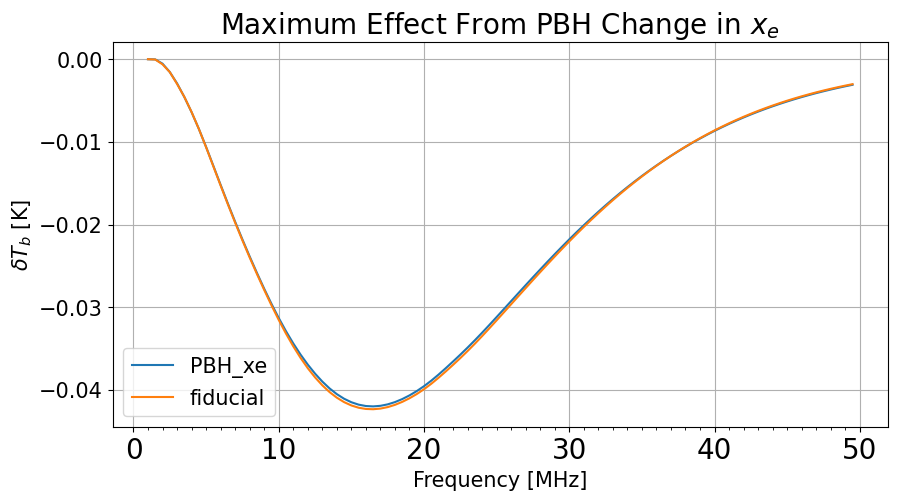

In [ ]:
plt.figure(figsize=(10, 5))
frequency_array = np.arange(1,50,0.5)
parameters = np.array([[omR0,0],[omM0h2,0],[omK0,0],[omL0,0],[omB0h2,0],[H0,0]])
test_new_PBH_xe = lambdaCDM_training_set(frequency_array,parameters,1)
plt.plot(frequency_array,test_new_PBH_xe[0][0],label="PBH_xe")
plt.plot(frequency_array,py21cmsig.lambdaCDM_training_set(frequency_array,parameters,1)[0][0],label="fiducial")
plt.title(r"Maximum Effect From PBH Change in $x_e$", fontsize=20)
plt.xticks(ticks=np.arange(1,50,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.grid()
plt.legend(fontsize=15)

In [ ]:
# testing the basic functioning of PBH_dxe_dz

g_i = 1/3      # fraction of energy deposited into ionization
g_e = 1/3      # fraction of energy depostied into excitation of hydrogen and helium
g_h = 1/3      # fraction of energy deposited into the IGM
E_i = 13.6     # [eV] energy of ground state hydrogen
E_e = 3.4      # [eV] energy of other states of hydrogen (took the next largest)
C = 0.1      # efficiency of the excitation in transfering energy to ionizing the IGM. Should be between 0 to 1. 1 being maximally inefficient.
phi_e = 0.142     # portion of the Hawking radiation spectrum that goes towards creating electron positron pairs
phi_gamma = 0.06        # portion of the Hawking radiation spectrum that goes towards creating photons
g2eV = 5.61e32      #[ev/gram] converts from grams to eV (need to have the critical density of the universe in units of energy, not mass for this.)
Obh0=omC0
m_bh = 10e16
PBH_dxe_dz = lambda z,xe:  (g_i/(n_H(z,xe)*E_i)+(1-C)*(g_e/(n_H(z,xe)*E_e)))*(5.34e25*(phi_e+phi_gamma)**2*p_crit*g2eV*Obh0*(1+z)**2/(m_bh**3*H(z,omR0,omM0,omK0,omL0,H0)))
PBH_dxe_dz(z_array,camb_xe_interp)

array([6.13124345e-04, 5.45742877e-04, 4.88283523e-04, ...,
       3.17495477e-08, 3.17235814e-08, 3.16980946e-08])

## Coding up Primordial Magnetic Fields

Equations used:
- $    \frac{dT_K}{dz}= \frac{dT_K}{dz}|_{org}-\frac{2\Gamma_{\mathsf{pmf}}}{3n_{tot}k_B(1+z)H(z)}$
- $\Gamma_{\mathsf{pmf}}=\Gamma_{\mathsf{dt}}+\Gamma_{\mathsf{amb}}$
- $\Gamma_{\mathsf{dt}}=5.97\times10^{-20}\left(\frac{B_0}{\mathsf{nG}}\right)^2(1+z)^4H(z)f_D^{n_B+3}\frac{ma^m}{(a+1.5\mathsf{ln}((1+z_{\mathsf{rec}})/(1+z)))^{m+1}}\frac{\mathsf{erg}}{\mathsf{cm^3}\mathsf{s}}$
- $    \Gamma_{\mathsf{amb}} = \frac{8.53\times10^{-103}x_e}{T_{K}^{0.375}(1-x_e)}f_D^{2n_B+8}\left[\frac{\left(\frac{B_0}{\mathsf{nG}}\right)^2(1+z)^5k_D^{\mathsf{rec}}}{\rho_b}\right]^2f_L\ \ \frac{\mathsf{erg}}{\mathsf{cm^3s}}$
- $    m = \frac{2(n_B+3)}{n_B+5}$
- $    a = \mathsf{ln}\left(1+\frac{14.8}{B_0f_Dk_D^{\mathsf{rec}}}\right)$
- $f_L = 0.8313(n_B +3)^{1.105}(1.0-0.0102(n_B+3))$
- $        k_D^{\mathsf{rec}} = \left[6.11\times10^5(2\pi)^{n_B}\left(\frac{\mathsf{nG}}{B_0}\right)^2\right]^{\frac{1}{n_B+5}}$
- $f_D^{n_B+3}=\frac{\rho_{mf}}{\rho_{mf}^{ad}}=\frac{\rho_{mf}}{3.98\times10^{20}\left(\frac{B_0}{\mathsf{nG}}\right)^2(1+z)^4\mathsf{\frac{erg}{cm^3}}}$
- $\frac{d\rho_{mf}}{dz} = \frac{4\rho_{mf}}{(1+z)}+\frac{\Gamma_{\mathsf{pmf}}}{(1+z)H(z)}\ $

In [ ]:
# # we need to test out a different version of n_H:
# # n_H_mod = lambda z,x_e: n_b0*(1+z)**3*(1-x_e) 
# # n_e_mod = lambda z,x_e: n_b0*(1+z)**3*(x_e)

# def Tk_PMF (z_array,n_b,B_0,omR0=omR0,omM0=omM0,omK0=omK0,omL0=omL0,H0=H0):
#     """Creates an array evolving the IGM temperature based on adiabatic cooling, compton scattering, and dark matter sefl-annihilation. Only works for the cosmic 
#     Dark Ages, as it does not include UV.
    
#     ===================================================================
#     Parameters
#     ===================================================================
#     z_array: an array of increasing redshift values. Needs to be a sufficiently fine grid. 
#     As of now there is some considerable numerical instabilities when your z grid is > 0.01

#     n_b: spectral index of the power spectrum of the primordial black holes
#     B_0: Average strength of the primordial magnetic field

#     ===================================================================
#     Output
#     ===================================================================
#     Tk_array:  A 2-D array with each entry being the redshift and IGM temperature
#     Tk_function: Interpolated version of your Tk_array that acts like a function with
#     redshift for its argument. Useful for future calculations.
#     xe_function: Interpolation function for the fraction of free electrons
#     xe_array: Array created from the x_e function."""

#     num=len(z_array)
#     t_c = lambda z: 1.172e8*((1+z)/10)**(-4) * 3.154e7 #[seconds] timescale of compton scattering
#     x_e = camb_xe_interp   # this is our model for fraction of free electrons
#     Tk_array = np.ones((num-1,2))   # creates a blank array for use below
#     z_start = z_array[-1]
#     z_end = z_array[0]
#     g2eV = 5.61e32 
#     z_rec = 1100    # redshift of recombination
#     m = 2*(n_b+3)/(n_b+5)
#     kd_rec = (30.3*(1+z_rec)**(5/2)*np.pi**n_b*(1/B_0)**2*x_e(z_rec)*np.sqrt(omM0)*omB0*h**5)**(1/(n_b+5))
#     fL = 0.8313*(n_b+3)**1.105*(1.0-0.0102*(n_b+3))
#     ## Some important constants


#     ## Some important equations
#     f_D = lambda z, rho_mf: ((rho_mf)/(3.98e-20*B_0**2*(1+z)**4))**(1/(n_b+3))
#     a = lambda z, rho_mf: np.log(1+(14.8)/(B_0*f_D(z,rho_mf)*kd_rec))
#     Gamma_dt = lambda z,rho_mf: 5.97e-20*(B_0)**2*(1+z)**4*H(z,omR0,omM0,omK0,omL0,H0)*f_D(z,rho_mf)**(n_b+3)*(m*a(z,rho_mf)**m)/((a(z,rho_mf)+1.5*np.log((1+z_rec)/(1+z)))**(m+1))  
#     rho_mf_0_func = lambda B_0: 3.98e-20*B_0**2*(1+z_rec)**4

#     ## rho_mf is a differential equation
#     rho_mf_0 = np.array([rho_mf_0_func(B_0)])
#     z0 = z_array[-1]
#     z_span = (z_start,z_end)
#     func = lambda z,rho_mf: 4*rho_mf/(1+z) + (Gamma_dt(z,rho_mf))/((1+z)*H(z,omR0,omM0,omK0,omL0,H0))

#     # Solve the differential equation
#     sol = solve_ivp(func, z_span, rho_mf_0, dense_output=True, method='Radau')
    
#     # Access the solution
#     z = sol.t
#     rho_mf = sol.y[0]

#     rhomf_function=scipy.interpolate.CubicSpline(z[::-1],rho_mf[::-1])  # Turns our output into a function with redshift as an argument  
#     rhomf_array = np.array([z,rho_mf])   


#     f_D = lambda z: (((rhomf_function(z))/(3.98e-20*B_0**2*(1+z)**4))**(1/(n_b+3)))
#     a = lambda z: np.log(1+(14.8)/(B_0*f_D(z)*kd_rec))
#     Gamma_dt = lambda z: 5.97e-20*(B_0)**2*(1+z)**4*H(z,omR0,omM0,omK0,omL0,H0)*f_D(z)**(n_b+3)*(m*a(z)**m)/((a(z)+1.5*np.log((1+z_rec)/(1+z)))**(m+1)) 
#     Gamma_amb = lambda z,T: (8.52e-103*x_e(z))/(T**0.375*(1-x_e(z)))*f_D(z)**(2*n_b+8)*(((B_0)**2*(1+z)**5)*kd_rec/(p_crit_ergs*(1+z)**3*omB0))**2*fL
#     Gamma_pmf = lambda z,T: Gamma_dt(z)+Gamma_amb(z,T)
#     f_Dnb = lambda z: (rhomf_function(z))/(3.98e-20*B_0**2*(1+z)**4)

# ## Let's code up T_k
#     # The heating / cooling processes ##
    
#     adiabatic = lambda zs,T:(1/(H(zs,omR0,omM0,omK0,omL0,H0)*(1+zs)))*(2*H(zs,omR0,omM0,omK0,omL0,H0)*T)
#     compton = lambda zs,T: (1/(H(zs,omR0,omM0,omK0,omL0,H0)*(1+zs)))*((x_e(zs))/(1+f_He+x_e(zs)))*((T_gamma(zs)-T)/(t_c(zs)))
#     pmf = lambda zs,T: -(2*Gamma_pmf(zs,T))/(3*n_tot(zs)*kb*(1+zs)*(H(zs,omR0,omM0,omK0,omL0,H0)))    # primordial magnetic fields

#     T0 = np.array([T_gamma(z_array[-1])])   # your initial temperature at the highest redshift. This assumes it is coupled fully to the CMB at that time.
#     z0 = z_array[-1]    # defines your starting z (useful for the loop below)
#     z_span = (z_start,z_end)
#     func = lambda z,T: adiabatic(z,T) - compton(z,T) + pmf(z,T)

#     # Solve the differential equation
#     sol = solve_ivp(func, z_span, T0, dense_output=True, method='Radau')

#     # Access the solution
#     z = sol.t
#     T = sol.y[0]

#     Tk_function=scipy.interpolate.CubicSpline(z[::-1],T[::-1])  # Turns our output into a function with redshift as an argument  
#     Tk_array = np.array([z,T])   
#     a_func = lambda z: (a(z)+1.5*np.log((1+z_rec)/(1+z)))**(m+1)*f_Dnb(z)
#     return Tk_array, Tk_function, rhomf_function, rhomf_array, f_Dnb


# def PMF_training_set(frequency_array,parameters,N,verbose=True):
#     """"Creates a training set based on the formulation of the Primordial Black Hole (PBH) theory in Clark et al. 2018.

#     Parameters
#     ===================================================
#     frequency_array: array of frequencies to calculate the curve at. array-like.
#     parameters: Set of lower and upper bounds for each parameter. Should be shape (2,2), one row each for the mass of the black holes (m_bh)
#                 and the density parameter of primordial black holes (obh0). NOTE: set obh0 = 0 if you want it to follow the linear
#                 restrictions from Clark et al. 2018 based on the corresponding mass of the black hole.
#     N: The number of curves you would like to have in your training set. Interger
    
#     Returns
#     ====================================================
#     training_set: An array with your desired number of varied fiducial 21 cm curves
#     training_set_params: Parameters associated with each curve."""
#     conversion = lambda f: 1420.4/f-1 # converts between redshift and frequency
#     max_z = conversion(frequency_array[0])
#     if max_z > 1100:
#         max_z = 1100
#         print(f"Your largest redshift is {max_z}, which is before recombination. This functions will set your largest redshift equal to recombination for calculation. \
# This will likely make your plot look odd at frequencies larger than around 1.5 MHz")
#     else:
#         max_z = max_z
#     redshift_array = np.arange(conversion(frequency_array[-1]),max_z)
#     new_redshift_array = 1420.4/frequency_array-1 
#     new_redshift_array = new_redshift_array[::-1]
#     training_set = np.ones((N,len(new_redshift_array)))    # dummy array for the expanded training set
#     training_set_params = np.ones((N,len(parameters)))  # dummy array for the parameters of this expanded set.
#     x_e = camb_xe_interp
#     # if parameters[1][0] == 0:
#     #     power_mbh_low = np.log10(parameters[0][0])
#     #     power_mbh_high = np.log10(parameters[0][1])
#     #     random_power_mbh = np.random.uniform(power_mbh_low,power_mbh_high,N)
#     #     training_set_params[:,0] = 10**random_power_mbh
#     #     power_obh0_func = lambda power_m_bh: 3*power_m_bh-52
#     #     power_obh0_high=power_obh0_func(random_power_mbh)
#     #     power_obh0_low = -9
#     #     random_power_obh0 = np.random.uniform(power_obh0_low,power_obh0_high,N)
#     #     training_set_params[:,1] = 10**random_power_obh0

#     # else:
#     training_set_params[:,0] = np.random.uniform(parameters[0][0],parameters[0][1],N)
#     training_set_params[:,1] = np.random.uniform(parameters[1][0],parameters[1][1],N)        


#     if verbose:
#         for n in tqdm(range(N)):
#             n_b,B_0=training_set_params[n]
#             T_k = Tk_PMF(redshift_array,n_b,B_0)   # calculate our kinetic temperature to plug into the dTb function
#             dTb_element=dTb(new_redshift_array,x_e,T_k[1],omB0,omM0)*10**(-3)   # Need to convert back to Kelvin
#             dTb_element=dTb_element[::-1]   # You have to flip it again because of the way dTb calculates based on redshift (needs previous higher redshift to calculate next redshift)
#             training_set[n] = dTb_element
#     else:
#         for n in range(N):
#             n_b,B_0=training_set_params[n]
#             T_k = Tk_PMF(redshift_array,n_b,B_0)   # calculate our kinetic temperature to plug into the dTb function
#             dTb_element=dTb(new_redshift_array,x_e,T_k[1],omB0,omM0)*10**(-3)   # Need to convert back to Kelvin
#             dTb_element=dTb_element[::-1]   # You have to flip it again because of the way dTb calculates based on redshift (needs previous higher redshift to calculate next redshift)
#             training_set[n] = dTb_element
#     # interpolator = scipy.interpolate.CubicSpline(redshift_array,dTb_element)


    
    
#     return training_set, training_set_params, redshift_array



In [ ]:
reload(py21cmsig)

Prepared Haslam map in 0.126 s.


<module 'py21cmsig' from '/home/dbarker7752/py21cmsig/py21cmsig.py'>

In [ ]:
frequency_range = np.arange(1,50,0.5)
parameters=np.array([[-2.9,4],[0,0.5]])

PMF_test=py21cmsig.PMF_training_set(frequency_range,parameters,10000)
f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/PMF_training_set","w")
f.create_dataset("curves",data=PMF_test[0])
f.create_dataset("parameters",data=PMF_test[1])
f.close()

Your largest redshift is 1100, which is before recombination. This functions will set your largest redshift equal to recombination for calculation. This will likely make your plot look odd at frequencies larger than around 1.5 MHz


100%|██████████| 10000/10000 [05:30<00:00, 30.21it/s]


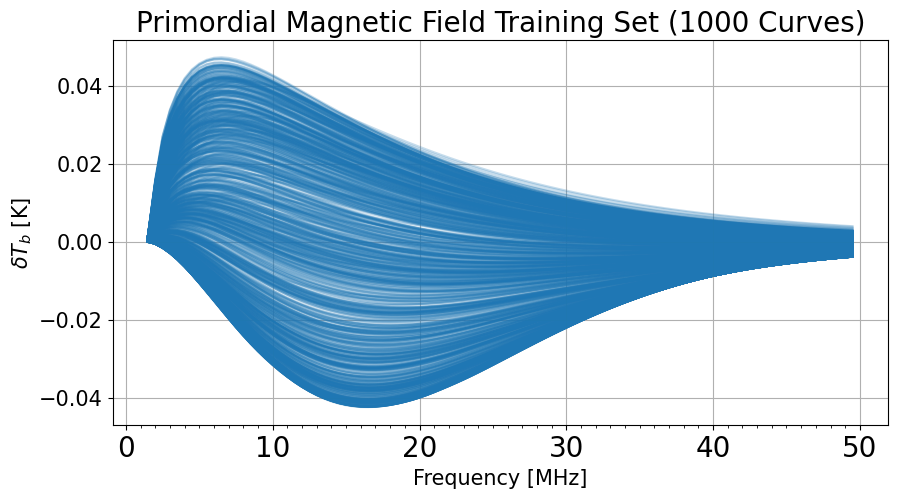

In [ ]:
plt.figure(figsize=(10, 5))

for n in np.arange(1000):
    plt.plot(frequency_range[1::],PMF_test[0][n][1::], color="tab:blue", alpha=0.25)   #### Need to change 4 back to 16 if not using 50 frequency bins ####
plt.xticks(ticks=np.arange(1,51,1),minor=True)
plt.xticks(size=20)
plt.xlabel("Frequency [MHz]",fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(r"$\delta T_b$ [K]",fontsize=15)
plt.title(r"Primordial Magnetic Field Training Set (1000 Curves)", fontsize=20)
plt.grid()

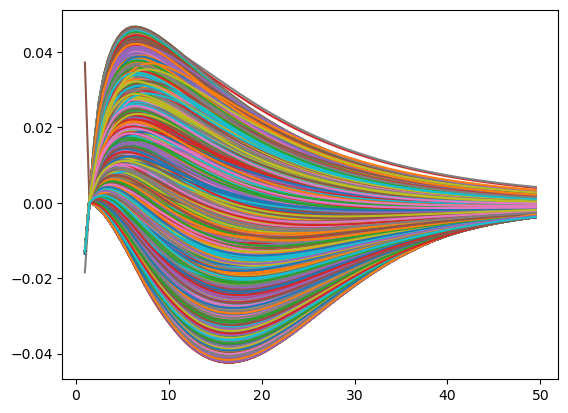

In [ ]:
for n in range(1000):
    plt.plot(frequency_range,PMF_test[0][n])

In [ ]:
test_rhomf[0]

array([[1099.        , 1098.90794423, 1098.6164516 , 1096.98865708,
        1080.71071186, 1033.11463614,  997.15518073,  961.19572532,
         904.93779774,  868.96918176,  833.00056579,  797.00959887,
         759.75098976,  704.44014712,  638.64626592,  516.50696765,
         412.4736817 ,  243.61379275,  131.80689638,   96.12485641,
          60.44281643,   40.22140822,   20.        ],
       [2997.5       , 2997.18898547, 2996.39308803, 2991.9597692 ,
        2947.50444857, 2817.76621163, 2719.89994956, 2622.00345472,
        2468.4911405 , 2369.85848905, 2271.37858863, 2172.79385811,
        2070.27355339, 1917.48162702, 1735.22727082, 1394.21084527,
        1098.61735621,  599.34624744,  256.98792308,  155.43240528,
          69.18571665,   32.13965733,    7.58734475]])

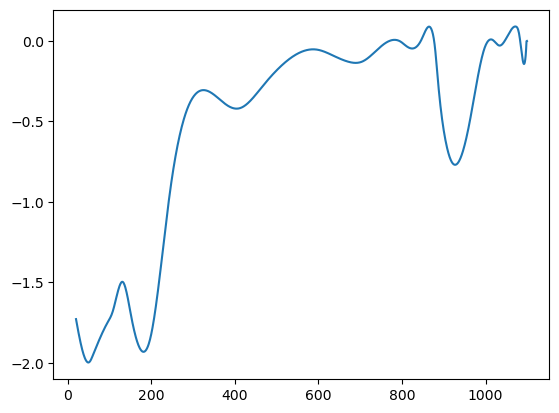

In [ ]:
# plt.plot(z_array,test_rhomf[1](z_array))
# plt.plot(z_array,py21cmsig.My_Tk[1](z_array))
plt.plot(z_array,test_rhomf[1](z_array)-py21cmsig.My_Tk[1](z_array))

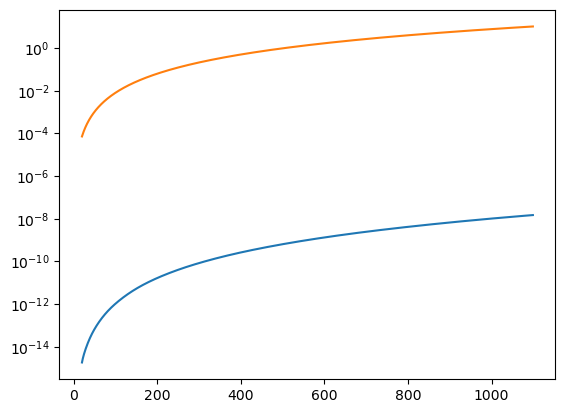

In [ ]:
plt.plot(z_array,test_rhomf[0](z_array))
plt.plot(z_array,p_crit_ergs*(1+z_array)**3)
plt.yscale("log")

In [ ]:
# p_crit*(1+1100)**3
p_crit

8.563212187999998e-30

## Best Fit to the Foreground

So the best fit method will be hugely important for the second paper on degeneracy and optimizing training sets and such, but this one could benefit from it as well and I'd like to work on that right now because it's kinda fun.

Idea 1): Use the five region model and its 15 parameters and set that equal to a specific brightness temperature at a specific frequency. This is one equation. Now do that for 14 more frequency bins and slide through all frequency bins to get a distribution of solutions per frequency. I'm intersted to see what this looks like. It should just move in a noisy pattern related to the radiometer noise. Let's find out.
-   Conclusion: Pretty sure this can't work unless your data is exactly following a synchrotron equation and we have Dark Ages signal (however small) and also noise (not so terribly small) that will cause the given temperatures to not be perfect and therefore be unsolvable in an analytical way. It has to be numerical! Let's call this idea and move on to the next.

Idea 2): Just make a really big training set that stabilizes the chi-squared (hopefully around 1.0) and trim that training set to see if it adjusts your ability to extract the model. It really might be that simple. Let's see.

Idea 3): Do you telescoping method where you build a training set and then choose the best 10% or so, but instead of taking the full parameter range of all the curves, form a covariance matrix to further constrain the parameters. Not quite sure exactly how to implement this right now but we'll figure it out if the first idea doesn't work



In [ ]:
### Idea 1 ###
## plan is to use scipy to solve an algebraic equation for our five region model.

def n_region_synchrotron_foreground(parameters,frequencies,reference_frequency=408):
    """Creates a set of equations with frequency as an input that can be plugged into scipy.optimize.fsolve to get the parameter values.
    
    Parameters
    ==============================
    parameters: List of parameters to apply to the model. The shape must be (number of regions, 3). The correct order for synchrotron is [Amplitude, spectral index, spectral curvature]
    frequencies: The array of frequencies to evaluate the model at.
    reference_frequency: The frequency that non dimensionalizes the frequency array for the synchrotron equation (in MHz). Usually its 408 MHz for anything related to Dark Ages or Cosmic Dawn.
                         (has to do with the EDGES experiment and the trough they detected, so it certainly is a bit arbitrary.)
    
    Returns
    ==============================
    temperature_array: array of temperatures associated with the input frequencies"""
    temperature_array = np.zeros(len(frequencies))
    for i,f in enumerate(frequencies):
        element = 0
        for n in range(len(parameters)):          # loops through all the regions, which is defined by the user simply based on the shape of the parameter array (see the documentation above).
            element += parameters[n][0]*(f/reference_frequency)**(parameters[n][1]+parameters[n][2]*np.log(f/reference_frequency))
        temperature_array[i] = element

    return temperature_array
            

In [ ]:
sol = fsolve(n_region_synchrotron_foreground,[[10,-2.5,-0.015],[10,-2.5,-0.015],[10,-2.5,-0.015],[10,-2.5,-0.015],[10,-2.5,-0.015]])

Region 1: 2458
Region 2: 2457
Region 3: 2458
Region 4: 2457
Region 5: 2458


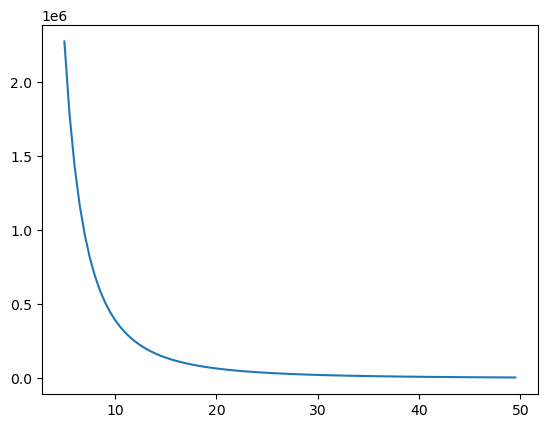

In [ ]:
# let's test out the function:

parameters = np.array([[1.59202418e+01,-2.65279830e+00,-1.37293590e-02],[1.66130589e+01,-2.69062579e+00,-1.47582387e-02],[1.89769800e+01,-2.68235795e+00,-1.34495335e-02],\
                       [2.42115565e+01,-2.66682587e+00,-1.20169084e-02],[5.22431891e+01,-2.65055339e+00,-2.42275191e-02]])      # five region parameter example (best fit to base ULSA)

temperature_array_test=n_region_synchrotron_foreground(parameters,frequencies)      # testing out the above function using the ULSA best fit parameters

sky_map = master_foreground_array[0]  # sets the sky map as the ULSA 32 bit map with the dead zone removed and CMB removed
reference_frequency = 25    # Reference frequency to determine the regions at [MHz]
n_regions = 5
patch=perses.models.PatchyForegroundModel(frequencies,sky_map[reference_frequency-1],n_regions)
region_indices=patch.foreground_pixel_indices_by_region_dictionary
print(f"Region 1: {len(region_indices[0])}")
print(f"Region 2: {len(region_indices[1])}")
print(f"Region 3: {len(region_indices[2])}")
print(f"Region 4: {len(region_indices[3])}")
print(f"Region 5: {len(region_indices[4])}")

### The size of each region in pixels is close enough to equal ###

plt.plot(frequencies,temperature_array_test/5) # divided by 5 because the convention of the patchy sky model ensures that the regions are equally sized over the full sky.

## MCMC code from Joshua
The code below is the code given to me by Joshua that should be able to convert from pylinex coefficients to model parameters...should being the key modifier here.

In [ ]:
import os, sys
import numpy as np
import h5py
import matplotlib.pyplot as plot
from pylinex import TrainedBasis, SumModel,\
	BasisModel, SingleConditionalFitModel, ExpandedModel,\
	RepeatExpander, ConditionalFitGaussianLoglikelihood, \
	SlicedModel, GaussianLoglikelihood, LeastSquareFitter, Sampler,\
	BurnRule, NLFitter, TrainingSetCreator, ProjectedModel, Forecaster
from perses.models import TurningPointModel
from perses.simulations import DriftscanSetCreator
from distpy import Expression, UniformConditionDistribution,\
	WindowedDistribution, DistributionList, DistributionSet,\
	UniformDistribution, GaussianDistribution, UniformConditionDistribution

lst_bins = 5

frequencies = np.linspace(40,120,81)

forecast_file_path = ''
mcmc_file_path = ''

figures_file_path = ''

least_square_fitter_file_path = ''

signal_training_set_file_name = ''

#In this example I'm simply using the Turning Point Signal Model
signal_training_set = TrainingSetCreator.load_training_set(signal_training_set_file_name,\
	return_parameters=False)

signal_expander = RepeatExpander(lst_bins)

signal_model = TurningPointModel(frequencies, in_Kelvin=True)

signal_model = ExpandedModel(signal_model, signal_expander)

model_names = ['signal', 'foreground']

#Load your foreground training set
fg_training_set = ''

#Signal prior stuff
distribution_list = DistributionList()
distribution_list.add_distribution(UniformDistribution(30, 80)) # B frequency
distribution_list.add_distribution(UniformDistribution(60, 120)) # C frequency
distribution_list.add_distribution(UniformDistribution(100, 150)) # D frequency
distribution_list.add_distribution(UniformDistribution(-5, 0)) # B temperature
distribution_list.add_distribution(UniformDistribution(-350, -100)) # C temperature
distribution_list.add_distribution(UniformDistribution(0, 25)) # D temperature

condition_expression = Expression(\
	'np.all(np.array([{1},{2}])-np.array([{0},{1}])>np.array([10,10]))',\
	num_arguments=6, import_strings=['import numpy as np'])

condition_distribution = UniformConditionDistribution(condition_expression)

prior = WindowedDistribution(distribution_list, condition_distribution)

bounds = {\
	'B_frequency': (30, 80),\
	'B_temperature': (-5, 0),\
	'C_frequency': (60, 120),\
	'C_temperature': (-350, -100),\
	'D_frequency': (100, 150),\
	'D_temperature': (0, 25),\
	}

prior_distribution_set = DistributionSet([(prior, signal_model.parameters)])

#This code assumes that you used the forecaster class to do the initial
#linear fits. I'm using it to easily access the input error level, 
#the data vector to be fit, 
forecast_files = h5py.File(forecast_file_path + forecast_file_name,'r')

forecaster = Forecaster(forecast_file_path + forecast_file_name)

error = forecast_files['error'][()]

data = forecast_files['data'][()][i]

input_signal = forecast_files['input_curves/signal'][isignal_index]

num_linear_fg_terms = #Whatever the number is from the best-fit in the linear part.

#FG Model and Training Set for Full Data

fg_trained_basis = TrainedBasis(fg_training_set, num_linear_fg_terms, error=error, \
	mean_translation=True)

fg_trained_basis.generate_gaussian_prior(diagonal=True)

fg_priors = fg_trained_basis.gaussian_prior

fg_basis_model = BasisModel(fg_trained_basis)

models = [signal_model, fg_basis_model]

#This is the model that will be used in an eventual joint-fit
#with both signal and foreground. The conditional fit part of the
#model is what marginalizes over the linear FG parameters.
full_data_model = SumModel(model_names, models)

fg_conditional_fit_model = SingleConditionalFitModel(full_data_model, \
	data, error, 'foreground', prior=fg_priors)

full_loglikelihood = ConditionalFitGaussianLoglikelihood(fg_conditional_fit_model)

#Guess Distribution from Linear Fit
#This is the part that uses the linear fit signal parameters 
#to find the corresponding nonlinear signal parameters.

linear_fit_parameter_covariance = forecaster.plotter.parameter_covariances['signal'][isignal_index]

linear_fit_parameter_mean = forecaster.plotter.parameter_means['signal'][isignal_index]

num_linear_signal_terms = forecaster.plotter.get_basis_sum(icurve=isignal_index)['signal'].num_basis_vectors

signal_trained_basis = TrainedBasis(signal_training_set, num_linear_signal_terms, error=error, \
	expander=signal_expander, mean_translation=True)

projected_signal_model = ProjectedModel(signal_model, signal_trained_basis, error=error)

signal_parameter_loglikelihood = GaussianLoglikelihood(linear_fit_parameter_mean, \
	linear_fit_parameter_covariance, projected_signal_model)

#print(signal_parameter_loglikelihood.parameters)

print('Computing Least Square Fit...')
#This just runs a simple least squares fit to find the best-fit
#nonlinear signal parameters. We then use these to form a guess
#distribution to then give to the MCMC. Notice that we use
#a Gaussian distribution with the covariance just given as the 
#identity matrix initially.

least_square_fitter = LeastSquareFitter(loglikelihood=signal_parameter_loglikelihood,\
	prior_set=prior_distribution_set, file_name=least_square_fitter_file_name,\
	**bounds)

least_square_fitter.run(iterations=100, attempt_threshold=100,\
	run_if_iterations_exist=False)

guess_distribution = GaussianDistribution(least_square_fitter.argmin,\
	np.identity(signal_model.num_parameters))

guess_distribution =\
	WindowedDistribution(guess_distribution, condition_distribution)

guess_distribution_set =\
	DistributionSet([(guess_distribution, signal_model.parameters, None)])

guess_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))
prior_distribution_set.modify_parameter_names(lambda parameter: 'signal_{!s}'.format(parameter))

In [ ]:
# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# Training Sets 10LST for Varied Regolith  # parameters are all the same as varied regolith training set raw params
varied_regolith_TS_raw_10LSTs = np.zeros((10,221,50))
f1 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")

In [ ]:
f2 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set_2","r")
varied_regolith_TS_raw_10LSTs[1] = f2["Foreground_Training_Set"][:,0,:]

In [ ]:
f1-f2

TypeError: unsupported operand type(s) for -: 'File' and 'File'

# Stuff for Johnny:

In [2]:
def synchrotron_foreground_updated_no_curvature(n_regions,frequencies,spectral_index_map,sky_map, BTS_curves, BTS_params,\
                           beam_sky_training_set,N,parameter_variation,B_value_functions\
                            ,define_parameter_mean = False,parameter_mean = 0, print_parameter_variation = True,B_values_given=False,B_values=0):
    """Creates a training set for the foreground multi region model
    
    Parameters
    =======================================================
    n_regions: Number of regions in your patchy sky model
    data: The actual data you are fitting to. Should be shape (frequency bins)
    noise: The noise corresponding to each frequency bin. Should be shape (frequency bins)
    frequencies: The frequency range you wish to evaluate at. Defines your frequency bins.
    sky_map: The galaxy map, rotated into your LST, that is being used for the simulated data. Shape(frequency bins, NPIX)
    BTS_curves: The beam training set curves. This should already include the beams weighting the base foreground model.
                I could make this function do that, but it often takes some time, so I think it's better to do that externally
                in case you wanted to save it and  Should be shape (n curves,frequency bins)
    BTS_params: The corresponding parameters for the beam curves. Should be shape (n curves, n parameters per beam)
    beam_sky_training_set: The set of beams in your training set (in full sky map form). This can be from the raw training set, so you don't
                            have to create interpolated beam sky maps. This function will interpolate from this the values you need.
                            Should be shape (n curves, frequency bins, NPIX)
    N: Number of varied foregrounds you wish to have in the training set.
    parameter_variation:  The variation in the parameters. This will be a multiplicative factor. Shoud be shape (3)
    B_value_functions: Defines the set of B_value interpolators that are used to determine the B_values.
    sky_map_training_set:  Whether or not you want sky maps for each of the varied foregrounds. Take a lot of time and data
                           to build that many sky maps, so be wary.
    determine_parameter_range: Whether or not to determine the parameter range based on the training set of everything except
                               the foreground
    define_parameter_mean: Whether or not to define a new parameter mean. See parameter_mean below for more details.
    parameter_mean: The mean value that the parameter_viariation values will center around. By default it is the best fit parameters.
    B_values_given: Wether to use a list of B_values instead of a function.
    B_values: If B_values_given, then this is the array of B_values. Needs to be shape (number of beams in ts, freqeuncy bins)

    Returns
    =======================================================
    training_set: Same data as the new_curves return, but in the proper shape for input into pylinex extractions
    training_set_params: The parameters associated with the training_set curves
    optimized_parameters: The best fit parameters to the input sky_map
    new_curves: The new curves of the training set based on your inputs
    masked_indices: The indices of the pixels of the healpy map that are associated with each region
    new_foreground_deltaT: The change in temperature per region for each of the training set curves
    """
    synchrotron = lambda f,A,B : A*(f/408)**(B)
    optimized_parameters = np.zeros((n_regions,2)) # two parameters in this synchrotron model: Amplitude, spectral index
    patch=perses.models.PatchyForegroundModel(frequencies,spectral_index_map,n_regions) # define the regional patches
    B_values = np.zeros((len(BTS_curves),len(frequencies),n_regions))
    if B_values_given:
        B_values = B_values
    else:
        for i,b in enumerate(BTS_params):
            for f in range(len(frequencies)):
                B_values[i][f] = B_value_functions[f](b)
    region_indices = patch.foreground_pixel_indices_by_region_dictionary
    region_data = np.zeros((n_regions,len(frequencies)))
    masked_indices = np.where(beam_sky_training_set[0][-1] == 0)[0]

   
    ## This loop will populate the temperatures of each region and fit a best fit to that region for synchrotron
    for i,r in enumerate(region_indices): 
        region_temps_raw = np.array([])
        for f in range(len(sky_map)):
            region_temps_element = sky_map[f][region_indices[r]].mean() # The index on the sky map is NOTE: Not general
            region_temps_raw = np.append(region_temps_raw,region_temps_element)           # assumes a specific index convention (index = frequency - 1)        
        region_temps_interp = scipy.interpolate.CubicSpline(range(1,len(sky_map)+1),region_temps_raw)
        region_temps = region_temps_interp(frequencies)
        region_data[i] = region_temps
        params = scipy.optimize.curve_fit(synchrotron,frequencies,region_temps,maxfev=5000)[0]
        optimized_parameters[i] = params



    ## This loop creates the difference array that will be added to each foreground frequency
    new_parameters = np.zeros((N,n_regions,2))
    new_foreground_deltaT = np.zeros((N,n_regions,len(frequencies)))
    if define_parameter_mean:
        model_mean = parameter_mean
    else:
        model_mean = copy.deepcopy(optimized_parameters)

    # This loop creates the difference in temperature from the base model based on the new parameters randomly generated
    for n in tqdm(range(N)):
            for r in range(n_regions):
                new_parameter_element = np.array([model_mean[r][0]*(1+(parameter_variation[0] - 2*parameter_variation[0]*np.random.random()))\
                                        ,model_mean[r][1]*(1+(parameter_variation[1] - 2*parameter_variation[1]*np.random.random()))])   
                new_parameters[n][r] = new_parameter_element
                new_temp = synchrotron(frequencies,new_parameter_element[0],new_parameter_element[1])
                delta_temp = new_temp - synchrotron(frequencies,optimized_parameters[r][0],optimized_parameters[r][1])
                new_foreground_deltaT[n][r] = delta_temp
    


    # This loop weights the new change in mean temperature per region with the beam value associated

    # new_curves = np.zeros((len(B_values),N,len(frequencies)))
    # for b in tqdm(range(len(B_values))):
    #     weighted_deltaT = np.zeros((N,len(frequencies)))
    #     for n in range(N):
    #         for r in range(n_regions):
    #             weighted_deltaT[n] += new_foreground_deltaT[n][r]*B_values[b,:,r]
    #         #     training_set_params_row = np.append(training_set_params_row,new_parameters[n][r]) 
    #         # training_set_params_row = np.append(training_set_params_row,BTS_params[b])
    #         # training_set_params = np.concatenate((training_set_params,[training_set_params_row]),axis=0)
    #         new_curves[b][n] = BTS_curves[b]+weighted_deltaT[n]
    #         # training_set = np.concatenate((training_set,[new_curves[b][n]]),axis=0)



    # This loop takes a wierdly long amount of time to run and just massages the arrays into the proper format for PYLINEX

    weighted_deltaT = np.zeros((N,len(frequencies)))
    new_curves = np.zeros((N,len(frequencies)))
    index_array = np.zeros(N).astype(int)
    for b in tqdm(range(N)):
        random_beam_index = int(np.random.uniform(0,len(B_values)))
        index_array[b] = random_beam_index
        random_beam = B_values[random_beam_index]
        for r in range(n_regions):
            weighted_deltaT[b] += new_foreground_deltaT[b][r]*random_beam[:,r]



        new_curves[b] = BTS_curves[index_array[b]]+weighted_deltaT[b]
        beam_parameters = BTS_params[index_array]

    foreground_parameters = new_parameters
    parameters = np.zeros((N,n_regions*2+3)) # 3 parameters per region, +3 beam parameters
    for n in range(N):
        parameters[n][0:n_regions*2] = foreground_parameters[n].flatten()
        parameters[n][n_regions*2:n_regions*2+3] = beam_parameters[n]  
    # # training_set_size = len(BTS_curves)*N
    # parameter_length = len(new_parameters[0][0])*n_regions+len(BTS_params[0])
    # # training_set = np.zeros((training_set_size,len(frequencies)))
    # training_set_params = np.zeros((training_set_size,parameter_length))
    # # x = -1
    # # for b in tqdm(range(len(BTS_curves))):
    # #     for n in range(N):
    # #         training_set_params_row = np.array([])
    # #         x += 1
    # #         for r in range(n_regions):
    # #             training_set_params_row = np.append(training_set_params_row,new_parameters[n][r]) 
    # #         training_set[x] = new_curves[b][n]
    # #         training_set_params_row = np.append(training_set_params_row,BTS_params[b])
    # #         training_set_params[x] = training_set_params_row
    # # if print_parameter_variation:
    # #     print(parameter_variation)

    

    return new_curves,parameters,beam_parameters,foreground_parameters, optimized_parameters,masked_indices, new_foreground_deltaT, B_values,index_array

def beam_weighted_synchrotron_foreground_updated_no_curvature(n_regions,frequencies,reference_frequency,sky_map, beam_sky_training_set,N,\
                                          beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,show_parameter_ranges=True\
                                              , define_parameter_mean=False,parameter_mean=0,Nb=0,Nf=0,B_values_given=False,B_values=0):

    """Creates a training set for the foreground multi region model
    
    Parameters
    =======================================================
    n_regions: Number of regions in your patchy sky model
    data: The actual data you are fitting to. Should be shape (frequency bins)
    noise: The noise corresponding to each frequency bin. Should be shape (frequency bins)
    frequencies: The frequency range you wish to evaluate at. Defines your frequency bins.
    reference_frequency: The frequency you used to create your patchy regions
    sky_map: The galaxy map, rotated into your LST, that is being used for the simulated data. Shape(frequency bins, NPIX)
    beam_sky_training_set: The set of beams in your training set (in full sky map form). This can be from the raw training set, so you don't
                            have to create interpolated beam sky maps. This function will interpolate from this the values you need.
                            Should be shape (n curves, frequency bins, NPIX)
    N: Number of curves you wish to have in the training set.
    beam_parameters:  The high and low values of the beam parameters for the model. For Fatima's beams it will be of the shape (3,2)
    foreground_parameters: The variation in the parameters. This will be a multiplicative factor. Shoud be shape (3)
    B_value_functions: Defines the set of B_value interpolators that are used to determine the B_values.
    STS_data: An output of the signal_training_set function. As of writing this it is the first output, so variable[0]
                              would be the correct call if that variable was set to the output of that function. 
    STS_params: An output of the signal_training_set function. As of writing this it is the second output, so variable[1]
    N:  The number of curves you wish to have in this new training set
    sky_map_training_set:  Whether or not you want sky maps for each of the varied foregrounds. Take a lot of time and data
                           to build that many sky maps, so be wary.
    determine_parameter_range: Whether or not to determine the parameter range based on the training set of everything except
                               the foreground
    define_parameter_mean: Whether or not to define a new parameter mean. See parameter_mean below for more details.
    parameter_mean: The mean value that the parameter_viariation values will center around. By default it is the best fit parameters.
    B_values_given: Wether to use a list of B_values instead of a function.
    B_values: If B_values_given, then this is the array of B_values. Needs to be shape (number of beams in ts, freqeuncy bins)
    Nb: Number of beams to use in the training set (overrides N)
    Nf: Number of foregrounds to use in the training set (overrides N) 

    Returns
    =======================================================
    training_set: Same data as the new_curves return, but in the proper shape for input into pylinex extractions
    training_set_params: The parameters associated with the training_set curves
    """

    if Nb == 0:
        # Nb = int(np.sqrt(N)) # number of beams in the training set
        Nb = N
    else:
        Nb = Nb
    exp_test=py21cmsig.expanded_training_set_no_t(STS_data,STS_params,Nb,\
                               beam_parameters,show_parameter_ranges=show_parameter_ranges)
    BTS_curves = exp_test[0]
    BTS_params = exp_test[1]

    if Nf == 0:
        # Nf = int(np.sqrt(N)) # number of foregrounds in the training set
        Nf = N
    else:
        Nf = Nf
    output = synchrotron_foreground_updated_no_curvature(n_regions,frequencies,reference_frequency,sky_map,BTS_curves,BTS_params,\
                                    beam_sky_training_set,Nf,foreground_parameters,B_value_functions,\
                                        define_parameter_mean=define_parameter_mean,parameter_mean=parameter_mean,B_values_given=B_values_given,B_values=B_values)
    return output

def make_foreground_updated_no_curvature (frequencies,sky_map,frequency_range,spectral_index_map,custom_parameters,n_regions,reference_frequency=408):
    """Makes a single foreground sky map based on input parameters.
    
    Parameters
    =========================================
    frequencies: The frequencies that the results will be interpolated to. Usually kept to the same dimension as the sky_map, but can be changed if desired.
    sky_map: The base model used for the sky maps in temperature. Should be shape (frequency bins, pixel number)
    frequency_range: The frequency range associated with your base sky model sky_map set. Example is frequencies = np.arange(1,51) for the 1MHz frequency bin for the Dark Ages.
    spectral_index_map: Map of the per pixel spectral index of your base foreground model. Must have the same number of pixels as your base foregrounds.
                        Keep in mind it must also be rotated into the correct LST as well.
    custom_parameters: Parameters used to creat the foreground. Should be an array of the following shape: (number of parameters). For the 8 region model we've been using, should be 24
    n_regions: Number of regions in your patchy sky model.
    reference_frequency: Reference frequency for the synchrotron equation. Defaults to 408 MHz to match the Haslam map.
    
    Returns
    =========================================
    new_foreground: An of sky maps that matches the resolution of the input sky_map. Frequency binning is based on the frequency input.
    region_indices: The indices of the healpy array that belong to each region
    temps_per_region: Mean temperatures per region.
    optimized_params: Parameters fitting the base_sky_model for whatever number of regions provided"""

    patch=perses.models.PatchyForegroundModel(frequency_range,spectral_index_map,n_regions) # define the regional patches
    region_indices = patch.foreground_pixel_indices_by_region_dictionary
    synchrotron = lambda f,A,B : A*(f/reference_frequency)**(B)   # synchrotron equation. A is the amplitude, B is the spectral index
    optimized_parameters = np.zeros((n_regions,2)) # two parameters in this synchrotron model: Amplitude, spectral index
    region_data = np.zeros((n_regions,len(frequency_range)))
    new_foreground_deltaT = np.zeros((n_regions,len(frequency_range)))
    for i,r in enumerate(region_indices): 
        region_temps_raw = np.array([])
        for f in range(len(sky_map)):
            region_temps_element = sky_map[f][region_indices[r]].mean() # The index on the sky map is NOTE: Not general
            region_temps_raw = np.append(region_temps_raw,region_temps_element)           # assumes a specific index convention (index = frequency - 1)        
        region_temps_interp = scipy.interpolate.CubicSpline(range(1,len(sky_map)+1),region_temps_raw)
        region_temps = region_temps_interp(frequencies)
        region_data[i] = region_temps
        params = scipy.optimize.curve_fit(synchrotron,frequencies,region_temps,maxfev=5000)[0]
        optimized_parameters[i] = params

    # This loop creates the difference in temperature from the base model based on the input custom parameters
    new_foreground = copy.deepcopy(sky_map)
    temps_per_region = np.zeros((n_regions,len(sky_map)))
    for f in range(len(sky_map)):
        for r in range(n_regions):
            new_temp = synchrotron(frequency_range,custom_parameters[0+2*r],custom_parameters[1+2*r])
            delta_temp_factor = new_temp/synchrotron(frequency_range,optimized_parameters[r][0],optimized_parameters[r][1])
            new_foreground_deltaT[r] = delta_temp_factor
            new_foreground[f][region_indices[r]] = new_foreground[f][region_indices[r]]*delta_temp_factor[f]
            temps_per_region[r][f] = new_foreground[f][region_indices[r]].mean()

    return new_foreground, region_indices, temps_per_region, optimized_parameters

In [ ]:
### For Johnny's Training Sets ###

## spectral index map:
NSIDE = 32
NPIX = hp.pixelfunc.nside2npix(NSIDE)
temp1 = 25 # lower frequency in MHz
temp2 = 50  # higher frequency in MHz
temps_1= master_foreground_array[0][temp1-1]
temps_2= master_foreground_array[0][temp2-1]

## This cell creates the spectral index map in the same way that Pagano et al. 2023 did
spectral_index = np.log((temps_1-T_gamma0)/(temps_2-T_gamma0))/np.log(temp1/temp2)
spectral_index[np.where(np.isnan(spectral_index))[0]] = -2.6   # because some of the pixels return a nan for some reason at 32 bits

spectral_index_map = spectral_index

frequencies = np.arange(5,50,0.25)
n_regions = 8
# Some user inputs


N_TS = 49 #number of curves to create in the training set
custom_parameter_range = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
parameter_variation = [0,0.05,0]     
# Some preliminary functions to feed to the foreground function
# creates the varied regolith training set interpolated from the raw training set created from Fatima's beams

## Creates the 10 LST simulation and training set to test the MCMC part of Pylinex ##

## This loads that in
# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG","r")
# test_case_10LSTs_raw= f["data"]

# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# varied regolith beam maps (all sky and normalized)
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]

# fiducial signal
parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2],[H0,0]])
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:] 

## Interpolate the varied beams to match the rest of the data
varied_regolith_training_set = np.zeros((len(varied_regolith_training_set_raw),len(frequencies)))
for n in range(len(varied_regolith_training_set_raw)):
    beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_training_set_raw[n][0])
    varied_regolith_training_set[n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets        
foreground_example_1 = np.zeros((len(frequencies)))
foreground_example_1_params = np.zeros((n_regions,3))
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
beam_parameters = np.zeros((3,2))
percent_range = 0.0000000000000001
L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8

beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
N=1
Nb=0
Nf=0
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
foreground_parameters = np.array([0,0,0])
parameter_mean = None
B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)


foreground_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
foreground_example_1 = foreground_element[0][0]
foreground_example_1_params = foreground_element[2]
    
# simulation
simple_Fatima_sim=py21cmsig.simulation_run(foreground_example_1,fiducial_signal,N_antenna,dnu,dt)
beam_parameters = np.zeros((3,2))
percent_range = 1
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
N_samp = N_TS
Nb=0
Nf=0



regions_8_curves = np.zeros((N_samp,len(frequencies)))
regions_8_params = np.zeros((N_samp,3*n_regions+3))   # 3 for the 3 parameters in the synchrotron equation and 3 at the end for the 3 parameters in the beam

L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8


# beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
beam_parameters = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
# foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
foreground_parameters = [0,0.05*percent_range,0]  # let's just vary the one parameter (spectral index)
# parameter_mean =  true_parameters[0:3]
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
raw_beam_weighted_sky_maps = raw_sky_maps
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
data=simple_Fatima_sim[0]
B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)
test_case_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N_TS,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
regions_8_curves = test_case_element[0]
regions_8_params= test_case_element[1]

# hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/BWFG_Fatima_TS_490k_8region_spectral","w")
# hdf5.create_dataset("curves",data=regions_8_curves)
# hdf5.create_dataset("parameters",data=regions_8_params)
# hdf5.close()

100%|██████████| 180/180 [00:00<00:00, 181.13it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 180/180 [00:00<00:00, 191.59it/s]


[[0.5 3. ]
 [3.2 4.2]
 [3.8 4.8]]


100%|██████████| 49/49 [00:00<00:00, 31420.41it/s]


In [ ]:
frequencies.shape

(180,)

In [ ]:
B_value_functions.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179])

In [ ]:
### For Johnny's Training Sets ###

## spectral index map:
NSIDE = 32
NPIX = hp.pixelfunc.nside2npix(NSIDE)
temp1 = 25 # lower frequency in MHz
temp2 = 50  # higher frequency in MHz
temps_1= master_foreground_array[0][temp1-1]
temps_2= master_foreground_array[0][temp2-1]

## This cell creates the spectral index map in the same way that Pagano et al. 2023 did
spectral_index = np.log((temps_1-T_gamma0)/(temps_2-T_gamma0))/np.log(temp1/temp2)
spectral_index[np.where(np.isnan(spectral_index))[0]] = -2.6   # because some of the pixels return a nan for some reason at 32 bits

spectral_index_map = spectral_index

frequencies = np.arange(5,50,0.25)
n_regions = 4
# Some user inputs


N_TS = 490000 #number of curves to create in the training set
custom_parameter_range = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
parameter_variation = [0,0.05,0]     
# Some preliminary functions to feed to the foreground function
# creates the varied regolith training set interpolated from the raw training set created from Fatima's beams

## Creates the 10 LST simulation and training set to test the MCMC part of Pylinex ##

## This loads that in
# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG","r")
# test_case_10LSTs_raw= f["data"]

# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# varied regolith beam maps (all sky and normalized)
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]

# fiducial signal
parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2],[H0,0]])
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:] 

## Interpolate the varied beams to match the rest of the data
varied_regolith_training_set = np.zeros((len(varied_regolith_training_set_raw),len(frequencies)))
for n in range(len(varied_regolith_training_set_raw)):
    beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_training_set_raw[n][0])
    varied_regolith_training_set[n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets        
foreground_example_1 = np.zeros((len(frequencies)))
foreground_example_1_params = np.zeros((n_regions,3))
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
beam_parameters = np.zeros((3,2))
percent_range = 0.0000000000000001
L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8

beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
N=1
Nb=0
Nf=0
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
foreground_parameters = np.array([0,0,0])
parameter_mean = None
B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)


foreground_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
foreground_example_1 = foreground_element[0][0]
foreground_example_1_params = foreground_element[2]
    
# simulation
simple_Fatima_sim=py21cmsig.simulation_run(foreground_example_1,fiducial_signal,N_antenna,dnu,dt)
beam_parameters = np.zeros((3,2))
percent_range = 1
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
N_samp = N_TS
Nb=0
Nf=0



regions_4_curves = np.zeros((N_samp,len(frequencies)))
regions_4_params = np.zeros((N_samp,3*n_regions+3))   # 3 for the 3 parameters in the synchrotron equation and 3 at the end for the 3 parameters in the beam

L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8


# beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
beam_parameters = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
# foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
foreground_parameters = [0,0.05*percent_range,0]  # let's just vary the one parameter (spectral index)
# parameter_mean =  true_parameters[0:3]
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
raw_beam_weighted_sky_maps = raw_sky_maps
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
data=simple_Fatima_sim[0]
B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)
test_case_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N_TS,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
regions_4_curves = test_case_element[0]
regions_4_params= test_case_element[1]

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/BWFG_Fatima_TS_490k_4region_spectral","w")
hdf5.create_dataset("curves",data=regions_4_curves)
hdf5.create_dataset("parameters",data=regions_4_params)
hdf5.close()

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 180/180 [00:00<00:00, 241.13it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 180/180 [09:46<00:00,  3.26s/it]


[[0.5 3. ]
 [3.2 4.2]
 [3.8 4.8]]


100%|██████████| 490000/490000 [43:21<00:00, 188.36it/s]


In [ ]:
### For Johnny's Training Sets ###

## spectral index map:
NSIDE = 32
NPIX = hp.pixelfunc.nside2npix(NSIDE)
temp1 = 25 # lower frequency in MHz
temp2 = 50  # higher frequency in MHz
temps_1= master_foreground_array[0][temp1-1]
temps_2= master_foreground_array[0][temp2-1]

## This cell creates the spectral index map in the same way that Pagano et al. 2023 did
spectral_index = np.log((temps_1-T_gamma0)/(temps_2-T_gamma0))/np.log(temp1/temp2)
spectral_index[np.where(np.isnan(spectral_index))[0]] = -2.6   # because some of the pixels return a nan for some reason at 32 bits

spectral_index_map = spectral_index

frequencies = np.arange(5,50,0.25)
n_regions = 4
# Some user inputs


N_TS = 490000 #number of curves to create in the training set
custom_parameter_range = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
parameter_variation = [0.05,0.025,0.05]     
# Some preliminary functions to feed to the foreground function
# creates the varied regolith training set interpolated from the raw training set created from Fatima's beams

## Creates the 10 LST simulation and training set to test the MCMC part of Pylinex ##

## This loads that in
# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG","r")
# test_case_10LSTs_raw= f["data"]

# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# varied regolith beam maps (all sky and normalized)
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]

# fiducial signal
parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2],[H0,0]])
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:] 

## Interpolate the varied beams to match the rest of the data
varied_regolith_training_set = np.zeros((len(varied_regolith_training_set_raw),len(frequencies)))
for n in range(len(varied_regolith_training_set_raw)):
    beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_training_set_raw[n][0])
    varied_regolith_training_set[n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets        
foreground_example_1 = np.zeros((len(frequencies)))
foreground_example_1_params = np.zeros((n_regions,3))
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
beam_parameters = np.zeros((3,2))
percent_range = 0.0000000000000001
L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8

beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
N=1
Nb=0
Nf=0
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
foreground_parameters = np.array([0,0,0])
parameter_mean = None
B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)


foreground_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
foreground_example_1 = foreground_element[0][0]
foreground_example_1_params = foreground_element[2]
    
# simulation
simple_Fatima_sim=py21cmsig.simulation_run(foreground_example_1,fiducial_signal,N_antenna,dnu,dt)
beam_parameters = np.zeros((3,2))
percent_range = 1
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
N_samp = N_TS
Nb=0
Nf=0



regions_4_curves = np.zeros((N_samp,len(frequencies)))
regions_4_params = np.zeros((N_samp,3*n_regions+3))   # 3 for the 3 parameters in the synchrotron equation and 3 at the end for the 3 parameters in the beam

L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8


# beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
beam_parameters = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
# foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
foreground_parameters = parameter_variation 
# parameter_mean =  true_parameters[0:3]
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
raw_beam_weighted_sky_maps = raw_sky_maps
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
data=simple_Fatima_sim[0]
B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)
test_case_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N_TS,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
regions_4_curves = test_case_element[0]
regions_4_params= test_case_element[1]

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/BWFG_Fatima_TS_490k_4region_full_variation","w")
hdf5.create_dataset("curves",data=regions_4_curves)
hdf5.create_dataset("parameters",data=regions_4_params)
hdf5.close()

100%|██████████| 180/180 [00:00<00:00, 245.39it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 180/180 [09:41<00:00,  3.23s/it]


[[0.5 3. ]
 [3.2 4.2]
 [3.8 4.8]]


100%|██████████| 490000/490000 [46:07<00:00, 177.06it/s] 


In [ ]:
### For Johnny's Training Sets ###

## spectral index map:
NSIDE = 32
NPIX = hp.pixelfunc.nside2npix(NSIDE)
temp1 = 25 # lower frequency in MHz
temp2 = 50  # higher frequency in MHz
temps_1= master_foreground_array[0][temp1-1]
temps_2= master_foreground_array[0][temp2-1]

## This cell creates the spectral index map in the same way that Pagano et al. 2023 did
spectral_index = np.log((temps_1-T_gamma0)/(temps_2-T_gamma0))/np.log(temp1/temp2)
spectral_index[np.where(np.isnan(spectral_index))[0]] = -2.6   # because some of the pixels return a nan for some reason at 32 bits

spectral_index_map = spectral_index

frequencies = np.arange(5,50,0.25)
n_regions = 4
# Some user inputs


N_TS = 490000     #number of curves to create in the training set
custom_parameter_range = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
parameter_variation = [0.05,0.025,0.05]     
# Some preliminary functions to feed to the foreground function
# creates the varied regolith training set interpolated from the raw training set created from Fatima's beams

## Creates the 10 LST simulation and training set to test the MCMC part of Pylinex ##

## This loads that in
# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG","r")
# test_case_10LSTs_raw= f["data"]

# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# varied regolith beam maps (all sky and normalized)
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]

# fiducial signal
parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2],[H0,0]])
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:] 

## Interpolate the varied beams to match the rest of the data
varied_regolith_training_set = np.zeros((len(varied_regolith_training_set_raw),len(frequencies)))
for n in range(len(varied_regolith_training_set_raw)):
    beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_training_set_raw[n][0])
    varied_regolith_training_set[n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets        
foreground_example_1 = np.zeros((len(frequencies)))
foreground_example_1_params = np.zeros((n_regions,3))
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
beam_parameters = np.zeros((3,2))
percent_range = 0.0000000000000001
L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8

beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
N=1
Nb=0
Nf=0
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
foreground_parameters = np.array([0,0,0])
parameter_mean = None
B_value_functions = py21cmsig.B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)


foreground_element = beam_weighted_synchrotron_foreground_updated_no_curvature(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
foreground_example_1 = foreground_element[0][0]
foreground_example_1_params = foreground_element[2]
    
# simulation
simple_Fatima_sim=py21cmsig.simulation_run(foreground_example_1,fiducial_signal,N_antenna,dnu,dt)
beam_parameters = np.zeros((3,2))
percent_range = 1
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
N_samp = N_TS
Nb=0
Nf=0



regions_4_curves = np.zeros((N_samp,len(frequencies)))
regions_4_params = np.zeros((N_samp,3*n_regions+3))   # 3 for the 3 parameters in the synchrotron equation and 3 at the end for the 3 parameters in the beam

L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8


# beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
beam_parameters = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
# foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
foreground_parameters = parameter_variation 
# parameter_mean =  true_parameters[0:3]
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
raw_beam_weighted_sky_maps = raw_sky_maps
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
data=simple_Fatima_sim[0]
B_value_functions = py21cmsig.B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)
test_case_element = beam_weighted_synchrotron_foreground_updated_no_curvature(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N_TS,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
regions_4_curves = test_case_element[0]
regions_4_params= test_case_element[1]

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/BWFG_Fatima_TS_490k_4region_full_variation_no_curvature","w")
hdf5.create_dataset("curves",data=regions_4_curves)
hdf5.create_dataset("parameters",data=regions_4_params)
hdf5.close()

100%|██████████| 180/180 [00:00<00:00, 213.84it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 180/180 [10:36<00:00,  3.54s/it]


[[0.5 3. ]
 [3.2 4.2]
 [3.8 4.8]]


100%|██████████| 490000/490000 [1:04:25<00:00, 126.77it/s]


In [ ]:
### For Johnny's Training Sets ###

## spectral index map:
NSIDE = 32
NPIX = hp.pixelfunc.nside2npix(NSIDE)
temp1 = 25 # lower frequency in MHz
temp2 = 50  # higher frequency in MHz
temps_1= master_foreground_array[0][temp1-1]
temps_2= master_foreground_array[0][temp2-1]

## This cell creates the spectral index map in the same way that Pagano et al. 2023 did
spectral_index = np.log((temps_1-T_gamma0)/(temps_2-T_gamma0))/np.log(temp1/temp2)
spectral_index[np.where(np.isnan(spectral_index))[0]] = -2.6   # because some of the pixels return a nan for some reason at 32 bits

spectral_index_map = spectral_index

frequencies = np.arange(5,50,0.25)
n_regions = 4
# Some user inputs


N_TS = 490000 #number of curves to create in the training set
custom_parameter_range = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
parameter_variation = [0,0.05,0]     
# Some preliminary functions to feed to the foreground function
# creates the varied regolith training set interpolated from the raw training set created from Fatima's beams

## Creates the 10 LST simulation and training set to test the MCMC part of Pylinex ##

## This loads that in
# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG","r")
# test_case_10LSTs_raw= f["data"]

# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# varied regolith beam maps (all sky and normalized)
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]

# fiducial signal
parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2],[H0,0]])
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:] 

## Interpolate the varied beams to match the rest of the data
varied_regolith_training_set = np.zeros((len(varied_regolith_training_set_raw),len(frequencies)))
for n in range(len(varied_regolith_training_set_raw)):
    beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_training_set_raw[n][0])
    varied_regolith_training_set[n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets        
foreground_example_1 = np.zeros((len(frequencies)))
foreground_example_1_params = np.zeros((n_regions,3))
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
beam_parameters = np.zeros((3,2))
percent_range = 0.0000000000000001
L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8

beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
N=1
Nb=0
Nf=0
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
foreground_parameters = np.array([0,0,0])
parameter_mean = None
B_value_functions = py21cmsig.B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)


foreground_element = beam_weighted_synchrotron_foreground_updated_no_curvature(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
foreground_example_1 = foreground_element[0][0]
foreground_example_1_params = foreground_element[2]
    
# simulation
simple_Fatima_sim=py21cmsig.simulation_run(foreground_example_1,fiducial_signal,N_antenna,dnu,dt)
beam_parameters = np.zeros((3,2))
percent_range = 1
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
N_samp = N_TS
Nb=0
Nf=0



regions_4_curves = np.zeros((N_samp,len(frequencies)))
regions_4_params = np.zeros((N_samp,3*n_regions+3))   # 3 for the 3 parameters in the synchrotron equation and 3 at the end for the 3 parameters in the beam

L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8


# beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
beam_parameters = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
# foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
foreground_parameters = parameter_variation 
# parameter_mean =  true_parameters[0:3]
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
raw_beam_weighted_sky_maps = raw_sky_maps
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
data=simple_Fatima_sim[0]
B_value_functions = py21cmsig.B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)
test_case_element = beam_weighted_synchrotron_foreground_updated_no_curvature(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N_TS,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
regions_4_curves = test_case_element[0]
regions_4_params= test_case_element[1]

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/BWFG_Fatima_TS_490k_4region_spectral_index_variation_no_curvature","w")
hdf5.create_dataset("curves",data=regions_4_curves)
hdf5.create_dataset("parameters",data=regions_4_params)
hdf5.close()

100%|██████████| 180/180 [00:00<00:00, 221.60it/s]


[[2.7831 2.7831]
 [3.7982 3.7982]
 [4.1932 4.1932]]


100%|██████████| 180/180 [10:32<00:00,  3.51s/it]


[[0.5 3. ]
 [3.2 4.2]
 [3.8 4.8]]


100%|██████████| 490000/490000 [56:49<00:00, 143.73it/s]


In [ ]:
### For Johnny's Training Sets ###

## spectral index map:
NSIDE = 32
NPIX = hp.pixelfunc.nside2npix(NSIDE)
temp1 = 25 # lower frequency in MHz
temp2 = 50  # higher frequency in MHz
temps_1= master_foreground_array[0][temp1-1]
temps_2= master_foreground_array[0][temp2-1]

## This cell creates the spectral index map in the same way that Pagano et al. 2023 did
spectral_index = np.log((temps_1-T_gamma0)/(temps_2-T_gamma0))/np.log(temp1/temp2)
spectral_index[np.where(np.isnan(spectral_index))[0]] = -2.6   # because some of the pixels return a nan for some reason at 32 bits

spectral_index_map = spectral_index

frequencies = np.arange(5,50,0.25)
n_regions = 8
# Some user inputs


N_TS = 490000 #number of curves to create in the training set
custom_parameter_range = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
parameter_variation = [0.05,0.025,0.05]     
# Some preliminary functions to feed to the foreground function
# creates the varied regolith training set interpolated from the raw training set created from Fatima's beams

## Creates the 10 LST simulation and training set to test the MCMC part of Pylinex ##

## This loads that in
# f = h5py.File("/home/dbarker7752/21_cm_group/Exotic_Models_Data/training_set_10LSTs_BWFG","r")
# test_case_10LSTs_raw= f["data"]

# varied regolith raw (from Fatima)
f = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/Training_Set","r")
varied_regolith_training_set_raw= f["Foreground_Training_Set"]
varied_regolith_training_set_raw_params = f["Parameters_of_Beams"]

# varied regolith beam maps (all sky and normalized)
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/normalized_beams_varied_regolith","r")
beams = hdf5["beams"]
beam_parameters = hdf5["parameters"]

# Loads up the raw sky maps
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/Varied_Regolith/varied_beams_ULSA_sky_maps","r")
raw_sky_maps = hdf5["sky_maps"]

# fiducial signal
parameter_array = np.array([[omR0,0],[omM0,0],[omK0,0],[omL0,0],[omB0,0/h**2],[H0,0]])
# fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:]
fiducial_signal = py21cmsig.lambdaCDM_training_set(np.arange(1,50,0.25),parameter_array,1)[0][0][16:] 

## Interpolate the varied beams to match the rest of the data
varied_regolith_training_set = np.zeros((len(varied_regolith_training_set_raw),len(frequencies)))
for n in range(len(varied_regolith_training_set_raw)):
    beam_regolith_interp = scipy.interpolate.CubicSpline(range(1,51),varied_regolith_training_set_raw[n][0])
    varied_regolith_training_set[n] = beam_regolith_interp(frequencies)

## The rest of this code block creates 10 LST training sets        
foreground_example_1 = np.zeros((len(frequencies)))
foreground_example_1_params = np.zeros((n_regions,3))
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
beam_parameters = np.zeros((3,2))
percent_range = 0.0000000000000001
L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8

beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
N=1
Nb=0
Nf=0
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
foreground_parameters = np.array([0,0,0])
parameter_mean = None
B_value_functions = py21cmsig.fB_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)


foreground_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf, B_values_given=False)
foreground_example_1 = foreground_element[0][0]
foreground_example_1_params = foreground_element[2]
    
# simulation
simple_Fatima_sim=py21cmsig.simulation_run(foreground_example_1,fiducial_signal,N_antenna,dnu,dt)
beam_parameters = np.zeros((3,2))
percent_range = 1
true_parameters = [3.37e01,-2.4911,6.4841e-03,2.7831,3.7982,4.1932]
N_samp = N_TS
Nb=0
Nf=0



regions_8_curves = np.zeros((N_samp,len(frequencies)))
regions_8_params = np.zeros((N_samp,3*n_regions+3))   # 3 for the 3 parameters in the synchrotron equation and 3 at the end for the 3 parameters in the beam

L_low = true_parameters[3]-true_parameters[3]*percent_range
if L_low < 0.5:
    L_low = 0.5
L_high = true_parameters[3]+true_parameters[3]*percent_range
if L_high > 3:
    L_high = 3
n1_low = true_parameters[4]-true_parameters[4]*percent_range
if n1_low < 3.2:
    n1_low = 3.2
n1_high = true_parameters[4]+true_parameters[4]*percent_range
if n1_high > 4.2:
    n1_high = 4.2
n2_low = true_parameters[5]-true_parameters[5]*percent_range
if n2_low < 3.8:
    n2_low = 3.8
n2_high = true_parameters[5]+true_parameters[5]*percent_range
if n2_high > 4.8:
    n2_high = 4.8


# beam_parameters = np.array([[L_low,L_high],[n1_low,n1_high],[n2_low,n2_high]])
beam_parameters = np.array([[0.5,3],[3.2,4.2],[3.8,4.8]])
# foreground_parameters = [0.05*percent_range,0.025*percent_range,0.05*percent_range]
foreground_parameters = parameter_variation 
# parameter_mean =  true_parameters[0:3]
sky_map = master_foreground_array[0]
beam_sky_training_set = beams[:,5:,:]
beam_sky_training_set_params = varied_regolith_training_set_raw_params
raw_beam_weighted_sky_maps = raw_sky_maps
STS_data = varied_regolith_training_set
STS_params = varied_regolith_training_set_raw_params
show_parameter_ranges = True
define_parameter_mean = False
data=simple_Fatima_sim[0]
B_value_functions = B_value_interp_updated(beam_sky_training_set,beam_sky_training_set_params,\
                        frequencies,spectral_index_map,n_regions)
test_case_element = beam_weighted_synchrotron_foreground_updated(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N_TS,\
                                        beam_parameters,foreground_parameters,B_value_functions, STS_data,STS_params,\
                                            show_parameter_ranges, define_parameter_mean,parameter_mean,Nb,Nf,B_values_given=False)
regions_8_curves = test_case_element[0]
regions_8_params= test_case_element[1]

hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/BWFG_Fatima_TS_490k_8region_full_variation","w")
hdf5.create_dataset("curves",data=regions_8_curves)
hdf5.create_dataset("parameters",data=regions_8_params)
hdf5.close()

In [ ]:
parameter_variation = [0.05,0.025,0.05] 

(49, 15)

In [ ]:
reload(py21cmsig)

Prepared Haslam map in 0.158 s.


<module 'py21cmsig' from '/home/dbarker7752/py21cmsig/py21cmsig.py'>

In [ ]:
sky_map = master_foreground_array_128[0]   # this needs to be the rotated ULSA map (preferably with the dead zone interpolated out) Let me know if you need that.
frequency_range = np.arange(1,51)      # matches the frequency bins of the ULSA map
custom_parameters = regions_8_params[0]
n_regions = 8
temp1 = 25 # lower frequency in MHz   This defines the lower temperature that is used to create the spectral index map
temp2 = 50  # higher frequency in MHz  This defines the upper temperature that is used to create the spectral index map
temps_1= master_foreground_array[0][temp1-1]    # you'll want to replace "master_foreground_array[0]" with the rotated ULSA map
temps_2= master_foreground_array[0][temp2-1]    # you'll want to replace "master_foreground_array[0]" with the rotated ULSA map

## This cell creates the spectral index map in the same way that Pagano et al. 2023 did.
T_gamma0 = 2.725   # temperature of the CMB, which gets subracted out to ensure the accuracy of the spectral indices
spectral_index = np.log((temps_1-T_gamma0)/(temps_2-T_gamma0))/np.log(temp1/temp2)
spectral_index[np.where(np.isnan(spectral_index))[0]] = -2.6   # because some of the pixels return a nan for some reason at 32 bits

spectral_index_map = spectral_index

new_foreground=py21cmsig.make_foreground_updated(frequency_range,sky_map,frequency_range,spectral_index_map,custom_parameters,n_regions,reference_frequency=408,cmap="viridis",fontsize=15)

NameError: name 'master_foreground_array_128' is not defined

In [ ]:
sky_map = master_foreground_array_[0]   # this needs to be the rotated ULSA map (preferably with the dead zone interpolated out) Let me know if you need that.
frequency_range = np.arange(1,51)      # matches the frequency bins of the ULSA map
custom_parameters = # whatever parameters you're using to create the foreground. Should be shape (number of regions x 3) In this case 24.
n_regions = 8
temp1 = 25 # lower frequency in MHz   This defines the lower temperature that is used to create the spectral index map
temp2 = 50  # higher frequency in MHz  This defines the upper temperature that is used to create the spectral index map
temps_1= master_foreground_array[0][temp1-1]    # you'll want to replace "master_foreground_array[0]" with the rotated ULSA map
temps_2= master_foreground_array[0][temp2-1]    # you'll want to replace "master_foreground_array[0]" with the rotated ULSA map

## This cell creates the spectral index map in the same way that Pagano et al. 2023 did.
T_gamma0 = 2.725   # temperature of the CMB, which gets subracted out to ensure the accuracy of the spectral indices
spectral_index = np.log((temps_1-T_gamma0)/(temps_2-T_gamma0))/np.log(temp1/temp2)
spectral_index[np.where(np.isnan(spectral_index))[0]] = -2.6   # because some of the pixels return a nan for some reason at 32 bits

spectral_index_map = spectral_index

new_foreground=py21cmsig.make_foreground_updated(frequency_range,sky_map,frequency_range,spectral_index_map,custom_parameters,n_regions,reference_frequency=408,cmap="viridis",fontsize=15)

SyntaxError: invalid syntax (2170034502.py, line 3)

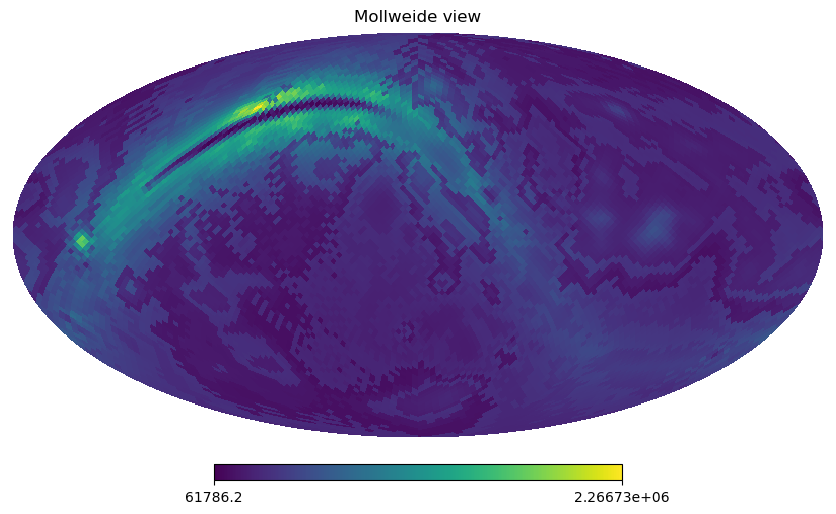

In [ ]:
hp.mollview(test[0][10])

In [ ]:
custom_parameters

array([ 2.97164022e+01, -2.41663613e+00,  3.43785429e-02,  2.82728211e+01,
       -2.57791648e+00,  1.79530633e-02,  2.82197888e+01, -2.43667726e+00,
        1.55241355e-02,  2.81765680e+01, -2.40565979e+00,  1.03524137e-02,
        2.86449167e+01, -2.62094335e+00,  6.42670873e-03,  2.96542477e+01,
       -2.60136499e+00,  2.96267966e-03,  2.93294239e+01, -2.70201255e+00,
       -9.93512942e-03,  4.76498611e+01, -2.79515101e+00, -5.00371049e-02,
        2.51685226e+00,  3.66534188e+00,  4.13535992e+00])

In [ ]:
hdf5 = h5py.File("/home/dbarker7752/21_cm_group/SVD_Analysis_Data/BWFG_Fatima_TS_100k_8region_spectral","w")
hdf5.create_dataset("curves",data=regions_8_curves)
hdf5.create_dataset("parameters",data=regions_8_params)
hdf5.close()

In [ ]:
regions_8_params[10]

array([ 2.97164022e+01, -2.49122516e+00,  3.43785429e-02,  2.82728211e+01,
       -2.48470848e+00,  1.79530633e-02,  2.82197888e+01, -2.45234273e+00,
        1.55241355e-02,  2.81765680e+01, -2.53975479e+00,  1.03524137e-02,
        2.86449167e+01, -2.52354381e+00,  6.42670873e-03,  2.96542477e+01,
       -2.49143360e+00,  2.96267966e-03,  2.93294239e+01, -2.58614517e+00,
       -9.93512942e-03,  4.76498611e+01, -2.74188217e+00, -5.00371049e-02,
        1.78105885e+00,  4.19376985e+00,  4.77789057e+00])

In [ ]:
regions_8_curves.shape

(499849, 180)

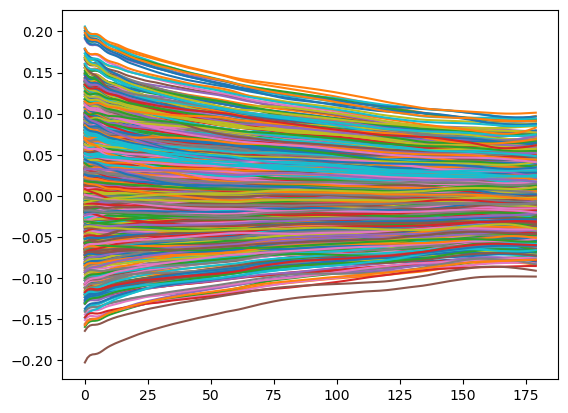

In [ ]:
for n in range(1000):
    plt.plot((regions_8_curves[n]-foreground_example_1)/foreground_example_1)

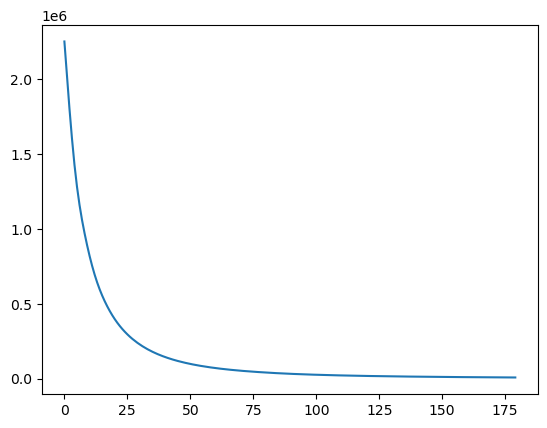

In [ ]:
plt.plot(foreground_example_1)

In [ ]:
test_case_element = beam_weighted_synchrotron_foreground_updated_no_curvature(n_regions,frequencies,spectral_index_map,sky_map, beam_sky_training_set,N_TS,\


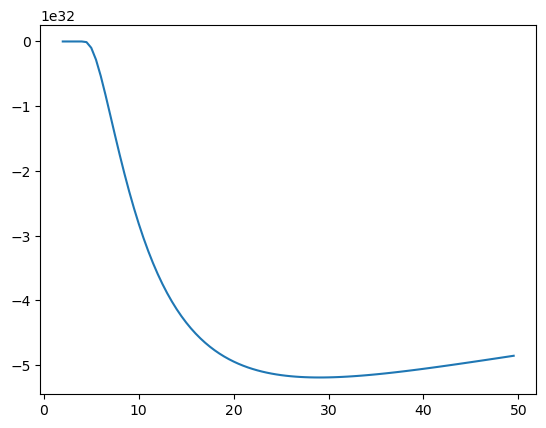

In [ ]:
plt.plot(frequency_range,test_DMAN[0][6])